In [1]:
# web scraping/nlop imports
import requests
import bs4
import os
import re
import unicodedata
import pandas as pd
import nltk
import acquire as a
import utilities as util

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import sys
sys.path.insert(1, '/Users/matthewdalton/')
from env import github_token, github_username

from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords

# Predicting the Primary Programming Language of Repositories Using README Files

### Can I predict the primary coding language of Microsoft's repositories just by using the README file?

# Acquisition 

In [2]:
# # URL of microsoft's github sorted by number of stars 
# url = ('https://github.com/microsoft?q=&type=&language=&sort=stargazers')
# response = requests.get(url)
# html = response.text
# soup = bs4.BeautifulSoup(html)

In [3]:
# # loop pulls all repos on a page
# for n in range(0,30):
#     REPOS.append(soup.select('h3')[n].text)
#     REPOS = list(set(REPOS))

In [4]:
# # while loop that pulls repo paths from page 2 to 79
# i = 2
# while i < 80:
#     url = 'https://github.com/microsoft?language=&page=' + str(i) + '&sort=stargazers&type='
#     response = requests.get(url)
#     html = response.text
#     soup = bs4.BeautifulSoup(html)
    
#     for n in range(0,30):
#         REPOS.append(soup.select('h3')[n].text)
#         REPOS = list(set(REPOS))
        
#     i += 1

In [5]:
# cleans the text from the pulled repo paths
# regexp = r'[\n]+\s+'
# subject = REPOS[0]


# re.sub(regexp, '', subject)

In [6]:
# repos = pd.Series(REPOS)

In [7]:
# repos = repos.str.replace(regexp, "", regex=True)

In [8]:
# removes Archived from repo name
# repos = repos.str.replace('Archived\n', '').str.replace('\n', '')

In [9]:
# adds microsoft/ before every repo name
# REPOS = list('microsoft/' + repos)

In [10]:
# List of repos to pull readme files from
# REPOS

## Functions that pull README files from Repos 

In [11]:
# import os
# import json
# from typing import Dict, List, Optional, Union, cast
# import requests

# import sys
# sys.path.insert(1, '/Users/matthewdalton/')

# from env import github_token, github_username


# headers = {"Authorization": f"token {github_token}", "User-Agent": github_username}

# if headers["Authorization"] == "token " or headers["User-Agent"] == "":
#     raise Exception(
#         "You need to follow the instructions marked TODO in this script before trying to use it"
#     )


# def github_api_request(url: str) -> Union[List, Dict]:
#     response = requests.get(url, headers=headers)
#     response_data = response.json()
#     if response.status_code != 200:
#         raise Exception(
#             f"Error response from github api! status code: {response.status_code}, "
#             f"response: {json.dumps(response_data)}"
#         )
#     return response_data


# def get_repo_language(repo: str) -> str:
#     url = f"https://api.github.com/repos/{repo}"
#     repo_info = github_api_request(url)
#     if type(repo_info) is dict:
#         repo_info = cast(Dict, repo_info)
#         if "language" not in repo_info:
#             raise Exception(
#                 "'language' key not round in response\n{}".format(json.dumps(repo_info))
#             )
#         return repo_info["language"]
#     raise Exception(
#         f"Expecting a dictionary response from {url}, instead got {json.dumps(repo_info)}"
#     )


# def get_repo_contents(repo: str) -> List[Dict[str, str]]:
#     url = f"https://api.github.com/repos/{repo}/contents/"
#     contents = github_api_request(url)
#     if type(contents) is list:
#         contents = cast(List, contents)
#         return contents
#     raise Exception(
#         f"Expecting a list response from {url}, instead got {json.dumps(contents)}"
#     )


# def get_readme_download_url(files: List[Dict[str, str]]) -> str:
#     """
#     Takes in a response from the github api that lists the files in a repo and
#     returns the url that can be used to download the repo's README file.
#     """
#     for file in files:
#         if file["name"].lower().startswith("readme"):
#             return file["download_url"]
#     return ""


# def process_repo(repo: str) -> Dict[str, str]:
#     """
#     Takes a repo name like "gocodeup/codeup-setup-script" and returns a
#     dictionary with the language of the repo and the readme contents.
#     """
#     contents = get_repo_contents(repo)
#     readme_download_url = get_readme_download_url(contents)
#     if readme_download_url == "":
#         readme_contents = ""
#     else:
#         readme_contents = requests.get(readme_download_url).text
#     return {
#         "repo": repo,
#         "language": get_repo_language(repo),
#         "readme_contents": readme_contents,
#     }


# def scrape_github_data() -> List[Dict[str, str]]:
#     """
#     Loop through all of the repos and process them. Returns the processed data.
#     """
#     return [process_repo(repo) for repo in REPOS]


# if __name__ == "__main__":
#     data = scrape_github_data()
#     json.dump(data, open("data2.json", "w"), indent=1)

In [12]:
# Pulling data, saves as json file
# scrape_github_data()

# Data Preparation

### Steps:
- drop nulls
- drop column 'Unnamed: 0'
- limit to top 10 languages 
- normalized, lemmatized, and removed stopwords from text
- removed words > 25 characters long

In [13]:
df = pd.read_csv('prepped_microsoft.csv')

In [14]:
df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'], inplace=True)

In [15]:
python = df[df.language == 'Python']

In [16]:
c_sharp = df[df.language == "C#"]

In [17]:
java = df[df.language == 'Java']

In [18]:
python_words = ' '.join(python.lemmed_readme)

In [19]:
c_sharp_words = ''.join(c_sharp.lemmed_readme)

In [20]:
java_words = ' '.join(java.lemmed_readme)

In [21]:
from PIL import Image

font_path = ('Users/matthewdalton/Library/Fonts/MesloLGS NF Bold Italic.ttf')

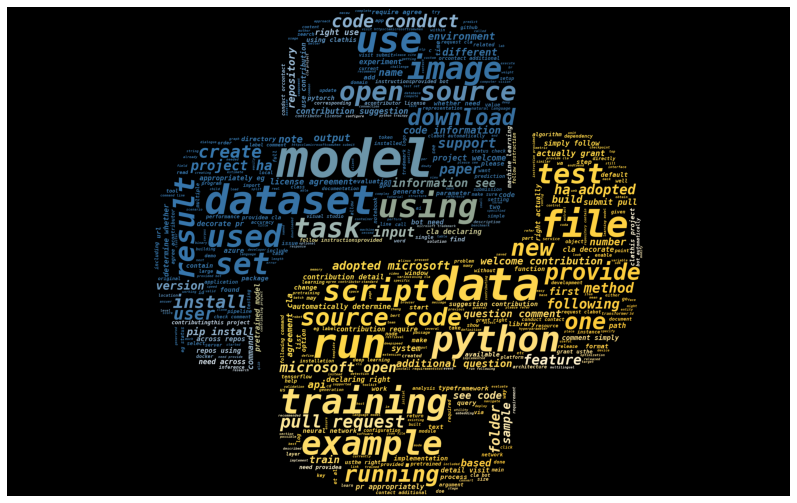

In [22]:
plt.figure(figsize=(16, 9))


mask = np.array(Image.open('python logo.jpeg'))
image_colors = ImageColorGenerator(mask)
img = WordCloud(background_color="black", font_path=font_path, mask=mask, 
                max_words=500, stopwords=STOPWORDS, max_font_size=256,
                random_state=42, width=1200, height=1200, color_func=image_colors).generate(python_words)
plt.imshow(img)

plt.axis('off')
plt.show()


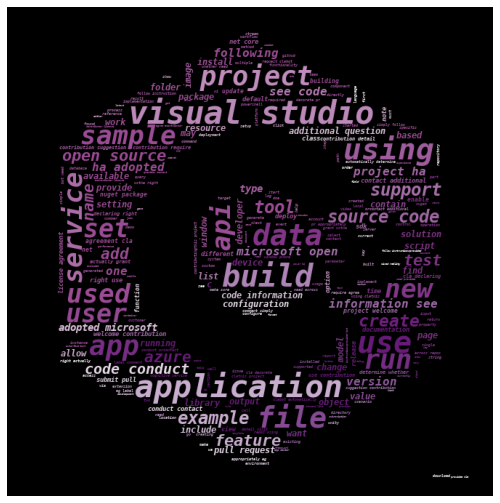

In [23]:
plt.figure(figsize=(16, 9))


mask = np.array(Image.open('C_sharp.jpeg'))
image_colors = ImageColorGenerator(mask)
img = WordCloud(background_color="black", font_path=font_path, mask=mask, 
                max_words=500, stopwords=STOPWORDS, max_font_size=128,
                random_state=42, width=1200, height=1200, color_func=image_colors).generate(c_sharp_words)
plt.imshow(img)

plt.axis('off')
plt.show()


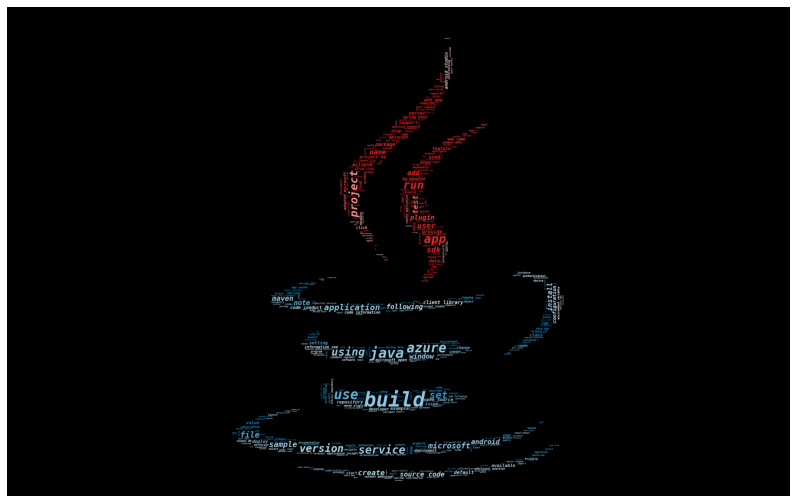

In [24]:
plt.figure(figsize=(16, 9))


mask = np.array(Image.open('Java-Emblem.jpeg'))
image_colors = ImageColorGenerator(mask)
img = WordCloud(background_color="black", font_path=font_path, mask=mask, 
                max_words=500, stopwords=STOPWORDS, max_font_size=256,
                random_state=42, width=1200, height=1200, color_func=image_colors).generate(java_words)
plt.imshow(img)

plt.axis('off')
plt.show()


In [25]:
all_words = ' '.join(df.lemmed_readme)

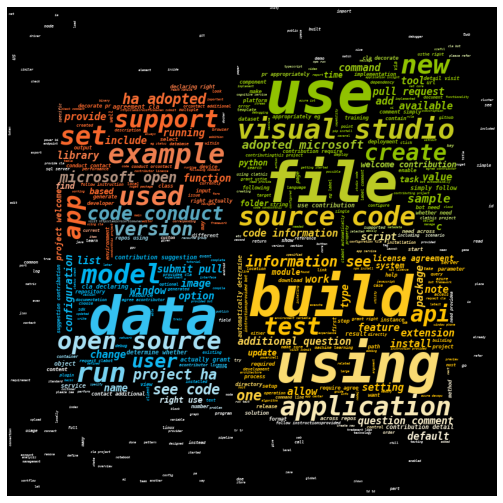

In [26]:
plt.figure(figsize=(16, 9))


mask = np.array(Image.open('LOGO.jpeg'))
image_colors = ImageColorGenerator(mask)
img = WordCloud(background_color="black", font_path=font_path, mask=mask, 
                max_words=500, stopwords=STOPWORDS, max_font_size=100,
                random_state=42, width=1200, height=1200, color_func=image_colors).generate(all_words)
plt.imshow(img)

plt.axis('off')
plt.show()


In [27]:
bigrams_python = nltk.ngrams(python_words.split(), 2)
trigrams_python = nltk.ngrams(python_words.split(), 3)

In [28]:
bigrams_python

<generator object ngrams at 0x7fcff099ef20>

In [29]:
top_10_py_bigrams = (pd.Series(bigrams_python)
                      .value_counts()
                      .head(10))

top_10_py_bigrams.head()

(open, source)       219
(source, code)       215
(code, conduct)      176
(pull, request)      168
(microsoft, open)    168
dtype: int64

In [30]:
top_10_py_trigrams = (pd.Series(trigrams_python)
                      .value_counts()
                      .head(10))

top_10_py_trigrams.head()

(open, source, code)          175
(microsoft, open, source)     167
(ha, adopted, microsoft)      157
(project, ha, adopted)        157
(adopted, microsoft, open)    157
dtype: int64

In [31]:
bigrams_c_sharp = nltk.ngrams(c_sharp_words.split(), 2)
trigrams_c_sharp = nltk.ngrams(c_sharp_words.split(), 3)

In [32]:
bigrams_c_sharp

<generator object ngrams at 0x7fd004528740>

In [33]:
top_10_c_bigrams = (pd.Series(bigrams_c_sharp)
                      .value_counts()
                      .head(10))

top_10_c_bigrams

(visual, studio)        801
(source, code)          452
(open, source)          396
(code, conduct)         338
(microsoft, open)       333
(information, see)      323
(project, ha)           322
(ha, adopted)           315
(see, code)             313
(adopted, microsoft)    312
dtype: int64

In [34]:
top_10_c_trigrams = (pd.Series(trigrams_c_sharp)
                      .value_counts()
                      .head(10))

top_10_c_trigrams

(open, source, code)           332
(microsoft, open, source)      329
(ha, adopted, microsoft)       312
(project, ha, adopted)         312
(adopted, microsoft, open)     312
(information, see, code)       308
(see, code, conduct)           302
(source, code, information)    301
(code, information, see)       300
(submit, pull, request)        190
dtype: int64

In [35]:
bigrams_java = nltk.ngrams(java_words.split(), 2)
trigrams_java = nltk.ngrams(java_words.split(), 3)

In [36]:
bigrams_java

<generator object ngrams at 0x7fcfe1411200>

In [37]:
top_10_java_bigrams = (pd.Series(bigrams_java)
                      .value_counts()
                      .head(10))

top_10_java_bigrams.head()

(source, code)       50
(client, library)    43
(code, conduct)      37
(android, studio)    35
(project, ha)        34
dtype: int64

In [38]:
top_10_java_trigrams = (pd.Series(trigrams_java)
                      .value_counts()
                      .head(10))

top_10_java_trigrams.head()

(open, source, code)           31
(microsoft, open, source)      31
(information, see, code)       28
(see, code, conduct)           28
(source, code, information)    28
dtype: int64

# Split the Data

In [39]:
train, validate, test = util.split_dataframe(df)

In [40]:
print(train.shape)
print(validate.shape)
print(test.shape)

(1008, 4)
(433, 4)
(361, 4)


In [41]:
# Setup our X variables
X_train = train.lemmed_readme
X_validate = validate.lemmed_readme
X_test = test.lemmed_readme

In [42]:
# Setup our y variables
y_train = train.language
y_validate = validate.language
y_test = test.language

In [43]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [44]:
# create the vectorized object
tfidf = TfidfVectorizer()

# fir the vectorized object onto train
tfidf.fit(X_train)

TfidfVectorizer()

In [45]:
# set up on the training data
X_train_vectorized = tfidf.transform(X_train)
X_validate_vectorized = tfidf.transform(X_validate)
X_test_vectorized = tfidf.transform(X_test)

In [46]:
X_train_vectorized.todense().shape

(1008, 45544)

In [47]:
# make the actual outcomes
train = pd.DataFrame(dict(actual=y_train))
validate = pd.DataFrame(dict(actual=y_validate))
test = pd.DataFrame(dict(actual=y_test))

# Pre-Modeling

In [52]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.tree import export_graphviz
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
    #import to be able to do decision tress
from sklearn.neighbors import KNeighborsClassifier
    #import to be able to do KNN
from sklearn.linear_model import LogisticRegression
    #import to be able to do logistic regression
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier

In [53]:
# ignore warnings
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.stats import uniform

### Logisitic Regression Parameter tuning

In [54]:
# Create a parameter dictionary for the model, {'parameter': [list of settings]}
parameters = [
    {
    'penalty': ['l2'],
    'C': [1, 2, 3, 4, 5, 10],
    },
]
# Created variable model which holds the KNN model
model = LogisticRegression()

# Create grid_search model, looking at recall
grid_search = GridSearchCV(model,
                           param_grid=parameters,
                           cv=5,
                           scoring='accuracy',
                           )

# Create variable r that hold the FIT grid_search
r = grid_search.fit(X_train_vectorized, y_train)
scores = r.cv_results_
lm = r.best_estimator_


In [55]:
# Returns max value of the mean test score 
max(scores['mean_test_score'])

0.5585045071671346

In [56]:
# loop that runs all of the possible parameter configurations from the parameter dictionary above
for mean_score, params in sorted(list(zip(scores["mean_test_score"], scores["params"])),key = lambda x: x[0]):
     print(f'Best parameters for Logisitc Regression are {params} with a score of {mean_score}')

Best parameters for Logisitc Regression are {'C': 1, 'penalty': 'l2'} with a score of 0.5029752228954238
Best parameters for Logisitc Regression are {'C': 2, 'penalty': 'l2'} with a score of 0.5287670558100587
Best parameters for Logisitc Regression are {'C': 3, 'penalty': 'l2'} with a score of 0.542648145411556
Best parameters for Logisitc Regression are {'C': 4, 'penalty': 'l2'} with a score of 0.5515639623663858
Best parameters for Logisitc Regression are {'C': 5, 'penalty': 'l2'} with a score of 0.55650953155017
Best parameters for Logisitc Regression are {'C': 10, 'penalty': 'l2'} with a score of 0.5585045071671346


#### Logisitc Regression Parameters = {'C': 10, 'penalty': 'l2'} and accuracy of 0.5585045071671346

### KNN Parameter tuning

In [57]:
# Create a parameter dictionary for the model, {'parameter': [list of settings]}
parameters = [
    {
        'n_neighbors': [5, 10, 20, 50, 100],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
        'p': [1, 2],
    },
]
# Created variable model which holds the KNN model
model = KNeighborsClassifier()

# Create grid_search model, looking at recall
grid_search = GridSearchCV(model,
                           param_grid=parameters,
                           cv=5,
                           scoring='accuracy',
                           )

# Create variable r that hold the FIT grid_search
r = grid_search.fit(X_train_vectorized, y_train)
scores = r.cv_results_
knn = r.best_estimator_


In [58]:
# Returns max value of the mean test score 
max(scores['mean_test_score'])

0.48711886113984526

In [59]:
# loop that runs all of the possible parameter configurations from the parameter dictionary above
for mean_score, params in sorted(list(zip(scores["mean_test_score"], scores["params"])),key = lambda x: x[0]):
     print(mean_score, params)

0.2797399142899364 {'algorithm': 'auto', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
0.2797399142899364 {'algorithm': 'ball_tree', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
0.2797399142899364 {'algorithm': 'kd_tree', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
0.2797399142899364 {'algorithm': 'brute', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
0.2827397665139648 {'algorithm': 'auto', 'n_neighbors': 10, 'p': 1, 'weights': 'uniform'}
0.2827397665139648 {'algorithm': 'ball_tree', 'n_neighbors': 10, 'p': 1, 'weights': 'uniform'}
0.2827397665139648 {'algorithm': 'kd_tree', 'n_neighbors': 10, 'p': 1, 'weights': 'uniform'}
0.2827397665139648 {'algorithm': 'brute', 'n_neighbors': 10, 'p': 1, 'weights': 'uniform'}
0.2837101620609822 {'algorithm': 'auto', 'n_neighbors': 10, 'p': 1, 'weights': 'distance'}
0.2837101620609822 {'algorithm': 'ball_tree', 'n_neighbors': 10, 'p': 1, 'weights': 'distance'}
0.2837101620609822 {'algorithm': 'kd_tree', 'n_neighbors': 10, 'p': 1, 'weights

#### KNN Parameters = {'algorithm': 'auto', 'n_neighbors': 20, 'p': 2, 'weights': 'distance'} and accuracy = 0.48711886113984526

### Decision Tree Parameter tuning

In [60]:
# Create a parameter dictionary for the model, {'parameter': [list of settings]}
parameters = [
    {
        'criterion': ["gini", "entropy"],
        'splitter': ['best', 'random'],
        'max_depth': [1, 3, 5, 7, 9],
        'min_samples_split': [1, 2],
    },
]
# Created variable model which holds the KNN model
model = DecisionTreeClassifier()

# Create grid_search model, looking at recall
grid_search = GridSearchCV(model,
                           param_grid=parameters,
                           cv=5,
                           scoring='accuracy',
                           )

# Create variable r that hold the FIT grid_search
r = grid_search.fit(X_train_vectorized, y_train)
scores = r.cv_results_
dt = r.best_estimator_


In [61]:
# Returns max value of the mean test score 
max(scores['mean_test_score'])

nan

In [62]:
# loop that runs all of the possible parameter configurations from the parameter dictionary above
for mean_score, params in sorted(list(zip(scores["mean_test_score"], scores["params"])),key = lambda x: x[0]):
     print(mean_score, params)

nan {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 1, 'splitter': 'best'}
nan {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 1, 'splitter': 'random'}
0.3134574651495 {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 2, 'splitter': 'random'}
0.3501403871730457 {'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 2, 'splitter': 'best'}
nan {'criterion': 'gini', 'max_depth': 3, 'min_samples_split': 1, 'splitter': 'best'}
nan {'criterion': 'gini', 'max_depth': 3, 'min_samples_split': 1, 'splitter': 'random'}
0.3183981084675632 {'criterion': 'entropy', 'max_depth': 1, 'min_samples_split': 2, 'splitter': 'random'}
0.356159795083986 {'criterion': 'gini', 'max_depth': 3, 'min_samples_split': 2, 'splitter': 'random'}
0.39980789123688487 {'criterion': 'entropy', 'max_depth': 9, 'min_samples_split': 2, 'splitter': 'random'}
0.4156002167380917 {'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 2, 'splitter': 'random'}
0.4186591793507709 {'criterion

#### Decision Tree Parameters = {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 2, 'splitter': 'best'} and accuracy = 0.4682183143687503

### Ridge Classifier Parameter tuning

In [63]:
# Create a parameter dictionary for the model, {'parameter': [list of settings]}
parameters = [
    {
    'alpha': [1.0, 1.5, 2.0, 5.0],
    'fit_intercept':[True,False],
    'normalize': [True, False],
    'copy_X':[True, False],
    'class_weight':[None, 'balanced'],    
    },
]
# Created variable model which holds the KNN model
model = RidgeClassifier()

# Create grid_search model, looking at recall
grid_search = GridSearchCV(model,
                           param_grid=parameters,
                           cv=5,
                           scoring='accuracy',
                           )

# Create variable r that hold the FIT grid_search
r = grid_search.fit(X_train_vectorized, y_train)
scores = r.cv_results_
rc = r.best_estimator_


In [64]:
# Returns max value of the mean test score 
max(scores['mean_test_score'])

0.5793261415693809

In [65]:
# loop that runs all of the possible parameter configurations from the parameter dictionary above
for mean_score, params in sorted(list(zip(scores["mean_test_score"], scores["params"])),key = lambda x: x[0]):
     print(mean_score, params)

0.44340180286685377 {'alpha': 1.5, 'class_weight': 'balanced', 'copy_X': True, 'fit_intercept': True, 'normalize': True}
0.44340180286685377 {'alpha': 1.5, 'class_weight': 'balanced', 'copy_X': False, 'fit_intercept': True, 'normalize': True}
0.44537707502093493 {'alpha': 1.0, 'class_weight': 'balanced', 'copy_X': True, 'fit_intercept': True, 'normalize': True}
0.44537707502093493 {'alpha': 1.0, 'class_weight': 'balanced', 'copy_X': False, 'fit_intercept': True, 'normalize': True}
0.4493571745234225 {'alpha': 2.0, 'class_weight': 'balanced', 'copy_X': True, 'fit_intercept': True, 'normalize': True}
0.4493571745234225 {'alpha': 2.0, 'class_weight': 'balanced', 'copy_X': False, 'fit_intercept': True, 'normalize': True}
0.4533027929658637 {'alpha': 5.0, 'class_weight': 'balanced', 'copy_X': True, 'fit_intercept': True, 'normalize': False}
0.4533027929658637 {'alpha': 5.0, 'class_weight': 'balanced', 'copy_X': False, 'fit_intercept': True, 'normalize': False}
0.46321856066203637 {'alpha': 

#### Ridge Classifier Parameters = {'alpha': 1.0, 'class_weight': None, 'copy_X': False, 'fit_intercept': False, 'normalize': False} and accuracy = 0.5827309770573124

### SGDClassifier Parameter tuning

In [66]:
# Create a parameter dictionary for the model, {'parameter': [list of settings]}
parameters = [
    {
        'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
        'penalty': ['l2'],
        'alpha': [0.0001, 0.001, 0.01],
        'fit_intercept': [True, False],
        'max_iter': [10],
        'shuffle': [True, False],
        'verbose': [0, 1, 3, 5, 10],
    },
]
# Created variable model which holds the KNN model
model = SGDClassifier()

# Create grid_search model, looking at recall
grid_search = GridSearchCV(model,
                           param_grid=parameters,
                           cv=5,
                           scoring='accuracy',
                           )

# Create variable r that hold the FIT grid_search
r = grid_search.fit(X_train_vectorized, y_train)
scores = r.cv_results_
sgd = r.best_estimator_

-- Epoch 1
Norm: 44.33, NNZs: 7564, Bias: -1.218349, T: 806, Avg. loss: 0.105362
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.98, NNZs: 7987, Bias: -1.206426, T: 1612, Avg. loss: 0.004243
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 27.81, NNZs: 8310, Bias: -1.137191, T: 2418, Avg. loss: 0.003201
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 24.71, NNZs: 8852, Bias: -1.112639, T: 3224, Avg. loss: 0.003140
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.09, NNZs: 9288, Bias: -1.111200, T: 4030, Avg. loss: 0.000958
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 20.63, NNZs: 9509, Bias: -1.073684, T: 4836, Avg. loss: 0.002312
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.93, NNZs: 9722, Bias: -1.073077, T: 5642, Avg. loss: 0.000680
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 18.42, NNZs: 10178, Bias: -1.045779, T: 6448, Avg. loss: 0.001984
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.63, NNZs: 10498, Bias: -1.034041, T: 7254, A

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 62.28, NNZs: 20217, Bias: -1.447201, T: 2418, Avg. loss: 0.075328
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 54.79, NNZs: 20880, Bias: -1.401269, T: 3224, Avg. loss: 0.060340
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 49.58, NNZs: 21618, Bias: -1.282776, T: 4030, Avg. loss: 0.056397
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 45.42, NNZs: 22177, Bias: -1.286973, T: 4836, Avg. loss: 0.042749
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 42.64, NNZs: 22724, Bias: -1.255230, T: 5642, Avg. loss: 0.043907
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 41.13, NNZs: 23686, Bias: -1.241046, T: 6448, Avg. loss: 0.037328
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 39.55, NNZs: 23937, Bias: -1.178688, T: 7254, Avg. loss: 0.035698
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 38.31, NNZs: 24506, Bias: -1.190474, T: 8060, Avg. loss: 0.035134
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 65.95, NNZs: 11950, Bias: -1.474362, T: 806, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 28.82, NNZs: 15823, Bias: -1.196002, T: 8070, Avg. loss: 0.016404
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 44.51, NNZs: 7438, Bias: -1.459078, T: 807, Avg. loss: 0.172966
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 36.24, NNZs: 7764, Bias: -1.495009, T: 1614, Avg. loss: 0.021180
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.09, NNZs: 8111, Bias: -1.497798, T: 2421, Avg. loss: 0.016821
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.86, NNZs: 8784, Bias: -1.568912, T: 3228, Avg. loss: 0.007370
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 24.18, NNZs: 8784, Bias: -1.523262, T: 4035, Avg. loss: 0.006421
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 21.89, NNZs: 9247, Bias: -1.520076, T: 4842, Avg. loss: 0.006210
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 21.99, NNZs: 9398, Bias: -1.488600, T: 5649, Avg. loss: 0.008007
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 21.20, NNZs: 9570, Bias: -1.476545, T: 6456, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 47.88, NNZs: 5450, Bias: -1.205028, T: 806, Avg. loss: 0.168305
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 38.30, NNZs: 5749, Bias: -1.508372, T: 1612, Avg. loss: 0.040690
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.51, NNZs: 5950, Bias: -1.509942, T: 2418, Avg. loss: 0.025278
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 30.02, NNZs: 6244, Bias: -1.508921, T: 3224, Avg. loss: 0.020267
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.81, NNZs: 6328, Bias: -1.423928, T: 4030, Avg. loss: 0.015673
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 24.77, NNZs: 6454, Bias: -1.425730, T: 4836, Avg. loss: 0.012210
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 23.21, NNZs: 6729, Bias: -1.440714, T: 5642, Avg. loss: 0.012292
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 22.01, NNZs: 7384, Bias: -1.397838, T: 6448, Avg. loss: 0.010102
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 21.10, NNZs: 7768, Bias: -1.411157, T: 7254, Avg

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


Total training time: 0.01 seconds.
-- Epoch 1
Norm: 77.32, NNZs: 14842, Bias: -1.090201, T: 807, Avg. loss: 0.457449
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 62.79, NNZs: 17310, Bias: -1.282849, T: 1614, Avg. loss: 0.062795
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 52.22, NNZs: 17717, Bias: -1.224516, T: 2421, Avg. loss: 0.034243
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 46.33, NNZs: 18714, Bias: -1.248547, T: 3228, Avg. loss: 0.017928
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 41.80, NNZs: 19092, Bias: -1.223883, T: 4035, Avg. loss: 0.018468
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 37.69, NNZs: 19388, Bias: -1.150396, T: 4842, Avg. loss: 0.011052
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 35.26, NNZs: 19803, Bias: -1.119683, T: 5649, Avg. loss: 0.010545
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 33.52, NNZs: 20369, Bias: -1.091501, T: 6456, Avg. loss: 0.009576
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 32.13

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.

-- Epoch 1
Norm: 42.43, NNZs: 6948, Bias: -1.047501, T: 806, Avg. loss: 0.112315
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.97, NNZs: 8528, Bias: -1.296550, T: 1612, Avg. loss: 0.010867
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 27.61, NNZs: 8716, Bias: -1.231051, T: 2418, Avg. loss: 0.005949
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 25.14, NNZs: 9070, Bias: -1.178928, T: 3224, Avg. loss: 0.005164
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.70, NNZs: 9267, Bias: -1.180399, T: 4030, Avg. loss: 0.002433
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 20.94, NNZs: 9451, Bias: -1.180615, T: 4836, Avg. loss: 0.002285
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 19.90, NNZs: 9604, Bias: -1.179802, T: 5642, Avg. loss: 0.001764
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 18.61, NNZs: 9726, Bias: -1.167778, T: 6448, Avg. loss: 0.001219
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.76, NNZs: 10023, Bias: -1.169600, T: 7254, Av

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 55.00, NNZs: 22037, Bias: -0.939219, T: 3228, Avg. loss: 0.050025
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 49.86, NNZs: 22778, Bias: -1.060225, T: 4035, Avg. loss: 0.038474
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 46.71, NNZs: 23480, Bias: -1.023994, T: 4842, Avg. loss: 0.040567
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 44.49, NNZs: 24329, Bias: -0.961186, T: 5649, Avg. loss: 0.032222
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 42.23, NNZs: 24758, Bias: -0.992249, T: 6456, Avg. loss: 0.027873
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 40.55, NNZs: 25000, Bias: -0.954144, T: 7263, Avg. loss: 0.019793
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 38.80, NNZs: 25223, Bias: -0.920440, T: 8070, Avg. loss: 0.019919
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 67.59, NNZs: 12820, Bias: -1.163622, T: 807, Avg. loss: 0.311928
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 51.93, NNZs: 13526, Bias: -1.365243, T: 1614, Avg.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 71.36, NNZs: 17999, Bias: -1.166863, T: 1612, Avg. loss: 0.169296
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 60.24, NNZs: 18852, Bias: -1.124707, T: 2418, Avg. loss: 0.101504
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 54.20, NNZs: 20337, Bias: -1.072801, T: 3224, Avg. loss: 0.065234
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 49.92, NNZs: 21130, Bias: -1.035160, T: 4030, Avg. loss: 0.058278
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 47.32, NNZs: 21518, Bias: -0.929808, T: 4836, Avg. loss: 0.048578
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 43.59, NNZs: 21786, Bias: -0.933086, T: 5642, Avg. loss: 0.042028
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 41.35, NNZs: 22188, Bias: -0.976374, T: 6448, Avg. loss: 0.033879
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 40.06, NNZs: 22441, Bias: -0.951495, T: 7254, Avg. loss: 0.038920
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 38.68, NNZs: 23066, Bias: -0.917861, T: 8060, Avg

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 55.07, NNZs: 20661, Bias: -1.044092, T: 3228, Avg. loss: 0.062321
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 50.81, NNZs: 21381, Bias: -0.976549, T: 4035, Avg. loss: 0.062170
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 47.56, NNZs: 21883, Bias: -0.921700, T: 4842, Avg. loss: 0.047410
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 44.41, NNZs: 22320, Bias: -0.954464, T: 5649, Avg. loss: 0.040972
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 42.29, NNZs: 22668, Bias: -0.912108, T: 6456, Avg. loss: 0.037468
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 40.57, NNZs: 22917, Bias: -0.912899, T: 7263, Avg. loss: 0.031991
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 39.44, NNZs: 23347, Bias: -0.901589, T: 8070, Avg. loss: 0.032382
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 67.27, NNZs: 12602, Bias: -1.502863, T: 807, Avg. loss: 0.344434
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 51.35, NNZs: 13215, Bias: -1.611420, T: 1614, Avg.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurr

-- Epoch 1
Norm: 42.75, NNZs: 6641, Bias: -1.181153, T: 806, Avg. loss: 0.108864
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.53, NNZs: 7074, Bias: -1.172674, T: 1612, Avg. loss: 0.004918
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 27.21, NNZs: 7569, Bias: -1.134246, T: 2418, Avg. loss: 0.002181
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 23.25, NNZs: 7945, Bias: -1.130448, T: 3224, Avg. loss: 0.001265
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.33, NNZs: 8461, Bias: -1.062316, T: 4030, Avg. loss: 0.003295
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 20.47, NNZs: 8876, Bias: -1.079028, T: 4836, Avg. loss: 0.001131
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 19.72, NNZs: 9328, Bias: -1.060504, T: 5642, Avg. loss: 0.001153
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 18.03, NNZs: 9388, Bias: -1.059500, T: 6448, Avg. loss: 0.000760
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 88.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 2
Norm: 30.92, NNZs: 4679, Bias: -1.283301, T: 1614, Avg. loss: 0.017713
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 26.99, NNZs: 5170, Bias: -1.344466, T: 2421, Avg. loss: 0.014607
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 23.19, NNZs: 5170, Bias: -1.263268, T: 3228, Avg. loss: 0.012465
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 20.39, NNZs: 5278, Bias: -1.281899, T: 4035, Avg. loss: 0.008885
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.26, NNZs: 5552, Bias: -1.260397, T: 4842, Avg. loss: 0.012601
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 18.75, NNZs: 5960, Bias: -1.274809, T: 5649, Avg. loss: 0.012257
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.96, NNZs: 6012, Bias: -1.275407, T: 6456, Avg. loss: 0.008657
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.72, NNZs: 6012, Bias: -1.249936, T: 7263, Avg. loss: 0.008101
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 15.19, NNZs: 6217, Bias: -1.226456, T: 8070, A

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 30.53, NNZs: 15959, Bias: -1.222774, T: 7254, Avg. loss: 0.012059
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 29.42, NNZs: 16416, Bias: -1.210054, T: 8060, Avg. loss: 0.012211
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 42.50, NNZs: 5731, Bias: -1.297869, T: 806, Avg. loss: 0.128762
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 35.60, NNZs: 7583, Bias: -1.509570, T: 1612, Avg. loss: 0.023250
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 30.87, NNZs: 8127, Bias: -1.470822, T: 2418, Avg. loss: 0.013633
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.18, NNZs: 8361, Bias: -1.416527, T: 3224, Avg. loss: 0.004697
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 24.66, NNZs: 8634, Bias: -1.394973, T: 4030, Avg. loss: 0.005963
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 22.41, NNZs: 8919, Bias: -1.397232, T: 4836, Avg. loss: 0.004451
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 21.40, NNZs: 9197, Bias: -1.396842, T: 5642, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 23.28, NNZs: 7552, Bias: -1.256934, T: 5649, Avg. loss: 0.015390
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 21.34, NNZs: 7577, Bias: -1.243405, T: 6456, Avg. loss: 0.012886
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 20.40, NNZs: 8249, Bias: -1.243217, T: 7263, Avg. loss: 0.012036
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 19.88, NNZs: 8332, Bias: -1.220478, T: 8070, Avg. loss: 0.013389
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 67.14, NNZs: 13424, Bias: -0.916645, T: 807, Avg. loss: 0.257976
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 53.95, NNZs: 15176, Bias: -1.019584, T: 1614, Avg. loss: 0.047213
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 45.01, NNZs: 15787, Bias: -0.939988, T: 2421, Avg. loss: 0.020080
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 39.35, NNZs: 16610, Bias: -0.968976, T: 3228, Avg. loss: 0.010931
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 35.86, NNZs: 17486, Bias: -0.891365, T: 4035, Avg. los

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.

-- Epoch 4
Norm: 46.20, NNZs: 16723, Bias: -1.012907, T: 3224, Avg. loss: 0.019704
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 41.54, NNZs: 17071, Bias: -1.001946, T: 4030, Avg. loss: 0.018165
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 38.74, NNZs: 17419, Bias: -0.989856, T: 4836, Avg. loss: 0.015054
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.45, NNZs: 18345, Bias: -1.022238, T: 5642, Avg. loss: 0.012817
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.87, NNZs: 18533, Bias: -0.939012, T: 6448, Avg. loss: 0.014762
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 33.23, NNZs: 19097, Bias: -0.942005, T: 7254, Avg. loss: 0.011363
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 32.49, NNZs: 19657, Bias: -0.967525, T: 8060, Avg. loss: 0.013816
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 44.64, NNZs: 7270, Bias: -1.125540, T: 806, Avg. loss: 0.109555
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.78, NNZs: 7612, Bias: -1.122988, T: 1

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.

Norm: 46.60, NNZs: 20916, Bias: -0.876094, T: 4842, Avg. loss: 0.044810
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 43.82, NNZs: 21404, Bias: -0.875595, T: 5649, Avg. loss: 0.044734
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 41.83, NNZs: 21651, Bias: -0.834117, T: 6456, Avg. loss: 0.040125
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 40.43, NNZs: 22162, Bias: -0.796669, T: 7263, Avg. loss: 0.037918
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 38.69, NNZs: 22552, Bias: -0.821243, T: 8070, Avg. loss: 0.032912
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 66.40, NNZs: 13067, Bias: -1.599998, T: 807, Avg. loss: 0.334599
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 52.38, NNZs: 13839, Bias: -1.709514, T: 1614, Avg. loss: 0.046365
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 44.70, NNZs: 14728, Bias: -1.556698, T: 2421, Avg. loss: 0.031475
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 38.49, NNZs: 14951, Bias: -1.474980, T: 3228, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 27.74, NNZs: 15448, Bias: -1.190783, T: 7254, Avg. loss: 0.013402
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 26.68, NNZs: 15899, Bias: -1.200918, T: 8060, Avg. loss: 0.012409
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 34.06, NNZs: 3368, Bias: -0.999332, T: 806, Avg. loss: 0.114363
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 29.08, NNZs: 3762, Bias: -1.162143, T: 1612, Avg. loss: 0.027009
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 26.52, NNZs: 4091, Bias: -1.205961, T: 2418, Avg. loss: 0.011747
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 24.42, NNZs: 4459, Bias: -1.204010, T: 3224, Avg. loss: 0.012352
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 21.88, NNZs: 4510, Bias: -1.221181, T: 4030, Avg. loss: 0.007033
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 20.07, NNZs: 4611, Bias: -1.199452, T: 4836, Avg. loss: 0.009267
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 19.25, NNZs: 4814, Bias: -1.199337, T: 5642, Avg. loss: 

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 41.71, NNZs: 11704, Bias: -1.237010, T: 3228, Avg. loss: 0.044094
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 38.42, NNZs: 12192, Bias: -1.232687, T: 4035, Avg. loss: 0.024479
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 35.45, NNZs: 12533, Bias: -1.228518, T: 4842, Avg. loss: 0.018573
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 32.98, NNZs: 12989, Bias: -1.225776, T: 5649, Avg. loss: 0.015489
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.02, NNZs: 13352, Bias: -1.251766, T: 6456, Avg. loss: 0.016455
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 31.12, NNZs: 14023, Bias: -1.172806, T: 7263, Avg. loss: 0.014500
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 30.20, NNZs: 14254, Bias: -1.172371, T: 8070, Avg. loss: 0.010556
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 44.97, NNZs: 7165, Bias: -1.395911, T: 807, Avg. loss: 0.133191
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 37.11, NNZs: 8000, Bias: -1.405886, T: 1614, Avg. l

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 32.15, NNZs: 39147, Bias: -1.383807, T: 806, Avg. loss: 0.136711
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 29.31, NNZs: 39147, Bias: -1.656991, T: 1612, Avg. loss: 0.031759
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 27.80, NNZs: 39147, Bias: -1.846944, T: 2418, Avg. loss: 0.029247
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.18, NNZs: 39147, Bias: -1.935005, T: 3224, Avg. loss: 0.030832
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.67, NNZs: 39147, Bias: -2.039775, T: 4030, Avg. loss: 0.029699
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 26.40, NNZs: 39147, Bias: -2.093462, T: 4836, Avg. loss: 0.030534
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 26.19, NNZs: 39147, Bias: -2.143035, T: 5642, Avg. loss: 0.030170
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 25.96, NNZs: 39147, Bias: -2.200504, T: 6448, Avg. loss: 0.029618
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
N

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 37.98, NNZs: 39187, Bias: -1.441361, T: 4035, Avg. loss: 0.068425
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 37.60, NNZs: 39187, Bias: -1.446575, T: 4842, Avg. loss: 0.068826
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 37.28, NNZs: 39187, Bias: -1.474270, T: 5649, Avg. loss: 0.068839
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.99, NNZs: 39187, Bias: -1.529168, T: 6456, Avg. loss: 0.068075
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 51.25, NNZs: 39187, Bias: -1.031193, T: 807, Avg. loss: 0.367728
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 45.96, NNZs: 39187, Bias: -1.358272, T: 1614, Avg. loss: 0.096453
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 43.86, NNZs: 39187, Bias: -1.439142, T: 2421, Avg. loss: 0.089460
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 42.50, NNZs: 39187, Bias: -1.513747, T: 3228, Avg. loss: 0.087655
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 41.67,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 38.13, NNZs: 39147, Bias: -1.321510, T: 3224, Avg. loss: 0.066409
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.44, NNZs: 39147, Bias: -1.416432, T: 4030, Avg. loss: 0.065923
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 36.98, NNZs: 39147, Bias: -1.449407, T: 4836, Avg. loss: 0.066210
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.67, NNZs: 39147, Bias: -1.484993, T: 5642, Avg. loss: 0.066054
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.44, NNZs: 39147, Bias: -1.506285, T: 6448, Avg. loss: 0.065969
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 51.53, NNZs: 39147, Bias: -1.032029, T: 806, Avg. loss: 0.353705
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 45.76, NNZs: 39147, Bias: -1.285506, T: 1612, Avg. loss: 0.099111
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 43.52, NNZs: 39147, Bias: -1.356176, T: 2418, Avg. loss: 0.090232
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 42.28,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 41.27, NNZs: 38337, Bias: -1.399103, T: 1612, Avg. loss: 0.073326
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 39.62, NNZs: 38337, Bias: -1.421785, T: 2418, Avg. loss: 0.069529
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 38.57, NNZs: 38337, Bias: -1.468580, T: 3224, Avg. loss: 0.066869
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.84, NNZs: 38337, Bias: -1.525738, T: 4030, Avg. loss: 0.066379
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 37.39, NNZs: 38337, Bias: -1.584506, T: 4836, Avg. loss: 0.066224
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 37.02, NNZs: 38337, Bias: -1.636796, T: 5642, Avg. loss: 0.065998
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.71, NNZs: 38337, Bias: -1.676697, T: 6448, Avg. loss: 0.065872
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 36.57, NNZs: 38337, Bias: -1.688145, T: 7254, Avg. loss: 0.066402
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 52.52

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 36.99, NNZs: 38253, Bias: -1.442109, T: 4842, Avg. loss: 0.064899
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.61, NNZs: 38253, Bias: -1.498539, T: 5649, Avg. loss: 0.065438
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 52.01, NNZs: 38253, Bias: -1.035163, T: 807, Avg. loss: 0.365686
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 46.30, NNZs: 38253, Bias: -1.169005, T: 1614, Avg. loss: 0.104417
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 43.78, NNZs: 38253, Bias: -1.313466, T: 2421, Avg. loss: 0.091335
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 42.54, NNZs: 38253, Bias: -1.367093, T: 3228, Avg. loss: 0.090336
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 41.84, NNZs: 38253, Bias: -1.417582, T: 4035, Avg. loss: 0.090902
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 41.27, NNZs: 38253, Bias: -1.460258, T: 4842, Avg. loss: 0.089997
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 40.74,

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 28.15, NNZs: 37080, Bias: -2.516726, T: 7254, Avg. loss: 0.045842
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 28.03, NNZs: 37080, Bias: -2.538416, T: 8060, Avg. loss: 0.045446
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 45.15, NNZs: 37080, Bias: -1.153452, T: 806, Avg. loss: 0.281490
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 41.18, NNZs: 37080, Bias: -1.298416, T: 1612, Avg. loss: 0.077445
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 39.31, NNZs: 37080, Bias: -1.386711, T: 2418, Avg. loss: 0.069781
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 38.27, NNZs: 37080, Bias: -1.448877, T: 3224, Avg. loss: 0.069424
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.69, NNZs: 37080, Bias: -1.504180, T: 4030, Avg. loss: 0.069259
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 37.26, NNZs: 37080, Bias: -1.535133, T: 4836, Avg. loss: 0.069139
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.85, NNZs: 37080, Bias: -1.600815, T: 5642, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 26.85, NNZs: 39187, Bias: -2.419264, T: 4035, Avg. loss: 0.035392
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 26.36, NNZs: 39187, Bias: -2.528718, T: 4842, Avg. loss: 0.034611
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 26.04, NNZs: 39187, Bias: -2.595508, T: 5649, Avg. loss: 0.034124
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 25.87, NNZs: 39187, Bias: -2.650069, T: 6456, Avg. loss: 0.034176
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 25.69, NNZs: 39187, Bias: -2.708937, T: 7263, Avg. loss: 0.033620
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 34.77, NNZs: 39187, Bias: -1.497556, T: 807, Avg. loss: 0.172106
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 31.66, NNZs: 39187, Bias: -1.786899, T: 1614, Avg. loss: 0.050065
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 30.37, NNZs: 39187, Bias: -2.000543, T: 2421, Avg. loss: 0.046881
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 29.55,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 2
Norm: 29.33, NNZs: 39147, Bias: -1.943692, T: 1612, Avg. loss: 0.043506
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 28.07, NNZs: 39147, Bias: -2.088500, T: 2418, Avg. loss: 0.042312
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.26, NNZs: 39147, Bias: -2.246310, T: 3224, Avg. loss: 0.039891
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.84, NNZs: 39147, Bias: -2.342984, T: 4030, Avg. loss: 0.038543
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 26.51, NNZs: 39147, Bias: -2.426945, T: 4836, Avg. loss: 0.037054
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 26.11, NNZs: 39147, Bias: -2.519080, T: 5642, Avg. loss: 0.035754
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 25.92, NNZs: 39147, Bias: -2.563192, T: 6448, Avg. loss: 0.036479
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 25.66, NNZs: 39147, Bias: -2.626092, T: 7254, Avg. loss: 0.035679
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 25.60, NNZs: 39147, Bias: -2.654981, T

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 38.98, NNZs: 38337, Bias: -1.591493, T: 2418, Avg. loss: 0.093105
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.85, NNZs: 38337, Bias: -1.707767, T: 3224, Avg. loss: 0.085643
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.17, NNZs: 38337, Bias: -1.768768, T: 4030, Avg. loss: 0.083962
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 36.63, NNZs: 38337, Bias: -1.848035, T: 4836, Avg. loss: 0.082514
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.41, NNZs: 38337, Bias: -1.872569, T: 5642, Avg. loss: 0.083158
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.16, NNZs: 38337, Bias: -1.895175, T: 6448, Avg. loss: 0.081613
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 35.90, NNZs: 38337, Bias: -1.944974, T: 7254, Avg. loss: 0.080920
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 35.74, NNZs: 38337, Bias: -1.969464, T: 8060, Avg. loss: 0.080959
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 32.54, NNZs: 38337, Bias: -1.594079, T: 806, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 24.52, NNZs: 38253, Bias: -2.383570, T: 4035, Avg. loss: 0.035669
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 24.22, NNZs: 38253, Bias: -2.465073, T: 4842, Avg. loss: 0.035077
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 23.99, NNZs: 38253, Bias: -2.547541, T: 5649, Avg. loss: 0.034136
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 23.79, NNZs: 38253, Bias: -2.600515, T: 6456, Avg. loss: 0.033885
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 23.59, NNZs: 38253, Bias: -2.663330, T: 7263, Avg. loss: 0.033292
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 23.45, NNZs: 38253, Bias: -2.711633, T: 8070, Avg. loss: 0.033147
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 43.13, NNZs: 38253, Bias: -1.255091, T: 807, Avg. loss: 0.344110
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.14, NNZs: 38253, Bias: -1.523754, T: 1614, Avg. loss: 0.110389
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 38.4

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 32.31, NNZs: 39147, Bias: -1.358002, T: 806, Avg. loss: 0.137563
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 29.31, NNZs: 39147, Bias: -1.669425, T: 1612, Avg. loss: 0.031005
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 28.04, NNZs: 39147, Bias: -1.821968, T: 2418, Avg. loss: 0.030316
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.30, NNZs: 39147, Bias: -1.931316, T: 3224, Avg. loss: 0.030203
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.81, NNZs: 39147, Bias: -2.016438, T: 4030, Avg. loss: 0.030038
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 26.46, NNZs: 39147, Bias: -2.085642, T: 4836, Avg. loss: 0.029888
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 26.20, NNZs: 39147, Bias: -2.143542, T: 5642, Avg. loss: 0.029758
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 58.72, NNZs: 39147, Bias: -1.130444, T: 806, Avg. loss: 0.507300
Total training time: 0.00 seconds.
-- Epoch 2
No

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 26.19, NNZs: 38253, Bias: -2.373481, T: 6456, Avg. loss: 0.031180
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 59.09, NNZs: 38253, Bias: -0.943836, T: 807, Avg. loss: 0.526015
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 52.98, NNZs: 38253, Bias: -1.019729, T: 1614, Avg. loss: 0.175959
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 50.02, NNZs: 38253, Bias: -1.081411, T: 2421, Avg. loss: 0.146787
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 48.40, NNZs: 38253, Bias: -1.125774, T: 3228, Avg. loss: 0.140695
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 47.39, NNZs: 38253, Bias: -1.161658, T: 4035, Avg. loss: 0.138050
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 46.70, NNZs: 38253, Bias: -1.191696, T: 4842, Avg. loss: 0.136486
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 46.21, NNZs: 38253, Bias: -1.217363, T: 5649, Avg. loss: 0.135419
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 45.83,

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 47.05, NNZs: 37080, Bias: -1.345497, T: 4836, Avg. loss: 0.128268
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 46.54, NNZs: 37080, Bias: -1.372508, T: 5642, Avg. loss: 0.127785
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 46.15, NNZs: 37080, Bias: -1.396013, T: 6448, Avg. loss: 0.127398
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 45.85, NNZs: 37080, Bias: -1.416690, T: 7254, Avg. loss: 0.127076
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 45.60, NNZs: 37080, Bias: -1.435046, T: 8060, Avg. loss: 0.126802
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 45.79, NNZs: 37080, Bias: -1.213625, T: 806, Avg. loss: 0.299329
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.85, NNZs: 37080, Bias: -1.535063, T: 1612, Avg. loss: 0.080697
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 38.80, NNZs: 37080, Bias: -1.664568, T: 2418, Avg. loss: 0.074066
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.7

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 45.92, NNZs: 39187, Bias: -1.370212, T: 7263, Avg. loss: 0.124703
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 45.68, NNZs: 39187, Bias: -1.389770, T: 8070, Avg. loss: 0.124452
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 46.27, NNZs: 39187, Bias: -1.212846, T: 807, Avg. loss: 0.290691
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 41.12, NNZs: 39187, Bias: -1.542186, T: 1614, Avg. loss: 0.067793
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 39.00, NNZs: 39187, Bias: -1.667385, T: 2421, Avg. loss: 0.066330
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.86, NNZs: 39187, Bias: -1.748713, T: 3228, Avg. loss: 0.065995
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.15, NNZs: 39187, Bias: -1.809766, T: 4035, Avg. loss: 0.065800
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 36.67, NNZs: 39187, Bias: -1.858716, T: 4842, Avg. loss: 0.065623
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.3

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 45.00, NNZs: 39147, Bias: -1.649247, T: 8060, Avg. loss: 0.126525
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 45.55, NNZs: 39147, Bias: -1.315760, T: 806, Avg. loss: 0.305997
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.72, NNZs: 39147, Bias: -1.639539, T: 1612, Avg. loss: 0.076027
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 38.66, NNZs: 39147, Bias: -1.780306, T: 2418, Avg. loss: 0.072913
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.56, NNZs: 39147, Bias: -1.870522, T: 3224, Avg. loss: 0.072647
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 36.87, NNZs: 39147, Bias: -1.936542, T: 4030, Avg. loss: 0.072228
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 36.40, NNZs: 39147, Bias: -1.988458, T: 4836, Avg. loss: 0.071825
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.06, NNZs: 39147, Bias: -2.031188, T: 5642, Avg. loss: 0.071469
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 35.80, NNZs: 39147, Bias: -2.067441, T: 6448, Avg. 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with

Norm: 45.40, NNZs: 38337, Bias: -1.335934, T: 7254, Avg. loss: 0.132508
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 45.16, NNZs: 38337, Bias: -1.354931, T: 8060, Avg. loss: 0.131992
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 45.84, NNZs: 38337, Bias: -1.377479, T: 806, Avg. loss: 0.295847
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.85, NNZs: 38337, Bias: -1.680555, T: 1612, Avg. loss: 0.082692
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 38.71, NNZs: 38337, Bias: -1.812060, T: 2418, Avg. loss: 0.076441
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.56, NNZs: 38337, Bias: -1.901640, T: 3224, Avg. loss: 0.074888
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 36.85, NNZs: 38337, Bias: -1.969473, T: 4030, Avg. loss: 0.074176
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 36.37, NNZs: 38337, Bias: -2.023967, T: 4836, Avg. loss: 0.073655
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.03, NNZs: 38337, Bias: -2.069404, T: 5642, Avg.

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 35.74, NNZs: 38253, Bias: -2.136451, T: 6456, Avg. loss: 0.071739
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 35.54, NNZs: 38253, Bias: -2.169105, T: 7263, Avg. loss: 0.071433
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 35.38, NNZs: 38253, Bias: -2.198076, T: 8070, Avg. loss: 0.071180
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 26.44, NNZs: 38253, Bias: -1.585608, T: 807, Avg. loss: 0.126039
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 26.02, NNZs: 38253, Bias: -1.901546, T: 1614, Avg. loss: 0.048237
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 25.19, NNZs: 38253, Bias: -2.101013, T: 2421, Avg. loss: 0.037226
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 24.53, NNZs: 38253, Bias: -2.237316, T: 3228, Avg. loss: 0.034772
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 24.03, NNZs: 38253, Bias: -2.341768, T: 4035, Avg. loss: 0.033480
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 23.6

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 37.71, NNZs: 37080, Bias: -1.748732, T: 3224, Avg. loss: 0.073077
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.02, NNZs: 37080, Bias: -1.811139, T: 4030, Avg. loss: 0.072579
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 36.56, NNZs: 37080, Bias: -1.860694, T: 4836, Avg. loss: 0.072192
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.22, NNZs: 37080, Bias: -1.901738, T: 5642, Avg. loss: 0.071857
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 35.96, NNZs: 37080, Bias: -1.936690, T: 6448, Avg. loss: 0.071562
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 25.96, NNZs: 37080, Bias: -1.475840, T: 806, Avg. loss: 0.137171
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 26.37, NNZs: 37080, Bias: -1.842052, T: 1612, Avg. loss: 0.051625
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 25.83, NNZs: 37080, Bias: -2.064434, T: 2418, Avg. loss: 0.040000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 25.28,

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 39.00, NNZs: 39187, Bias: -1.667385, T: 2421, Avg. loss: 0.066330
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.86, NNZs: 39187, Bias: -1.748713, T: 3228, Avg. loss: 0.065995
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 37.15, NNZs: 39187, Bias: -1.809766, T: 4035, Avg. loss: 0.065800
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 36.67, NNZs: 39187, Bias: -1.858716, T: 4842, Avg. loss: 0.065623
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.31, NNZs: 39187, Bias: -1.899476, T: 5649, Avg. loss: 0.065467
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.04, NNZs: 39187, Bias: -1.934263, T: 6456, Avg. loss: 0.065332
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 25.79, NNZs: 39187, Bias: -1.497908, T: 807, Avg. loss: 0.126315
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 25.65, NNZs: 39187, Bias: -1.874704, T: 1614, Avg. loss: 0.046441
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 25.04,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 135.01, NNZs: 9008, Bias: -1.178944, T: 806, Avg. loss: 0.497839
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 96.15, NNZs: 9372, Bias: -1.367939, T: 1612, Avg. loss: 0.016838
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 73.47, NNZs: 9372, Bias: -1.367939, T: 2418, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 59.45, NNZs: 9372, Bias: -1.367939, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 49.94, NNZs: 9423, Bias: -1.363399, T: 4030, Avg. loss: 0.000015
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 43.08, NNZs: 9423, Bias: -1.356701, T: 4836, Avg. loss: 0.000041
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 37.91, NNZs: 9423, Bias: -1.346345, T: 5642, Avg. loss: 0.000067
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 33.86, NNZs: 9423, Bias: -1.338228, T: 6448, Avg. loss: 0.000059
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 26

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 36.37, NNZs: 5065, Bias: -1.846503, T: 5649, Avg. loss: 0.019387
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.67, NNZs: 5065, Bias: -1.850538, T: 6456, Avg. loss: 0.020526
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 29.73, NNZs: 5099, Bias: -1.851517, T: 7263, Avg. loss: 0.018111
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 27.30, NNZs: 5099, Bias: -1.843604, T: 8070, Avg. loss: 0.016005
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 122.87, NNZs: 4973, Bias: -1.830316, T: 807, Avg. loss: 0.670175
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 90.33, NNZs: 5409, Bias: -2.552386, T: 1614, Avg. loss: 0.150047
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 69.19, NNZs: 5410, Bias: -2.711901, T: 2421, Avg. loss: 0.149849
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 57.16, NNZs: 5430, Bias: -2.629167, T: 3228, Avg. loss: 0.060211
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 48.11, NNZs: 5430, Bias: -2.728779, T: 4035, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 27.67, NNZs: 5893, Bias: -1.969347, T: 8060, Avg. loss: 0.017244
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 203.36, NNZs: 11344, Bias: -1.793131, T: 806, Avg. loss: 2.993811
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 154.14, NNZs: 12130, Bias: -2.190991, T: 1612, Avg. loss: 0.541645
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 121.10, NNZs: 12266, Bias: -2.288667, T: 2418, Avg. loss: 0.147904
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 99.46, NNZs: 12300, Bias: -2.202453, T: 3224, Avg. loss: 0.069258
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 84.97, NNZs: 12351, Bias: -2.209604, T: 4030, Avg. loss: 0.064834
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 73.45, NNZs: 12369, Bias: -2.183888, T: 4836, Avg. loss: 0.035200
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 64.83, NNZs: 12541, Bias: -2.131433, T: 5642, Avg. loss: 0.037228
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 58.42, NNZs: 12542, Bias: -2.072253, T: 6448, Avg

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 39.04, NNZs: 8160, Bias: -2.095205, T: 5649, Avg. loss: 0.029790
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.88, NNZs: 8465, Bias: -2.086964, T: 6456, Avg. loss: 0.028910
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 31.92, NNZs: 8465, Bias: -2.023276, T: 7263, Avg. loss: 0.012202
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 28.79, NNZs: 8646, Bias: -2.073357, T: 8070, Avg. loss: 0.010168
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 138.93, NNZs: 5923, Bias: -2.017832, T: 807, Avg. loss: 0.869570
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 107.17, NNZs: 6771, Bias: -2.464000, T: 1614, Avg. loss: 0.294883
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 82.48, NNZs: 6818, Bias: -2.248053, T: 2421, Avg. loss: 0.116374
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 68.58, NNZs: 7018, Bias: -2.338313, T: 3228, Avg. loss: 0.073320
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 57.63, NNZs: 7018, Bias: -2.338954, T: 4035, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

-- Epoch 1
Norm: 119.02, NNZs: 8021, Bias: -1.023904, T: 807, Avg. loss: 0.493320
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 84.17, NNZs: 8766, Bias: -1.642395, T: 1614, Avg. loss: 0.045528
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 65.48, NNZs: 8954, Bias: -1.539198, T: 2421, Avg. loss: 0.007305
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 52.97, NNZs: 8981, Bias: -1.543385, T: 3228, Avg. loss: 0.000009
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 44.57, NNZs: 9047, Bias: -1.529405, T: 4035, Avg. loss: 0.000141
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 38.60, NNZs: 9047, Bias: -1.500504, T: 4842, Avg. loss: 0.000303
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 34.11, NNZs: 9047, Bias: -1.475195, T: 5649, Avg. loss: 0.000240
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 30.46, NNZs: 9280, Bias: -1.469383, T: 6456, Avg. loss: 0.000050
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 27.58, NNZs: 9280, Bias: -1.458491, T: 7263, Av

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.

Norm: 33.20, NNZs: 9363, Bias: -1.315556, T: 6448, Avg. loss: 0.000085
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 267.37, NNZs: 15245, Bias: -2.368547, T: 806, Avg. loss: 4.455395
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 208.49, NNZs: 18582, Bias: -2.121338, T: 1612, Avg. loss: 1.068692
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 166.83, NNZs: 19348, Bias: -2.175817, T: 2418, Avg. loss: 0.343530
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 138.22, NNZs: 20102, Bias: -2.051974, T: 3224, Avg. loss: 0.321810
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 117.67, NNZs: 20469, Bias: -2.027605, T: 4030, Avg. loss: 0.205738
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 102.50, NNZs: 20643, Bias: -2.156925, T: 4836, Avg. loss: 0.123146
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 91.17, NNZs: 20808, Bias: -2.019373, T: 5642, Avg. loss: 0.101456
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 31.48, NNZs: 9986, Bias: -1.321442, T: 7254, Avg. loss: 0.000138
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 28.71, NNZs: 9986, Bias: -1.317794, T: 8060, Avg. loss: 0.000019
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 262.39, NNZs: 14808, Bias: -1.379188, T: 806, Avg. loss: 4.390643
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 208.05, NNZs: 17574, Bias: -1.584242, T: 1612, Avg. loss: 1.583304
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 165.24, NNZs: 18491, Bias: -1.910215, T: 2418, Avg. loss: 0.416258
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 135.75, NNZs: 18884, Bias: -1.817590, T: 3224, Avg. loss: 0.252223
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 115.54, NNZs: 19154, Bias: -1.942844, T: 4030, Avg. loss: 0.186838
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 100.96, NNZs: 19521, Bias: -1.923327, T: 4836, Avg. loss: 0.093597
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 73.90, NNZs: 19844, Bias: -1.397849, T: 7263, Avg. loss: 0.072559
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 67.81, NNZs: 20006, Bias: -1.341658, T: 8070, Avg. loss: 0.042927
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 198.64, NNZs: 12127, Bias: -1.943461, T: 807, Avg. loss: 1.959848
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 149.34, NNZs: 13898, Bias: -2.153349, T: 1614, Avg. loss: 0.393570
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 117.28, NNZs: 14197, Bias: -2.231284, T: 2421, Avg. loss: 0.061253
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 96.98, NNZs: 14393, Bias: -2.256023, T: 3228, Avg. loss: 0.167740
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 82.94, NNZs: 14477, Bias: -2.270464, T: 4035, Avg. loss: 0.082475
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 72.56, NNZs: 14807, Bias: -2.263428, T: 4842, Avg. loss: 0.062700
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 64.74, NNZs: 14814, Bias: -2.223446, T: 5649, A

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 129.37, NNZs: 9519, Bias: -1.101317, T: 806, Avg. loss: 0.502375
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 92.24, NNZs: 10607, Bias: -1.080178, T: 1612, Avg. loss: 0.013877
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 70.88, NNZs: 10852, Bias: -1.188713, T: 2418, Avg. loss: 0.002949
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 57.35, NNZs: 10852, Bias: -1.188713, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 48.22, NNZs: 10902, Bias: -1.176086, T: 4030, Avg. loss: 0.000103
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 41.56, NNZs: 10902, Bias: -1.176086, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.55, NNZs: 10902, Bias: -1.170112, T: 5642, Avg. loss: 0.000042
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.63, NNZs: 11136, Bias: -1.163663, T: 6448, Avg. loss: 0.000035
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 29.50, NNZs: 11136, Bias: -1.154727, T: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 74.62, NNZs: 19245, Bias: -1.412657, T: 7263, Avg. loss: 0.072458
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 68.33, NNZs: 19331, Bias: -1.375052, T: 8070, Avg. loss: 0.075672
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 204.22, NNZs: 12895, Bias: -2.052280, T: 807, Avg. loss: 1.912048
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 153.28, NNZs: 14464, Bias: -2.647209, T: 1614, Avg. loss: 0.421692
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 119.91, NNZs: 14748, Bias: -2.508494, T: 2421, Avg. loss: 0.229308
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 97.65, NNZs: 14783, Bias: -2.504014, T: 3228, Avg. loss: 0.126909
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 82.55, NNZs: 14859, Bias: -2.461393, T: 4035, Avg. loss: 0.097962
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 71.78, NNZs: 14898, Bias: -2.431403, T: 4842, Avg. loss: 0.077268
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 63.70, NNZs: 14898, Bias: -2.391102, T: 5649, A

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 103.54, NNZs: 3771, Bias: -0.904606, T: 806, Avg. loss: 0.680932
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 84.24, NNZs: 5078, Bias: -2.075418, T: 1612, Avg. loss: 0.163609
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 68.06, NNZs: 5126, Bias: -1.823897, T: 2418, Avg. loss: 0.100263
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 55.45, NNZs: 5156, Bias: -1.911751, T: 3224, Avg. loss: 0.038652
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 47.54, NNZs: 5208, Bias: -1.976510, T: 4030, Avg. loss: 0.024099
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 41.10, NNZs: 5247, Bias: -1.957880, T: 4836, Avg. loss: 0.040613
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.24, NNZs: 5247, Bias: -1.916308, T: 5642, Avg. loss: 0.034983
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.36, NNZs: 5255, Bias: -1.908123, T: 6448, Avg. loss: 0.029127
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 29.28, NNZs: 5255, Bias: -1.889858, T: 7254, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


-- Epoch 6
Norm: 38.84, NNZs: 4992, Bias: -1.884428, T: 4842, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 34.19, NNZs: 4992, Bias: -1.875779, T: 5649, Avg. loss: 0.000084
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 30.53, NNZs: 4992, Bias: -1.870817, T: 6456, Avg. loss: 0.000042
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 197.72, NNZs: 10330, Bias: -1.719168, T: 807, Avg. loss: 3.075925
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 153.51, NNZs: 11171, Bias: -2.449915, T: 1614, Avg. loss: 0.630527
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 122.51, NNZs: 11414, Bias: -2.528799, T: 2421, Avg. loss: 0.201587
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 100.87, NNZs: 11467, Bias: -2.415233, T: 3228, Avg. loss: 0.090321
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 86.27, NNZs: 11486, Bias: -2.384472, T: 4035, Avg. loss: 0.043652
Total training time: 0.00 seconds.
-- Epoch 6


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.

Norm: 55.30, NNZs: 9339, Bias: -2.349030, T: 4030, Avg. loss: 0.045513
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 47.74, NNZs: 9339, Bias: -2.325532, T: 4836, Avg. loss: 0.037919
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 41.99, NNZs: 9339, Bias: -2.307900, T: 5642, Avg. loss: 0.034084
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 37.43, NNZs: 9339, Bias: -2.300316, T: 6448, Avg. loss: 0.028337
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 33.87, NNZs: 9339, Bias: -2.285554, T: 7254, Avg. loss: 0.025984
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 30.95, NNZs: 9339, Bias: -2.269988, T: 8060, Avg. loss: 0.024096
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 135.74, NNZs: 4716, Bias: -1.728364, T: 806, Avg. loss: 1.354015
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 106.02, NNZs: 5652, Bias: -1.994690, T: 1612, Avg. loss: 0.306242
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 84.57, NNZs: 5887, Bias: -2.133189, T: 2418, Avg. loss: 

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.

Norm: 143.01, NNZs: 15603, Bias: -1.614637, T: 1612, Avg. loss: 0.327013
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 112.03, NNZs: 16082, Bias: -1.787174, T: 2418, Avg. loss: 0.098413
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 91.28, NNZs: 16355, Bias: -1.793301, T: 3224, Avg. loss: 0.032292
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 76.87, NNZs: 16604, Bias: -1.777431, T: 4030, Avg. loss: 0.001275
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 66.43, NNZs: 16827, Bias: -1.736837, T: 4836, Avg. loss: 0.000280
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 58.49, NNZs: 16968, Bias: -1.711444, T: 5642, Avg. loss: 0.000216
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 52.35, NNZs: 17302, Bias: -1.677628, T: 6448, Avg. loss: 0.000331
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 47.44, NNZs: 17519, Bias: -1.642566, T: 7254, Avg. loss: 0.000293
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 43.43, NNZs: 17584, Bias: -1.612071, T: 8060, A

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 129.37, NNZs: 9519, Bias: -1.101317, T: 806, Avg. loss: 0.502375
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 92.24, NNZs: 10607, Bias: -1.080178, T: 1612, Avg. loss: 0.013877
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 70.88, NNZs: 10852, Bias: -1.188713, T: 2418, Avg. loss: 0.002949
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 57.35, NNZs: 10852, Bias: -1.188713, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 48.22, NNZs: 10902, Bias: -1.176086, T: 4030, Avg. loss: 0.000103
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 41.56, NNZs: 10902, Bias: -1.176086, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.55, NNZs: 10902, Bias: -1.170112, T: 5642, Avg. loss: 0.000042
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.63, NNZs: 11136, Bias: -1.163663, T: 6448, Avg. loss: 0.000035
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 29.50, NNZs: 11136, Bias: -1.154727, T: 7254, Avg. 

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 156.91, NNZs: 15042, Bias: -2.803888, T: 1612, Avg. loss: 0.439141
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 121.43, NNZs: 15635, Bias: -2.837244, T: 2418, Avg. loss: 0.158414
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 98.45, NNZs: 15635, Bias: -2.821964, T: 3224, Avg. loss: 0.095329
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 83.02, NNZs: 15649, Bias: -2.738743, T: 4030, Avg. loss: 0.076439
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 71.86, NNZs: 15683, Bias: -2.712231, T: 4836, Avg. loss: 0.061203
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 63.49, NNZs: 15789, Bias: -2.690874, T: 5642, Avg. loss: 0.051443
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 57.01, NNZs: 15799, Bias: -2.638928, T: 6448, Avg. loss: 0.044741
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 51.82, NNZs: 15885, Bias: -2.623829, T: 7254, Avg. loss: 0.035880
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 47.65, NNZs: 15975, Bias: -2.590538, T: 8060, A

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 210.38, NNZs: 11180, Bias: -2.128817, T: 807, Avg. loss: 2.838456
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 156.97, NNZs: 11939, Bias: -1.876047, T: 1614, Avg. loss: 0.769596
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 123.87, NNZs: 12008, Bias: -1.884040, T: 2421, Avg. loss: 0.214862
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 101.64, NNZs: 12048, Bias: -2.019595, T: 3228, Avg. loss: 0.143659
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 86.10, NNZs: 12083, Bias: -1.994990, T: 4035, Avg. loss: 0.100348
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 75.59, NNZs: 12083, Bias: -1.926708, T: 4842, Avg. loss: 0.067114
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 66.69, NNZs: 12109, Bias: -1.934054, T: 5649, Avg. loss: 0.057877
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 60.27, NNZs: 12113, Bias: -1.883002, T: 6456, Avg. loss: 0.046899
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 54.99, NNZs: 12171, Bias: -1.859103, T: 7263, A

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 296217007.46, NNZs: 8532, Bias: -1432943.096509, T: 3228, Avg. loss: 6890342781277.641602
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 446631521.34, NNZs: 9754, Bias: -6051789.531767, T: 4035, Avg. loss: 20908410485383.601562
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 391191811.09, NNZs: 9774, Bias: -5170317.486811, T: 4842, Avg. loss: 895111644799.180176
Total training time: 0.00 seconds.
Convergence after 6 epochs took 0.00 seconds
-- Epoch 1
Norm: 10426.64, NNZs: 5422, Bias: -70.546813, T: 807, Avg. loss: 1276.075951
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17741.69, NNZs: 5880, Bias: -117.660253, T: 1614, Avg. loss: 7295.018250
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14003.05, NNZs: 6464, Bias: -129.878646, T: 2421, Avg. loss: 623.067129
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11341.41, NNZs: 6575, Bias: -154.986767, T: 3228, Avg. loss: 68.804137
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9545.84, NNZs: 6831, Bias: -

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5876640599.20, NNZs: 17562, Bias: -63383573.599921, T: 3224, Avg. loss: 1603113388466958.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 6953777479.44, NNZs: 17959, Bias: -40078338.624922, T: 4030, Avg. loss: 3629089258328773.500000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 28796509357.33, NNZs: 18847, Bias: -169287595.762190, T: 4836, Avg. loss: 186059940061948960.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 102666.39, NNZs: 6711, Bias: -833.235344, T: 806, Avg. loss: 128603.963268
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 16453374.94, NNZs: 9121, Bias: -215342.623574, T: 1612, Avg. loss: 7608633494.106791
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 101072569.66, NNZs: 10132, Bias: -867965.370666, T: 2418, Avg. loss: 512699383256.994873
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 163290026.01, NNZs: 11185, Bias: -1166376.760438, T: 3224, Avg. loss: 1758185353294.432373
Total

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 16408632427839.97, NNZs: 24146, Bias: -118269387907.409119, T: 5649, Avg. loss: 6480323520905253748736.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14675781528198.65, NNZs: 24146, Bias: -126327516986.668121, T: 6456, Avg. loss: 886708772076591120384.000000
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13261520424399.21, NNZs: 24161, Bias: -111890388233.246750, T: 7263, Avg. loss: 575968896348589391872.000000
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12093742381288.96, NNZs: 24161, Bias: -115623309547.372406, T: 8070, Avg. loss: 737924723832967790592.000000
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 176896.23, NNZs: 12562, Bias: -939.904019, T: 807, Avg. loss: 380110.665194
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12413756.83, NNZs: 17112, Bias: -99277.190678, T: 1614, Avg. loss: 4343182484.399240
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 75701090.32, NNZs: 19125, Bias: -539326.753450, T: 2421, Avg. loss: 294073418977.91

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 17653.84, NNZs: 10098, Bias: -215.317811, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15743.68, NNZs: 10269, Bias: -214.927052, T: 6448, Avg. loss: 0.258789
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14206.95, NNZs: 10269, Bias: -214.369012, T: 7254, Avg. loss: 0.622826
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12943.55, NNZs: 10269, Bias: -213.976690, T: 8060, Avg. loss: 0.212006
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 35744068208222.59, NNZs: 15526, Bias: -214270177428.857971, T: 806, Avg. loss: 61122773430004892041216.000000
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40343811196068.30, NNZs: 20092, Bias: -198795813728.009735, T: 1612, Avg. loss: 178877609819553059045376.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33241113664149.58, NNZs: 21119, Bias: -312116581201.220520, T: 2418, Avg. loss: 40053616281528230215680.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 272332855799

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

-- Epoch 1
Norm: 746.41, NNZs: 9043, Bias: -5.774344, T: 806, Avg. loss: 6.608144
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 827.04, NNZs: 10489, Bias: -4.722135, T: 1612, Avg. loss: 10.944001
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 632.95, NNZs: 10489, Bias: -4.297970, T: 2418, Avg. loss: 0.045632
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 512.15, NNZs: 10489, Bias: -4.297970, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 430.08, NNZs: 10498, Bias: -4.283410, T: 4030, Avg. loss: 0.000127
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 370.70, NNZs: 10498, Bias: -4.262466, T: 4836, Avg. loss: 0.000238
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 325.76, NNZs: 10498, Bias: -4.227836, T: 5642, Avg. loss: 0.000778
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 290.51, NNZs: 10498, Bias: -4.227456, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 262.20, NNZs: 10498, Bias: -4.18

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 995.56, NNZs: 8511, Bias: -7.409391, T: 807, Avg. loss: 11.469334
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7059.53, NNZs: 10489, Bias: -12.662309, T: 1614, Avg. loss: 1334.882481
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23296.77, NNZs: 11456, Bias: -165.041899, T: 2421, Avg. loss: 25467.165015
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 39412.97, NNZs: 12810, Bias: -79.340532, T: 3228, Avg. loss: 111036.262040
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 82320.84, NNZs: 14484, Bias: -191.059238, T: 4035, Avg. loss: 808656.635201
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 72621.73, NNZs: 14641, Bias: -346.670710, T: 4842, Avg. loss: 53457.803469
Total training time: 0.00 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 29608991530849.02, NNZs: 19143, Bias: -136734686846.822464

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 1
Norm: 1516.08, NNZs: 8550, Bias: -12.588782, T: 806, Avg. loss: 27.373801
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1359.16, NNZs: 9673, Bias: -10.617294, T: 1612, Avg. loss: 19.806587
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1041.03, NNZs: 9735, Bias: -10.994432, T: 2418, Avg. loss: 0.251435
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 842.39, NNZs: 9742, Bias: -10.957874, T: 3224, Avg. loss: 0.000639
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 707.38, NNZs: 9742, Bias: -10.957874, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 609.76, NNZs: 9742, Bias: -10.908326, T: 4836, Avg. loss: 0.002335
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 535.82, NNZs: 9742, Bias: -10.878629, T: 5642, Avg. loss: 0.001002
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 477.90, NNZs: 9742, Bias: -10.843704, T: 6448, Avg. loss: 0.001766
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 431.38, NNZs: 9742, Bias: -

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19146.04, NNZs: 8534, Bias: -75.080115, T: 807, Avg. loss: 4360.597256
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 68986.29, NNZs: 11327, Bias: -297.375453, T: 1614, Avg. loss: 120609.817868
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 437402.54, NNZs: 13897, Bias: -94.716860, T: 2421, Avg. loss: 9597897.690880
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2155730.36, NNZs: 14681, Bias: -1615.017320, T: 3228, Avg. loss: 394188631.618556
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4258574.22, NNZs: 15388, Bias: -9807.306905, T: 4035, Avg. loss: 2066184074.789541
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3724107.01, NNZs: 15779, Bias: -13086.417233, T: 4842, Avg. loss: 87257130.756225
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 6400626133632.16, NNZs: 16000, Bias: 9415391491.088600, T: 807, Avg. loss: 931878900890596802560.000000
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3426686005

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13983657787.82, NNZs: 25397, Bias: -44496369.676802, T: 4030, Avg. loss: 19325195978680432.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 24008315460.10, NNZs: 26361, Bias: -127640245.641889, T: 4836, Avg. loss: 100193242734737936.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 47571.88, NNZs: 7744, Bias: -326.027944, T: 806, Avg. loss: 27288.918589
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 188876.53, NNZs: 8798, Bias: -1700.083725, T: 1612, Avg. loss: 913260.169675
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 465861.50, NNZs: 10941, Bias: -1151.458243, T: 2418, Avg. loss: 9781876.283219
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2261231.73, NNZs: 12681, Bias: -4150.803957, T: 3224, Avg. loss: 423940223.288471
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4774782.80, NNZs: 13584, Bias: -10904.087538, T: 4030, Avg. loss: 2625000808.760973
Total training time: 0.00 seconds.
-- Epoch 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remain

-- Epoch 1
Norm: 33497771.93, NNZs: 16027, Bias: -119392.593426, T: 807, Avg. loss: 13557117845.600508
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1524048052.40, NNZs: 19341, Bias: -5055867.654426, T: 1614, Avg. loss: 64773468998767.101562
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6670432117.77, NNZs: 21138, Bias: -41475337.304325, T: 2421, Avg. loss: 2253753550013901.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7502543320.37, NNZs: 22559, Bias: -52561561.700635, T: 3228, Avg. loss: 2380806030122293.500000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 6630345764.65, NNZs: 23290, Bias: -68003697.960466, T: 4035, Avg. loss: 606352805003861.875000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 5825229882.31, NNZs: 23389, Bias: -75878678.245888, T: 4842, Avg. loss: 322928049696161.500000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 15359.56, NNZs: 8423, Bias: -104.268497, T: 807, Avg. loss: 2812.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

-- Epoch 4
Norm: 2750916.01, NNZs: 18362, Bias: -6645.864640, T: 3224, Avg. loss: 104754036.975806
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3045803.33, NNZs: 19118, Bias: -8424.609124, T: 4030, Avg. loss: 589288542.069942
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3711263.69, NNZs: 19715, Bias: -7953.851583, T: 4836, Avg. loss: 1639846389.233980
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 13185681160.79, NNZs: 14292, Bias: -33011470.649320, T: 806, Avg. loss: 2104145737277517.500000
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1458669684208.54, NNZs: 18285, Bias: -9022973160.016369, T: 1612, Avg. loss: 59032477057371283456.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2870936835013.68, NNZs: 20378, Bias: -12324072900.445755, T: 2418, Avg. loss: 354807408991062982656.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4220820471891.14, NNZs: 22198, Bias: -20789989053.454750, T: 3224, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 2975395.04, NNZs: 18377, Bias: -13659.857190, T: 2421, Avg. loss: 432352074.182985
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7476225.59, NNZs: 20668, Bias: -24069.454470, T: 3228, Avg. loss: 4541451717.673156
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 24728291.63, NNZs: 21869, Bias: -83006.527473, T: 4035, Avg. loss: 83953779715.827499
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 60094730.30, NNZs: 22640, Bias: -56921.161038, T: 4842, Avg. loss: 734677959717.132568
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 143949080.44, NNZs: 17149, Bias: -505497.909242, T: 807, Avg. loss: 251837551781.987030
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5272619767.18, NNZs: 19876, Bias: -26549422.091771, T: 1614, Avg. loss: 767788127520572.750000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 36912188375.08, NNZs: 21384, Bias: -191603138.951589, T: 2421, Avg. loss: 70815766269823576.000000
Total training 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elap

Norm: 132079.88, NNZs: 11729, Bias: -564.166211, T: 806, Avg. loss: 211321.743597
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1757300.90, NNZs: 14797, Bias: -7066.188858, T: 1612, Avg. loss: 84622883.042807
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3272921.32, NNZs: 18537, Bias: -7899.640385, T: 2418, Avg. loss: 462569619.414472
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11215207.07, NNZs: 19432, Bias: -15861.937620, T: 3224, Avg. loss: 10526528783.298311
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 32939187.12, NNZs: 20427, Bias: -106873.489653, T: 4030, Avg. loss: 143484929775.497620
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 89069697.58, NNZs: 21638, Bias: -213504.098575, T: 4836, Avg. loss: 1612117457777.364258
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 71326986.32, NNZs: 14939, Bias: -123817.122059, T: 806, Avg. loss: 61564361658.978889
Total training time: 0.00 seconds.
-- Epoch 2
Nor

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 35.58, NNZs: 6092, Bias: -0.198938, T: 806, Avg. loss: 0.033412
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 26.21, NNZs: 6577, Bias: -0.253731, T: 1612, Avg. loss: 0.004208
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.50, NNZs: 6672, Bias: -0.191551, T: 2418, Avg. loss: 0.000115
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.72, NNZs: 6843, Bias: -0.217284, T: 3224, Avg. loss: 0.000105
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.04, NNZs: 6843, Bias: -0.217284, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.10, NNZs: 6843, Bias: -0.217284, T: 4836, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 10.63, NNZs: 6843, Bias: -0.217284, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.48, NNZs: 6843, Bias: -0.217284, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 69.9

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 12.48, NNZs: 6094, Bias: -0.614287, T: 6456, Avg. loss: 0.005484
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.51, NNZs: 6094, Bias: -0.588801, T: 7263, Avg. loss: 0.003142
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 10.50, NNZs: 6094, Bias: -0.577574, T: 8070, Avg. loss: 0.001202
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 55.16, NNZs: 11039, Bias: -0.325625, T: 807, Avg. loss: 0.108779
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 41.77, NNZs: 12219, Bias: -0.279311, T: 1614, Avg. loss: 0.019331
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.75, NNZs: 12613, Bias: -0.212789, T: 2421, Avg. loss: 0.002179
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 26.86, NNZs: 12695, Bias: -0.213472, T: 3228, Avg. loss: 0.002422
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.78, NNZs: 12743, Bias: -0.235158, T: 4035, Avg. loss: 0.001790
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.71, NNZs: 12743, Bias: -0.196357, T: 4842, Avg. lo

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 20.30, NNZs: 7173, Bias: -0.303331, T: 2418, Avg. loss: 0.000227
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.63, NNZs: 7186, Bias: -0.277370, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.97, NNZs: 7186, Bias: -0.277370, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.19, NNZs: 7226, Bias: -0.258591, T: 4836, Avg. loss: 0.000005
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.71, NNZs: 7226, Bias: -0.258591, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.55, NNZs: 7226, Bias: -0.258591, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 69.79, NNZs: 12015, Bias: -0.462576, T: 806, Avg. loss: 0.278990
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 57.32, NNZs: 14639, Bias: -0.351613, T: 1612, Avg. loss: 0.104299
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 46.05, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 17.55, NNZs: 2767, Bias: -0.432065, T: 2421, Avg. loss: 0.004579
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.62, NNZs: 3201, Bias: -0.484990, T: 3228, Avg. loss: 0.005144
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.66, NNZs: 3206, Bias: -0.487485, T: 4035, Avg. loss: 0.002423
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 11.25, NNZs: 3206, Bias: -0.469874, T: 4842, Avg. loss: 0.001091
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 9.89, NNZs: 3206, Bias: -0.469815, T: 5649, Avg. loss: 0.002035
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.26, NNZs: 3208, Bias: -0.456890, T: 6456, Avg. loss: 0.001173
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.35, NNZs: 3208, Bias: -0.456700, T: 7263, Avg. loss: 0.001533
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.64, NNZs: 3260, Bias: -0.468444, T: 8070, Avg. loss: 0.001348
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 31.71, NNZs: 3900, Bias: -0.424769, T: 807, Avg. loss: 0.0469

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 18.48, NNZs: 6823, Bias: -0.710218, T: 3224, Avg. loss: 0.001862
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.67, NNZs: 6827, Bias: -0.711151, T: 4030, Avg. loss: 0.001155
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.79, NNZs: 6842, Bias: -0.693885, T: 4836, Avg. loss: 0.001280
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 12.13, NNZs: 6842, Bias: -0.709300, T: 5642, Avg. loss: 0.000045
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.07, NNZs: 6842, Bias: -0.679549, T: 6448, Avg. loss: 0.000688
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 37.04, NNZs: 4217, Bias: -0.442536, T: 806, Avg. loss: 0.066274
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.65, NNZs: 4796, Bias: -0.503356, T: 1612, Avg. loss: 0.026764
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.36, NNZs: 5125, Bias: -0.576392, T: 2418, Avg. loss: 0.011975
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 19.14, NNZs: 5

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.

Norm: 14.70, NNZs: 9290, Bias: -0.551090, T: 7263, Avg. loss: 0.002728
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.63, NNZs: 9299, Bias: -0.550734, T: 8070, Avg. loss: 0.000655
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 34.77, NNZs: 5836, Bias: -0.683038, T: 807, Avg. loss: 0.064249
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.29, NNZs: 6699, Bias: -0.774182, T: 1614, Avg. loss: 0.010845
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.11, NNZs: 6869, Bias: -0.740711, T: 2421, Avg. loss: 0.002483
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.89, NNZs: 6869, Bias: -0.743354, T: 3228, Avg. loss: 0.003504
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.23, NNZs: 6915, Bias: -0.723700, T: 4035, Avg. loss: 0.002871
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.11, NNZs: 6915, Bias: -0.742679, T: 4842, Avg. loss: 0.000512
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 11.52, NNZs: 6915, Bias: -0.742005, T: 5649, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 28.54, NNZs: 4857, Bias: -0.518498, T: 1612, Avg. loss: 0.027367
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.83, NNZs: 4950, Bias: -0.551641, T: 2418, Avg. loss: 0.007434
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 18.51, NNZs: 5041, Bias: -0.551722, T: 3224, Avg. loss: 0.006138
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.79, NNZs: 5041, Bias: -0.530436, T: 4030, Avg. loss: 0.007449
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.71, NNZs: 5062, Bias: -0.530233, T: 4836, Avg. loss: 0.008332
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.50, NNZs: 5084, Bias: -0.547313, T: 5642, Avg. loss: 0.003683
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.24, NNZs: 5123, Bias: -0.546358, T: 6448, Avg. loss: 0.004299
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 10.45, NNZs: 5143, Bias: -0.545969, T: 7254, Avg. loss: 0.006165
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.89, NNZs: 5167, Bias: -0.533865, T: 8060, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 50.24, NNZs: 9655, Bias: -0.512399, T: 806, Avg. loss: 0.117307
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.34, NNZs: 12153, Bias: -0.581045, T: 1612, Avg. loss: 0.025834
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.52, NNZs: 12736, Bias: -0.569541, T: 2418, Avg. loss: 0.007159
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 26.69, NNZs: 12804, Bias: -0.511299, T: 3224, Avg. loss: 0.002037
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 23.15, NNZs: 13153, Bias: -0.449528, T: 4030, Avg. loss: 0.002583
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 20.02, NNZs: 13325, Bias: -0.486837, T: 4836, Avg. loss: 0.000135
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.68, NNZs: 13325, Bias: -0.469851, T: 5642, Avg. loss: 0.000123
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.86, NNZs: 13415, Bias: -0.469531, T: 6448, Avg. loss: 0.000383
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.40, NNZs: 13415, Bias: -0.469208, T: 7254, Avg. l

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 26.54, NNZs: 11844, Bias: -0.409347, T: 3228, Avg. loss: 0.000861
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.45, NNZs: 11958, Bias: -0.386517, T: 4035, Avg. loss: 0.000598
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.45, NNZs: 12314, Bias: -0.349678, T: 4842, Avg. loss: 0.000520
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.09, NNZs: 12314, Bias: -0.332593, T: 5649, Avg. loss: 0.000433
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.33, NNZs: 12324, Bias: -0.303934, T: 6456, Avg. loss: 0.000414
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.83, NNZs: 12324, Bias: -0.291730, T: 7263, Avg. loss: 0.000377
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 60.17, NNZs: 11762, Bias: -0.474206, T: 807, Avg. loss: 0.193536
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 46.79, NNZs: 13374, Bias: -0.423780, T: 1614, Avg. loss: 0.046523
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 37.76,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 52.83, NNZs: 8328, Bias: -0.419980, T: 806, Avg. loss: 0.173819
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.56, NNZs: 9223, Bias: -0.562498, T: 1612, Avg. loss: 0.046650
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33.15, NNZs: 9381, Bias: -0.569394, T: 2418, Avg. loss: 0.017663
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.56, NNZs: 9459, Bias: -0.573786, T: 3224, Avg. loss: 0.008505
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 23.83, NNZs: 9509, Bias: -0.553205, T: 4030, Avg. loss: 0.007785
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 20.80, NNZs: 9511, Bias: -0.554321, T: 4836, Avg. loss: 0.002931
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.62, NNZs: 9511, Bias: -0.537867, T: 5642, Avg. loss: 0.002181
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.89, NNZs: 9529, Bias: -0.538187, T: 6448, Avg. loss: 0.002482
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.57, NNZs: 9545, Bias: -0.524426, T: 7254, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 41.46, NNZs: 12270, Bias: -0.419250, T: 1614, Avg. loss: 0.017140
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.52, NNZs: 12416, Bias: -0.428404, T: 2421, Avg. loss: 0.005811
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 26.89, NNZs: 12655, Bias: -0.353478, T: 3228, Avg. loss: 0.002481
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.85, NNZs: 12925, Bias: -0.337015, T: 4035, Avg. loss: 0.001685
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.79, NNZs: 12925, Bias: -0.301515, T: 4842, Avg. loss: 0.000437
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.53, NNZs: 12951, Bias: -0.302928, T: 5649, Avg. loss: 0.001011
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.63, NNZs: 12951, Bias: -0.288895, T: 6456, Avg. loss: 0.000375
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.10, NNZs: 12951, Bias: -0.276290, T: 7263, Avg. loss: 0.000358
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.92, NNZs: 12976, Bias: -0.253745, T: 8070, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 11.04, NNZs: 7319, Bias: -0.204688, T: 5642, Avg. loss: 0.000014
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 70.55, NNZs: 11672, Bias: -0.398280, T: 806, Avg. loss: 0.311548
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 55.01, NNZs: 13606, Bias: -0.670724, T: 1612, Avg. loss: 0.085649
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 44.86, NNZs: 14367, Bias: -0.509731, T: 2418, Avg. loss: 0.039890
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.05, NNZs: 14539, Bias: -0.469619, T: 3224, Avg. loss: 0.022088
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 31.84, NNZs: 14769, Bias: -0.431272, T: 4030, Avg. loss: 0.015720
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 27.83, NNZs: 14896, Bias: -0.452840, T: 4836, Avg. loss: 0.010996
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 24.64, NNZs: 14965, Bias: -0.439369, T: 5642, Avg. loss: 0.011807
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 22.19, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 10.96, NNZs: 5492, Bias: -0.503848, T: 7254, Avg. loss: 0.002939
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 51.14, NNZs: 9806, Bias: -0.244389, T: 806, Avg. loss: 0.109223
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.03, NNZs: 11557, Bias: -0.383988, T: 1612, Avg. loss: 0.021026
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.18, NNZs: 11987, Bias: -0.365573, T: 2418, Avg. loss: 0.005915
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 26.60, NNZs: 12209, Bias: -0.345943, T: 3224, Avg. loss: 0.001930
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.76, NNZs: 12342, Bias: -0.303210, T: 4030, Avg. loss: 0.001095
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.76, NNZs: 12443, Bias: -0.286745, T: 4836, Avg. loss: 0.000562
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 17.48, NNZs: 12534, Bias: -0.270644, T: 5642, Avg. loss: 0.000524
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.59, N

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.

Norm: 11.24, NNZs: 6575, Bias: -0.265524, T: 5649, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.02, NNZs: 6575, Bias: -0.265524, T: 6456, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 69.02, NNZs: 11784, Bias: -0.627745, T: 807, Avg. loss: 0.304968
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 55.55, NNZs: 13964, Bias: -0.463786, T: 1614, Avg. loss: 0.086457
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 44.97, NNZs: 14771, Bias: -0.476655, T: 2421, Avg. loss: 0.043514
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 37.68, NNZs: 15312, Bias: -0.475998, T: 3228, Avg. loss: 0.021590
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 32.58, NNZs: 15604, Bias: -0.412705, T: 4035, Avg. loss: 0.012236
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 28.72, NNZs: 15844, Bias: -0.416136, T: 4842, Avg. loss: 0.011256
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 25.45, N

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 12.20, NNZs: 3673, Bias: -0.528204, T: 4836, Avg. loss: 0.002522
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 10.84, NNZs: 3712, Bias: -0.527617, T: 5642, Avg. loss: 0.002969
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.67, NNZs: 3712, Bias: -0.526693, T: 6448, Avg. loss: 0.001801
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.72, NNZs: 3712, Bias: -0.525953, T: 7254, Avg. loss: 0.001614
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 31.36, NNZs: 3584, Bias: -0.270293, T: 806, Avg. loss: 0.059952
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 24.34, NNZs: 3943, Bias: -0.337056, T: 1612, Avg. loss: 0.007546
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 18.75, NNZs: 3960, Bias: -0.368305, T: 2418, Avg. loss: 0.004303
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 15.48, NNZs: 3967, Bias: -0.392485, T: 3224, Avg. loss: 0.004787
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.33, NNZs: 396

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

Norm: 40.86, NNZs: 4703, Bias: -0.416391, T: 807, Avg. loss: 0.065876
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 30.21, NNZs: 5124, Bias: -0.513498, T: 1614, Avg. loss: 0.010947
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.30, NNZs: 5141, Bias: -0.480459, T: 2421, Avg. loss: 0.008438
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 19.05, NNZs: 5179, Bias: -0.455085, T: 3228, Avg. loss: 0.006543
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.16, NNZs: 5179, Bias: -0.432268, T: 4035, Avg. loss: 0.005407
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.93, NNZs: 5179, Bias: -0.432409, T: 4842, Avg. loss: 0.004580
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 12.24, NNZs: 5179, Bias: -0.432511, T: 5649, Avg. loss: 0.003990
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.07, NNZs: 5182, Bias: -0.432315, T: 6456, Avg. loss: 0.003625
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 10.11, NNZs: 5182, Bias: -0.420050, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 54.17, NNZs: 8024, Bias: 0.000000, T: 806, Avg. loss: 0.116669
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 41.81, NNZs: 8743, Bias: 0.000000, T: 1612, Avg. loss: 0.009062
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 34.56, NNZs: 9460, Bias: 0.000000, T: 2418, Avg. loss: 0.003194
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 29.90, NNZs: 9715, Bias: 0.000000, T: 3224, Avg. loss: 0.003239
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.78, NNZs: 10149, Bias: 0.000000, T: 4030, Avg. loss: 0.003066
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 25.49, NNZs: 11038, Bias: 0.000000, T: 4836, Avg. loss: 0.003314
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 23.86, NNZs: 11511, Bias: 0.000000, T: 5642, Avg. loss: 0.002928
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 22.50, NNZs: 13043, Bias: 0.000000, T: 6448, Avg. loss: 0.002563
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 90.64, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 50.84, NNZs: 21306, Bias: 0.000000, T: 4030, Avg. loss: 0.046049
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 46.98, NNZs: 21895, Bias: 0.000000, T: 4836, Avg. loss: 0.045847
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 45.84, NNZs: 22748, Bias: 0.000000, T: 5642, Avg. loss: 0.049317
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 43.32, NNZs: 23252, Bias: 0.000000, T: 6448, Avg. loss: 0.042068
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 41.30, NNZs: 23564, Bias: 0.000000, T: 7254, Avg. loss: 0.033020
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 39.84, NNZs: 23793, Bias: 0.000000, T: 8060, Avg. loss: 0.040390
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 73.58, NNZs: 13679, Bias: 0.000000, T: 806, Avg. loss: 0.374665
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 58.03, NNZs: 15555, Bias: 0.000000, T: 1612, Avg. loss: 0.052316
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 49.28, NNZs: 16112, Bias: 0.000000, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 72.95, NNZs: 13638, Bias: 0.000000, T: 807, Avg. loss: 0.347819
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 57.31, NNZs: 15003, Bias: 0.000000, T: 1614, Avg. loss: 0.061897
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 47.84, NNZs: 15647, Bias: 0.000000, T: 2421, Avg. loss: 0.031077
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 42.74, NNZs: 16493, Bias: 0.000000, T: 3228, Avg. loss: 0.026132
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 39.15, NNZs: 17211, Bias: 0.000000, T: 4035, Avg. loss: 0.026835
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 36.47, NNZs: 18289, Bias: 0.000000, T: 4842, Avg. loss: 0.019537
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 34.30, NNZs: 18809, Bias: 0.000000, T: 5649, Avg. loss: 0.020859
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 31.93, NNZs: 19337, Bias: 0.000000, T: 6456, Avg. loss: 0.019687
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 30.47, NNZs: 19818, Bias: 0.000000, T: 7263, Avg

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 45.63, NNZs: 4247, Bias: 0.000000, T: 806, Avg. loss: 0.129518
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 38.71, NNZs: 5564, Bias: 0.000000, T: 1612, Avg. loss: 0.030416
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33.27, NNZs: 5978, Bias: 0.000000, T: 2418, Avg. loss: 0.018120
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 29.52, NNZs: 6702, Bias: 0.000000, T: 3224, Avg. loss: 0.012800
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 27.39, NNZs: 7159, Bias: 0.000000, T: 4030, Avg. loss: 0.009698
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 25.90, NNZs: 7651, Bias: 0.000000, T: 4836, Avg. loss: 0.009856
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 24.61, NNZs: 8119, Bias: 0.000000, T: 5642, Avg. loss: 0.007486
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 22.72, NNZs: 8377, Bias: 0.000000, T: 6448, Avg. loss: 0.005802
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 21.48, NNZs: 8628, Bias: 0.000000, T: 7254, Avg. loss: 0.007439
Tot

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 51.49, NNZs: 5133, Bias: 0.000000, T: 807, Avg. loss: 0.103983
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 37.99, NNZs: 5315, Bias: 0.000000, T: 1614, Avg. loss: 0.012022
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 31.96, NNZs: 5746, Bias: 0.000000, T: 2421, Avg. loss: 0.007722
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 29.18, NNZs: 6706, Bias: 0.000000, T: 3228, Avg. loss: 0.005915
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 27.35, NNZs: 7624, Bias: 0.000000, T: 4035, Avg. loss: 0.005869
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 25.11, NNZs: 7829, Bias: 0.000000, T: 4842, Avg. loss: 0.003348
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 22.70, NNZs: 7944, Bias: 0.000000, T: 5649, Avg. loss: 0.002054
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 21.70, NNZs: 9950, Bias: 0.000000, T: 6456, Avg. loss: 0.003097
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 20.66, NNZs: 10260, Bias: 0.000000, T: 7263, Avg. loss: 0.002472
To

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.

Norm: 21.88, NNZs: 9782, Bias: 0.000000, T: 6448, Avg. loss: 0.008968
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 20.52, NNZs: 9983, Bias: 0.000000, T: 7254, Avg. loss: 0.008772
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 19.84, NNZs: 10262, Bias: 0.000000, T: 8060, Avg. loss: 0.010438
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 68.89, NNZs: 11213, Bias: 0.000000, T: 806, Avg. loss: 0.388670
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 56.16, NNZs: 12402, Bias: 0.000000, T: 1612, Avg. loss: 0.084014
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 49.08, NNZs: 13423, Bias: 0.000000, T: 2418, Avg. loss: 0.046395
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 43.94, NNZs: 14730, Bias: 0.000000, T: 3224, Avg. loss: 0.035924
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 39.70, NNZs: 16366, Bias: 0.000000, T: 4030, Avg. loss: 0.019121
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 36.81, NNZs: 17076, Bias: 0.000000, T: 4836, Avg. loss: 0.01

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 39.58, NNZs: 14736, Bias: 0.000000, T: 4030, Avg. loss: 0.024106
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 37.28, NNZs: 16431, Bias: 0.000000, T: 4836, Avg. loss: 0.020132
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 35.12, NNZs: 16831, Bias: 0.000000, T: 5642, Avg. loss: 0.023838
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 33.74, NNZs: 17438, Bias: 0.000000, T: 6448, Avg. loss: 0.018629
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 32.34, NNZs: 17941, Bias: 0.000000, T: 7254, Avg. loss: 0.017401
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 30.97, NNZs: 18428, Bias: 0.000000, T: 8060, Avg. loss: 0.013199
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 54.99, NNZs: 7583, Bias: 0.000000, T: 806, Avg. loss: 0.175242
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.79, NNZs: 8777, Bias: 0.000000, T: 1612, Avg. loss: 0.030413
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 36.69, NNZs: 9355, Bias: 0.000000, T: 2418, Avg. loss: 0.024

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 91.00, NNZs: 16156, Bias: 0.000000, T: 807, Avg. loss: 0.717630
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 72.16, NNZs: 18110, Bias: 0.000000, T: 1614, Avg. loss: 0.187492
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 62.42, NNZs: 19391, Bias: 0.000000, T: 2421, Avg. loss: 0.086433
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 55.78, NNZs: 20974, Bias: 0.000000, T: 3228, Avg. loss: 0.068043
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 51.40, NNZs: 21707, Bias: 0.000000, T: 4035, Avg. loss: 0.058987
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 47.25, NNZs: 22268, Bias: 0.000000, T: 4842, Avg. loss: 0.043850
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 44.72, NNZs: 23106, Bias: 0.000000, T: 5649, Avg. loss: 0.045158
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 42.09, NNZs: 24424, Bias: 0.000000, T: 6456, Avg. loss: 0.035460
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 40.91, NNZs: 25104, Bias: 0.000000, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 28.28, NNZs: 10451, Bias: 0.000000, T: 4030, Avg. loss: 0.004774
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 26.82, NNZs: 11053, Bias: 0.000000, T: 4836, Avg. loss: 0.005237
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 25.11, NNZs: 11626, Bias: 0.000000, T: 5642, Avg. loss: 0.004086
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 23.12, NNZs: 11921, Bias: 0.000000, T: 6448, Avg. loss: 0.002119
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 21.62, NNZs: 12103, Bias: 0.000000, T: 7254, Avg. loss: 0.002052
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 21.01, NNZs: 12583, Bias: 0.000000, T: 8060, Avg. loss: 0.003260
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 90.70, NNZs: 16562, Bias: 0.000000, T: 806, Avg. loss: 0.702581
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 74.42, NNZs: 18646, Bias: 0.000000, T: 1612, Avg. loss: 0.185635
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 63.31, NNZs: 19490, Bias: 0.000000, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 93.49, NNZs: 18574, Bias: 0.000000, T: 807, Avg. loss: 0.682254
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 74.18, NNZs: 20769, Bias: 0.000000, T: 1614, Avg. loss: 0.147919
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 63.82, NNZs: 22179, Bias: 0.000000, T: 2421, Avg. loss: 0.073412
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 55.32, NNZs: 22976, Bias: 0.000000, T: 3228, Avg. loss: 0.052811
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 50.39, NNZs: 23795, Bias: 0.000000, T: 4035, Avg. loss: 0.037526
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 46.78, NNZs: 24440, Bias: 0.000000, T: 4842, Avg. loss: 0.034322
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 43.85, NNZs: 25384, Bias: 0.000000, T: 5649, Avg. loss: 0.035075
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 41.70, NNZs: 26390, Bias: 0.000000, T: 6456, Avg. loss: 0.030203
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 39.83, NNZs: 26603, Bias: 0.000000, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 53.79, NNZs: 7681, Bias: 0.000000, T: 806, Avg. loss: 0.117219
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 41.42, NNZs: 9026, Bias: 0.000000, T: 1612, Avg. loss: 0.007000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33.41, NNZs: 9546, Bias: 0.000000, T: 2418, Avg. loss: 0.003667
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 29.46, NNZs: 10017, Bias: 0.000000, T: 3224, Avg. loss: 0.004450
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.70, NNZs: 10425, Bias: 0.000000, T: 4030, Avg. loss: 0.003118
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 25.29, NNZs: 11049, Bias: 0.000000, T: 4836, Avg. loss: 0.003969
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 23.79, NNZs: 11241, Bias: 0.000000, T: 5642, Avg. loss: 0.002939
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 22.07, NNZs: 12235, Bias: 0.000000, T: 6448, Avg. loss: 0.002218
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 92.51,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 30.46, NNZs: 20121, Bias: 0.000000, T: 7263, Avg. loss: 0.019817
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 29.50, NNZs: 20337, Bias: 0.000000, T: 8070, Avg. loss: 0.016586
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 43.01, NNZs: 4155, Bias: 0.000000, T: 807, Avg. loss: 0.109885
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 36.44, NNZs: 4690, Bias: 0.000000, T: 1614, Avg. loss: 0.038999
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.07, NNZs: 5106, Bias: 0.000000, T: 2421, Avg. loss: 0.019706
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 30.10, NNZs: 5853, Bias: 0.000000, T: 3228, Avg. loss: 0.014224
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 26.57, NNZs: 6085, Bias: 0.000000, T: 4035, Avg. loss: 0.007070
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 24.53, NNZs: 6635, Bias: 0.000000, T: 4842, Avg. loss: 0.009643
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 23.34, NNZs: 6860, Bias: 0.000000, T: 5649, Avg. loss: 0.008417


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 25.98, NNZs: 7748, Bias: 0.000000, T: 4836, Avg. loss: 0.007112
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 23.97, NNZs: 7928, Bias: 0.000000, T: 5642, Avg. loss: 0.006948
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 22.99, NNZs: 8813, Bias: 0.000000, T: 6448, Avg. loss: 0.006620
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 21.86, NNZs: 9183, Bias: 0.000000, T: 7254, Avg. loss: 0.005986
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 20.94, NNZs: 9524, Bias: 0.000000, T: 8060, Avg. loss: 0.006118
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 47.57, NNZs: 5062, Bias: 0.000000, T: 806, Avg. loss: 0.133255
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.44, NNZs: 6195, Bias: 0.000000, T: 1612, Avg. loss: 0.027171
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33.46, NNZs: 6478, Bias: 0.000000, T: 2418, Avg. loss: 0.014569
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 30.94, NNZs: 6923, Bias: 0.000000, T: 3224, Avg. loss: 0.013401
To

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 65.17, NNZs: 10257, Bias: 0.000000, T: 807, Avg. loss: 0.414013
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 57.50, NNZs: 11955, Bias: 0.000000, T: 1614, Avg. loss: 0.114450
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 49.41, NNZs: 12471, Bias: 0.000000, T: 2421, Avg. loss: 0.050205
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 44.32, NNZs: 13459, Bias: 0.000000, T: 3228, Avg. loss: 0.032979
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 40.84, NNZs: 14360, Bias: 0.000000, T: 4035, Avg. loss: 0.024299
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 38.26, NNZs: 14799, Bias: 0.000000, T: 4842, Avg. loss: 0.023912
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.26, NNZs: 15245, Bias: 0.000000, T: 5649, Avg. loss: 0.022302
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.85, NNZs: 15705, Bias: 0.000000, T: 6456, Avg. loss: 0.018185
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 33.02, NNZs: 16108, Bias: 0.000000, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 36.76, NNZs: 9625, Bias: 0.000000, T: 2418, Avg. loss: 0.023744
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 32.72, NNZs: 10223, Bias: 0.000000, T: 3224, Avg. loss: 0.019181
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 29.51, NNZs: 10691, Bias: 0.000000, T: 4030, Avg. loss: 0.013716
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 27.36, NNZs: 11281, Bias: 0.000000, T: 4836, Avg. loss: 0.011845
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 25.27, NNZs: 11601, Bias: 0.000000, T: 5642, Avg. loss: 0.010621
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 24.22, NNZs: 11993, Bias: 0.000000, T: 6448, Avg. loss: 0.012008
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 23.42, NNZs: 13283, Bias: 0.000000, T: 7254, Avg. loss: 0.011930
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 22.27, NNZs: 13561, Bias: 0.000000, T: 8060, Avg. loss: 0.010587
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 56.96, NNZs: 6181, Bias: 0.000000, T: 806, Avg. loss: 0.19

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.

Norm: 35.19, NNZs: 9012, Bias: 0.000000, T: 3224, Avg. loss: 0.024838
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 31.97, NNZs: 9599, Bias: 0.000000, T: 4030, Avg. loss: 0.029006
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 29.93, NNZs: 10019, Bias: 0.000000, T: 4836, Avg. loss: 0.021016
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 27.97, NNZs: 10409, Bias: 0.000000, T: 5642, Avg. loss: 0.020226
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 26.80, NNZs: 10929, Bias: 0.000000, T: 6448, Avg. loss: 0.016889
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 25.27, NNZs: 11457, Bias: 0.000000, T: 7254, Avg. loss: 0.017623
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 24.20, NNZs: 11727, Bias: 0.000000, T: 8060, Avg. loss: 0.016591
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 72.88, NNZs: 14668, Bias: 0.000000, T: 806, Avg. loss: 0.287939
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 57.48, NNZs: 15795, Bias: 0.000000, T: 1612, Avg. loss: 0.04

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 38.14, NNZs: 17635, Bias: 0.000000, T: 4035, Avg. loss: 0.012230
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 35.06, NNZs: 18335, Bias: 0.000000, T: 4842, Avg. loss: 0.007677
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 33.01, NNZs: 20033, Bias: 0.000000, T: 5649, Avg. loss: 0.006991
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 30.64, NNZs: 20443, Bias: 0.000000, T: 6456, Avg. loss: 0.006131
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 29.22, NNZs: 21039, Bias: 0.000000, T: 7263, Avg. loss: 0.006072
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 27.92, NNZs: 21383, Bias: 0.000000, T: 8070, Avg. loss: 0.004830
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 80.19, NNZs: 15920, Bias: 0.000000, T: 807, Avg. loss: 0.479696
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 65.18, NNZs: 17458, Bias: 0.000000, T: 1614, Avg. loss: 0.091982
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 55.65, NNZs: 18577, Bias: 0.000000, T: 2421, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

Norm: 43.78, NNZs: 18377, Bias: 0.000000, T: 4030, Avg. loss: 0.018006
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 40.06, NNZs: 18861, Bias: 0.000000, T: 4836, Avg. loss: 0.016845
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 37.93, NNZs: 19919, Bias: 0.000000, T: 5642, Avg. loss: 0.014701
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 35.69, NNZs: 20470, Bias: 0.000000, T: 6448, Avg. loss: 0.014203
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 34.72, NNZs: 21066, Bias: 0.000000, T: 7254, Avg. loss: 0.016031
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 33.51, NNZs: 21509, Bias: 0.000000, T: 8060, Avg. loss: 0.011134
Total training time: 0.01 seconds.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 53.69, NNZs: 8074, Bias: 0.000000, T: 806, Avg. loss: 0.118893
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.98, NNZs: 8958, Bias: 0.000000, T: 1612, Avg

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 30.29, NNZs: 9389, Bias: 0.000000, T: 3228, Avg. loss: 0.002775
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 27.33, NNZs: 9903, Bias: 0.000000, T: 4035, Avg. loss: 0.003366
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 26.32, NNZs: 10366, Bias: 0.000000, T: 4842, Avg. loss: 0.004456
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 24.87, NNZs: 11310, Bias: 0.000000, T: 5649, Avg. loss: 0.002527
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 23.61, NNZs: 11731, Bias: 0.000000, T: 6456, Avg. loss: 0.003121
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 21.72, NNZs: 11977, Bias: 0.000000, T: 7263, Avg. loss: 0.001506
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 20.97, NNZs: 12477, Bias: 0.000000, T: 8070, Avg. loss: 0.002393
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 90.49, NNZs: 15952, Bias: 0.000000, T: 807, Avg. loss: 0.703475
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 72.33, NNZs: 18067, Bias: 0.000000, T: 1614, Avg. loss: 0.18

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 36.19, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.143291
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 33.36, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.038710
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.36, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.038272
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 31.89, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.037987
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 31.52, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.038551
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 31.35, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.038396
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 31.09, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.038570
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 60.39, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.516806
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 54.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 32.12, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.041738
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 31.90, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.042052
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 31.75, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.041952
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 31.65, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.041873
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 60.56, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.519634
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 53.76, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.173459
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 50.53, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.144963
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 49.03, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.141502
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 47.98, NNZs: 3

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 49.54, NNZs: 37080, Bias: 0.000000, T: 3224, Avg. loss: 0.131618
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 48.60, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.131567
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 47.98, NNZs: 37080, Bias: 0.000000, T: 4836, Avg. loss: 0.133469
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 47.50, NNZs: 37080, Bias: 0.000000, T: 5642, Avg. loss: 0.132373
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 47.20, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.131565
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 46.89, NNZs: 37080, Bias: 0.000000, T: 7254, Avg. loss: 0.131818
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 47.21, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.309469
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.15, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.090120
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 41.31, NNZs: 3

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 46.56, NNZs: 39187, Bias: 0.000000, T: 8070, Avg. loss: 0.130093
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 48.53, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.302757
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.53, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.077133
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 41.45, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.072891
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 40.36, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.072672
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 39.79, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.072685
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 39.22, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.073411
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 39.02, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.073070
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 38.78, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 48.70, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.308986
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.73, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.082258
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 41.74, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.077636
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 40.42, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.080184
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 40.01, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.082004
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 39.57, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.080527
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 39.26, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.080049
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 38.99, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.080626
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 32.01, NNZs: 3

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 40.03, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.081100
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 39.70, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.082260
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 39.35, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.081638
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 39.19, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.081080
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 39.06, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.080640
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 38.87, NNZs: 38337, Bias: 0.000000, T: 8060, Avg. loss: 0.081635
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 32.16, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.148504
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 31.80, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.054188
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 31.31, NNZs:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 46.66, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.138332
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 46.37, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.137190
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 46.17, NNZs: 38253, Bias: 0.000000, T: 8070, Avg. loss: 0.136759
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 47.85, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.312907
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.25, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.091100
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 41.72, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.085209
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 40.74, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.083618
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 39.93, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.082986
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 39.66, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 48.58, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.132647
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 47.96, NNZs: 37080, Bias: 0.000000, T: 4836, Avg. loss: 0.132195
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 47.46, NNZs: 37080, Bias: 0.000000, T: 5642, Avg. loss: 0.131892
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 47.16, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.132017
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 46.91, NNZs: 37080, Bias: 0.000000, T: 7254, Avg. loss: 0.131247
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 46.68, NNZs: 37080, Bias: 0.000000, T: 8060, Avg. loss: 0.132039
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 47.54, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.308999
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.41, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.088374
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 41.45, NNZs:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 49.55, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.130176
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 48.54, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.131135
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 47.85, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.130584
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 47.39, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.130648
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 47.05, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.130586
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 46.83, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.129624
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 48.62, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.305961
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.67, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.075396
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 41.60, NNZs: 3

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 36.33, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.148817
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 33.63, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.037601
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.50, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.037357
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 31.91, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.038002
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 31.55, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.038267
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 31.31, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.038388
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 31.14, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.038450
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 60.13, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.520141
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 54.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 30.51, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.044115
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 30.35, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.043795
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 30.22, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.043571
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 30.12, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.043405
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 34.90, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.156455
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.92, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.054070
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.03, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.049158
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 31.56, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.048199
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 31.26, NNZs: 3

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 30.78, NNZs: 37080, Bias: 0.000000, T: 5642, Avg. loss: 0.046388
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 30.66, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.046126
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 30.57, NNZs: 37080, Bias: 0.000000, T: 7254, Avg. loss: 0.045927
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 45.78, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.353793
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.46, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.110516
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 42.07, NNZs: 37080, Bias: 0.000000, T: 2418, Avg. loss: 0.093854
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 41.16, NNZs: 37080, Bias: 0.000000, T: 3224, Avg. loss: 0.090858
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 40.53, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.089403
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 40.08, NNZs: 3

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 41.83, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.099103
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 41.00, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.095109
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 40.42, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.093247
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 39.99, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.092182
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 39.66, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.091489
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 39.39, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.091002
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 39.18, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.090644
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 39.00, NNZs: 39187, Bias: 0.000000, T: 8070, Avg. loss: 0.090370
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 38.15, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.

Norm: 37.42, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.173639
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 35.05, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.058745
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 34.00, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.052651
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 33.42, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.050723
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 33.06, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.049855
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 32.81, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.049352
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 32.62, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.049022
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.48, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.048791
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 32.36, NNZs: 39147, Bias: 0.000000, T: 7254, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 33.32, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.050963
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 32.96, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.050064
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 32.71, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.049505
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 32.53, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.049125
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.39, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.048851
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 32.28, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.048644
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 38.59, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.214094
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 36.39, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.074866
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 35.36, NNZs: 3

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 34.26, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.050940
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 33.88, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.050411
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 33.61, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.050131
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 33.41, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.049957
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 33.25, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.049837
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 33.13, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.049750
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 38.18, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.196292
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 36.15, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.066917
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 35.17, NNZs: 3

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 39.24, NNZs: 37080, Bias: 0.000000, T: 7254, Avg. loss: 0.087255
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 39.06, NNZs: 37080, Bias: 0.000000, T: 8060, Avg. loss: 0.087023
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 37.99, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.167978
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 35.22, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.049121
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33.99, NNZs: 37080, Bias: 0.000000, T: 2418, Avg. loss: 0.046023
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 33.36, NNZs: 37080, Bias: 0.000000, T: 3224, Avg. loss: 0.045868
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 32.98, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.045765
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 32.72, NNZs: 37080, Bias: 0.000000, T: 4836, Avg. loss: 0.045668
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 32.53, NNZs:

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 38.15, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.173018
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 35.53, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.053348
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 34.32, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.048788
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 33.67, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.048299
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 33.27, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.048031
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 32.99, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.047844
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 32.80, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.047703
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.65, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.047593
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 39.27, NNZs: 3

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 135.34, NNZs: 9886, Bias: 0.000000, T: 806, Avg. loss: 0.421827
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 98.07, NNZs: 10421, Bias: 0.000000, T: 1612, Avg. loss: 0.033212
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 74.96, NNZs: 10594, Bias: 0.000000, T: 2418, Avg. loss: 0.001287
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 60.71, NNZs: 10951, Bias: 0.000000, T: 3224, Avg. loss: 0.001342
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 51.04, NNZs: 11270, Bias: 0.000000, T: 4030, Avg. loss: 0.001339
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 44.06, NNZs: 11835, Bias: 0.000000, T: 4836, Avg. loss: 0.001346
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 38.78, NNZs: 12294, Bias: 0.000000, T: 5642, Avg. loss: 0.001313
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.71, NNZs: 12751, Bias: 0.000000, T: 6448, Avg. loss: 0.001430
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 264

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 213.68, NNZs: 13324, Bias: 0.000000, T: 807, Avg. loss: 1.891187
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 158.75, NNZs: 15067, Bias: 0.000000, T: 1614, Avg. loss: 0.377088
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 126.47, NNZs: 15738, Bias: 0.000000, T: 2421, Avg. loss: 0.206275
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 103.56, NNZs: 15844, Bias: 0.000000, T: 3228, Avg. loss: 0.095343
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 87.66, NNZs: 16015, Bias: 0.000000, T: 4035, Avg. loss: 0.128455
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 76.33, NNZs: 16131, Bias: 0.000000, T: 4842, Avg. loss: 0.102388
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 68.07, NNZs: 16694, Bias: 0.000000, T: 5649, Avg. loss: 0.044672
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 61.65, NNZs: 16775, Bias: 0.000000, T: 6456, Avg. loss: 0.039750
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 56.15, NNZs: 16865, Bias: 0.000000, T: 7263, Avg. loss:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 6
Norm: 74.19, NNZs: 13938, Bias: 0.000000, T: 4836, Avg. loss: 0.039331
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 65.71, NNZs: 14208, Bias: 0.000000, T: 5642, Avg. loss: 0.032429
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 58.80, NNZs: 14463, Bias: 0.000000, T: 6448, Avg. loss: 0.049352
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 53.28, NNZs: 15373, Bias: 0.000000, T: 7254, Avg. loss: 0.035957
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 48.95, NNZs: 16396, Bias: 0.000000, T: 8060, Avg. loss: 0.037067
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 111.84, NNZs: 5199, Bias: 0.000000, T: 806, Avg. loss: 0.721023
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 88.35, NNZs: 6091, Bias: 0.000000, T: 1612, Avg. loss: 0.109730
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 69.57, NNZs: 6186, Bias: 0.000000, T: 2418, Avg. loss: 0.060264
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 58.03, NNZs: 6288, Bias: 0.000000, T: 3224, Avg. 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 72.47, NNZs: 21941, Bias: 0.000000, T: 7263, Avg. loss: 0.053097
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 66.45, NNZs: 22287, Bias: 0.000000, T: 8070, Avg. loss: 0.039564
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 207.16, NNZs: 13429, Bias: 0.000000, T: 807, Avg. loss: 1.833268
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 154.24, NNZs: 16005, Bias: 0.000000, T: 1614, Avg. loss: 0.233366
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 118.39, NNZs: 16142, Bias: 0.000000, T: 2421, Avg. loss: 0.005395
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 96.33, NNZs: 16357, Bias: 0.000000, T: 3228, Avg. loss: 0.015216
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 81.25, NNZs: 16643, Bias: 0.000000, T: 4035, Avg. loss: 0.032640
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 70.37, NNZs: 17245, Bias: 0.000000, T: 4842, Avg. loss: 0.024222
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 62.03, NNZs: 17900, Bias: 0.000000, T: 5649, Avg. loss:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 74.71, NNZs: 22993, Bias: 0.000000, T: 7254, Avg. loss: 0.090433
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 68.46, NNZs: 23208, Bias: 0.000000, T: 8060, Avg. loss: 0.101894
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 198.33, NNZs: 13457, Bias: 0.000000, T: 806, Avg. loss: 1.791873
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 154.16, NNZs: 16606, Bias: 0.000000, T: 1612, Avg. loss: 0.483056
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 121.88, NNZs: 17197, Bias: 0.000000, T: 2418, Avg. loss: 0.141009
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 99.98, NNZs: 17517, Bias: 0.000000, T: 3224, Avg. loss: 0.127497
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 84.94, NNZs: 17633, Bias: 0.000000, T: 4030, Avg. loss: 0.089820
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 73.44, NNZs: 17720, Bias: 0.000000, T: 4836, Avg. loss: 0.043809
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 64.92, NNZs: 17957, Bias: 0.000000, T: 5642, Avg. loss:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 35.44, NNZs: 12695, Bias: 0.000000, T: 6448, Avg. loss: 0.000188
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 266.63, NNZs: 14803, Bias: 0.000000, T: 806, Avg. loss: 4.106138
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 208.20, NNZs: 16750, Bias: 0.000000, T: 1612, Avg. loss: 1.400502
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 166.87, NNZs: 17531, Bias: 0.000000, T: 2418, Avg. loss: 0.577030
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 138.19, NNZs: 18140, Bias: 0.000000, T: 3224, Avg. loss: 0.215723
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 117.70, NNZs: 19174, Bias: 0.000000, T: 4030, Avg. loss: 0.133863
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 102.77, NNZs: 19386, Bias: 0.000000, T: 4836, Avg. loss: 0.103390
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 90.84, NNZs: 19672, Bias: 0.000000, T: 5642, Avg. loss: 0.134604
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 81.37, N

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 121.97, NNZs: 8865, Bias: 0.000000, T: 807, Avg. loss: 0.550899
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 90.95, NNZs: 9866, Bias: 0.000000, T: 1614, Avg. loss: 0.072748
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 69.73, NNZs: 9882, Bias: 0.000000, T: 2421, Avg. loss: 0.002309
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 56.49, NNZs: 10035, Bias: 0.000000, T: 3228, Avg. loss: 0.001384
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 47.58, NNZs: 10856, Bias: 0.000000, T: 4035, Avg. loss: 0.001502
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 41.16, NNZs: 11179, Bias: 0.000000, T: 4842, Avg. loss: 0.001457
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 36.30, NNZs: 11965, Bias: 0.000000, T: 5649, Avg. loss: 0.001426
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 32.49, NNZs: 13686, Bias: 0.000000, T: 6456, Avg. loss: 0.001365
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 274.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 83.76, NNZs: 19273, Bias: 0.000000, T: 4836, Avg. loss: 0.017556
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 73.93, NNZs: 19393, Bias: 0.000000, T: 5642, Avg. loss: 0.007732
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 66.37, NNZs: 19850, Bias: 0.000000, T: 6448, Avg. loss: 0.010105
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 59.97, NNZs: 20120, Bias: 0.000000, T: 7254, Avg. loss: 0.001685
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 54.71, NNZs: 20246, Bias: 0.000000, T: 8060, Avg. loss: 0.001514
Total training time: 0.01 seconds.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 136.23, NNZs: 8558, Bias: 0.000000, T: 806, Avg. loss: 0.642107
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 97.78, NNZs: 9650, Bias: 0.000000, T: 1612, Avg. loss: 0.071521
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 74.84, NNZs: 9726, Bias: 0.000000, T: 2418, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 54.66, NNZs: 19441, Bias: 0.000000, T: 6448, Avg. loss: 0.004531
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 49.41, NNZs: 20245, Bias: 0.000000, T: 7254, Avg. loss: 0.000355
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 45.16, NNZs: 20862, Bias: 0.000000, T: 8060, Avg. loss: 0.000295
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 240.89, NNZs: 15839, Bias: 0.000000, T: 806, Avg. loss: 2.666316
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 183.79, NNZs: 18217, Bias: 0.000000, T: 1612, Avg. loss: 0.389308
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 143.92, NNZs: 18841, Bias: 0.000000, T: 2418, Avg. loss: 0.065237
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 116.84, NNZs: 19353, Bias: 0.000000, T: 3224, Avg. loss: 0.003645
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 98.24, NNZs: 19588, Bias: 0.000000, T: 4030, Avg. loss: 0.001160
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 84.70, NNZs: 19822, Bias: 0.000000, T: 4836, Avg. loss

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 41.63, NNZs: 10469, Bias: 0.000000, T: 7263, Avg. loss: 0.049527
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 38.02, NNZs: 10847, Bias: 0.000000, T: 8070, Avg. loss: 0.014824
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 199.13, NNZs: 11865, Bias: 0.000000, T: 807, Avg. loss: 1.510752
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 146.83, NNZs: 13840, Bias: 0.000000, T: 1614, Avg. loss: 0.187558
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 114.25, NNZs: 14473, Bias: 0.000000, T: 2421, Avg. loss: 0.079722
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 93.31, NNZs: 14873, Bias: 0.000000, T: 3228, Avg. loss: 0.018172
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 78.52, NNZs: 15260, Bias: 0.000000, T: 4035, Avg. loss: 0.002211
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 67.74, NNZs: 15644, Bias: 0.000000, T: 4842, Avg. loss: 0.001523
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 59.60, NNZs: 16644, Bias: 0.000000, T: 5649, Avg. loss:

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


-- Epoch 1
Norm: 133.77, NNZs: 10333, Bias: 0.000000, T: 806, Avg. loss: 0.480768
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 95.70, NNZs: 11203, Bias: 0.000000, T: 1612, Avg. loss: 0.018520
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 73.89, NNZs: 11543, Bias: 0.000000, T: 2418, Avg. loss: 0.011160
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 59.82, NNZs: 12030, Bias: 0.000000, T: 3224, Avg. loss: 0.001291
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 50.29, NNZs: 12352, Bias: 0.000000, T: 4030, Avg. loss: 0.001314
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 43.43, NNZs: 12786, Bias: 0.000000, T: 4836, Avg. loss: 0.001372
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 38.26, NNZs: 13360, Bias: 0.000000, T: 5642, Avg. loss: 0.001355
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.21, NNZs: 14241, Bias: 0.000000, T: 6448, Avg. loss: 0.001329
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 31.02, NNZs: 14985, Bias: 0.000000, T: 7254, Av

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 143.61, NNZs: 9683, Bias: 0.000000, T: 806, Avg. loss: 0.562093
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 102.07, NNZs: 10186, Bias: 0.000000, T: 1612, Avg. loss: 0.028750
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 78.21, NNZs: 10280, Bias: 0.000000, T: 2418, Avg. loss: 0.000910
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 63.36, NNZs: 10552, Bias: 0.000000, T: 3224, Avg. loss: 0.000146
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 53.25, NNZs: 10792, Bias: 0.000000, T: 4030, Avg. loss: 0.000066
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 45.96, NNZs: 12177, Bias: 0.000000, T: 4836, Avg. loss: 0.000076
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 40.48, NNZs: 12831, Bias: 0.000000, T: 5642, Avg. loss: 0.000132
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.21, NNZs: 13147, Bias: 0.000000, T: 6448, Avg. loss: 0.000109
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 25

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 135.44, NNZs: 9401, Bias: 0.000000, T: 806, Avg. loss: 0.622332
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 97.43, NNZs: 9684, Bias: 0.000000, T: 1612, Avg. loss: 0.062224
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 75.27, NNZs: 9830, Bias: 0.000000, T: 2418, Avg. loss: 0.005647
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 61.19, NNZs: 10112, Bias: 0.000000, T: 3224, Avg. loss: 0.002577
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 51.45, NNZs: 10817, Bias: 0.000000, T: 4030, Avg. loss: 0.001356
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 44.43, NNZs: 11346, Bias: 0.000000, T: 4836, Avg. loss: 0.001332
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 39.17, NNZs: 12024, Bias: 0.000000, T: 5642, Avg. loss: 0.001390
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 35.04, NNZs: 12773, Bias: 0.000000, T: 6448, Avg. loss: 0.001340
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 31.77, NNZs: 13489, Bias: 0.000000, T: 7254, Avg. 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 53.83, NNZs: 22009, Bias: 0.000000, T: 8060, Avg. loss: 0.000366
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 137.03, NNZs: 9842, Bias: 0.000000, T: 807, Avg. loss: 0.562370
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 97.07, NNZs: 10215, Bias: 0.000000, T: 1614, Avg. loss: 0.038723
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 74.22, NNZs: 10735, Bias: 0.000000, T: 2421, Avg. loss: 0.001339
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 60.10, NNZs: 11273, Bias: 0.000000, T: 3228, Avg. loss: 0.001340
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 50.54, NNZs: 12516, Bias: 0.000000, T: 4035, Avg. loss: 0.001348
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 43.66, NNZs: 13127, Bias: 0.000000, T: 4842, Avg. loss: 0.001365
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 38.51, NNZs: 14207, Bias: 0.000000, T: 5649, Avg. loss: 0.001444
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.48, NNZs: 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 73.89, NNZs: 11543, Bias: 0.000000, T: 2418, Avg. loss: 0.011160
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 59.82, NNZs: 12030, Bias: 0.000000, T: 3224, Avg. loss: 0.001291
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 50.29, NNZs: 12352, Bias: 0.000000, T: 4030, Avg. loss: 0.001314
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 43.43, NNZs: 12786, Bias: 0.000000, T: 4836, Avg. loss: 0.001372
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 38.26, NNZs: 13360, Bias: 0.000000, T: 5642, Avg. loss: 0.001355
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 34.21, NNZs: 14241, Bias: 0.000000, T: 6448, Avg. loss: 0.001329
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 31.02, NNZs: 14985, Bias: 0.000000, T: 7254, Avg. loss: 0.001379
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 264.30, NNZs: 17116, Bias: 0.000000, T: 806, Avg. loss: 4.108963
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 206.92, NNZs:

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.

Norm: 88.97, NNZs: 19532, Bias: 0.000000, T: 5642, Avg. loss: 0.159478
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 79.73, NNZs: 19616, Bias: 0.000000, T: 6448, Avg. loss: 0.134990
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 72.12, NNZs: 20000, Bias: 0.000000, T: 7254, Avg. loss: 0.112617
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 65.77, NNZs: 20200, Bias: 0.000000, T: 8060, Avg. loss: 0.090073
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 216.48, NNZs: 14322, Bias: 0.000000, T: 806, Avg. loss: 1.909062
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 161.13, NNZs: 15363, Bias: 0.000000, T: 1612, Avg. loss: 0.360902
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 125.87, NNZs: 16191, Bias: 0.000000, T: 2418, Avg. loss: 0.153705
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 102.67, NNZs: 16314, Bias: 0.000000, T: 3224, Avg. loss: 0.112814
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 86.41, NNZs: 16689, Bias: 0.000000, T: 4030, Avg. loss

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


Norm: 72.87, NNZs: 16410, Bias: 0.000000, T: 4842, Avg. loss: 0.081225
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 64.64, NNZs: 16932, Bias: 0.000000, T: 5649, Avg. loss: 0.064969
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 58.19, NNZs: 18020, Bias: 0.000000, T: 6456, Avg. loss: 0.054061
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 52.91, NNZs: 18299, Bias: 0.000000, T: 7263, Avg. loss: 0.041971
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 48.47, NNZs: 18723, Bias: 0.000000, T: 8070, Avg. loss: 0.036330
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 108.14, NNZs: 4511, Bias: 0.000000, T: 807, Avg. loss: 0.672864
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 82.24, NNZs: 4924, Bias: 0.000000, T: 1614, Avg. loss: 0.175166
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 68.28, NNZs: 5386, Bias: 0.000000, T: 2421, Avg. loss: 0.104051
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 56.05, NNZs: 5773, Bias: 0.000000, T: 3228, Avg. loss: 0.056

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

Norm: 139.39, NNZs: 18768, Bias: 0.000000, T: 3224, Avg. loss: 0.143035
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 117.87, NNZs: 18913, Bias: 0.000000, T: 4030, Avg. loss: 0.116033
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 102.14, NNZs: 19079, Bias: 0.000000, T: 4836, Avg. loss: 0.078137
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 90.14, NNZs: 19644, Bias: 0.000000, T: 5642, Avg. loss: 0.080405
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 80.55, NNZs: 19744, Bias: 0.000000, T: 6448, Avg. loss: 0.083266
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 72.77, NNZs: 19808, Bias: 0.000000, T: 7254, Avg. loss: 0.075446
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 66.41, NNZs: 20514, Bias: 0.000000, T: 8060, Avg. loss: 0.067838
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 218.04, NNZs: 12013, Bias: 0.000000, T: 806, Avg. loss: 2.247978
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 159.49, NNZs: 12611, Bias: 0.000000, T: 1612, Avg. los

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

Norm: 157.18, NNZs: 14741, Bias: 0.000000, T: 1614, Avg. loss: 0.154163
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 121.50, NNZs: 15175, Bias: 0.000000, T: 2421, Avg. loss: 0.086769
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 99.32, NNZs: 15467, Bias: 0.000000, T: 3228, Avg. loss: 0.049347
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 83.76, NNZs: 15686, Bias: 0.000000, T: 4035, Avg. loss: 0.026999
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 72.53, NNZs: 16392, Bias: 0.000000, T: 4842, Avg. loss: 0.019980
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 64.07, NNZs: 16481, Bias: 0.000000, T: 5649, Avg. loss: 0.014453
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 57.48, NNZs: 16866, Bias: 0.000000, T: 6456, Avg. loss: 0.008618
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 52.04, NNZs: 17695, Bias: 0.000000, T: 7263, Avg. loss: 0.002532
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 47.54, NNZs: 18198, Bias: 0.000000, T: 8070, Avg. loss:

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 10094.03, NNZs: 10070, Bias: 0.000000, T: 806, Avg. loss: 1221.812689
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8581.97, NNZs: 11347, Bias: 0.000000, T: 1612, Avg. loss: 681.173979
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6658.26, NNZs: 11552, Bias: 0.000000, T: 2418, Avg. loss: 72.637503
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5387.78, NNZs: 11661, Bias: 0.000000, T: 3224, Avg. loss: 0.272631
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4524.28, NNZs: 11661, Bias: 0.000000, T: 4030, Avg. loss: 0.001241
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3899.33, NNZs: 11661, Bias: 0.000000, T: 4836, Avg. loss: 0.001241
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3426.08, NNZs: 11661, Bias: 0.000000, T: 5642, Avg. loss: 0.001241
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3055.27, NNZs: 11661, Bias: 0.000000, T: 6448, Avg. loss: 0.001241
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2756.89, NNZs: 11661, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8479935051366.16, NNZs: 14370, Bias: 0.000000, T: 4836, Avg. loss: 2407366635458798813184.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 2120920.32, NNZs: 15021, Bias: 0.000000, T: 806, Avg. loss: 54385544.926929
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5308608.84, NNZs: 17529, Bias: 0.000000, T: 1612, Avg. loss: 724616698.540898
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15365408.80, NNZs: 20184, Bias: 0.000000, T: 2418, Avg. loss: 11611406307.541279
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 41370103.16, NNZs: 22178, Bias: 0.000000, T: 3224, Avg. loss: 135109630105.753998
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 98306703.01, NNZs: 23146, Bias: 0.000000, T: 4030, Avg. loss: 1249254980957.235840
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 132847705.43, NNZs: 24331, Bias: 0.000000, T: 4836, Avg. loss: 2487269118535.880371
Total training time: 0.01 seconds.
Convergence after 6 e

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 100545.96, NNZs: 5506, Bias: 0.000000, T: 806, Avg. loss: 122562.319278
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 373839.80, NNZs: 7609, Bias: 0.000000, T: 1612, Avg. loss: 3755184.765851
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11806861.65, NNZs: 9646, Bias: 0.000000, T: 2418, Avg. loss: 7272774150.707815
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12257294.18, NNZs: 10159, Bias: 0.000000, T: 3224, Avg. loss: 5302224118.304570
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11472913.07, NNZs: 10210, Bias: 0.000000, T: 4030, Avg. loss: 3664585656.274098
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 15081675.27, NNZs: 10572, Bias: 0.000000, T: 4836, Avg. loss: 29437728083.415268
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 1274726.55, NNZs: 11534, Bias: 0.000000, T: 806, Avg. loss: 19790398.133543
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 184016271.41, NNZs: 18065, Bias: 0.000000, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 16360628031457.20, NNZs: 25141, Bias: 0.000000, T: 4842, Avg. loss: 4938611521331714326528.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 404573.15, NNZs: 12596, Bias: 0.000000, T: 807, Avg. loss: 1991052.113112
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1386191.45, NNZs: 15835, Bias: 0.000000, T: 1614, Avg. loss: 50245983.424830
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1426038.01, NNZs: 16776, Bias: 0.000000, T: 2421, Avg. loss: 47384512.374496
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1258793.36, NNZs: 17446, Bias: 0.000000, T: 3228, Avg. loss: 22754875.728808
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1321036.24, NNZs: 18039, Bias: 0.000000, T: 4035, Avg. loss: 98032038.443458
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3266601.41, NNZs: 19566, Bias: 0.000000, T: 4842, Avg. loss: 2308939885.648462
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 second

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 130756342.35, NNZs: 19731, Bias: 0.000000, T: 3224, Avg. loss: 539722609642.604980
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 195109895.90, NNZs: 20439, Bias: 0.000000, T: 4030, Avg. loss: 3844091897216.367188
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 244843014.97, NNZs: 21238, Bias: 0.000000, T: 4836, Avg. loss: 7442285895080.481445
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 44986715.42, NNZs: 14850, Bias: 0.000000, T: 806, Avg. loss: 24787771542.076473
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 35020486225.70, NNZs: 20662, Bias: 0.000000, T: 1612, Avg. loss: 34906633179385624.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 159074781701.06, NNZs: 24014, Bias: 0.000000, T: 2418, Avg. loss: 1309023458403922944.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 220809314585.22, NNZs: 24663, Bias: 0.000000, T: 3224, Avg. loss: 2966950116810247680.000000
Total training time: 0.00 seco

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 4863.87, NNZs: 9297, Bias: 0.000000, T: 6456, Avg. loss: 0.001239
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4388.78, NNZs: 9297, Bias: 0.000000, T: 7263, Avg. loss: 0.001239
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3998.25, NNZs: 9297, Bias: 0.000000, T: 8070, Avg. loss: 0.001239
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 1668475.28, NNZs: 9957, Bias: 0.000000, T: 807, Avg. loss: 34063148.864993
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 281628094.65, NNZs: 14765, Bias: 0.000000, T: 1614, Avg. loss: 2222493340541.716309
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2882096954.04, NNZs: 17263, Bias: 0.000000, T: 2421, Avg. loss: 436930079038369.437500
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 18641668600.91, NNZs: 18792, Bias: 0.000000, T: 3228, Avg. loss: 30821441177601808.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 137890521993.11, NNZs: 21460, Bias: 0.000000, T: 

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 26986578513298.60, NNZs: 22567, Bias: 0.000000, T: 2418, Avg. loss: 52833143375138671034368.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 23066895421002.57, NNZs: 23144, Bias: 0.000000, T: 3224, Avg. loss: 11998471488467948797952.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 19568901909185.44, NNZs: 23560, Bias: 0.000000, T: 4030, Avg. loss: 4246089857671558594560.000000
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16934174693066.30, NNZs: 23659, Bias: 0.000000, T: 4836, Avg. loss: 2367001441900822003712.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 340947579.57, NNZs: 10119, Bias: 0.000000, T: 806, Avg. loss: 1418246453071.685059
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 69756054171.82, NNZs: 14671, Bias: 0.000000, T: 1612, Avg. loss: 137564668923373120.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 149063075967.24, NNZs: 17255, Bias: 0.000000, T: 2418, Avg. loss: 102

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 374402278.26, NNZs: 23909, Bias: 0.000000, T: 4035, Avg. loss: 16884096015061.373047
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 440893932.96, NNZs: 24375, Bias: 0.000000, T: 4842, Avg. loss: 22469112062937.140625
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 355140926.91, NNZs: 13995, Bias: 0.000000, T: 807, Avg. loss: 1542557308885.083252
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 328564672277.21, NNZs: 21224, Bias: 0.000000, T: 1614, Avg. loss: 3066635217196470272.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3042438344878.99, NNZs: 24021, Bias: 0.000000, T: 2421, Avg. loss: 490236441049273597952.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5856208281702.35, NNZs: 25185, Bias: 0.000000, T: 3228, Avg. loss: 3396123055827474972672.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5263709197781.01, NNZs: 26103, Bias: 0.000000, T: 4035, Avg. loss: 514040991552240746496.000000
To

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


-- Epoch 1
Norm: 2696.42, NNZs: 8532, Bias: 0.000000, T: 806, Avg. loss: 87.819850
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3024.83, NNZs: 10211, Bias: 0.000000, T: 1612, Avg. loss: 152.474386
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2321.09, NNZs: 10385, Bias: 0.000000, T: 2418, Avg. loss: 2.220813
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1878.09, NNZs: 10385, Bias: 0.000000, T: 3224, Avg. loss: 0.001241
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1577.08, NNZs: 10385, Bias: 0.000000, T: 4030, Avg. loss: 0.001241
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1359.24, NNZs: 10385, Bias: 0.000000, T: 4836, Avg. loss: 0.001241
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1194.27, NNZs: 10385, Bias: 0.000000, T: 5642, Avg. loss: 0.001241
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1065.01, NNZs: 10385, Bias: 0.000000, T: 6448, Avg. loss: 0.001241
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 961.00, NNZs: 10385, Bias: 0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 16261.48, NNZs: 9665, Bias: 0.000000, T: 807, Avg. loss: 3176.928423
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 55908.92, NNZs: 12388, Bias: 0.000000, T: 1614, Avg. loss: 80112.713877
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 429734.21, NNZs: 14503, Bias: 0.000000, T: 2421, Avg. loss: 9441536.071062
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2095827.81, NNZs: 15890, Bias: 0.000000, T: 3228, Avg. loss: 378410181.822081
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4046505.34, NNZs: 16978, Bias: 0.000000, T: 4035, Avg. loss: 1877969421.608074
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3518896.08, NNZs: 17149, Bias: 0.000000, T: 4842, Avg. loss: 49446846.893249
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 5258780681925.64, NNZs: 16612, Bias: 0.000000, T: 807, Avg. loss: 340687139875325476864.000000
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 33654450790232.54, NNZs: 1904

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 6484910.05, NNZs: 7829, Bias: 0.000000, T: 807, Avg. loss: 517169870.818395
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3154338330.55, NNZs: 9007, Bias: 0.000000, T: 1614, Avg. loss: 282657645075440.062500
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 18963386736.79, NNZs: 10184, Bias: 0.000000, T: 2421, Avg. loss: 18677583974711664.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 30566321614.86, NNZs: 10628, Bias: 0.000000, T: 3228, Avg. loss: 63914764815866672.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 71696068335.10, NNZs: 11046, Bias: 0.000000, T: 4035, Avg. loss: 673355860691918336.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 72646372541.70, NNZs: 11532, Bias: 0.000000, T: 4842, Avg. loss: 343419172947214080.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 209206.94, NNZs: 12485, Bias: 0.000000, T: 807, Avg. loss

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

-- Epoch 4
Norm: 96946969.10, NNZs: 10344, Bias: 0.000000, T: 3224, Avg. loss: 813755716002.214844
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 228189506.32, NNZs: 10842, Bias: 0.000000, T: 4030, Avg. loss: 6718058720798.921875
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 306278206.72, NNZs: 10955, Bias: 0.000000, T: 4836, Avg. loss: 12924382506678.101562
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 9901091610.27, NNZs: 12550, Bias: 0.000000, T: 806, Avg. loss: 1206178429119454.250000
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6343104520280.98, NNZs: 15613, Bias: 0.000000, T: 1612, Avg. loss: 1153765115908305059840.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11454926426445.14, NNZs: 17498, Bias: 0.000000, T: 2418, Avg. loss: 15332413035829507653632.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10217098112853.81, NNZs: 17964, Bias: 0.000000, T: 3224, Avg. loss: 2237847017024772898816.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 25443108711684.07, NNZs: 20745, Bias: 0.000000, T: 3228, Avg. loss: 28654533079172185587712.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 21619195299559.66, NNZs: 20883, Bias: 0.000000, T: 4035, Avg. loss: 11764457490467241590784.000000
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 18717466310427.62, NNZs: 20907, Bias: 0.000000, T: 4842, Avg. loss: 3304327006311431012352.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16481380894217.13, NNZs: 20925, Bias: 0.000000, T: 5649, Avg. loss: 4642134390887168344064.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14724926541520.19, NNZs: 20925, Bias: 0.000000, T: 6456, Avg. loss: 1588659192104193359872.000000
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13323117721654.22, NNZs: 20925, Bias: 0.000000, T: 7263, Avg. loss: 2948238841408815366144.000000
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12126091407992.62, NNZs: 20925, Bias: 0.000000, T: 8070, Avg. loss: 2050790507065158926336.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 30648928.36, NNZs: 20843, Bias: 0.000000, T: 4836, Avg. loss: 155302792991.962372
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 4160669424.88, NNZs: 15118, Bias: 0.000000, T: 806, Avg. loss: 211941696299932.812500
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 332841028292.09, NNZs: 18427, Bias: 0.000000, T: 1612, Avg. loss: 3106423120888100864.000000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 669355304622.37, NNZs: 20140, Bias: 0.000000, T: 2418, Avg. loss: 19609453843125063680.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 792540912669.25, NNZs: 21151, Bias: 0.000000, T: 3224, Avg. loss: 29790138143412678656.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1208942591243.37, NNZs: 22385, Bias: 0.000000, T: 4030, Avg. loss: 153677136887307665408.000000
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1649324319598.06, NNZs: 23137, Bias: 0.000000, T: 4836, Avg. loss: 556363220765999104000.000

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 11187113512183.36, NNZs: 16575, Bias: 0.000000, T: 3228, Avg. loss: 9234411563422570250240.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9814253783530.77, NNZs: 16909, Bias: 0.000000, T: 4035, Avg. loss: 2616316583889997398016.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 8517672953329.95, NNZs: 17044, Bias: 0.000000, T: 4842, Avg. loss: 228143541622436790272.000000
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 8003572.13, NNZs: 9409, Bias: 0.000000, T: 807, Avg. loss: 786907816.473077
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 813614985.28, NNZs: 11176, Bias: 0.000000, T: 1614, Avg. loss: 18656038735534.984375
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1411523025.28, NNZs: 12494, Bias: 0.000000, T: 2421, Avg. loss: 82358253982058.562500
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1334916713.71, NNZs: 12873, Bias: 0.000000, T: 3228, Avg. loss: 42890978412237.375000
Total trainin

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 28.31, NNZs: 6748, Bias: 0.000000, T: 1612, Avg. loss: 0.002007
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 21.64, NNZs: 6748, Bias: 0.000000, T: 2418, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.51, NNZs: 6748, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.70, NNZs: 6748, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.67, NNZs: 6748, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.13, NNZs: 6748, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.93, NNZs: 6748, Bias: 0.000000, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 71.14, NNZs: 13097, Bias: 0.000000, T: 806, Avg. loss: 0.260817
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 57.01, NNZs: 15602, Bi

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 28.56, NNZs: 15685, Bias: 0.000000, T: 4842, Avg. loss: 0.007753
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 25.53, NNZs: 15893, Bias: 0.000000, T: 5649, Avg. loss: 0.007105
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 23.07, NNZs: 15905, Bias: 0.000000, T: 6456, Avg. loss: 0.005338
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 21.12, NNZs: 16051, Bias: 0.000000, T: 7263, Avg. loss: 0.005793
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 19.39, NNZs: 16179, Bias: 0.000000, T: 8070, Avg. loss: 0.003578
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 56.42, NNZs: 9957, Bias: 0.000000, T: 807, Avg. loss: 0.133233
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 44.31, NNZs: 12763, Bias: 0.000000, T: 1614, Avg. loss: 0.031021
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 35.16, NNZs: 13050, Bias: 0.000000, T: 2421, Avg. loss: 0.007110
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 28.94, NNZs: 13237, Bias: 0.000000, T: 3228, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 14.77, NNZs: 3774, Bias: 0.000000, T: 4030, Avg. loss: 0.004572
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.07, NNZs: 3790, Bias: 0.000000, T: 4836, Avg. loss: 0.001088
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.73, NNZs: 3973, Bias: 0.000000, T: 5642, Avg. loss: 0.000484
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.61, NNZs: 3983, Bias: 0.000000, T: 6448, Avg. loss: 0.000240
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.87, NNZs: 4040, Bias: 0.000000, T: 7254, Avg. loss: 0.000756
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.22, NNZs: 4140, Bias: 0.000000, T: 8060, Avg. loss: 0.000491
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 36.32, NNZs: 3711, Bias: 0.000000, T: 806, Avg. loss: 0.047496
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.00, NNZs: 3958, Bias: 0.000000, T: 1612, Avg. loss: 0.018444
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 21.70, NNZs: 3982, Bias: 0.000000, T: 2418, Avg. loss: 0.005113
Tota

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 9.38, NNZs: 4367, Bias: 0.000000, T: 6456, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.46, NNZs: 4367, Bias: 0.000000, T: 7263, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 54.85, NNZs: 7823, Bias: 0.000000, T: 807, Avg. loss: 0.180597
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 42.09, NNZs: 8816, Bias: 0.000000, T: 1614, Avg. loss: 0.041516
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 34.26, NNZs: 9193, Bias: 0.000000, T: 2421, Avg. loss: 0.019901
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 28.95, NNZs: 9445, Bias: 0.000000, T: 3228, Avg. loss: 0.005510
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 24.70, NNZs: 9475, Bias: 0.000000, T: 4035, Avg. loss: 0.004319
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 21.41, NNZs: 9509, Bias: 0.000000, T: 4842, Avg. loss: 0.003682
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 19.00, NNZs: 9509, Bias:

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with

Norm: 8.80, NNZs: 4665, Bias: 0.000000, T: 8060, Avg. loss: 0.002042
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 55.75, NNZs: 9610, Bias: 0.000000, T: 806, Avg. loss: 0.151284
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.59, NNZs: 10527, Bias: 0.000000, T: 1612, Avg. loss: 0.042802
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 35.01, NNZs: 10851, Bias: 0.000000, T: 2418, Avg. loss: 0.009095
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 28.73, NNZs: 10897, Bias: 0.000000, T: 3224, Avg. loss: 0.004762
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 24.25, NNZs: 10913, Bias: 0.000000, T: 4030, Avg. loss: 0.001889
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 21.06, NNZs: 10928, Bias: 0.000000, T: 4836, Avg. loss: 0.002002
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.61, NNZs: 10959, Bias: 0.000000, T: 5642, Avg. loss: 0.002258
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.90, NNZs: 11119, Bias: 0.000000, T: 6448, Avg. loss: 0.0012

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.

Norm: 30.53, NNZs: 6171, Bias: 0.000000, T: 1612, Avg. loss: 0.017836
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 24.05, NNZs: 7107, Bias: 0.000000, T: 2418, Avg. loss: 0.005911
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 19.82, NNZs: 7206, Bias: 0.000000, T: 3224, Avg. loss: 0.004132
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 17.07, NNZs: 7472, Bias: 0.000000, T: 4030, Avg. loss: 0.001838
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 14.81, NNZs: 7486, Bias: 0.000000, T: 4836, Avg. loss: 0.002408
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.18, NNZs: 7537, Bias: 0.000000, T: 5642, Avg. loss: 0.002059
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.98, NNZs: 7616, Bias: 0.000000, T: 6448, Avg. loss: 0.002629
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 10.95, NNZs: 7673, Bias: 0.000000, T: 7254, Avg. loss: 0.001536
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 10.05, NNZs: 7676, Bias: 0.000000, T: 8060, Avg. loss: 0.001187
T

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elaps

Norm: 16.24, NNZs: 6923, Bias: 0.000000, T: 4842, Avg. loss: 0.003263
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.27, NNZs: 6923, Bias: 0.000000, T: 5649, Avg. loss: 0.003897
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.74, NNZs: 6928, Bias: 0.000000, T: 6456, Avg. loss: 0.003378
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.71, NNZs: 7027, Bias: 0.000000, T: 7263, Avg. loss: 0.002857
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 10.76, NNZs: 7027, Bias: 0.000000, T: 8070, Avg. loss: 0.001639
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 53.91, NNZs: 10157, Bias: 0.000000, T: 807, Avg. loss: 0.093302
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 42.12, NNZs: 11628, Bias: 0.000000, T: 1614, Avg. loss: 0.018853
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.75, NNZs: 11737, Bias: 0.000000, T: 2421, Avg. loss: 0.005531
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 26.99, NNZs: 11960, Bias: 0.000000, T: 3228, Avg. loss: 0.00037

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

-- Epoch 10
Norm: 10.94, NNZs: 6067, Bias: 0.000000, T: 8060, Avg. loss: 0.002058
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 53.51, NNZs: 9822, Bias: 0.000000, T: 806, Avg. loss: 0.119741
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 42.59, NNZs: 11535, Bias: 0.000000, T: 1612, Avg. loss: 0.024892
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 33.45, NNZs: 11788, Bias: 0.000000, T: 2418, Avg. loss: 0.002135
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.45, NNZs: 11835, Bias: 0.000000, T: 3224, Avg. loss: 0.000453
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 23.05, NNZs: 11835, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.86, NNZs: 11835, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.45, NNZs: 11835, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 65.38, NNZs: 12581, Bias: 0.000000, T: 807, Avg. loss: 0.177093
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 50.70, NNZs: 15168, Bias: 0.000000, T: 1614, Avg. loss: 0.047413
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 40.60, NNZs: 15792, Bias: 0.000000, T: 2421, Avg. loss: 0.009656
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 33.17, NNZs: 15859, Bias: 0.000000, T: 3228, Avg. loss: 0.003399
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 28.10, NNZs: 15863, Bias: 0.000000, T: 4035, Avg. loss: 0.002065
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 24.60, NNZs: 15975, Bias: 0.000000, T: 4842, Avg. loss: 0.000626
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 21.75, NNZs: 16015, Bias: 0.000000, T: 5649, Avg. loss: 0.001577
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 19.43, NNZs: 16015, Bias: 0.000000, T: 6456, Avg. loss: 0.000089
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.60, NNZs: 16055, Bias: 0.000000, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 38.95, NNZs: 6371, Bias: 0.000000, T: 806, Avg. loss: 0.033515
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.85, NNZs: 6724, Bias: 0.000000, T: 1612, Avg. loss: 0.001470
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 21.48, NNZs: 7078, Bias: 0.000000, T: 2418, Avg. loss: 0.000038
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.38, NNZs: 7078, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.59, NNZs: 7078, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.58, NNZs: 7078, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.05, NNZs: 7078, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.86, NNZs: 7078, Bias: 0.000000, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 70.04, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 3
Norm: 34.28, NNZs: 9950, Bias: 0.000000, T: 2421, Avg. loss: 0.011013
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 28.11, NNZs: 10065, Bias: 0.000000, T: 3228, Avg. loss: 0.005616
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 23.96, NNZs: 10085, Bias: 0.000000, T: 4035, Avg. loss: 0.002355
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 21.07, NNZs: 10191, Bias: 0.000000, T: 4842, Avg. loss: 0.003589
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.95, NNZs: 10357, Bias: 0.000000, T: 5649, Avg. loss: 0.001738
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.05, NNZs: 10380, Bias: 0.000000, T: 6456, Avg. loss: 0.002846
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.64, NNZs: 10427, Bias: 0.000000, T: 7263, Avg. loss: 0.001239
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 14.46, NNZs: 10473, Bias: 0.000000, T: 8070, Avg. loss: 0.002152
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 3

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 14.41, NNZs: 6081, Bias: 0.000000, T: 5642, Avg. loss: 0.000949
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.94, NNZs: 6081, Bias: 0.000000, T: 6448, Avg. loss: 0.000606
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.83, NNZs: 6119, Bias: 0.000000, T: 7254, Avg. loss: 0.000383
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.13, NNZs: 6127, Bias: 0.000000, T: 8060, Avg. loss: 0.000474
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 51.38, NNZs: 9172, Bias: 0.000000, T: 806, Avg. loss: 0.092173
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 40.48, NNZs: 11434, Bias: 0.000000, T: 1612, Avg. loss: 0.026119
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 32.71, NNZs: 11825, Bias: 0.000000, T: 2418, Avg. loss: 0.008160
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 27.03, NNZs: 11896, Bias: 0.000000, T: 3224, Avg. loss: 0.002548
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.77, NNZs: 1191

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

-- Epoch 1
Norm: 39.24, NNZs: 6030, Bias: 0.000000, T: 807, Avg. loss: 0.035956
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 29.39, NNZs: 6453, Bias: 0.000000, T: 1614, Avg. loss: 0.006814
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.98, NNZs: 6729, Bias: 0.000000, T: 2421, Avg. loss: 0.000432
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 18.59, NNZs: 6729, Bias: 0.000000, T: 3228, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.61, NNZs: 6729, Bias: 0.000000, T: 4035, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.46, NNZs: 6729, Bias: 0.000000, T: 4842, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.82, NNZs: 6729, Bias: 0.000000, T: 5649, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.54, NNZs: 6729, Bias: 0.000000, T: 6456, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 70.27, NNZs

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.

Norm: 19.29, NNZs: 9350, Bias: 0.000000, T: 5649, Avg. loss: 0.001817
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.65, NNZs: 9403, Bias: 0.000000, T: 6456, Avg. loss: 0.002061
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 16.09, NNZs: 9423, Bias: 0.000000, T: 7263, Avg. loss: 0.002639
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 14.78, NNZs: 9436, Bias: 0.000000, T: 8070, Avg. loss: 0.001456
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 38.82, NNZs: 5935, Bias: 0.000000, T: 807, Avg. loss: 0.052101
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 29.97, NNZs: 7138, Bias: 0.000000, T: 1614, Avg. loss: 0.016574
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.93, NNZs: 7420, Bias: 0.000000, T: 2421, Avg. loss: 0.006902
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 19.36, NNZs: 7420, Bias: 0.000000, T: 3228, Avg. loss: 0.003205
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.26, NNZs: 7420, Bias: 0.000000, T: 4035, Avg. loss: 0.002650
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 3
Norm: 32.31, NNZs: 11608, Bias: 0.000000, T: 2418, Avg. loss: 0.005464
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 26.80, NNZs: 12001, Bias: 0.000000, T: 3224, Avg. loss: 0.001372
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.50, NNZs: 12001, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.40, NNZs: 12001, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.04, NNZs: 12001, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.20, NNZs: 12001, Bias: 0.000000, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.71, NNZs: 12001, Bias: 0.000000, T: 7254, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.49, NNZs: 12001, Bias: 0.000000, T: 8060, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

-- Epoch 8
Norm: 19.15, NNZs: 16858, Bias: 0.000000, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.28, NNZs: 16858, Bias: 0.000000, T: 7254, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 15.75, NNZs: 16858, Bias: 0.000000, T: 8060, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 40.78, NNZs: 6879, Bias: 0.000000, T: 807, Avg. loss: 0.036094
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 29.63, NNZs: 7175, Bias: 0.000000, T: 1614, Avg. loss: 0.004313
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.14, NNZs: 7260, Bias: 0.000000, T: 2421, Avg. loss: 0.000677
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 18.72, NNZs: 7260, Bias: 0.000000, T: 3228, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

-- Epoch 1
Norm: 9.64, NNZs: 7839, Bias: -0.905474, T: 806, Avg. loss: 0.089915
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.09, NNZs: 10005, Bias: -0.938593, T: 1612, Avg. loss: 0.048406
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 7.46, NNZs: 11604, Bias: -0.921757, T: 2418, Avg. loss: 0.039176
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.32, NNZs: 14434, Bias: -0.927321, T: 3224, Avg. loss: 0.036167
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.24, NNZs: 15469, Bias: -0.921788, T: 4030, Avg. loss: 0.033793
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.23, NNZs: 16868, Bias: -0.924717, T: 4836, Avg. loss: 0.030918
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.17, NNZs: 17201, Bias: -0.923276, T: 5642, Avg. loss: 0.029414
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.15, NNZs: 17755, Bias: -0.914637, T: 6448, Avg. loss: 0.028799
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.14, NNZs: 18062, Bias: -0.911458, T: 7254, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 13.97, NNZs: 27081, Bias: -0.728732, T: 4035, Avg. loss: 0.075199
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.97, NNZs: 27970, Bias: -0.728822, T: 4842, Avg. loss: 0.070391
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.83, NNZs: 28478, Bias: -0.714393, T: 5649, Avg. loss: 0.066482
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.74, NNZs: 28674, Bias: -0.718167, T: 6456, Avg. loss: 0.061816
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.83, NNZs: 28773, Bias: -0.712550, T: 7263, Avg. loss: 0.062132
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.80, NNZs: 28987, Bias: -0.713829, T: 8070, Avg. loss: 0.059207
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 19.04, NNZs: 18930, Bias: -0.882975, T: 807, Avg. loss: 0.354564
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17.03, NNZs: 24076, Bias: -0.873018, T: 1614, Avg. loss: 0.170816
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 16.50, NNZs: 27141, Bias: -0.816936, T: 2421, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 6
Norm: 8.17, NNZs: 12387, Bias: -0.994710, T: 4836, Avg. loss: 0.050072
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.17, NNZs: 12684, Bias: -0.986688, T: 5642, Avg. loss: 0.049448
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.18, NNZs: 13302, Bias: -0.981880, T: 6448, Avg. loss: 0.047454
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.10, NNZs: 13664, Bias: -0.981519, T: 7254, Avg. loss: 0.046105
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.12, NNZs: 14191, Bias: -0.978887, T: 8060, Avg. loss: 0.046365
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 16.72, NNZs: 17799, Bias: -0.748890, T: 806, Avg. loss: 0.246338
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.68, NNZs: 21946, Bias: -0.777845, T: 1612, Avg. loss: 0.114887
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.12, NNZs: 24528, Bias: -0.760405, T: 2418, Avg. loss: 0.087441
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.86, NNZs: 26035, Bias: -0.740738, T: 3224

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 7.19, NNZs: 14139, Bias: -1.010323, T: 6448, Avg. loss: 0.039588
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.17, NNZs: 14579, Bias: -1.014106, T: 7254, Avg. loss: 0.037478
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.17, NNZs: 14773, Bias: -1.006347, T: 8060, Avg. loss: 0.038264
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.19, NNZs: 6461, Bias: -0.927395, T: 806, Avg. loss: 0.144823
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.87, NNZs: 8401, Bias: -0.936403, T: 1612, Avg. loss: 0.082007
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.56, NNZs: 10518, Bias: -0.962964, T: 2418, Avg. loss: 0.067270
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.13, NNZs: 11387, Bias: -0.952104, T: 3224, Avg. loss: 0.061395
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.10, NNZs: 12300, Bias: -0.944382, T: 4030, Avg. loss: 0.058441
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 8.10, NNZs: 14083, Bias: -0.946245, T: 4836, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 9
Norm: 9.93, NNZs: 24745, Bias: -0.922444, T: 7263, Avg. loss: 0.102524
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.92, NNZs: 25352, Bias: -0.917202, T: 8070, Avg. loss: 0.101641
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.21, NNZs: 7331, Bias: -0.966089, T: 807, Avg. loss: 0.115357
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.04, NNZs: 10090, Bias: -1.033282, T: 1614, Avg. loss: 0.065832
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 7.65, NNZs: 11581, Bias: -1.031463, T: 2421, Avg. loss: 0.054934
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.50, NNZs: 12753, Bias: -1.041576, T: 3228, Avg. loss: 0.048822
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.46, NNZs: 14534, Bias: -1.057752, T: 4035, Avg. loss: 0.043693
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.41, NNZs: 14713, Bias: -1.047326, T: 4842, Avg. loss: 0.042688
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.37, NNZs: 15134, Bias: -1.034295, T: 5649, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 10.20, NNZs: 17106, Bias: -0.971266, T: 2418, Avg. loss: 0.132894
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.10, NNZs: 19158, Bias: -0.972388, T: 3224, Avg. loss: 0.120483
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.05, NNZs: 20772, Bias: -0.968292, T: 4030, Avg. loss: 0.113133
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 10.00, NNZs: 23021, Bias: -0.946191, T: 4836, Avg. loss: 0.108866
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 9.98, NNZs: 23791, Bias: -0.950032, T: 5642, Avg. loss: 0.106068
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.95, NNZs: 24254, Bias: -0.945152, T: 6448, Avg. loss: 0.103688
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.93, NNZs: 24752, Bias: -0.941827, T: 7254, Avg. loss: 0.101214
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.94, NNZs: 24968, Bias: -0.935301, T: 8060, Avg. loss: 0.100435
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.68, NNZs: 7338, Bias: -1.002751, T: 806, Avg. loss:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 5.92, NNZs: 11279, Bias: -0.986583, T: 5649, Avg. loss: 0.026123
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.90, NNZs: 11443, Bias: -0.986503, T: 6456, Avg. loss: 0.024950
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.89, NNZs: 11670, Bias: -0.984905, T: 7263, Avg. loss: 0.024318
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.88, NNZs: 11900, Bias: -0.985982, T: 8070, Avg. loss: 0.023969
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 11.63, NNZs: 9193, Bias: -0.932724, T: 807, Avg. loss: 0.253299
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 10.41, NNZs: 12069, Bias: -0.959965, T: 1614, Avg. loss: 0.159166
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.04, NNZs: 14304, Bias: -0.960326, T: 2421, Avg. loss: 0.136802
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 9.94, NNZs: 16234, Bias: -0.958400, T: 3228, Avg. loss: 0.123059
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.86, NNZs: 18970, Bias: -0.947900, T: 4035, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 5.10, NNZs: 7186, Bias: -0.971157, T: 4030, Avg. loss: 0.030434
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 5.02, NNZs: 8109, Bias: -0.968847, T: 4836, Avg. loss: 0.028244
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 4.97, NNZs: 8641, Bias: -0.968651, T: 5642, Avg. loss: 0.027842
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.94, NNZs: 9111, Bias: -0.966843, T: 6448, Avg. loss: 0.027662
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.92, NNZs: 9663, Bias: -0.970639, T: 7254, Avg. loss: 0.026832
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.90, NNZs: 9854, Bias: -0.963058, T: 8060, Avg. loss: 0.026862
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 8.44, NNZs: 4873, Bias: -0.938413, T: 806, Avg. loss: 0.078231
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.62, NNZs: 6071, Bias: -0.960413, T: 1612, Avg. loss: 0.046267
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6.10, NNZs: 7367, Bias: -0.974765, T: 2418, Avg. loss: 0.039365
To

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elaps

Norm: 12.48, NNZs: 18017, Bias: -0.942919, T: 1612, Avg. loss: 0.145966
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.16, NNZs: 20644, Bias: -0.946882, T: 2418, Avg. loss: 0.117749
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.00, NNZs: 21898, Bias: -0.934357, T: 3224, Avg. loss: 0.103540
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.02, NNZs: 23858, Bias: -0.946634, T: 4030, Avg. loss: 0.094808
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.05, NNZs: 24818, Bias: -0.941296, T: 4836, Avg. loss: 0.089768
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.07, NNZs: 25199, Bias: -0.931849, T: 5642, Avg. loss: 0.085412
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.05, NNZs: 25646, Bias: -0.931488, T: 6448, Avg. loss: 0.082539
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.01, NNZs: 26182, Bias: -0.924072, T: 7254, Avg. loss: 0.078590
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.04, NNZs: 26368, Bias: -0.924028, T: 8060, Avg

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 18.64, NNZs: 28678, Bias: -0.684479, T: 3228, Avg. loss: 0.192672
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.63, NNZs: 29388, Bias: -0.688829, T: 4035, Avg. loss: 0.180021
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 18.57, NNZs: 30226, Bias: -0.678502, T: 4842, Avg. loss: 0.168097
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.40, NNZs: 30482, Bias: -0.660426, T: 5649, Avg. loss: 0.159863
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 18.55, NNZs: 30559, Bias: -0.657912, T: 6456, Avg. loss: 0.156819
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 18.56, NNZs: 30813, Bias: -0.646526, T: 7263, Avg. loss: 0.152090
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 18.51, NNZs: 30891, Bias: -0.644061, T: 8070, Avg. loss: 0.148415
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 13.51, NNZs: 13329, Bias: -0.972797, T: 807, Avg. loss: 0.251341
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.60, NNZs: 18295, Bias: -0.997974, T: 1614, Avg.

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 9.60, NNZs: 7920, Bias: -0.941935, T: 806, Avg. loss: 0.087356
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.07, NNZs: 11328, Bias: -0.950953, T: 1612, Avg. loss: 0.047779
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 7.63, NNZs: 12684, Bias: -0.952623, T: 2418, Avg. loss: 0.038976
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.35, NNZs: 13944, Bias: -0.944913, T: 3224, Avg. loss: 0.034830
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.27, NNZs: 15099, Bias: -0.937359, T: 4030, Avg. loss: 0.032591
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.23, NNZs: 16036, Bias: -0.933785, T: 4836, Avg. loss: 0.030695
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.19, NNZs: 16607, Bias: -0.924000, T: 5642, Avg. loss: 0.029837
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.14, NNZs: 16957, Bias: -0.921682, T: 6448, Avg. loss: 0.028459
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.14, NNZs: 17294, Bias: -0.918377, T: 7254, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 7
Norm: 16.21, NNZs: 29700, Bias: -0.795759, T: 5649, Avg. loss: 0.091072
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.16, NNZs: 30223, Bias: -0.789616, T: 6456, Avg. loss: 0.089116
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 16.15, NNZs: 30322, Bias: -0.795641, T: 7263, Avg. loss: 0.085863
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 16.15, NNZs: 30475, Bias: -0.789091, T: 8070, Avg. loss: 0.083605
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.54, NNZs: 6989, Bias: -0.932364, T: 807, Avg. loss: 0.089712
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.02, NNZs: 8584, Bias: -0.948082, T: 1614, Avg. loss: 0.049085
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 7.47, NNZs: 10409, Bias: -0.957579, T: 2421, Avg. loss: 0.040378
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.28, NNZs: 12203, Bias: -0.950914, T: 3228, Avg. loss: 0.036786
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.13, NNZs: 13594, Bias: -0.951197, T: 4035, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 19.14, NNZs: 19723, Bias: -0.836850, T: 806, Avg. loss: 0.357326
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17.43, NNZs: 23411, Bias: -0.778250, T: 1612, Avg. loss: 0.169742
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 16.68, NNZs: 26104, Bias: -0.740875, T: 2418, Avg. loss: 0.130127
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.61, NNZs: 27737, Bias: -0.745463, T: 3224, Avg. loss: 0.112728
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.40, NNZs: 28180, Bias: -0.729507, T: 4030, Avg. loss: 0.099978
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.37, NNZs: 29027, Bias: -0.731969, T: 4836, Avg. loss: 0.092352
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.29, NNZs: 30061, Bias: -0.723093, T: 5642, Avg. loss: 0.088324
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.23, NNZs: 30778, Bias: -0.719737, T: 6448, Avg. loss: 0.084119
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 16.25, NNZs: 31311, Bias: -0.722575, T: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.53, NNZs: 27686, Bias: -0.728626, T: 4836, Avg. loss: 0.066493
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.58, NNZs: 28058, Bias: -0.723140, T: 5642, Avg. loss: 0.064516
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.54, NNZs: 28421, Bias: -0.729241, T: 6448, Avg. loss: 0.061217
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.55, NNZs: 28917, Bias: -0.725768, T: 7254, Avg. loss: 0.059360
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.52, NNZs: 29257, Bias: -0.730227, T: 8060, Avg. loss: 0.057428
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 18.81, NNZs: 19764, Bias: -0.850629, T: 806, Avg. loss: 0.381471
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17.49, NNZs: 24605, Bias: -0.810800, T: 1612, Avg. loss: 0.177370
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 16.83, NNZs: 26483, Bias: -0.777261, T: 2418, Avg. loss: 0.134655
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.62, NNZs: 28343, Bias: -0.764389, T: 3224, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 13.69, NNZs: 25710, Bias: -0.717002, T: 4035, Avg. loss: 0.069270
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.72, NNZs: 26690, Bias: -0.714940, T: 4842, Avg. loss: 0.064579
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.66, NNZs: 27212, Bias: -0.707812, T: 5649, Avg. loss: 0.060907
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.65, NNZs: 27534, Bias: -0.700164, T: 6456, Avg. loss: 0.058015
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.58, NNZs: 27781, Bias: -0.705909, T: 7263, Avg. loss: 0.056269
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.56, NNZs: 28049, Bias: -0.698512, T: 8070, Avg. loss: 0.055315
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 18.75, NNZs: 18039, Bias: -0.857826, T: 807, Avg. loss: 0.374173
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17.05, NNZs: 22181, Bias: -0.808777, T: 1614, Avg. loss: 0.182327
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 16.57, NNZs: 24043, Bias: -0.800997, T: 2421, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 16.86, NNZs: 17303, Bias: -0.755638, T: 806, Avg. loss: 0.249469
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.80, NNZs: 20496, Bias: -0.727202, T: 1612, Avg. loss: 0.122709
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.91, NNZs: 23269, Bias: -0.743115, T: 2418, Avg. loss: 0.095180
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.86, NNZs: 24632, Bias: -0.735977, T: 3224, Avg. loss: 0.084350
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.73, NNZs: 25728, Bias: -0.722928, T: 4030, Avg. loss: 0.073936
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.60, NNZs: 26366, Bias: -0.726556, T: 4836, Avg. loss: 0.069457
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.55, NNZs: 26602, Bias: -0.715209, T: 5642, Avg. loss: 0.066947
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.48, NNZs: 27003, Bias: -0.721383, T: 6448, Avg. loss: 0.065145
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.52, NNZs: 27392, Bias: -0.717978, T: 7254, Avg. 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 8.96, NNZs: 9111, Bias: -0.953807, T: 2421, Avg. loss: 0.055938
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.75, NNZs: 10394, Bias: -0.955843, T: 3228, Avg. loss: 0.047012
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.68, NNZs: 11221, Bias: -0.952943, T: 4035, Avg. loss: 0.044184
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 8.65, NNZs: 11749, Bias: -0.951335, T: 4842, Avg. loss: 0.041623
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.63, NNZs: 12826, Bias: -0.948236, T: 5649, Avg. loss: 0.039805
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.61, NNZs: 13150, Bias: -0.947096, T: 6456, Avg. loss: 0.038668
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.61, NNZs: 13487, Bias: -0.948560, T: 7263, Avg. loss: 0.037573
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.58, NNZs: 13891, Bias: -0.947242, T: 8070, Avg. loss: 0.036520
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 17.01, NNZs: 18118, Bias: -0.734486, T: 807, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 3
Norm: 7.60, NNZs: 10940, Bias: -1.032904, T: 2418, Avg. loss: 0.050093
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.41, NNZs: 11893, Bias: -1.028498, T: 3224, Avg. loss: 0.044774
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.38, NNZs: 12977, Bias: -1.029967, T: 4030, Avg. loss: 0.042183
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.31, NNZs: 14607, Bias: -1.027068, T: 4836, Avg. loss: 0.039727
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.31, NNZs: 15045, Bias: -1.022986, T: 5642, Avg. loss: 0.038807
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.28, NNZs: 15337, Bias: -1.022678, T: 6448, Avg. loss: 0.037138
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.25, NNZs: 15717, Bias: -1.021099, T: 7254, Avg. loss: 0.036628
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.24, NNZs: 16201, Bias: -1.020760, T: 8060, Avg. loss: 0.035781
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.98, NNZs: 5908, Bias: -0.929292, T: 806, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 9.86, NNZs: 23533, Bias: -0.862287, T: 6448, Avg. loss: 0.106189
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.86, NNZs: 24030, Bias: -0.861543, T: 7254, Avg. loss: 0.105117
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.85, NNZs: 24333, Bias: -0.862287, T: 8060, Avg. loss: 0.104223
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.76, NNZs: 7247, Bias: -0.982004, T: 806, Avg. loss: 0.108006
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.06, NNZs: 9373, Bias: -0.999689, T: 1612, Avg. loss: 0.064475
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 7.66, NNZs: 10917, Bias: -1.006810, T: 2418, Avg. loss: 0.050947
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.39, NNZs: 11969, Bias: -1.010416, T: 3224, Avg. loss: 0.047013
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.34, NNZs: 12600, Bias: -1.009344, T: 4030, Avg. loss: 0.042709
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.31, NNZs: 13317, Bias: -1.008507, T: 4836, Avg. loss: 0.04

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


-- Epoch 4
Norm: 10.12, NNZs: 18468, Bias: -0.907878, T: 3228, Avg. loss: 0.122455
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.01, NNZs: 20180, Bias: -0.891169, T: 4035, Avg. loss: 0.114556
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 10.01, NNZs: 21629, Bias: -0.890218, T: 4842, Avg. loss: 0.108432
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 9.98, NNZs: 22575, Bias: -0.886304, T: 5649, Avg. loss: 0.106988
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.97, NNZs: 23849, Bias: -0.889300, T: 6456, Avg. loss: 0.104445
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.96, NNZs: 24876, Bias: -0.887541, T: 7263, Avg. loss: 0.102964
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.95, NNZs: 25207, Bias: -0.883609, T: 8070, Avg. loss: 0.100865
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.64, NNZs: 7125, Bias: -0.997027, T: 807, Avg. loss: 0.112612
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.97, NNZs: 9613, Bias: -1.023859, T: 1614, A

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 9.18, NNZs: 39147, Bias: -1.234005, T: 806, Avg. loss: 0.168368
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.00, NNZs: 39147, Bias: -1.434685, T: 1612, Avg. loss: 0.129043
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.79, NNZs: 39147, Bias: -1.543073, T: 2418, Avg. loss: 0.122405
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.66, NNZs: 39147, Bias: -1.617569, T: 3224, Avg. loss: 0.119342
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.53, NNZs: 39147, Bias: -1.672137, T: 4030, Avg. loss: 0.117582
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.44, NNZs: 39147, Bias: -1.715548, T: 4836, Avg. loss: 0.116643
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.37, NNZs: 39147, Bias: -1.751500, T: 5642, Avg. loss: 0.115802
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.31, NNZs: 39147, Bias: -1.781652, T: 6448, Avg. loss: 0.115126
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.24, NNZs: 39147, Bias: -1.807122, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.84, NNZs: 39187, Bias: -1.762649, T: 4035, Avg. loss: 0.125970
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.72, NNZs: 39187, Bias: -1.808910, T: 4842, Avg. loss: 0.124695
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.65, NNZs: 39187, Bias: -1.849937, T: 5649, Avg. loss: 0.123642
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.59, NNZs: 39187, Bias: -1.883534, T: 6456, Avg. loss: 0.122731
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.53, NNZs: 39187, Bias: -1.912311, T: 7263, Avg. loss: 0.122138
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.49, NNZs: 39187, Bias: -1.938234, T: 8070, Avg. loss: 0.121487
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.36, NNZs: 39187, Bias: -1.231750, T: 807, Avg. loss: 0.212492
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.82, NNZs: 39187, Bias: -1.425496, T: 1614, Avg. loss: 0.158217
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.58, NNZs: 39187, Bias: -1.539380, T: 2421, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 8.55, NNZs: 39147, Bias: -1.527663, T: 1612, Avg. loss: 0.121685
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.29, NNZs: 39147, Bias: -1.654954, T: 2418, Avg. loss: 0.114449
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.09, NNZs: 39147, Bias: -1.739573, T: 3224, Avg. loss: 0.110880
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.89, NNZs: 39147, Bias: -1.800159, T: 4030, Avg. loss: 0.109347
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.75, NNZs: 39147, Bias: -1.849172, T: 4836, Avg. loss: 0.108423
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.66, NNZs: 39147, Bias: -1.890606, T: 5642, Avg. loss: 0.107716
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.56, NNZs: 39147, Bias: -1.924903, T: 6448, Avg. loss: 0.106669
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.49, NNZs: 39147, Bias: -1.955003, T: 7254, Avg. loss: 0.106333
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.43, NNZs: 39147, Bias: -1.981444, T: 8060, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.53, NNZs: 38337, Bias: -0.837285, T: 3224, Avg. loss: 0.374219
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.47, NNZs: 38337, Bias: -0.857938, T: 4030, Avg. loss: 0.371984
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.42, NNZs: 38337, Bias: -0.877080, T: 4836, Avg. loss: 0.369792
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.40, NNZs: 38337, Bias: -0.887293, T: 5642, Avg. loss: 0.368811
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.35, NNZs: 38337, Bias: -0.909151, T: 6448, Avg. loss: 0.366751
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.33, NNZs: 38337, Bias: -0.919729, T: 7254, Avg. loss: 0.366762
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.31, NNZs: 38337, Bias: -0.926432, T: 8060, Avg. loss: 0.366263
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.98, NNZs: 38337, Bias: -1.028608, T: 806, Avg. loss: 0.327775
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 10.85, NNZs: 38337, Bias: -1.201916, T: 1612, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 5
Norm: 12.79, NNZs: 39187, Bias: -1.039820, T: 4035, Avg. loss: 0.286327
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.74, NNZs: 39187, Bias: -1.062457, T: 4842, Avg. loss: 0.285253
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.70, NNZs: 39187, Bias: -1.082241, T: 5649, Avg. loss: 0.284284
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.67, NNZs: 39187, Bias: -1.102882, T: 6456, Avg. loss: 0.282700
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.64, NNZs: 39187, Bias: -1.120619, T: 7263, Avg. loss: 0.282202
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.62, NNZs: 39187, Bias: -1.129766, T: 8070, Avg. loss: 0.282461
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.13, NNZs: 38253, Bias: -1.253222, T: 807, Avg. loss: 0.177643
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.87, NNZs: 38253, Bias: -1.464321, T: 1614, Avg. loss: 0.134283
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.64, NNZs: 38253, Bias: -1.577547, T: 24

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 8.52, NNZs: 39147, Bias: -1.830404, T: 5642, Avg. loss: 0.124458
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.45, NNZs: 39147, Bias: -1.863469, T: 6448, Avg. loss: 0.123778
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.40, NNZs: 39147, Bias: -1.893067, T: 7254, Avg. loss: 0.122770
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.35, NNZs: 39147, Bias: -1.918949, T: 8060, Avg. loss: 0.122168
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.10, NNZs: 39147, Bias: -1.221312, T: 806, Avg. loss: 0.217241
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.54, NNZs: 39147, Bias: -1.412250, T: 1612, Avg. loss: 0.163301
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.41, NNZs: 39147, Bias: -1.540773, T: 2418, Avg. loss: 0.154297
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 9.20, NNZs: 39147, Bias: -1.613929, T: 3224, Avg. loss: 0.151186
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.03, NNZs: 39147, Bias: -1.666614, T: 4030, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 9.02, NNZs: 38337, Bias: -1.345841, T: 806, Avg. loss: 0.158037
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.33, NNZs: 38337, Bias: -1.550572, T: 1612, Avg. loss: 0.117440
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.05, NNZs: 38337, Bias: -1.671471, T: 2418, Avg. loss: 0.111466
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.90, NNZs: 38337, Bias: -1.756474, T: 3224, Avg. loss: 0.108564
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.78, NNZs: 38337, Bias: -1.819394, T: 4030, Avg. loss: 0.106487
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.66, NNZs: 38337, Bias: -1.868214, T: 4836, Avg. loss: 0.105052
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.55, NNZs: 38337, Bias: -1.907844, T: 5642, Avg. loss: 0.104004
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.47, NNZs: 38337, Bias: -1.941858, T: 6448, Avg. loss: 0.103470
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.40, NNZs: 38337, Bias: -1.971327, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 13.45, NNZs: 38253, Bias: -0.821550, T: 4035, Avg. loss: 0.374081
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.40, NNZs: 38253, Bias: -0.844512, T: 4842, Avg. loss: 0.372036
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.35, NNZs: 38253, Bias: -0.869303, T: 5649, Avg. loss: 0.369462
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.33, NNZs: 38253, Bias: -0.867588, T: 6456, Avg. loss: 0.369908
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.31, NNZs: 38253, Bias: -0.880427, T: 7263, Avg. loss: 0.369155
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.29, NNZs: 38253, Bias: -0.890123, T: 8070, Avg. loss: 0.368294
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 11.09, NNZs: 38253, Bias: -0.992578, T: 807, Avg. loss: 0.328111
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 10.94, NNZs: 38253, Bias: -1.167546, T: 1614, Avg. loss: 0.249411
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.88, NNZs: 38253, Bias: -1.267762, T: 2421, Avg.

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 11.99, NNZs: 39147, Bias: -1.134845, T: 6448, Avg. loss: 0.226302
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.97, NNZs: 39147, Bias: -1.152874, T: 7254, Avg. loss: 0.225422
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.94, NNZs: 39147, Bias: -1.166750, T: 8060, Avg. loss: 0.225260
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.58, NNZs: 39147, Bias: -0.692429, T: 806, Avg. loss: 0.402290
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.29, NNZs: 39147, Bias: -0.828540, T: 1612, Avg. loss: 0.300496
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.10, NNZs: 39147, Bias: -0.905312, T: 2418, Avg. loss: 0.289528
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.97, NNZs: 39147, Bias: -0.932811, T: 3224, Avg. loss: 0.288036
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.89, NNZs: 39147, Bias: -0.960781, T: 4030, Avg. loss: 0.285192
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.8

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 9.38, NNZs: 38337, Bias: -1.479409, T: 8060, Avg. loss: 0.231077
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.02, NNZs: 38337, Bias: -1.264042, T: 806, Avg. loss: 0.185526
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.37, NNZs: 38337, Bias: -1.469375, T: 1612, Avg. loss: 0.140166
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.00, NNZs: 38337, Bias: -1.579443, T: 2418, Avg. loss: 0.132729
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.84, NNZs: 38337, Bias: -1.662830, T: 3224, Avg. loss: 0.129516
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.75, NNZs: 38337, Bias: -1.728433, T: 4030, Avg. loss: 0.126851
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.64, NNZs: 38337, Bias: -1.775985, T: 4836, Avg. loss: 0.125596
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.55, NNZs: 38337, Bias: -1.815145, T: 5642, Avg. loss: 0.124499
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.48, NNZs: 38337, Bias: -1.848606, T: 6448, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 7.31, NNZs: 38253, Bias: -1.905511, T: 5649, Avg. loss: 0.099117
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.23, NNZs: 38253, Bias: -1.941889, T: 6456, Avg. loss: 0.098393
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.15, NNZs: 38253, Bias: -1.973249, T: 7263, Avg. loss: 0.097720
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.08, NNZs: 38253, Bias: -2.000821, T: 8070, Avg. loss: 0.097185
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.16, NNZs: 38253, Bias: -1.327449, T: 807, Avg. loss: 0.161327
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.34, NNZs: 38253, Bias: -1.537026, T: 1614, Avg. loss: 0.120415
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.00, NNZs: 38253, Bias: -1.659989, T: 2421, Avg. loss: 0.114826
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.78, NNZs: 38253, Bias: -1.744003, T: 3228, Avg. loss: 0.111525
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.67, NNZs: 38253, Bias: -1.809733, T: 4035, Avg. loss: 0.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 9.87, NNZs: 39147, Bias: -1.195507, T: 806, Avg. loss: 0.170107
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.29, NNZs: 39147, Bias: -1.385035, T: 1612, Avg. loss: 0.127810
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.00, NNZs: 39147, Bias: -1.493940, T: 2418, Avg. loss: 0.122055
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.81, NNZs: 39147, Bias: -1.568591, T: 3224, Avg. loss: 0.119409
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.67, NNZs: 39147, Bias: -1.624655, T: 4030, Avg. loss: 0.117843
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.56, NNZs: 39147, Bias: -1.669171, T: 4836, Avg. loss: 0.116788
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.48, NNZs: 39147, Bias: -1.705870, T: 5642, Avg. loss: 0.116021
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.41, NNZs: 39147, Bias: -1.736953, T: 6448, Avg. loss: 0.115432
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.34, NNZs: 39147, Bias: -1.763823, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 2
Norm: 9.81, NNZs: 39187, Bias: -1.401590, T: 1614, Avg. loss: 0.158283
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.57, NNZs: 39187, Bias: -1.513909, T: 2421, Avg. loss: 0.150968
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 9.40, NNZs: 39187, Bias: -1.590262, T: 3228, Avg. loss: 0.147626
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 9.28, NNZs: 39187, Bias: -1.647341, T: 4035, Avg. loss: 0.145650
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 9.19, NNZs: 39187, Bias: -1.692527, T: 4842, Avg. loss: 0.144316
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 9.11, NNZs: 39187, Bias: -1.729697, T: 5649, Avg. loss: 0.143342
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.05, NNZs: 39187, Bias: -1.761126, T: 6456, Avg. loss: 0.142592
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.00, NNZs: 39187, Bias: -1.788257, T: 7263, Avg. loss: 0.141991
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.95, NNZs: 39187, Bias: -1.812060, T: 8070, A

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 7.66, NNZs: 39147, Bias: -1.893004, T: 5642, Avg. loss: 0.107475
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.58, NNZs: 39147, Bias: -1.927723, T: 6448, Avg. loss: 0.106716
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.51, NNZs: 39147, Bias: -1.957784, T: 7254, Avg. loss: 0.106101
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.44, NNZs: 39147, Bias: -1.984225, T: 8060, Avg. loss: 0.105589
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.28, NNZs: 39147, Bias: -1.019598, T: 806, Avg. loss: 0.315113
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 10.05, NNZs: 39147, Bias: -1.171812, T: 1612, Avg. loss: 0.253427
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.90, NNZs: 39147, Bias: -1.258301, T: 2418, Avg. loss: 0.241466
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 9.80, NNZs: 39147, Bias: -1.317119, T: 3224, Avg. loss: 0.236422
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.72, NNZs: 39147, Bias: -1.361030, T: 4030, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 10.81, NNZs: 38337, Bias: -1.262201, T: 2418, Avg. loss: 0.239454
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.69, NNZs: 38337, Bias: -1.319985, T: 3224, Avg. loss: 0.234915
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.60, NNZs: 38337, Bias: -1.363268, T: 4030, Avg. loss: 0.232380
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.53, NNZs: 38337, Bias: -1.397543, T: 4836, Avg. loss: 0.230748
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.48, NNZs: 38337, Bias: -1.425721, T: 5642, Avg. loss: 0.229601
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.44, NNZs: 38337, Bias: -1.449523, T: 6448, Avg. loss: 0.228747
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 10.40, NNZs: 38337, Bias: -1.470045, T: 7254, Avg. loss: 0.228082
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 10.37, NNZs: 38337, Bias: -1.488025, T: 8060, Avg. loss: 0.227549
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 8.89, NNZs: 38337, Bias: -1.321710, T: 806, Avg. 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 9.61, NNZs: 38253, Bias: -1.241744, T: 807, Avg. loss: 0.180020
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.08, NNZs: 38253, Bias: -1.441441, T: 1614, Avg. loss: 0.132678
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.80, NNZs: 38253, Bias: -1.554440, T: 2421, Avg. loss: 0.126278
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.61, NNZs: 38253, Bias: -1.631562, T: 3228, Avg. loss: 0.123299
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.47, NNZs: 38253, Bias: -1.689375, T: 4035, Avg. loss: 0.121522
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.36, NNZs: 38253, Bias: -1.735235, T: 4842, Avg. loss: 0.120319
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.27, NNZs: 38253, Bias: -1.773021, T: 5649, Avg. loss: 0.119439
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.20, NNZs: 38253, Bias: -1.805015, T: 6456, Avg. loss: 0.118760
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.14, NNZs: 38253, Bias: -1.832665, T: 7263, Avg. loss: 0.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 12.18, NNZs: 39147, Bias: -1.046298, T: 3224, Avg. loss: 0.230337
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.11, NNZs: 39147, Bias: -1.082507, T: 4030, Avg. loss: 0.228473
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.06, NNZs: 39147, Bias: -1.110645, T: 4836, Avg. loss: 0.227289
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.01, NNZs: 39147, Bias: -1.133471, T: 5642, Avg. loss: 0.226469
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.98, NNZs: 39147, Bias: -1.152558, T: 6448, Avg. loss: 0.225866
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.95, NNZs: 39147, Bias: -1.168883, T: 7254, Avg. loss: 0.225403
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.93, NNZs: 39147, Bias: -1.183094, T: 8060, Avg. loss: 0.225035
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 13.36, NNZs: 39147, Bias: -0.726950, T: 806, Avg. loss: 0.399204
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.19, NNZs: 39147, Bias: -0.846415, T: 1612, Avg.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 9.05, NNZs: 38337, Bias: -1.608506, T: 2418, Avg. loss: 0.132019
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.86, NNZs: 38337, Bias: -1.687977, T: 3224, Avg. loss: 0.128681
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.72, NNZs: 38337, Bias: -1.747685, T: 4030, Avg. loss: 0.126670
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.62, NNZs: 38337, Bias: -1.795120, T: 4836, Avg. loss: 0.125292
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.53, NNZs: 38337, Bias: -1.834247, T: 5642, Avg. loss: 0.124271
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.46, NNZs: 38337, Bias: -1.867404, T: 6448, Avg. loss: 0.123476
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.41, NNZs: 38337, Bias: -1.896080, T: 7254, Avg. loss: 0.122832
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.36, NNZs: 38337, Bias: -1.921279, T: 8060, Avg. loss: 0.122296
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 9.98, NNZs: 38337, Bias: -1.195252, T: 806, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 7.75, NNZs: 38253, Bias: -1.791506, T: 4035, Avg. loss: 0.109333
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.61, NNZs: 38253, Bias: -1.841725, T: 4842, Avg. loss: 0.108084
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.50, NNZs: 38253, Bias: -1.883237, T: 5649, Avg. loss: 0.107145
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.41, NNZs: 38253, Bias: -1.918478, T: 6456, Avg. loss: 0.106406
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.34, NNZs: 38253, Bias: -1.949001, T: 7263, Avg. loss: 0.105803
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 7.27, NNZs: 38253, Bias: -1.975855, T: 8070, Avg. loss: 0.105298
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 10.43, NNZs: 38253, Bias: -1.040206, T: 807, Avg. loss: 0.326548
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 10.06, NNZs: 38253, Bias: -1.188919, T: 1614, Avg. loss: 0.254044
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.86, NNZs: 38253, Bias: -1.274743, T: 2421, Avg. loss: 

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 13.35, NNZs: 37080, Bias: -0.910573, T: 8060, Avg. loss: 0.367877
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 11.27, NNZs: 37080, Bias: -0.977259, T: 806, Avg. loss: 0.321303
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.04, NNZs: 37080, Bias: -1.122744, T: 1612, Avg. loss: 0.248853
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.87, NNZs: 37080, Bias: -1.203434, T: 2418, Avg. loss: 0.238266
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.75, NNZs: 37080, Bias: -1.258395, T: 3224, Avg. loss: 0.233835
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.66, NNZs: 37080, Bias: -1.299510, T: 4030, Avg. loss: 0.231386
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.60, NNZs: 37080, Bias: -1.332042, T: 4836, Avg. loss: 0.229823
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.55, NNZs: 37080, Bias: -1.358772, T: 5642, Avg. loss: 0.228736
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.51, NNZs: 37080, Bias: -1.381341, T: 6448, Avg. 

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 12.71, NNZs: 38337, Bias: -1.073717, T: 7254, Avg. loss: 0.281406
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.69, NNZs: 38337, Bias: -1.085908, T: 8060, Avg. loss: 0.280942
Total training time: 0.01 seconds.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 9.79, NNZs: 39187, Bias: -1.242960, T: 807, Avg. loss: 0.178506
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.16, NNZs: 39187, Bias: -1.434156, T: 1614, Avg. loss: 0.131600
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.85, NNZs: 39187, Bias: -1.543511, T: 2421, Avg. loss: 0.125485
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.65, NNZs: 39187, Bias: -1.618427, T: 3228, Avg. loss: 0.122660
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.50, NNZs: 39187, Bias: -1.674691, T: 4035, Avg. loss: 0.120984
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.39, NNZs: 39187, Bias: -1.719372, T: 4842,

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 9.15, NNZs: 38253, Bias: -1.661196, T: 4035, Avg. loss: 0.147572
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 9.06, NNZs: 38253, Bias: -1.707141, T: 4842, Avg. loss: 0.146178
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.98, NNZs: 38253, Bias: -1.744901, T: 5649, Avg. loss: 0.145156
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.92, NNZs: 38253, Bias: -1.776809, T: 6456, Avg. loss: 0.144368
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.87, NNZs: 38253, Bias: -1.804342, T: 7263, Avg. loss: 0.143735
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 8.83, NNZs: 38253, Bias: -1.828488, T: 8070, Avg. loss: 0.143214
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 12.88, NNZs: 38253, Bias: -0.825404, T: 807, Avg. loss: 0.319431
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.57, NNZs: 38253, Bias: -0.966050, T: 1614, Avg. loss: 0.240534
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.38, NNZs: 38253, Bias: -1.038405, T: 2421, Avg. loss:

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 21.19, NNZs: 14110, Bias: -0.733563, T: 806, Avg. loss: 0.190417
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.22, NNZs: 16249, Bias: -0.734155, T: 1612, Avg. loss: 0.003686
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.73, NNZs: 21854, Bias: -0.741276, T: 2418, Avg. loss: 0.008779
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.75, NNZs: 23862, Bias: -0.748435, T: 3224, Avg. loss: 0.009445
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.37, NNZs: 25888, Bias: -0.749741, T: 4030, Avg. loss: 0.011590
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.12, NNZs: 26860, Bias: -0.756660, T: 4836, Avg. loss: 0.011085
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.02, NNZs: 27475, Bias: -0.759242, T: 5642, Avg. loss: 0.012018
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 43.35, NNZs: 22740, Bias: -0.658352, T: 806, Avg. loss: 1.188494
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 28.27, NNZs: 24842, Bias: -0.611438, T: 1614, Avg. loss: 0.236916
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.03, NNZs: 28641, Bias: -0.598269, T: 2421, Avg. loss: 0.105452
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 19.78, NNZs: 32785, Bias: -0.553993, T: 3228, Avg. loss: 0.096983
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.63, NNZs: 33894, Bias: -0.547499, T: 4035, Avg. loss: 0.100941
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 18.05, NNZs: 34365, Bias: -0.545113, T: 4842, Avg. loss: 0.099510
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.68, NNZs: 34682, Bias: -0.531372, T: 5649, Avg. loss: 0.097294
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.43, NNZs: 35033, Bias: -0.537773, T: 6456, Avg. loss: 0.101205
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.26, NNZs: 35045, Bias: -0.530006, T: 7263, Avg. loss: 0.098892
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 31.57

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 18.83, NNZs: 32184, Bias: -0.595909, T: 4030, Avg. loss: 0.088581
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 18.22, NNZs: 32876, Bias: -0.600183, T: 4836, Avg. loss: 0.090728
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.83, NNZs: 33477, Bias: -0.603652, T: 5642, Avg. loss: 0.088149
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.56, NNZs: 33696, Bias: -0.601886, T: 6448, Avg. loss: 0.088753
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.41, NNZs: 33696, Bias: -0.588633, T: 7254, Avg. loss: 0.087909
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 33.50, NNZs: 17263, Bias: -0.693898, T: 806, Avg. loss: 0.599004
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.08, NNZs: 22042, Bias: -0.812944, T: 1612, Avg. loss: 0.064535
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.84, NNZs: 25502, Bias: -0.793755, T: 2418, Avg. loss: 0.042170
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.25,

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 18.07, NNZs: 36224, Bias: -0.562237, T: 4842, Avg. loss: 0.083231
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.74, NNZs: 36425, Bias: -0.557628, T: 5649, Avg. loss: 0.088267
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.50, NNZs: 36469, Bias: -0.560727, T: 6456, Avg. loss: 0.084490
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 34.04, NNZs: 19623, Bias: -0.768454, T: 807, Avg. loss: 0.514057
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.43, NNZs: 22317, Bias: -0.715362, T: 1614, Avg. loss: 0.047315
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.83, NNZs: 25496, Bias: -0.720656, T: 2421, Avg. loss: 0.023472
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.19, NNZs: 28903, Bias: -0.706611, T: 3228, Avg. loss: 0.029695
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.51, NNZs: 30593, Bias: -0.698610, T: 4035, Avg. loss: 0.034439
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.09,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 19.73, NNZs: 23732, Bias: -0.788567, T: 1612, Avg. loss: 0.069451
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.78, NNZs: 27237, Bias: -0.781181, T: 2418, Avg. loss: 0.043159
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.18, NNZs: 29691, Bias: -0.769280, T: 3224, Avg. loss: 0.036849
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.41, NNZs: 31429, Bias: -0.770192, T: 4030, Avg. loss: 0.040745
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.98, NNZs: 32116, Bias: -0.770289, T: 4836, Avg. loss: 0.041823
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.75, NNZs: 32387, Bias: -0.764916, T: 5642, Avg. loss: 0.041632
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.59, NNZs: 32721, Bias: -0.767445, T: 6448, Avg. loss: 0.041624
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.45, NNZs: 32749, Bias: -0.769749, T: 7254, Avg. loss: 0.041247
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 18.31

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 32.90, NNZs: 19645, Bias: -0.883566, T: 806, Avg. loss: 0.625899
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.11, NNZs: 22455, Bias: -0.891252, T: 1612, Avg. loss: 0.066860
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.85, NNZs: 26063, Bias: -0.848543, T: 2418, Avg. loss: 0.040020
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.22, NNZs: 29618, Bias: -0.843068, T: 3224, Avg. loss: 0.040706
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.47, NNZs: 30652, Bias: -0.834134, T: 4030, Avg. loss: 0.043430
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.08, NNZs: 32130, Bias: -0.821759, T: 4836, Avg. loss: 0.042618
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.79, NNZs: 32631, Bias: -0.826743, T: 5642, Avg. loss: 0.041049
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.65, NNZs: 32967, Bias: -0.823197, T: 6448, Avg. loss: 0.043902
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 17.58,

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 10.90, NNZs: 10816, Bias: -0.841722, T: 1614, Avg. loss: 0.027091
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.82, NNZs: 12641, Bias: -0.824210, T: 2421, Avg. loss: 0.021705
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.80, NNZs: 15610, Bias: -0.847316, T: 3228, Avg. loss: 0.016517
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.32, NNZs: 18512, Bias: -0.845485, T: 4035, Avg. loss: 0.017972
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.05, NNZs: 19344, Bias: -0.843963, T: 4842, Avg. loss: 0.018187
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 6.90, NNZs: 20553, Bias: -0.848889, T: 5649, Avg. loss: 0.019024
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 6.78, NNZs: 20951, Bias: -0.853588, T: 6456, Avg. loss: 0.017425
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 6.67, NNZs: 21184, Bias: -0.857839, T: 7263, Avg. loss: 0.017800
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 18.70, NNZs:

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 6.95, NNZs: 22454, Bias: -0.864945, T: 6448, Avg. loss: 0.017037
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 6.88, NNZs: 23032, Bias: -0.863477, T: 7254, Avg. loss: 0.018241
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 19.14, NNZs: 7549, Bias: -0.922479, T: 806, Avg. loss: 0.215379
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.87, NNZs: 9912, Bias: -0.914287, T: 1612, Avg. loss: 0.024947
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.13, NNZs: 12531, Bias: -0.941314, T: 2418, Avg. loss: 0.019317
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.25, NNZs: 15893, Bias: -0.920601, T: 3224, Avg. loss: 0.022299
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.79, NNZs: 18519, Bias: -0.911729, T: 4030, Avg. loss: 0.020335
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.46, NNZs: 19956, Bias: -0.927038, T: 4836, Avg. loss: 0.019049
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.29, NNZs: 20

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elaps

Norm: 11.27, NNZs: 13263, Bias: -0.784717, T: 1614, Avg. loss: 0.014040
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.70, NNZs: 14709, Bias: -0.783558, T: 2421, Avg. loss: 0.004847
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.78, NNZs: 19050, Bias: -0.801519, T: 3228, Avg. loss: 0.007879
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.44, NNZs: 20688, Bias: -0.807932, T: 4035, Avg. loss: 0.009585
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.21, NNZs: 21577, Bias: -0.814135, T: 4842, Avg. loss: 0.009249
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.03, NNZs: 22757, Bias: -0.819747, T: 5649, Avg. loss: 0.009092
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 6.88, NNZs: 23337, Bias: -0.831072, T: 6456, Avg. loss: 0.008552
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 32.93, NNZs: 14884, Bias: -0.836688, T: 807, Avg. loss: 0.856697
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.21, NNZs:

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 21.81, NNZs: 16236, Bias: -0.602469, T: 806, Avg. loss: 0.184127
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.38, NNZs: 18044, Bias: -0.643899, T: 1612, Avg. loss: 0.003962
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.68, NNZs: 21702, Bias: -0.667173, T: 2418, Avg. loss: 0.006241
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.82, NNZs: 24241, Bias: -0.683182, T: 3224, Avg. loss: 0.009341
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.41, NNZs: 25307, Bias: -0.693731, T: 4030, Avg. loss: 0.010365
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.18, NNZs: 26199, Bias: -0.702129, T: 4836, Avg. loss: 0.010739
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.03, NNZs: 27130, Bias: -0.709062, T: 5642, Avg. loss: 0.010922
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 43.34, NNZs: 22770, Bias: -0.709436, T: 806, Avg. loss: 1.218761
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 16.28, NNZs: 6401, Bias: -0.784866, T: 807, Avg. loss: 0.228535
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 10.50, NNZs: 9437, Bias: -0.831094, T: 1614, Avg. loss: 0.039104
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 8.75, NNZs: 12241, Bias: -0.834502, T: 2421, Avg. loss: 0.021315
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 7.92, NNZs: 14893, Bias: -0.841456, T: 3228, Avg. loss: 0.018440
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.45, NNZs: 16800, Bias: -0.847203, T: 4035, Avg. loss: 0.018064
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.16, NNZs: 17765, Bias: -0.851889, T: 4842, Avg. loss: 0.017944
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 6.96, NNZs: 18459, Bias: -0.855592, T: 5649, Avg. loss: 0.017860
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 6.81, NNZs: 19177, Bias: -0.858573, T: 6456, Avg. loss: 0.017778
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 6.70, NNZs: 19363, Bias: -0.861075, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 7.14, NNZs: 19398, Bias: -0.848903, T: 6448, Avg. loss: 0.017694
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.03, NNZs: 19682, Bias: -0.853366, T: 7254, Avg. loss: 0.017691
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 19.69, NNZs: 9461, Bias: -0.710672, T: 806, Avg. loss: 0.257598
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.76, NNZs: 10962, Bias: -0.799348, T: 1612, Avg. loss: 0.025801
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.26, NNZs: 13416, Bias: -0.801597, T: 2418, Avg. loss: 0.020248
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.34, NNZs: 17097, Bias: -0.810111, T: 3224, Avg. loss: 0.020452
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 7.86, NNZs: 18389, Bias: -0.818374, T: 4030, Avg. loss: 0.020225
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 7.57, NNZs: 19427, Bias: -0.824661, T: 4836, Avg. loss: 0.019931
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.38, NNZs: 1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 12.76, NNZs: 30974, Bias: -0.778403, T: 7263, Avg. loss: 0.052221
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 21.29, NNZs: 11640, Bias: -0.975930, T: 807, Avg. loss: 0.243178
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.05, NNZs: 12771, Bias: -0.955411, T: 1614, Avg. loss: 0.041222
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.31, NNZs: 17300, Bias: -0.953889, T: 2421, Avg. loss: 0.018081
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 9.24, NNZs: 19564, Bias: -0.954139, T: 3228, Avg. loss: 0.017111
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.71, NNZs: 20561, Bias: -0.954425, T: 4035, Avg. loss: 0.017020
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 8.41, NNZs: 21331, Bias: -0.955221, T: 4842, Avg. loss: 0.016963
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.22, NNZs: 21642, Bias: -0.956026, T: 5649, Avg. loss: 0.016895
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.09, NNZs

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Norm: 22.38, NNZs: 10523, Bias: -0.777000, T: 806, Avg. loss: 0.385823
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.26, NNZs: 12973, Bias: -0.826086, T: 1612, Avg. loss: 0.054978
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.48, NNZs: 15597, Bias: -0.834762, T: 2418, Avg. loss: 0.038865
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.38, NNZs: 19314, Bias: -0.842951, T: 3224, Avg. loss: 0.036805
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.79, NNZs: 20206, Bias: -0.848637, T: 4030, Avg. loss: 0.035265
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 9.44, NNZs: 21511, Bias: -0.852597, T: 4836, Avg. loss: 0.034394
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 9.20, NNZs: 22064, Bias: -0.855476, T: 5642, Avg. loss: 0.033806
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.03, NNZs: 22209, Bias: -0.857724, T: 6448, Avg. loss: 0.033375
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.91, NNZs: 22369, Bias: -0.859629, T: 7254, Avg. loss:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 7.61, NNZs: 19973, Bias: -0.816785, T: 4030, Avg. loss: 0.017923
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 7.31, NNZs: 20790, Bias: -0.823940, T: 4836, Avg. loss: 0.017709
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 7.11, NNZs: 21540, Bias: -0.829715, T: 5642, Avg. loss: 0.017635
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 6.96, NNZs: 21852, Bias: -0.834412, T: 6448, Avg. loss: 0.017597
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 6.85, NNZs: 22234, Bias: -0.838310, T: 7254, Avg. loss: 0.017574
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 19.43, NNZs: 8672, Bias: -0.737950, T: 806, Avg. loss: 0.245813
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.45, NNZs: 9873, Bias: -0.827370, T: 1612, Avg. loss: 0.023394
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.02, NNZs: 12755, Bias: -0.820155, T: 2418, Avg. loss: 0.018977
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.07, NNZs: 16

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 33.10, NNZs: 15916, Bias: -0.752606, T: 807, Avg. loss: 0.774239
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.56, NNZs: 20391, Bias: -0.737992, T: 1614, Avg. loss: 0.123925
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 16.35, NNZs: 25722, Bias: -0.739488, T: 2421, Avg. loss: 0.060951
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.76, NNZs: 28711, Bias: -0.738584, T: 3228, Avg. loss: 0.056213
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.93, NNZs: 29666, Bias: -0.739879, T: 4035, Avg. loss: 0.054429
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.44, NNZs: 30529, Bias: -0.742154, T: 4842, Avg. loss: 0.053869
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.11, NNZs: 31110, Bias: -0.744640, T: 5649, Avg. loss: 0.053716
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.88, NNZs: 31391, Bias: -0.747060, T: 6456, Avg. loss: 0.053633
Total training time: 0.01 seconds.
-- Epoch 9
N

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elaps

Norm: 16.26, NNZs: 25977, Bias: -0.784725, T: 2418, Avg. loss: 0.048275
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.74, NNZs: 28369, Bias: -0.781684, T: 3224, Avg. loss: 0.049231
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.95, NNZs: 29573, Bias: -0.780725, T: 4030, Avg. loss: 0.049570
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.46, NNZs: 30063, Bias: -0.780739, T: 4836, Avg. loss: 0.049818
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.14, NNZs: 30504, Bias: -0.780723, T: 5642, Avg. loss: 0.049925
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.92, NNZs: 30859, Bias: -0.780706, T: 6448, Avg. loss: 0.049950
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 21.40, NNZs: 11050, Bias: -0.962028, T: 806, Avg. loss: 0.236632
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.22, NNZs: 13094, Bias: -0.947619, T: 1612, Avg. loss: 0.029004
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.49,

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 8.09, NNZs: 21725, Bias: -0.956772, T: 6456, Avg. loss: 0.016820
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 23.63, NNZs: 10027, Bias: -0.774816, T: 807, Avg. loss: 0.299141
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.33, NNZs: 12076, Bias: -0.802748, T: 1614, Avg. loss: 0.029462
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.36, NNZs: 15397, Bias: -0.812778, T: 2421, Avg. loss: 0.024563
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.22, NNZs: 18175, Bias: -0.817254, T: 3228, Avg. loss: 0.024515
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.66, NNZs: 19400, Bias: -0.821494, T: 4035, Avg. loss: 0.024380
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 9.33, NNZs: 20127, Bias: -0.825293, T: 4842, Avg. loss: 0.024186
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 9.12, NNZs: 21025, Bias: -0.828567, T: 5649, Avg. loss: 0.023914
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.98, NNZs

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 22.69, NNZs: 13960, Bias: -0.700705, T: 806, Avg. loss: 0.170452
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.87, NNZs: 16203, Bias: -0.735693, T: 1612, Avg. loss: 0.003581
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.97, NNZs: 19623, Bias: -0.726680, T: 2418, Avg. loss: 0.006638
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 8.99, NNZs: 23364, Bias: -0.741397, T: 3224, Avg. loss: 0.009809
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.50, NNZs: 25254, Bias: -0.751288, T: 4030, Avg. loss: 0.010431
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.22, NNZs: 25883, Bias: -0.753238, T: 4836, Avg. loss: 0.010767
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.04, NNZs: 26905, Bias: -0.758318, T: 5642, Avg. loss: 0.011026
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 256.22, NNZs: 14798, Bias: -2.056635, T: 806, Avg. loss: 35.689856
Total training time: 0.00 seconds.
-- Epoch 2
Norm:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 63.20, NNZs: 20133, Bias: -3.026817, T: 8070, Avg. loss: 0.069933
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 48.90, NNZs: 17420, Bias: -1.209734, T: 807, Avg. loss: 1.031469
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.82, NNZs: 20686, Bias: -1.158701, T: 1614, Avg. loss: 0.144720
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.50, NNZs: 23039, Bias: -1.048211, T: 2421, Avg. loss: 0.039291
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.98, NNZs: 25703, Bias: -1.029452, T: 3228, Avg. loss: 0.038736
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.12, NNZs: 27734, Bias: -1.005531, T: 4035, Avg. loss: 0.034378
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 14.13, NNZs: 29311, Bias: -0.986529, T: 4842, Avg. loss: 0.038209
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.55, NNZs: 30865, Bias: -0.968994, T: 5649, Avg. loss: 0.039862
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.15, NNZs: 31293, Bias: -0.955015, T: 6456, Avg. 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 9
Norm: 20.30, NNZs: 32004, Bias: -0.692098, T: 7254, Avg. loss: 0.072209
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 391.31, NNZs: 12840, Bias: -2.162549, T: 806, Avg. loss: 69.894027
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 213.50, NNZs: 14632, Bias: -3.099833, T: 1612, Avg. loss: 3.710480
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 147.22, NNZs: 14900, Bias: -2.906300, T: 2418, Avg. loss: 0.323042
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 112.61, NNZs: 14945, Bias: -2.783793, T: 3224, Avg. loss: 0.054618
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 91.33, NNZs: 15037, Bias: -2.687029, T: 4030, Avg. loss: 0.035218
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 77.00, NNZs: 15098, Bias: -2.590299, T: 4836, Avg. loss: 0.033714
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 66.62, NNZs: 15286, Bias: -2.527411, T: 5642, Avg. loss: 0.026379
Total training time: 0.01 seconds.
-- Epoc

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 68.54, NNZs: 6732, Bias: -1.733603, T: 807, Avg. loss: 2.160517
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 37.83, NNZs: 6924, Bias: -1.653569, T: 1614, Avg. loss: 0.113451
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 26.25, NNZs: 6928, Bias: -1.621334, T: 2421, Avg. loss: 0.020875
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.32, NNZs: 6934, Bias: -1.585502, T: 3228, Avg. loss: 0.009829
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.63, NNZs: 6936, Bias: -1.574221, T: 4035, Avg. loss: 0.010024
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 14.37, NNZs: 6952, Bias: -1.543247, T: 4842, Avg. loss: 0.011232
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.72, NNZs: 6966, Bias: -1.526110, T: 5649, Avg. loss: 0.010916
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.63, NNZs: 6989, Bias: -1.497847, T: 6456, Avg. loss: 0.011497
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 10.70, NNZs: 7157, Bias: -1.486265, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 20.49, NNZs: 33424, Bias: -0.876996, T: 7254, Avg. loss: 0.077761
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 65.82, NNZs: 15704, Bias: -1.119974, T: 806, Avg. loss: 1.938099
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 37.07, NNZs: 19394, Bias: -1.135680, T: 1612, Avg. loss: 0.174389
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 26.32, NNZs: 20471, Bias: -1.066225, T: 2418, Avg. loss: 0.033095
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 21.06, NNZs: 21917, Bias: -1.016074, T: 3224, Avg. loss: 0.024711
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.07, NNZs: 24109, Bias: -0.987463, T: 4030, Avg. loss: 0.030402
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.28, NNZs: 26677, Bias: -0.970297, T: 4836, Avg. loss: 0.033036
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.14, NNZs: 27908, Bias: -0.949799, T: 5642, Avg. loss: 0.034758
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.41,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 82.06, NNZs: 19955, Bias: -1.455363, T: 1612, Avg. loss: 0.716173
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 57.22, NNZs: 21314, Bias: -1.318253, T: 2418, Avg. loss: 0.095793
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 44.37, NNZs: 22275, Bias: -1.249695, T: 3224, Avg. loss: 0.064210
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 36.74, NNZs: 23994, Bias: -1.176511, T: 4030, Avg. loss: 0.067700
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 31.79, NNZs: 24770, Bias: -1.117179, T: 4836, Avg. loss: 0.066962
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 28.32, NNZs: 26459, Bias: -1.082209, T: 5642, Avg. loss: 0.068188
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 25.88, NNZs: 27504, Bias: -1.039988, T: 6448, Avg. loss: 0.074845
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 24.09, NNZs: 28534, Bias: -1.008492, T: 7254, Avg. loss: 0.074840
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 57.32

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elap

Norm: 37.21, NNZs: 25204, Bias: -0.778171, T: 4035, Avg. loss: 0.054479
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 32.08, NNZs: 27368, Bias: -0.737079, T: 4842, Avg. loss: 0.064426
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 28.56, NNZs: 28478, Bias: -0.718200, T: 5649, Avg. loss: 0.066944
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 26.07, NNZs: 29542, Bias: -0.690904, T: 6456, Avg. loss: 0.070729
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 24.24, NNZs: 31438, Bias: -0.677795, T: 7263, Avg. loss: 0.074723
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 53.22, NNZs: 15465, Bias: -1.128189, T: 807, Avg. loss: 1.147388
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 30.51, NNZs: 18796, Bias: -1.053035, T: 1614, Avg. loss: 0.080487
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.02, NNZs: 21648, Bias: -1.001435, T: 2421, Avg. loss: 0.037701
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 18.00,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elap

Norm: 54.39, NNZs: 21871, Bias: -1.310993, T: 3224, Avg. loss: 0.048506
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 44.60, NNZs: 23414, Bias: -1.247902, T: 4030, Avg. loss: 0.045802
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 38.17, NNZs: 24337, Bias: -1.187157, T: 4836, Avg. loss: 0.051395
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 33.70, NNZs: 25299, Bias: -1.132105, T: 5642, Avg. loss: 0.056996
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 30.39, NNZs: 26238, Bias: -1.096489, T: 6448, Avg. loss: 0.060969
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 27.90, NNZs: 26704, Bias: -1.065060, T: 7254, Avg. loss: 0.062070
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 26.02, NNZs: 27402, Bias: -1.026511, T: 8060, Avg. loss: 0.066941
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 179.52, NNZs: 12592, Bias: -1.242233, T: 806, Avg. loss: 14.939677
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 98

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 46.37, NNZs: 22227, Bias: -1.919187, T: 4842, Avg. loss: 0.054421
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 40.72, NNZs: 22381, Bias: -1.831504, T: 5649, Avg. loss: 0.055010
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 36.57, NNZs: 24858, Bias: -1.753373, T: 6456, Avg. loss: 0.056139
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 33.41, NNZs: 25576, Bias: -1.685223, T: 7263, Avg. loss: 0.055108
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 45.70, NNZs: 18859, Bias: -0.628616, T: 807, Avg. loss: 0.825688
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 26.17, NNZs: 21644, Bias: -0.724650, T: 1614, Avg. loss: 0.054592
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.21, NNZs: 24116, Bias: -0.707229, T: 2421, Avg. loss: 0.026806
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.28, NNZs: 27120, Bias: -0.701576, T: 3228, Avg. loss: 0.026983
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.72,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 24.43, NNZs: 16765, Bias: -0.601906, T: 806, Avg. loss: 0.204252
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.72, NNZs: 17985, Bias: -0.643834, T: 1612, Avg. loss: 0.003032
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.32, NNZs: 20763, Bias: -0.659732, T: 2418, Avg. loss: 0.004694
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 9.11, NNZs: 23898, Bias: -0.678387, T: 3224, Avg. loss: 0.008319
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 8.58, NNZs: 24914, Bias: -0.690188, T: 4030, Avg. loss: 0.009727
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.28, NNZs: 25923, Bias: -0.699155, T: 4836, Avg. loss: 0.010386
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.10, NNZs: 26769, Bias: -0.706362, T: 5642, Avg. loss: 0.010695
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 231.20, NNZs: 17443, Bias: -1.633287, T: 806, Avg. loss: 28.596205
Total training time: 0.00 seconds.
-- Epoch 2
Norm

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 12.97, NNZs: 30799, Bias: -0.854955, T: 6456, Avg. loss: 0.040397
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.72, NNZs: 30939, Bias: -0.850917, T: 7263, Avg. loss: 0.040726
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 58.19, NNZs: 5572, Bias: -1.329547, T: 807, Avg. loss: 1.586964
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.58, NNZs: 6049, Bias: -1.294807, T: 1614, Avg. loss: 0.113932
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.64, NNZs: 6533, Bias: -1.288116, T: 2421, Avg. loss: 0.013949
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.50, NNZs: 6716, Bias: -1.268394, T: 3228, Avg. loss: 0.011318
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.46, NNZs: 6803, Bias: -1.248393, T: 4035, Avg. loss: 0.011753
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.46, NNZs: 6969, Bias: -1.230876, T: 4842, Avg. loss: 0.012257
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 11.09, NNZs:

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 33.58, NNZs: 8396, Bias: -0.838057, T: 806, Avg. loss: 0.503165
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 18.73, NNZs: 9399, Bias: -0.968780, T: 1612, Avg. loss: 0.080451
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.28, NNZs: 9730, Bias: -0.935969, T: 2418, Avg. loss: 0.022761
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.67, NNZs: 11068, Bias: -0.914979, T: 3224, Avg. loss: 0.015529
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.31, NNZs: 13195, Bias: -0.905275, T: 4030, Avg. loss: 0.015768
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 8.54, NNZs: 15230, Bias: -0.902579, T: 4836, Avg. loss: 0.016705
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.06, NNZs: 16675, Bias: -0.902292, T: 5642, Avg. loss: 0.017316
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 7.74, NNZs: 17042, Bias: -0.902496, T: 6448, Avg. loss: 0.017656
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 7.52, NNZs: 17623, Bias: -0.903002, T: 7254, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 27.33, NNZs: 17527, Bias: -0.962677, T: 3228, Avg. loss: 0.026036
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 22.82, NNZs: 20952, Bias: -0.940376, T: 4035, Avg. loss: 0.029040
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.95, NNZs: 22632, Bias: -0.924200, T: 4842, Avg. loss: 0.032521
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.01, NNZs: 24364, Bias: -0.913038, T: 5649, Avg. loss: 0.035407
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.66, NNZs: 25401, Bias: -0.904886, T: 6456, Avg. loss: 0.037629
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.68, NNZs: 26331, Bias: -0.898800, T: 7263, Avg. loss: 0.039615
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 35.09, NNZs: 10305, Bias: -1.272139, T: 807, Avg. loss: 0.536547
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.01, NNZs: 11201, Bias: -1.236499, T: 1614, Avg. loss: 0.106924
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.40,

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.

-- Epoch 7
Norm: 9.56, NNZs: 17314, Bias: -1.072937, T: 5642, Avg. loss: 0.017203
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.09, NNZs: 17796, Bias: -1.065679, T: 6448, Avg. loss: 0.017635
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 8.77, NNZs: 18442, Bias: -1.059846, T: 7254, Avg. loss: 0.017946
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 167.23, NNZs: 7049, Bias: -3.421858, T: 806, Avg. loss: 17.240463
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 92.37, NNZs: 7583, Bias: -3.310951, T: 1612, Avg. loss: 0.430282
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 64.06, NNZs: 7612, Bias: -3.208259, T: 2418, Avg. loss: 0.064005
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 49.40, NNZs: 7674, Bias: -3.116151, T: 3224, Avg. loss: 0.038927
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 40.50, NNZs: 7738, Bias: -3.039858, T: 4030, Avg. loss: 0.033978
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.

Norm: 20.46, NNZs: 11266, Bias: -1.303161, T: 3224, Avg. loss: 0.027551
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 17.14, NNZs: 12198, Bias: -1.271865, T: 4030, Avg. loss: 0.027268
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 15.02, NNZs: 13268, Bias: -1.246114, T: 4836, Avg. loss: 0.027909
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.58, NNZs: 13656, Bias: -1.224815, T: 5642, Avg. loss: 0.028711
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.56, NNZs: 14358, Bias: -1.207029, T: 6448, Avg. loss: 0.029343
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.81, NNZs: 14904, Bias: -1.192095, T: 7254, Avg. loss: 0.029869
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 46.50, NNZs: 18658, Bias: -0.565622, T: 806, Avg. loss: 0.872435
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.08, NNZs: 22717, Bias: -0.640141, T: 1612, Avg. loss: 0.070673
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.98,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 34.30, NNZs: 13488, Bias: -0.788795, T: 806, Avg. loss: 0.442036
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 19.15, NNZs: 15971, Bias: -0.787581, T: 1612, Avg. loss: 0.005398
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.75, NNZs: 19315, Bias: -0.787472, T: 2418, Avg. loss: 0.004196
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.34, NNZs: 23577, Bias: -0.790745, T: 3224, Avg. loss: 0.007403
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.07, NNZs: 25038, Bias: -0.793762, T: 4030, Avg. loss: 0.008880
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 9.30, NNZs: 26180, Bias: -0.796361, T: 4836, Avg. loss: 0.009659
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.82, NNZs: 27443, Bias: -0.799004, T: 5642, Avg. loss: 0.010180
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 8.50, NNZs: 27968, Bias: -0.801

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 68.54, NNZs: 19672, Bias: -1.102132, T: 5649, Avg. loss: 0.045888
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 60.46, NNZs: 20469, Bias: -1.067495, T: 6456, Avg. loss: 0.047363
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 54.17, NNZs: 20837, Bias: -1.036790, T: 7263, Avg. loss: 0.049023
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 49.16, NNZs: 21606, Bias: -1.009589, T: 8070, Avg. loss: 0.050632
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 47.34, NNZs: 18581, Bias: -0.933878, T: 807, Avg. loss: 0.892606
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.12, NNZs: 21623, Bias: -0.951432, T: 1614, Avg. loss: 0.148705
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.75, NNZs: 24391, Bias: -0.912354, T: 2421, Avg. loss: 0.040883
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 16.49, NNZs: 26558, Bias: -0.891570, T: 3228, Avg. loss: 0.035046
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.8

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 6.70, NNZs: 6477, Bias: -0.088038, T: 806, Avg. loss: 0.008515
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.80, NNZs: 6634, Bias: -0.101609, T: 1612, Avg. loss: 0.000245
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.70, NNZs: 6775, Bias: -0.095721, T: 2418, Avg. loss: 0.000156
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.06, NNZs: 6775, Bias: -0.095721, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.69, NNZs: 6775, Bias: -0.093280, T: 4030, Avg. loss: 0.000007
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.45, NNZs: 6855, Bias: -0.091193, T: 4836, Avg. loss: 0.000009
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.25, NNZs: 6855, Bias: -0.091193, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.00, NNZs: 13714, Bias: -0.138801, T: 806, Avg. loss: 0.083525
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.32, NNZs

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.24, NNZs: 3778, Bias: -0.136929, T: 4836, Avg. loss: 0.000467
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.13, NNZs: 3778, Bias: -0.133094, T: 5642, Avg. loss: 0.000460
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.04, NNZs: 3778, Bias: -0.131428, T: 6448, Avg. loss: 0.000243
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 9.55, NNZs: 9211, Bias: -0.147431, T: 806, Avg. loss: 0.048656
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.07, NNZs: 10183, Bias: -0.144964, T: 1612, Avg. loss: 0.006432
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.45, NNZs: 10443, Bias: -0.152220, T: 2418, Avg. loss: 0.002239
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.47, NNZs: 10457, Bias: -0.149100, T: 3224, Avg. loss: 0.000890
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.90, NNZs: 10486, Bias: -0.141184, T: 4030, Avg. loss: 0.000816
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.48, NNZs: 10491,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.41, NNZs: 6412, Bias: -0.080203, T: 806, Avg. loss: 0.007608
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.81, NNZs: 7241, Bias: -0.063113, T: 1612, Avg. loss: 0.000979
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.64, NNZs: 7268, Bias: -0.067099, T: 2418, Avg. loss: 0.000001
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.05, NNZs: 7348, Bias: -0.064046, T: 3224, Avg. loss: 0.000004
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.66, NNZs: 7348, Bias: -0.064046, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.39, NNZs: 7348, Bias: -0.064046, T: 4836, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 1.22, NNZs: 7429, Bias: -0.062223, T: 5642, Avg. loss: 0.000007
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.95, NNZs: 13873, Bias: -0.185889, T: 806, Av

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.36, NNZs: 3964, Bias: -0.136192, T: 4836, Avg. loss: 0.000534
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 1.17, NNZs: 3964, Bias: -0.137919, T: 5642, Avg. loss: 0.000213
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 9.74, NNZs: 7462, Bias: -0.146827, T: 806, Avg. loss: 0.047929
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.11, NNZs: 9213, Bias: -0.150115, T: 1612, Avg. loss: 0.007261
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.41, NNZs: 9324, Bias: -0.144850, T: 2418, Avg. loss: 0.002312
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.50, NNZs: 9349, Bias: -0.135171, T: 3224, Avg. loss: 0.000602
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.86, NNZs: 9349, Bias: -0.132629, T: 4030, Avg. loss: 0.000483
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.50, NNZs: 9370, Bias: -0.124122, T: 4836, Avg. loss: 0.000424
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.20, NNZs: 9397, Bias

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 2.67, NNZs: 6738, Bias: -0.115695, T: 2418, Avg. loss: 0.000026
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.07, NNZs: 6818, Bias: -0.112589, T: 3224, Avg. loss: 0.000085
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.67, NNZs: 6818, Bias: -0.112589, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.46, NNZs: 6818, Bias: -0.108242, T: 4836, Avg. loss: 0.000010
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.25, NNZs: 6818, Bias: -0.108242, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.02, NNZs: 12486, Bias: -0.198751, T: 806, Avg. loss: 0.092393
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.08, NNZs: 14223, Bias: -0.169478, T: 1612, Avg. loss: 0.012570
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.87, NNZs: 14712, Bias: -0.156547, T: 2418, Avg. loss: 0.005363
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.58, NNZs: 14907,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 2.63, NNZs: 7550, Bias: -0.065492, T: 2418, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.03, NNZs: 7625, Bias: -0.062034, T: 3224, Avg. loss: 0.000009
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.64, NNZs: 7625, Bias: -0.062034, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.38, NNZs: 7625, Bias: -0.062034, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.21, NNZs: 7678, Bias: -0.060091, T: 5642, Avg. loss: 0.000001
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.31, NNZs: 11934, Bias: -0.134012, T: 806, Avg. loss: 0.072286
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.95, NNZs: 14976, Bias: -0.152346, T: 1612, Avg. loss: 0.013871
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.85, NNZs: 16198, Bias: -0.127106, T: 2418, Avg. loss: 0.005803
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.62, NNZs: 16384,

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 2.39, NNZs: 9772, Bias: -0.120554, T: 4836, Avg. loss: 0.000459
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.15, NNZs: 9796, Bias: -0.111335, T: 5642, Avg. loss: 0.000443
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.96, NNZs: 9850, Bias: -0.108231, T: 6448, Avg. loss: 0.000172
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.51, NNZs: 5183, Bias: -0.155214, T: 806, Avg. loss: 0.015896
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.04, NNZs: 6059, Bias: -0.152800, T: 1612, Avg. loss: 0.003287
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.91, NNZs: 7160, Bias: -0.168774, T: 2418, Avg. loss: 0.000656
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.28, NNZs: 7160, Bias: -0.162149, T: 3224, Avg. loss: 0.000221
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.87, NNZs: 7160, Bias: -0.162048, T: 4030, Avg. loss: 0.000373
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.60, NNZs: 7160, Bias

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elap

-- Epoch 1
Norm: 6.63, NNZs: 6101, Bias: -0.048303, T: 806, Avg. loss: 0.010396
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.92, NNZs: 6704, Bias: -0.042072, T: 1612, Avg. loss: 0.000220
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.72, NNZs: 6732, Bias: -0.046801, T: 2418, Avg. loss: 0.000037
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.08, NNZs: 6732, Bias: -0.046801, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.68, NNZs: 6732, Bias: -0.046801, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.43, NNZs: 6732, Bias: -0.044718, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.23, NNZs: 6732, Bias: -0.044718, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.62, NNZs: 13657, Bias: -0.146296, T: 806, Avg. loss: 0.068194
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.86, NNZs

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.30, NNZs: 17705, Bias: -0.103881, T: 7254, Avg. loss: 0.000788
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.09, NNZs: 17806, Bias: -0.103974, T: 8060, Avg. loss: 0.000656
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 9.84, NNZs: 10153, Bias: -0.159989, T: 806, Avg. loss: 0.035493
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.98, NNZs: 11492, Bias: -0.157662, T: 1612, Avg. loss: 0.004406
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.20, NNZs: 11592, Bias: -0.156286, T: 2418, Avg. loss: 0.001100
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.26, NNZs: 11653, Bias: -0.151646, T: 3224, Avg. loss: 0.000721
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.70, NNZs: 11836, Bias: -0.145820, T: 4030, Avg. loss: 0.000624
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.31, NNZs: 11859, Bias: -0.143195, T: 4836, Avg. loss: 0.000522
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.03, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 7.09, NNZs: 4586, Bias: -0.142418, T: 806, Avg. loss: 0.023917
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.46, NNZs: 5233, Bias: -0.130262, T: 1612, Avg. loss: 0.003432
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.19, NNZs: 5349, Bias: -0.134983, T: 2418, Avg. loss: 0.002568
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.53, NNZs: 5349, Bias: -0.124082, T: 3224, Avg. loss: 0.001226
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.05, NNZs: 5349, Bias: -0.124110, T: 4030, Avg. loss: 0.000828
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.79, NNZs: 5412, Bias: -0.121899, T: 4836, Avg. loss: 0.000825
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.60, NNZs: 5419, Bias: -0.120093, T: 5642, Avg. loss: 0.000327
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.42, NNZs: 5492, Bias: -0.119994, T: 6448, Avg. loss: 0.000565
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.29, NNZs: 5532, Bias: -0.118556, T: 7254, Avg. loss: 0.000461
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

-- Epoch 7
Norm: 2.86, NNZs: 17681, Bias: -0.107744, T: 5642, Avg. loss: 0.001125
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.54, NNZs: 17687, Bias: -0.106493, T: 6448, Avg. loss: 0.000971
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.30, NNZs: 17705, Bias: -0.103881, T: 7254, Avg. loss: 0.000788
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.09, NNZs: 17806, Bias: -0.103974, T: 8060, Avg. loss: 0.000656
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 9.84, NNZs: 10153, Bias: -0.159989, T: 806, Avg. loss: 0.035493
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.98, NNZs: 11492, Bias: -0.157662, T: 1612, Avg. loss: 0.004406
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.20, NNZs: 11592, Bias: -0.156286, T: 2418, Avg. loss: 0.001100
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.26, NNZs: 11653, Bias: -0.151646, T: 3224, Avg. loss: 0.000721
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 4.46, NNZs: 5233, Bias: -0.130262, T: 1612, Avg. loss: 0.003432
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.19, NNZs: 5349, Bias: -0.134983, T: 2418, Avg. loss: 0.002568
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.53, NNZs: 5349, Bias: -0.124082, T: 3224, Avg. loss: 0.001226
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.05, NNZs: 5349, Bias: -0.124110, T: 4030, Avg. loss: 0.000828
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.79, NNZs: 5412, Bias: -0.121899, T: 4836, Avg. loss: 0.000825
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 1.60, NNZs: 5419, Bias: -0.120093, T: 5642, Avg. loss: 0.000327
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.42, NNZs: 5492, Bias: -0.119994, T: 6448, Avg. loss: 0.000565
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.29, NNZs: 5532, Bias: -0.118556, T: 7254, Avg. loss: 0.000461
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 10.02, NNZs: 10915, B

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 2.30, NNZs: 17705, Bias: -0.103881, T: 7254, Avg. loss: 0.000788
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.09, NNZs: 17806, Bias: -0.103974, T: 8060, Avg. loss: 0.000656
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 9.84, NNZs: 10153, Bias: -0.159989, T: 806, Avg. loss: 0.035493
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.98, NNZs: 11492, Bias: -0.157662, T: 1612, Avg. loss: 0.004406
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.20, NNZs: 11592, Bias: -0.156286, T: 2418, Avg. loss: 0.001100
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.26, NNZs: 11653, Bias: -0.151646, T: 3224, Avg. loss: 0.000721
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.70, NNZs: 11836, Bias: -0.145820, T: 4030, Avg. loss: 0.000624
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.31, NNZs: 11859, Bias: -0.143195, T: 4836, Avg. loss: 0.000522
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.03, NNZs: 

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 1.42, NNZs: 5492, Bias: -0.119994, T: 6448, Avg. loss: 0.000565
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.29, NNZs: 5532, Bias: -0.118556, T: 7254, Avg. loss: 0.000461
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 10.02, NNZs: 10915, Bias: -0.100482, T: 806, Avg. loss: 0.027607
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.06, NNZs: 11901, Bias: -0.115111, T: 1612, Avg. loss: 0.002979
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.47, NNZs: 13194, Bias: -0.103935, T: 2418, Avg. loss: 0.001238
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.49, NNZs: 13354, Bias: -0.105327, T: 3224, Avg. loss: 0.000429
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.88, NNZs: 13418, Bias: -0.103145, T: 4030, Avg. loss: 0.000264
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.48, NNZs: 13729, Bias: -0.098816, T: 4836, Avg. loss: 0.000116
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.13, NNZs: 137

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 14.68, NNZs: 12132, Bias: 0.000000, T: 806, Avg. loss: 0.123541
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.07, NNZs: 15419, Bias: 0.000000, T: 1612, Avg. loss: 0.049632
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.77, NNZs: 17088, Bias: 0.000000, T: 2418, Avg. loss: 0.043528
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.36, NNZs: 18314, Bias: 0.000000, T: 3224, Avg. loss: 0.035473
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11.30, NNZs: 19410, Bias: 0.000000, T: 4030, Avg. loss: 0.030881
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 11.30, NNZs: 19767, Bias: 0.000000, T: 4836, Avg. loss: 0.028856
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.22, NNZs: 20222, Bias: 0.000000, T: 5642, Avg. loss: 0.026955
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.16, NNZs: 20482, Bias: 0.000000, T: 6448, Avg. loss: 0.025771
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.11, NNZs: 20551, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.64, NNZs: 19989, Bias: 0.000000, T: 7263, Avg. loss: 0.036616
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.53, NNZs: 20306, Bias: 0.000000, T: 8070, Avg. loss: 0.035127
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 15.85, NNZs: 10345, Bias: 0.000000, T: 807, Avg. loss: 0.160548
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.32, NNZs: 13512, Bias: 0.000000, T: 1614, Avg. loss: 0.073721
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.75, NNZs: 15400, Bias: 0.000000, T: 2421, Avg. loss: 0.059708
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.31, NNZs: 16521, Bias: 0.000000, T: 3228, Avg. loss: 0.050749
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.36, NNZs: 17752, Bias: 0.000000, T: 4035, Avg. loss: 0.047804
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 12.17, NNZs: 18386, Bias: 0.000000, T: 4842, Avg. loss: 0.042152
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.08, NNZs: 18614, Bias: 0.000000, T: 5649, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.96, NNZs: 20756, Bias: 0.000000, T: 2418, Avg. loss: 0.134200
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.76, NNZs: 22308, Bias: 0.000000, T: 3224, Avg. loss: 0.118832
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.57, NNZs: 23112, Bias: 0.000000, T: 4030, Avg. loss: 0.108410
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.58, NNZs: 24165, Bias: 0.000000, T: 4836, Avg. loss: 0.104709
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.51, NNZs: 24528, Bias: 0.000000, T: 5642, Avg. loss: 0.100831
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.45, NNZs: 24718, Bias: 0.000000, T: 6448, Avg. loss: 0.096579
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.50, NNZs: 24900, Bias: 0.000000, T: 7254, Avg. loss: 0.094276
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.45, NNZs: 25052, Bias: 0.000000, T: 8060, Avg. loss: 0.092308
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 15.30, NNZs: 11276, Bias: 0.000000, T: 806, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 9.76, NNZs: 15553, Bias: 0.000000, T: 5642, Avg. loss: 0.031603
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.70, NNZs: 15853, Bias: 0.000000, T: 6448, Avg. loss: 0.030330
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.63, NNZs: 16307, Bias: 0.000000, T: 7254, Avg. loss: 0.030021
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.62, NNZs: 16402, Bias: 0.000000, T: 8060, Avg. loss: 0.029691
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 14.55, NNZs: 7884, Bias: 0.000000, T: 806, Avg. loss: 0.108243
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.32, NNZs: 11415, Bias: 0.000000, T: 1612, Avg. loss: 0.052676
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.88, NNZs: 13987, Bias: 0.000000, T: 2418, Avg. loss: 0.045556
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.58, NNZs: 14953, Bias: 0.000000, T: 3224, Avg. loss: 0.039820
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.43, NNZs: 15634, Bias: 0.000000, T: 4030, Avg. loss: 0.03508

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 17.74, NNZs: 16187, Bias: 0.000000, T: 807, Avg. loss: 0.299611
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 15.63, NNZs: 21064, Bias: 0.000000, T: 1614, Avg. loss: 0.151531
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.14, NNZs: 23546, Bias: 0.000000, T: 2421, Avg. loss: 0.123890
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.99, NNZs: 24565, Bias: 0.000000, T: 3228, Avg. loss: 0.105352
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.92, NNZs: 25241, Bias: 0.000000, T: 4035, Avg. loss: 0.093475
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 14.91, NNZs: 25596, Bias: 0.000000, T: 4842, Avg. loss: 0.089826
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.81, NNZs: 25968, Bias: 0.000000, T: 5649, Avg. loss: 0.083768
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.87, NNZs: 26659, Bias: 0.000000, T: 6456, Avg. loss: 0.080389
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.91, NNZs: 26958, Bias: 0.000000, T: 7263, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 10.81, NNZs: 19043, Bias: 0.000000, T: 8060, Avg. loss: 0.031722
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 24.08, NNZs: 22998, Bias: 0.000000, T: 806, Avg. loss: 0.580986
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 20.57, NNZs: 27469, Bias: 0.000000, T: 1612, Avg. loss: 0.266146
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.12, NNZs: 28843, Bias: 0.000000, T: 2418, Avg. loss: 0.219239
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.10, NNZs: 29671, Bias: 0.000000, T: 3224, Avg. loss: 0.192166
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 20.02, NNZs: 30846, Bias: 0.000000, T: 4030, Avg. loss: 0.171228
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 19.99, NNZs: 30865, Bias: 0.000000, T: 4836, Avg. loss: 0.162103
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 19.90, NNZs: 31045, Bias: 0.000000, T: 5642, Avg. loss: 0.152558
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 19.92, NNZs: 31869, Bias: 0.000000, T: 6448, Avg. loss: 0.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 15.04, NNZs: 11930, Bias: 0.000000, T: 807, Avg. loss: 0.129400
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.26, NNZs: 14685, Bias: 0.000000, T: 1614, Avg. loss: 0.055062
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.70, NNZs: 17069, Bias: 0.000000, T: 2421, Avg. loss: 0.046821
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.45, NNZs: 18040, Bias: 0.000000, T: 3228, Avg. loss: 0.041210
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11.41, NNZs: 19000, Bias: 0.000000, T: 4035, Avg. loss: 0.035877
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 11.28, NNZs: 19545, Bias: 0.000000, T: 4842, Avg. loss: 0.032793
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.18, NNZs: 20328, Bias: 0.000000, T: 5649, Avg. loss: 0.030658
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.11, NNZs: 20766, Bias: 0.000000, T: 6456, Avg. loss: 0.030562
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.00, NNZs: 21003, Bias: 0.000000, T: 7263, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 15.16, NNZs: 27223, Bias: 0.000000, T: 7263, Avg. loss: 0.055897
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 15.04, NNZs: 27330, Bias: 0.000000, T: 8070, Avg. loss: 0.052563
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 20.46, NNZs: 19746, Bias: 0.000000, T: 807, Avg. loss: 0.400644
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 18.47, NNZs: 24393, Bias: 0.000000, T: 1614, Avg. loss: 0.177717
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 17.77, NNZs: 25935, Bias: 0.000000, T: 2421, Avg. loss: 0.142179
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.55, NNZs: 26980, Bias: 0.000000, T: 3228, Avg. loss: 0.122075
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 17.54, NNZs: 27308, Bias: 0.000000, T: 4035, Avg. loss: 0.109203
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 17.37, NNZs: 27709, Bias: 0.000000, T: 4842, Avg. loss: 0.101633
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.31, NNZs: 28100, Bias: 0.000000, T: 5649, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elaps

Norm: 12.02, NNZs: 16885, Bias: 0.000000, T: 4030, Avg. loss: 0.057576
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 11.83, NNZs: 17454, Bias: 0.000000, T: 4836, Avg. loss: 0.053665
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.79, NNZs: 18211, Bias: 0.000000, T: 5642, Avg. loss: 0.050341
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.83, NNZs: 18388, Bias: 0.000000, T: 6448, Avg. loss: 0.049377
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.70, NNZs: 18539, Bias: 0.000000, T: 7254, Avg. loss: 0.047792
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.78, NNZs: 19030, Bias: 0.000000, T: 8060, Avg. loss: 0.047551
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 19.36, NNZs: 18284, Bias: 0.000000, T: 806, Avg. loss: 0.281981
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 16.07, NNZs: 21986, Bias: 0.000000, T: 1612, Avg. loss: 0.119323
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.67, NNZs: 24213, Bias: 0.000000, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 13.25, NNZs: 24057, Bias: 0.000000, T: 8070, Avg. loss: 0.099426
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 15.26, NNZs: 11020, Bias: 0.000000, T: 807, Avg. loss: 0.148674
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.70, NNZs: 14590, Bias: 0.000000, T: 1614, Avg. loss: 0.073907
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.21, NNZs: 16998, Bias: 0.000000, T: 2421, Avg. loss: 0.055669
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.03, NNZs: 17823, Bias: 0.000000, T: 3228, Avg. loss: 0.048571
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11.81, NNZs: 18351, Bias: 0.000000, T: 4035, Avg. loss: 0.044374
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 11.62, NNZs: 19105, Bias: 0.000000, T: 4842, Avg. loss: 0.041560
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.68, NNZs: 19361, Bias: 0.000000, T: 5649, Avg. loss: 0.039176
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.69, NNZs: 19442, Bias: 0.000000, T: 6456, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 14.88, NNZs: 11959, Bias: 0.000000, T: 806, Avg. loss: 0.121799
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.35, NNZs: 14893, Bias: 0.000000, T: 1612, Avg. loss: 0.050498
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.63, NNZs: 16729, Bias: 0.000000, T: 2418, Avg. loss: 0.037938
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.51, NNZs: 18209, Bias: 0.000000, T: 3224, Avg. loss: 0.034984
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11.26, NNZs: 19111, Bias: 0.000000, T: 4030, Avg. loss: 0.029645
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 11.32, NNZs: 19546, Bias: 0.000000, T: 4836, Avg. loss: 0.027880
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.15, NNZs: 20058, Bias: 0.000000, T: 5642, Avg. loss: 0.026076
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.08, NNZs: 20277, Bias: 0.000000, T: 6448, Avg. loss: 0.025378
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.09, NNZs: 20380, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 15.29, NNZs: 27274, Bias: 0.000000, T: 4842, Avg. loss: 0.068375
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.34, NNZs: 27412, Bias: 0.000000, T: 5649, Avg. loss: 0.064828
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.31, NNZs: 27642, Bias: 0.000000, T: 6456, Avg. loss: 0.060865
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.23, NNZs: 27849, Bias: 0.000000, T: 7263, Avg. loss: 0.059059
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 15.26, NNZs: 27927, Bias: 0.000000, T: 8070, Avg. loss: 0.057428
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 21.53, NNZs: 21362, Bias: 0.000000, T: 807, Avg. loss: 0.403741
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 18.99, NNZs: 25867, Bias: 0.000000, T: 1614, Avg. loss: 0.174436
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 18.07, NNZs: 26870, Bias: 0.000000, T: 2421, Avg. loss: 0.136912
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.98, NNZs: 28069, Bias: 0.000000, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 5
Norm: 11.49, NNZs: 18591, Bias: 0.000000, T: 4030, Avg. loss: 0.045859
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 11.45, NNZs: 19074, Bias: 0.000000, T: 4836, Avg. loss: 0.042434
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.39, NNZs: 19264, Bias: 0.000000, T: 5642, Avg. loss: 0.040598
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.32, NNZs: 19340, Bias: 0.000000, T: 6448, Avg. loss: 0.039384
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.33, NNZs: 19485, Bias: 0.000000, T: 7254, Avg. loss: 0.038492
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.25, NNZs: 19496, Bias: 0.000000, T: 8060, Avg. loss: 0.037150
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 15.47, NNZs: 10582, Bias: 0.000000, T: 806, Avg. loss: 0.167631
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.98, NNZs: 13925, Bias: 0.000000, T: 1612, Avg. loss: 0.082920
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.37, NNZs: 15677, Bias: 0.000000, T: 2418, Av

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 16.28, NNZs: 13240, Bias: 0.000000, T: 806, Avg. loss: 0.284499
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.95, NNZs: 17379, Bias: 0.000000, T: 1612, Avg. loss: 0.166268
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.57, NNZs: 20706, Bias: 0.000000, T: 2418, Avg. loss: 0.136950
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.29, NNZs: 22166, Bias: 0.000000, T: 3224, Avg. loss: 0.121556
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.34, NNZs: 22784, Bias: 0.000000, T: 4030, Avg. loss: 0.113154
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.16, NNZs: 22900, Bias: 0.000000, T: 4836, Avg. loss: 0.107803
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.07, NNZs: 23215, Bias: 0.000000, T: 5642, Avg. loss: 0.104381
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.13, NNZs: 23363, Bias: 0.000000, T: 6448, Avg. loss: 0.102102
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.04, NNZs: 23382, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 9.91, NNZs: 15423, Bias: 0.000000, T: 5649, Avg. loss: 0.032538
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 9.92, NNZs: 15921, Bias: 0.000000, T: 6456, Avg. loss: 0.031546
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 9.76, NNZs: 16271, Bias: 0.000000, T: 7263, Avg. loss: 0.030483
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 9.83, NNZs: 16435, Bias: 0.000000, T: 8070, Avg. loss: 0.030608
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 14.45, NNZs: 8544, Bias: 0.000000, T: 807, Avg. loss: 0.115102
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.68, NNZs: 12389, Bias: 0.000000, T: 1614, Avg. loss: 0.056327
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.12, NNZs: 14027, Bias: 0.000000, T: 2421, Avg. loss: 0.047004
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.74, NNZs: 14812, Bias: 0.000000, T: 3228, Avg. loss: 0.041852
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.40, NNZs: 16054, Bias: 0.000000, T: 4035, Avg. loss: 0.03852

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 14.77, NNZs: 23910, Bias: 0.000000, T: 5642, Avg. loss: 0.078644
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.83, NNZs: 24079, Bias: 0.000000, T: 6448, Avg. loss: 0.076256
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.77, NNZs: 24641, Bias: 0.000000, T: 7254, Avg. loss: 0.073064
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 14.75, NNZs: 24645, Bias: 0.000000, T: 8060, Avg. loss: 0.071804
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 13.38, NNZs: 7106, Bias: 0.000000, T: 806, Avg. loss: 0.105476
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.23, NNZs: 9873, Bias: 0.000000, T: 1612, Avg. loss: 0.056104
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 10.38, NNZs: 11726, Bias: 0.000000, T: 2418, Avg. loss: 0.047933
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.31, NNZs: 12929, Bias: 0.000000, T: 3224, Avg. loss: 0.043521
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 9.97, NNZs: 13643, Bias: 0.000000, T: 4030, Avg. loss: 0.038

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 20.43, NNZs: 32054, Bias: 0.000000, T: 4842, Avg. loss: 0.141548
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 20.33, NNZs: 32419, Bias: 0.000000, T: 5649, Avg. loss: 0.136071
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 20.35, NNZs: 32699, Bias: 0.000000, T: 6456, Avg. loss: 0.132151
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 20.30, NNZs: 32896, Bias: 0.000000, T: 7263, Avg. loss: 0.126103
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 20.21, NNZs: 32988, Bias: 0.000000, T: 8070, Avg. loss: 0.123372
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 17.34, NNZs: 15594, Bias: 0.000000, T: 807, Avg. loss: 0.292532
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 15.67, NNZs: 21205, Bias: 0.000000, T: 1614, Avg. loss: 0.138153
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.43, NNZs: 22977, Bias: 0.000000, T: 2421, Avg. loss: 0.106015
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 15.27, NNZs: 24238, Bias: 0.000000, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 5
Norm: 11.26, NNZs: 19111, Bias: 0.000000, T: 4030, Avg. loss: 0.029645
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 11.32, NNZs: 19546, Bias: 0.000000, T: 4836, Avg. loss: 0.027880
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 11.15, NNZs: 20058, Bias: 0.000000, T: 5642, Avg. loss: 0.026076
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 11.08, NNZs: 20277, Bias: 0.000000, T: 6448, Avg. loss: 0.025378
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 11.09, NNZs: 20380, Bias: 0.000000, T: 7254, Avg. loss: 0.024373
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 11.07, NNZs: 20507, Bias: 0.000000, T: 8060, Avg. loss: 0.023238
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 23.20, NNZs: 23953, Bias: 0.000000, T: 806, Avg. loss: 0.569783
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 21.27, NNZs: 29674, Bias: 0.000000, T: 1612, Avg. loss: 0.262621
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.63, NNZs: 31154, Bias: 0.000000, T: 2418, Av

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elaps

Norm: 17.72, NNZs: 26268, Bias: 0.000000, T: 3224, Avg. loss: 0.121880
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 17.71, NNZs: 26510, Bias: 0.000000, T: 4030, Avg. loss: 0.111577
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 17.55, NNZs: 26886, Bias: 0.000000, T: 4836, Avg. loss: 0.100940
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 17.50, NNZs: 27163, Bias: 0.000000, T: 5642, Avg. loss: 0.098025
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.52, NNZs: 27541, Bias: 0.000000, T: 6448, Avg. loss: 0.093097
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 17.44, NNZs: 27674, Bias: 0.000000, T: 7254, Avg. loss: 0.090409
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 17.47, NNZs: 27921, Bias: 0.000000, T: 8060, Avg. loss: 0.088050
Total training time: 0.01 seconds.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 14.84, NNZs: 11037, Bias: 0.000000, T: 806, A

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 12.23, NNZs: 17393, Bias: 0.000000, T: 4035, Avg. loss: 0.045678
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.25, NNZs: 17713, Bias: 0.000000, T: 4842, Avg. loss: 0.041838
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.11, NNZs: 18106, Bias: 0.000000, T: 5649, Avg. loss: 0.039691
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.12, NNZs: 19202, Bias: 0.000000, T: 6456, Avg. loss: 0.038586
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.08, NNZs: 19561, Bias: 0.000000, T: 7263, Avg. loss: 0.037410
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.03, NNZs: 19750, Bias: 0.000000, T: 8070, Avg. loss: 0.036303
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 18.97, NNZs: 19031, Bias: 0.000000, T: 807, Avg. loss: 0.268275
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 16.60, NNZs: 23908, Bias: 0.000000, T: 1614, Avg. loss: 0.126572
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 15.97, NNZs: 25184, Bias: 0.000000, T: 2421, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 13.11, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.200022
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.27, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.158437
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.18, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.153622
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.11, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.151838
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.13, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.152129
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.15, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.151429
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.13, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.150454
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.10, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.150242
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.11, NNZs: 39147, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 13.32, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.171493
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.32, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.171786
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.27, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.171135
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.27, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.171370
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.27, NNZs: 39187, Bias: 0.000000, T: 8070, Avg. loss: 0.171339
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 13.63, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.245878
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.38, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.193718
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.46, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.189376
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.42, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.01, NNZs: 39147, Bias: 0.000000, T: 7254, Avg. loss: 0.138841
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.02, NNZs: 39147, Bias: 0.000000, T: 8060, Avg. loss: 0.139641
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 13.30, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.202922
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.13, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.160983
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.11, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.157677
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.11, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.156084
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.04, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.154111
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.01, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.154156
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.04, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 14.70, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.530674
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.55, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.403311
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.28, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.393929
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.25, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.389197
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.23, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.385639
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 14.19, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.383424
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.15, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.382645
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.12, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.381288
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.10, NNZs: 38337, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 14.59, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.421168
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.16, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.320586
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.06, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.312419
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.09, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.308683
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.06, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.305392
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 14.04, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.304218
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.95, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.303277
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.91, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.302981
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.90, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.3

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 12.67, NNZs: 39147, Bias: 0.000000, T: 7254, Avg. loss: 0.256821
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.68, NNZs: 39147, Bias: 0.000000, T: 8060, Avg. loss: 0.256430
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 13.18, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.230520
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.40, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.179757
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.38, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.174307
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.26, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.171903
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.24, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.171834
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.20, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.170733
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.20, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 13.01, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.149319
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.98, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.146620
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.94, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.145547
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.94, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.145660
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.90, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.144665
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.89, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.144862
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.90, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.145092
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.89, NNZs: 38337, Bias: 0.000000, T: 8060, Avg. loss: 0.144469
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.45, NNZs

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 14.72, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.529930
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.47, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.408085
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.38, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.394116
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.22, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.388047
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.20, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.386018
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 14.16, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.384483
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.10, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.383174
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.10, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.382153
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.09, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.3

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 13.74, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.242790
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.74, NNZs: 39147, Bias: 0.000000, T: 7254, Avg. loss: 0.242608
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.73, NNZs: 39147, Bias: 0.000000, T: 8060, Avg. loss: 0.242112
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 14.82, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.409996
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.21, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.315986
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.02, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.305971
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 14.10, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.304344
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.07, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.301397
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 14.01, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 13.20, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.171464
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.22, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.170604
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.19, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.169666
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.18, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.169857
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.17, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.169363
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.56, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.255838
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.22, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.201120
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.25, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.195919
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.19, NNZs: 3

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 12.91, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.157870
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.95, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.156974
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.93, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.155475
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.98, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.155739
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.99, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.154816
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.96, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.153586
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.95, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.153834
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 12.94, NNZs: 38253, Bias: 0.000000, T: 8070, Avg. loss: 0.153756
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 12.69, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 13.48, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.200317
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.29, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.157307
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.22, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.153650
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.19, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.152158
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.16, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.151360
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.15, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.150868
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.13, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.150537
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.12, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.150300
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.12, NNZs: 39147, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 13.29, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.183536
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.28, NNZs: 39187, Bias: 0.000000, T: 8070, Avg. loss: 0.183357
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.95, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.342434
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.91, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.265207
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.85, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.257291
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.81, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.254139
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.78, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.252471
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.76, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.251450
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.74, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.74, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.228188
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.47, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.178968
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.37, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.174437
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.32, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.172617
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.29, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.171648
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.26, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.171051
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.25, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.170650
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.23, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.170362
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.22, NNZs: 39147, Bias: 0.000000, T: 7254, Avg. loss: 0.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.08, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.185141
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.99, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.152105
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.95, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.148547
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.93, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.147030
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.91, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.146194
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.90, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.145668
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.90, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.145307
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.89, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.145046
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.88, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 13.23, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.166637
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.18, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.162439
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.15, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.160724
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 13.12, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.159808
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.11, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.159245
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.09, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.158866
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.08, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.158595
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.07, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.158393
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 14.89, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 13.16, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.190353
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.15, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.189980
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.15, NNZs: 39147, Bias: 0.000000, T: 7254, Avg. loss: 0.189700
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.14, NNZs: 39147, Bias: 0.000000, T: 8060, Avg. loss: 0.189482
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.85, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.332334
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.87, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.256539
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.83, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.249284
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.80, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.246350
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.78, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 13.02, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.346883
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.89, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.275045
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.81, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.265725
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.75, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.261868
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 12.71, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.259785
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 12.68, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.258492
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 12.66, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.257616
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 12.64, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.256986
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.62, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 1
Norm: 13.55, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.189208
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.27, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.152267
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.17, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.148794
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.12, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.147356
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.09, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.146579
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.06, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.146096
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.05, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.145769
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.03, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.145533
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.02, NNZs: 38253, Bias: 0.000000, T: 7263, Avg

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

-- Epoch 1
Norm: 13.52, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.212818
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.24, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.165751
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.14, NNZs: 37080, Bias: 0.000000, T: 2418, Avg. loss: 0.161664
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.09, NNZs: 37080, Bias: 0.000000, T: 3224, Avg. loss: 0.159995
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.05, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.159102
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.03, NNZs: 37080, Bias: 0.000000, T: 4836, Avg. loss: 0.158552
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.01, NNZs: 37080, Bias: 0.000000, T: 5642, Avg. loss: 0.158182
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.00, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.157917
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 12.99, NNZs: 37080, Bias: 0.000000, T: 7254, Avg

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

-- Epoch 2
Norm: 13.91, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.262050
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.86, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.254507
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.82, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.251460
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.79, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.249837
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.77, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.248839
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.75, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.248168
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.73, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.247688
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.72, NNZs: 38337, Bias: 0.000000, T: 7254, Avg. loss: 0.247328
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.71, NNZs: 38337, Bias: 0.000000, T: 8060, A

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 13.29, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.182028
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 13.26, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.179944
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 13.24, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.178836
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 13.22, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.178155
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.21, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.177697
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.20, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.177370
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 13.19, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.177125
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 13.18, NNZs: 38253, Bias: 0.000000, T: 8070, Avg. loss: 0.176936
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.26, NNZs

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 23.00, NNZs: 16473, Bias: 0.000000, T: 806, Avg. loss: 0.176313
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.76, NNZs: 20209, Bias: 0.000000, T: 1612, Avg. loss: 0.006878
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.46, NNZs: 23017, Bias: 0.000000, T: 2418, Avg. loss: 0.012749
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.83, NNZs: 23944, Bias: 0.000000, T: 3224, Avg. loss: 0.016045
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.50, NNZs: 24411, Bias: 0.000000, T: 4030, Avg. loss: 0.014133
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.29, NNZs: 25159, Bias: 0.000000, T: 4836, Avg. loss: 0.015452
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.20, NNZs: 25241, Bias: 0.000000, T: 5642, Avg. loss: 0.015746
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 45.36, NNZs: 22803, Bias: 0.000000, T: 806, Avg. loss: 1.285330
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 10.33, NNZs: 26535, Bias: 0.000000, T: 6456, Avg. loss: 0.017079
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 44.69, NNZs: 23101, Bias: 0.000000, T: 807, Avg. loss: 1.229958
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.45, NNZs: 29662, Bias: 0.000000, T: 1614, Avg. loss: 0.278285
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.38, NNZs: 32970, Bias: 0.000000, T: 2421, Avg. loss: 0.098776
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.02, NNZs: 34082, Bias: 0.000000, T: 3228, Avg. loss: 0.101081
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.95, NNZs: 34777, Bias: 0.000000, T: 4035, Avg. loss: 0.103375
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 18.47, NNZs: 34997, Bias: 0.000000, T: 4842, Avg. loss: 0.099475
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.13, NNZs: 35034, Bias: 0.000000, T: 5649, Avg. loss: 0.102237
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 17.94, NNZs: 3

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.17, NNZs: 24310, Bias: 0.000000, T: 3224, Avg. loss: 0.016611
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.81, NNZs: 24953, Bias: 0.000000, T: 4030, Avg. loss: 0.018459
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.65, NNZs: 25166, Bias: 0.000000, T: 4836, Avg. loss: 0.018032
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.49, NNZs: 25271, Bias: 0.000000, T: 5642, Avg. loss: 0.017921
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 45.27, NNZs: 23567, Bias: 0.000000, T: 806, Avg. loss: 1.256363
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.47, NNZs: 28770, Bias: 0.000000, T: 1612, Avg. loss: 0.208355
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.40, NNZs: 31772, Bias: 0.000000, T: 2418, Avg. loss: 0.095411
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.24, NNZs: 33032, Bias: 0.000000, T: 3224, Avg. loss: 0.086022
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 19.24, NNZs: 3

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 10.76, NNZs: 25867, Bias: 0.000000, T: 4035, Avg. loss: 0.017967
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.50, NNZs: 26208, Bias: 0.000000, T: 4842, Avg. loss: 0.017225
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.44, NNZs: 26339, Bias: 0.000000, T: 5649, Avg. loss: 0.017546
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.37, NNZs: 26415, Bias: 0.000000, T: 6456, Avg. loss: 0.017462
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 44.11, NNZs: 24714, Bias: 0.000000, T: 807, Avg. loss: 1.186112
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.16, NNZs: 31445, Bias: 0.000000, T: 1614, Avg. loss: 0.207709
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.30, NNZs: 33183, Bias: 0.000000, T: 2421, Avg. loss: 0.081986
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.07, NNZs: 34936, Bias: 0.000000, T: 3228, Avg. loss: 0.088551
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 19.14, NNZs: 3

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 22.99, NNZs: 16693, Bias: 0.000000, T: 806, Avg. loss: 0.206906
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.89, NNZs: 20507, Bias: 0.000000, T: 1612, Avg. loss: 0.008147
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.55, NNZs: 23004, Bias: 0.000000, T: 2418, Avg. loss: 0.010394
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.80, NNZs: 24114, Bias: 0.000000, T: 3224, Avg. loss: 0.014035
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.49, NNZs: 25392, Bias: 0.000000, T: 4030, Avg. loss: 0.014940
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.28, NNZs: 25534, Bias: 0.000000, T: 4836, Avg. loss: 0.014901
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.17, NNZs: 25780, Bias: 0.000000, T: 5642, Avg. loss: 0.015402
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 44.23, NNZs: 24123, Bias: 0.000000, T: 806, Avg. loss: 1.205480
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.0

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 16.20, NNZs: 31671, Bias: 0.000000, T: 4836, Avg. loss: 0.058494
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.92, NNZs: 31741, Bias: 0.000000, T: 5642, Avg. loss: 0.060125
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.75, NNZs: 32248, Bias: 0.000000, T: 6448, Avg. loss: 0.059034
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 22.94, NNZs: 15349, Bias: 0.000000, T: 806, Avg. loss: 0.201386
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.20, NNZs: 20810, Bias: 0.000000, T: 1612, Avg. loss: 0.011673
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.63, NNZs: 22962, Bias: 0.000000, T: 2418, Avg. loss: 0.010570
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.94, NNZs: 24051, Bias: 0.000000, T: 3224, Avg. loss: 0.015097
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.65, NNZs: 24616, Bias: 0.000000, T: 4030, Avg. loss: 0.015214
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.45, NNZs: 2

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Norm: 13.92, NNZs: 31876, Bias: 0.000000, T: 6456, Avg. loss: 0.037593
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 39.52, NNZs: 21708, Bias: 0.000000, T: 807, Avg. loss: 0.831737
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 24.35, NNZs: 27534, Bias: 0.000000, T: 1614, Avg. loss: 0.088871
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.30, NNZs: 31438, Bias: 0.000000, T: 2421, Avg. loss: 0.049419
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.40, NNZs: 32930, Bias: 0.000000, T: 3228, Avg. loss: 0.051133
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.62, NNZs: 33941, Bias: 0.000000, T: 4035, Avg. loss: 0.052757
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.13, NNZs: 34248, Bias: 0.000000, T: 4842, Avg. loss: 0.054871
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.91, NNZs: 34472, Bias: 0.000000, T: 5649, Avg. loss: 0.056153
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.73, NNZs: 3

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 13.75, NNZs: 31411, Bias: 0.000000, T: 5642, Avg. loss: 0.035519
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.60, NNZs: 31664, Bias: 0.000000, T: 6448, Avg. loss: 0.035264
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 39.60, NNZs: 23769, Bias: 0.000000, T: 806, Avg. loss: 0.768835
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 24.33, NNZs: 27817, Bias: 0.000000, T: 1612, Avg. loss: 0.093678
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.14, NNZs: 30611, Bias: 0.000000, T: 2418, Avg. loss: 0.051109
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.32, NNZs: 33350, Bias: 0.000000, T: 3224, Avg. loss: 0.052549
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.43, NNZs: 33636, Bias: 0.000000, T: 4030, Avg. loss: 0.052863
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.01, NNZs: 34338, Bias: 0.000000, T: 4836, Avg. loss: 0.054114
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.72, NNZs: 3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elaps

Norm: 13.95, NNZs: 31097, Bias: 0.000000, T: 5642, Avg. loss: 0.036080
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.79, NNZs: 31218, Bias: 0.000000, T: 6448, Avg. loss: 0.036679
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 39.60, NNZs: 23162, Bias: 0.000000, T: 806, Avg. loss: 0.760516
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 24.56, NNZs: 28155, Bias: 0.000000, T: 1612, Avg. loss: 0.082495
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.26, NNZs: 31261, Bias: 0.000000, T: 2418, Avg. loss: 0.032682
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.41, NNZs: 32809, Bias: 0.000000, T: 3224, Avg. loss: 0.044298
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.58, NNZs: 33500, Bias: 0.000000, T: 4030, Avg. loss: 0.047275
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.15, NNZs: 33771, Bias: 0.000000, T: 4836, Avg. loss: 0.049116
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.88, NNZs: 3

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 38.09, NNZs: 20507, Bias: 0.000000, T: 807, Avg. loss: 0.831238
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 24.04, NNZs: 26682, Bias: 0.000000, T: 1614, Avg. loss: 0.114368
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 18.94, NNZs: 29977, Bias: 0.000000, T: 2421, Avg. loss: 0.048816
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.25, NNZs: 31712, Bias: 0.000000, T: 3228, Avg. loss: 0.054520
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.48, NNZs: 32325, Bias: 0.000000, T: 4035, Avg. loss: 0.057946
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.05, NNZs: 32680, Bias: 0.000000, T: 4842, Avg. loss: 0.058194
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.80, NNZs: 33554, Bias: 0.000000, T: 5649, Avg. loss: 0.057994
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.65, NNZs: 33925, Bias: 0.000000, T: 6456, Avg. loss: 0.057430
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 23.09, NNZs: 17822, Bias: 0.000000, T: 806, Avg. loss: 0.187016
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.72, NNZs: 20684, Bias: 0.000000, T: 1612, Avg. loss: 0.006386
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.53, NNZs: 22903, Bias: 0.000000, T: 2418, Avg. loss: 0.011760
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.82, NNZs: 23833, Bias: 0.000000, T: 3224, Avg. loss: 0.013578
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.50, NNZs: 25087, Bias: 0.000000, T: 4030, Avg. loss: 0.014439
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.32, NNZs: 25366, Bias: 0.000000, T: 4836, Avg. loss: 0.014741
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.21, NNZs: 25807, Bias: 0.000000, T: 5642, Avg. loss: 0.014862
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 44.10, NNZs: 24025, Bias: 0.000000, T: 806, Avg. loss: 1.245948
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 10.42, NNZs: 25947, Bias: 0.000000, T: 6456, Avg. loss: 0.016764
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 44.54, NNZs: 22690, Bias: 0.000000, T: 807, Avg. loss: 1.326815
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.22, NNZs: 27992, Bias: 0.000000, T: 1614, Avg. loss: 0.248668
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 22.56, NNZs: 31249, Bias: 0.000000, T: 2421, Avg. loss: 0.126722
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.38, NNZs: 32617, Bias: 0.000000, T: 3228, Avg. loss: 0.108392
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 19.33, NNZs: 34102, Bias: 0.000000, T: 4035, Avg. loss: 0.104318
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 18.74, NNZs: 34382, Bias: 0.000000, T: 4842, Avg. loss: 0.102661
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 18.36, NNZs: 34564, Bias: 0.000000, T: 5649, Avg. loss: 0.101627
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 18.10, NNZs: 3

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 16.61, NNZs: 33532, Bias: 0.000000, T: 4030, Avg. loss: 0.051711
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.16, NNZs: 33750, Bias: 0.000000, T: 4836, Avg. loss: 0.052478
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.87, NNZs: 33840, Bias: 0.000000, T: 5642, Avg. loss: 0.052789
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.67, NNZs: 34086, Bias: 0.000000, T: 6448, Avg. loss: 0.052890
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.53, NNZs: 34237, Bias: 0.000000, T: 7254, Avg. loss: 0.052907
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 23.79, NNZs: 15622, Bias: 0.000000, T: 806, Avg. loss: 0.239595
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.49, NNZs: 19539, Bias: 0.000000, T: 1612, Avg. loss: 0.015914
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12.06, NNZs: 21536, Bias: 0.000000, T: 2418, Avg. loss: 0.012863
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.28, NNZs: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 24.54, NNZs: 28014, Bias: 0.000000, T: 1612, Avg. loss: 0.098447
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 19.50, NNZs: 30760, Bias: 0.000000, T: 2418, Avg. loss: 0.033998
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.65, NNZs: 31817, Bias: 0.000000, T: 3224, Avg. loss: 0.040754
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.80, NNZs: 32696, Bias: 0.000000, T: 4030, Avg. loss: 0.044972
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.32, NNZs: 33130, Bias: 0.000000, T: 4836, Avg. loss: 0.046900
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.02, NNZs: 33347, Bias: 0.000000, T: 5642, Avg. loss: 0.047784
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.82, NNZs: 33411, Bias: 0.000000, T: 6448, Avg. loss: 0.048267
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 23.47, NNZs: 17771, Bias: 0.000000, T: 807, Avg. loss: 0.225208
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.32, NNZs: 2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 19.60, NNZs: 29341, Bias: 0.000000, T: 2421, Avg. loss: 0.049206
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.71, NNZs: 31222, Bias: 0.000000, T: 3228, Avg. loss: 0.051268
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.83, NNZs: 31547, Bias: 0.000000, T: 4035, Avg. loss: 0.053710
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.33, NNZs: 31988, Bias: 0.000000, T: 4842, Avg. loss: 0.055061
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.02, NNZs: 32303, Bias: 0.000000, T: 5649, Avg. loss: 0.055686
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.80, NNZs: 32489, Bias: 0.000000, T: 6456, Avg. loss: 0.055988
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 23.09, NNZs: 17822, Bias: 0.000000, T: 806, Avg. loss: 0.187016
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.72, NNZs: 20684, Bias: 0.000000, T: 1612, Avg. loss: 0.006386
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.53, NNZs: 2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with

Norm: 16.94, NNZs: 30959, Bias: 0.000000, T: 4030, Avg. loss: 0.056380
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.45, NNZs: 31690, Bias: 0.000000, T: 4836, Avg. loss: 0.057413
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.14, NNZs: 31907, Bias: 0.000000, T: 5642, Avg. loss: 0.057836
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.92, NNZs: 31996, Bias: 0.000000, T: 6448, Avg. loss: 0.058010
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 23.71, NNZs: 17080, Bias: 0.000000, T: 806, Avg. loss: 0.219303
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.24, NNZs: 20941, Bias: 0.000000, T: 1612, Avg. loss: 0.008026
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.77, NNZs: 23534, Bias: 0.000000, T: 2418, Avg. loss: 0.009599
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.04, NNZs: 25273, Bias: 0.000000, T: 3224, Avg. loss: 0.013430
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.70, NNZs: 2

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.

Norm: 16.09, NNZs: 33253, Bias: 0.000000, T: 5649, Avg. loss: 0.052566
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.88, NNZs: 33495, Bias: 0.000000, T: 6456, Avg. loss: 0.053096
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 23.04, NNZs: 16684, Bias: 0.000000, T: 807, Avg. loss: 0.218939
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.26, NNZs: 20918, Bias: 0.000000, T: 1614, Avg. loss: 0.017680
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.94, NNZs: 23576, Bias: 0.000000, T: 2421, Avg. loss: 0.012450
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.17, NNZs: 24821, Bias: 0.000000, T: 3228, Avg. loss: 0.014809
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.83, NNZs: 25338, Bias: 0.000000, T: 4035, Avg. loss: 0.015975
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.64, NNZs: 25581, Bias: 0.000000, T: 4842, Avg. loss: 0.016440
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.51, NNZs: 2

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 16.61, NNZs: 33532, Bias: 0.000000, T: 4030, Avg. loss: 0.051711
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.16, NNZs: 33750, Bias: 0.000000, T: 4836, Avg. loss: 0.052478
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.87, NNZs: 33840, Bias: 0.000000, T: 5642, Avg. loss: 0.052789
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.67, NNZs: 34086, Bias: 0.000000, T: 6448, Avg. loss: 0.052890
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.53, NNZs: 34237, Bias: 0.000000, T: 7254, Avg. loss: 0.052907
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 23.79, NNZs: 15622, Bias: 0.000000, T: 806, Avg. loss: 0.239595
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.49, NNZs: 19539, Bias: 0.000000, T: 1612, Avg. loss: 0.015914
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 12

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 19.50, NNZs: 30760, Bias: 0.000000, T: 2418, Avg. loss: 0.033998
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.65, NNZs: 31817, Bias: 0.000000, T: 3224, Avg. loss: 0.040754
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.80, NNZs: 32696, Bias: 0.000000, T: 4030, Avg. loss: 0.044972
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.32, NNZs: 33130, Bias: 0.000000, T: 4836, Avg. loss: 0.046900
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.02, NNZs: 33347, Bias: 0.000000, T: 5642, Avg. loss: 0.047784
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.82, NNZs: 33411, Bias: 0.000000, T: 6448, Avg. loss: 0.048267
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 23.47, NNZs: 17771, Bias: 0.000000, T: 807, Avg. loss: 0.225208
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 17.71, NNZs: 31222, Bias: 0.000000, T: 3228, Avg. loss: 0.051268
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.83, NNZs: 31547, Bias: 0.000000, T: 4035, Avg. loss: 0.053710
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.33, NNZs: 31988, Bias: 0.000000, T: 4842, Avg. loss: 0.055061
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.02, NNZs: 32303, Bias: 0.000000, T: 5649, Avg. loss: 0.055686
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.80, NNZs: 32489, Bias: 0.000000, T: 6456, Avg. loss: 0.055988
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 23.61, NNZs: 17307, Bias: 0.000000, T: 806, Avg. loss: 0.173879
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.21, NNZs: 20257, Bias: 0.000000, T: 1612, Avg. loss: 0.012901
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.74, NNZs: 23668, Bias: 0.000000, T: 2418, Avg. loss: 0.011286
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.89, NNZs: 24345, Bias: 0.000000, T: 3224, Avg. loss: 0.014574
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 10.55, NNZs: 25000, Bias: 0.000000, T: 4030, Avg. loss: 0.014598
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.41, NNZs: 25533, Bias: 0.000000, T: 4836, Avg. loss: 0.015934
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.28, NNZs: 25600, Bias: 0.000000, T: 5642, Avg. loss: 0.015479
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 10.18, NNZs: 26476, Bias: 0.000000, T: 6448, Avg. loss: 0.014588
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 130

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 16.59, NNZs: 34072, Bias: 0.000000, T: 5649, Avg. loss: 0.049592
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.20, NNZs: 34422, Bias: 0.000000, T: 6456, Avg. loss: 0.050831
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 28.69, NNZs: 16390, Bias: 0.000000, T: 807, Avg. loss: 0.300811
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 16.77, NNZs: 20127, Bias: 0.000000, T: 1614, Avg. loss: 0.057168
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 13.11, NNZs: 22518, Bias: 0.000000, T: 2421, Avg. loss: 0.010684
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 11.87, NNZs: 23980, Bias: 0.000000, T: 3228, Avg. loss: 0.016424
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11.24, NNZs: 25110, Bias: 0.000000, T: 4035, Avg. loss: 0.014889
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 10.84, NNZs: 25685, Bias: 0.000000, T: 4842, Avg. loss: 0.016699
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.68, NNZs: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 17.42, NNZs: 33615, Bias: 0.000000, T: 4836, Avg. loss: 0.048443
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.68, NNZs: 34032, Bias: 0.000000, T: 5642, Avg. loss: 0.049345
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.23, NNZs: 34140, Bias: 0.000000, T: 6448, Avg. loss: 0.050155
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 32.17, NNZs: 14404, Bias: 0.000000, T: 806, Avg. loss: 0.391142
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 18.94, NNZs: 18196, Bias: 0.000000, T: 1612, Avg. loss: 0.060256
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.22, NNZs: 20199, Bias: 0.000000, T: 2418, Avg. loss: 0.009330
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.42, NNZs: 21367, Bias: 0.000000, T: 3224, Avg. loss: 0.012539
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11.62, NNZs: 23422, Bias: 0.000000, T: 4030, Avg. loss: 0.015268
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 11.12, NNZs: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 31.20, NNZs: 27623, Bias: 0.000000, T: 1612, Avg. loss: 0.110110
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.14, NNZs: 30252, Bias: 0.000000, T: 2418, Avg. loss: 0.027950
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 19.63, NNZs: 31993, Bias: 0.000000, T: 3224, Avg. loss: 0.035735
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 17.91, NNZs: 32858, Bias: 0.000000, T: 4030, Avg. loss: 0.039218
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 16.98, NNZs: 33207, Bias: 0.000000, T: 4836, Avg. loss: 0.044312
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.44, NNZs: 33364, Bias: 0.000000, T: 5642, Avg. loss: 0.045577
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.10, NNZs: 33677, Bias: 0.000000, T: 6448, Avg. loss: 0.046968
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 28.98, NNZs: 16034, Bias: 0.000000, T: 807, Avg. loss: 0.284065
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 16.94, NNZs: 1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 14.10, NNZs: 31084, Bias: 0.000000, T: 4842, Avg. loss: 0.033926
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 13.88, NNZs: 31219, Bias: 0.000000, T: 5649, Avg. loss: 0.033359
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 13.70, NNZs: 31405, Bias: 0.000000, T: 6456, Avg. loss: 0.033959
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 54.68, NNZs: 19796, Bias: 0.000000, T: 807, Avg. loss: 1.338996
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.09, NNZs: 25406, Bias: 0.000000, T: 1614, Avg. loss: 0.131872
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.66, NNZs: 28676, Bias: 0.000000, T: 2421, Avg. loss: 0.047501
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.01, NNZs: 30438, Bias: 0.000000, T: 3228, Avg. loss: 0.047370
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.21, NNZs: 31402, Bias: 0.000000, T: 4035, Avg. loss: 0.050715
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 17.18, NNZs: 3

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 46.93, NNZs: 16650, Bias: 0.000000, T: 806, Avg. loss: 0.918100
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.82, NNZs: 21478, Bias: 0.000000, T: 1612, Avg. loss: 0.100298
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.61, NNZs: 24094, Bias: 0.000000, T: 2418, Avg. loss: 0.023849
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.53, NNZs: 26923, Bias: 0.000000, T: 3224, Avg. loss: 0.027653
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.97, NNZs: 28064, Bias: 0.000000, T: 4030, Avg. loss: 0.031703
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 15.14, NNZs: 28632, Bias: 0.000000, T: 4836, Avg. loss: 0.034056
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.66, NNZs: 29082, Bias: 0.000000, T: 5642, Avg. loss: 0.033988
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.32, NNZs: 29679, Bias: 0.000000, T: 6448, Avg. loss: 0.035366
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 52.76, NNZs: 1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 14.62, NNZs: 30739, Bias: 0.000000, T: 5649, Avg. loss: 0.034977
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.28, NNZs: 30853, Bias: 0.000000, T: 6456, Avg. loss: 0.034966
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 54.26, NNZs: 19967, Bias: 0.000000, T: 807, Avg. loss: 1.250330
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.15, NNZs: 27153, Bias: 0.000000, T: 1614, Avg. loss: 0.162421
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.77, NNZs: 28934, Bias: 0.000000, T: 2421, Avg. loss: 0.039920
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.13, NNZs: 31130, Bias: 0.000000, T: 3228, Avg. loss: 0.039722
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.33, NNZs: 32516, Bias: 0.000000, T: 4035, Avg. loss: 0.045127
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 17.28, NNZs: 33324, Bias: 0.000000, T: 4842, Avg. loss: 0.048069
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.67, NNZs: 3

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 55.61, NNZs: 18704, Bias: 0.000000, T: 806, Avg. loss: 1.263754
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.57, NNZs: 26104, Bias: 0.000000, T: 1612, Avg. loss: 0.176134
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.94, NNZs: 29862, Bias: 0.000000, T: 2418, Avg. loss: 0.045884
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 20.18, NNZs: 31330, Bias: 0.000000, T: 3224, Avg. loss: 0.044508
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 18.30, NNZs: 32225, Bias: 0.000000, T: 4030, Avg. loss: 0.047955
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 17.28, NNZs: 33133, Bias: 0.000000, T: 4836, Avg. loss: 0.048171
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.62, NNZs: 33766, Bias: 0.000000, T: 5642, Avg. loss: 0.049947
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.16, NNZs: 34179, Bias: 0.000000, T: 6448, Avg. loss: 0.050885
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 15.87, NNZs: 34277, Bias: 0.000000, T: 7254, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Norm: 17.52, NNZs: 33355, Bias: 0.000000, T: 4836, Avg. loss: 0.040983
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.82, NNZs: 33448, Bias: 0.000000, T: 5642, Avg. loss: 0.044043
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 16.38, NNZs: 33778, Bias: 0.000000, T: 6448, Avg. loss: 0.045259
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 31.31, NNZs: 15734, Bias: 0.000000, T: 807, Avg. loss: 0.357894
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 18.55, NNZs: 20911, Bias: 0.000000, T: 1614, Avg. loss: 0.133786
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 14.17, NNZs: 23126, Bias: 0.000000, T: 2421, Avg. loss: 0.011251
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 12.47, NNZs: 24368, Bias: 0.000000, T: 3228, Avg. loss: 0.014052
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 11

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elaps

-- Epoch 6
Norm: 16.73, NNZs: 32459, Bias: 0.000000, T: 4842, Avg. loss: 0.051206
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 16.25, NNZs: 32946, Bias: 0.000000, T: 5649, Avg. loss: 0.052572
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 15.93, NNZs: 33050, Bias: 0.000000, T: 6456, Avg. loss: 0.053754
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 24.91, NNZs: 18243, Bias: 0.000000, T: 806, Avg. loss: 0.197344
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.56, NNZs: 20519, Bias: 0.000000, T: 1612, Avg. loss: 0.005762
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 11.83, NNZs: 22585, Bias: 0.000000, T: 2418, Avg. loss: 0.009658
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 10.97, NNZs: 24091, Bias: 0.000000, T: 3224, Avg. loss: 0.013001
Total training time: 0.00 seconds.
-- Epoch 5


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 10.58, NNZs: 24934, Bias: 0.000000, T: 4030, Avg. loss: 0.014044
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 10.37, NNZs: 25335, Bias: 0.000000, T: 4836, Avg. loss: 0.014518
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 10.24, NNZs: 25702, Bias: 0.000000, T: 5642, Avg. loss: 0.014732
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 208.92, NNZs: 17711, Bias: 0.000000, T: 806, Avg. loss: 23.298035
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 115.35, NNZs: 22443, Bias: 0.000000, T: 1612, Avg. loss: 3.256961
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 79.74, NNZs: 24430, Bias: 0.000000, T: 2418, Avg. loss: 0.154324
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 61.21, NNZs: 25291, Bias: 0.000000, T: 3224, Avg. loss: 0.061612
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 49.94, NNZs: 26574, Bias: 0.000000, T: 4030, Avg. loss: 0.056178
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 42.46, NNZs

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 2
Norm: 228.39, NNZs: 17900, Bias: 0.000000, T: 1614, Avg. loss: 5.582355
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 157.47, NNZs: 18411, Bias: 0.000000, T: 2421, Avg. loss: 0.169254
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 120.26, NNZs: 19082, Bias: 0.000000, T: 3228, Avg. loss: 0.053168
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 97.37, NNZs: 20588, Bias: 0.000000, T: 4035, Avg. loss: 0.046399
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 81.90, NNZs: 21737, Bias: 0.000000, T: 4842, Avg. loss: 0.046282
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 70.76, NNZs: 22810, Bias: 0.000000, T: 5649, Avg. loss: 0.047445
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 62.38, NNZs: 24211, Bias: 0.000000, T: 6456, Avg. loss: 0.049296
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 55.87, NNZs: 24958, Bias: 0.000000, T: 7263, Avg. loss: 0.051259
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 50.68, NNZs: 26919, Bias: 0.000000, T: 8070

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


-- Epoch 3
Norm: 101.97, NNZs: 19960, Bias: 0.000000, T: 2418, Avg. loss: 0.077076
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 78.06, NNZs: 21258, Bias: 0.000000, T: 3224, Avg. loss: 0.042452
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 63.43, NNZs: 22314, Bias: 0.000000, T: 4030, Avg. loss: 0.043609
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 53.62, NNZs: 23780, Bias: 0.000000, T: 4836, Avg. loss: 0.046271
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 46.64, NNZs: 25016, Bias: 0.000000, T: 5642, Avg. loss: 0.049107
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 41.46, NNZs: 26405, Bias: 0.000000, T: 6448, Avg. loss: 0.052214
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 37.49, NNZs: 27060, Bias: 0.000000, T: 7254, Avg. loss: 0.055289
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 53.14, NNZs: 17082, Bias: 0.000000, T: 806, Avg. loss: 1.191042
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 30

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 81.33, NNZs: 22588, Bias: 0.000000, T: 4842, Avg. loss: 0.033408
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 70.27, NNZs: 23383, Bias: 0.000000, T: 5649, Avg. loss: 0.036253
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 61.96, NNZs: 24240, Bias: 0.000000, T: 6456, Avg. loss: 0.038931
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 55.50, NNZs: 25601, Bias: 0.000000, T: 7263, Avg. loss: 0.041477
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 47.28, NNZs: 18827, Bias: 0.000000, T: 807, Avg. loss: 0.864114
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.46, NNZs: 23417, Bias: 0.000000, T: 1614, Avg. loss: 0.087601
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.42, NNZs: 26586, Bias: 0.000000, T: 2421, Avg. loss: 0.028628
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.42, NNZs: 28029, Bias: 0.000000, T: 3228, Avg. loss: 0.028504
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.94, NNZs: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 30.43, NNZs: 32620, Bias: 0.000000, T: 7254, Avg. loss: 0.065092
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 28.18, NNZs: 32880, Bias: 0.000000, T: 8060, Avg. loss: 0.067559
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 48.18, NNZs: 17879, Bias: 0.000000, T: 806, Avg. loss: 0.961523
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.30, NNZs: 23603, Bias: 0.000000, T: 1612, Avg. loss: 0.225432
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.89, NNZs: 26865, Bias: 0.000000, T: 2418, Avg. loss: 0.044441
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.74, NNZs: 28090, Bias: 0.000000, T: 3224, Avg. loss: 0.036496
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.21, NNZs: 28979, Bias: 0.000000, T: 4030, Avg. loss: 0.039802
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 15.37, NNZs: 29692, Bias: 0.000000, T: 4836, Avg. loss: 0.041882
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.85, NNZs:

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with

Norm: 52.44, NNZs: 24124, Bias: 0.000000, T: 8060, Avg. loss: 0.051530
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 46.94, NNZs: 19037, Bias: 0.000000, T: 806, Avg. loss: 0.855273
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 27.39, NNZs: 23708, Bias: 0.000000, T: 1612, Avg. loss: 0.177894
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 20.43, NNZs: 26273, Bias: 0.000000, T: 2418, Avg. loss: 0.053982
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.47, NNZs: 28023, Bias: 0.000000, T: 3224, Avg. loss: 0.041888
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 16.02, NNZs: 28861, Bias: 0.000000, T: 4030, Avg. loss: 0.043666
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 15.22, NNZs: 29281, Bias: 0.000000, T: 4836, Avg. loss: 0.045119
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.74, NNZs: 29635, Bias: 0.000000, T: 5642, Avg. loss: 0.046100
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.43, NNZs: 30196, Bias: 0.000000, T: 6448, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 16.13, NNZs: 28583, Bias: 0.000000, T: 4035, Avg. loss: 0.043986
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 15.29, NNZs: 29318, Bias: 0.000000, T: 4842, Avg. loss: 0.045302
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.78, NNZs: 29865, Bias: 0.000000, T: 5649, Avg. loss: 0.046182
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.45, NNZs: 30279, Bias: 0.000000, T: 6456, Avg. loss: 0.046692
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.23, NNZs: 30474, Bias: 0.000000, T: 7263, Avg. loss: 0.047002
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 53.82, NNZs: 6582, Bias: 0.000000, T: 807, Avg. loss: 1.319876
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 30.48, NNZs: 9413, Bias: 0.000000, T: 1614, Avg. loss: 0.110865
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 21.68, NNZs: 13694, Bias: 0.000000, T: 2421, Avg. loss: 0.019946
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.30, NNZs: 159

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 15.69, NNZs: 28037, Bias: 0.000000, T: 4836, Avg. loss: 0.041534
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 15.04, NNZs: 28440, Bias: 0.000000, T: 5642, Avg. loss: 0.042609
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.61, NNZs: 28729, Bias: 0.000000, T: 6448, Avg. loss: 0.043336
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 14.32, NNZs: 29007, Bias: 0.000000, T: 7254, Avg. loss: 0.043919
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 57.83, NNZs: 6336, Bias: 0.000000, T: 806, Avg. loss: 1.584848
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 32.87, NNZs: 10490, Bias: 0.000000, T: 1612, Avg. loss: 0.138233
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 23.22, NNZs: 13221, Bias: 0.000000, T: 2418, Avg. loss: 0.021275
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 18.45, NNZs: 15246, Bias: 0.000000, T: 3224, Avg. loss: 0.016273
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 15.72, NNZs: 15

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 15.13, NNZs: 29445, Bias: 0.000000, T: 4842, Avg. loss: 0.033484
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 14.65, NNZs: 29946, Bias: 0.000000, T: 5649, Avg. loss: 0.035022
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 14.33, NNZs: 30237, Bias: 0.000000, T: 6456, Avg. loss: 0.035949
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 53.15, NNZs: 6935, Bias: 0.000000, T: 807, Avg. loss: 1.272077
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 30.29, NNZs: 11997, Bias: 0.000000, T: 1614, Avg. loss: 0.080040
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 21.51, NNZs: 14687, Bias: 0.000000, T: 2421, Avg. loss: 0.022395
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 17.17, NNZs: 16713, Bias: 0.000000, T: 3228, Avg. loss: 0.017086
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 14.71, NNZs: 17569, Bias: 0.000000, T: 4035, Avg. loss: 0.017770
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 13.18, NNZs: 18

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 7.02, NNZs: 5136, Bias: 0.000000, T: 806, Avg. loss: 0.008382
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.12, NNZs: 6157, Bias: 0.000000, T: 1612, Avg. loss: 0.000654
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.84, NNZs: 6157, Bias: 0.000000, T: 2418, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.17, NNZs: 6157, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.75, NNZs: 6157, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.47, NNZs: 6157, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 1.27, NNZs: 6157, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.67, NNZs: 13057, Bias: 0.000000, T: 806, Avg. loss: 0.071613
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.14, NNZs: 15867,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.62, NNZs: 5912, Bias: 0.000000, T: 5649, Avg. loss: 0.000439
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.42, NNZs: 5912, Bias: 0.000000, T: 6456, Avg. loss: 0.000568
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 9.59, NNZs: 9949, Bias: 0.000000, T: 807, Avg. loss: 0.026426
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.12, NNZs: 12232, Bias: 0.000000, T: 1614, Avg. loss: 0.002633
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.41, NNZs: 13034, Bias: 0.000000, T: 2421, Avg. loss: 0.000579
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.49, NNZs: 13354, Bias: 0.000000, T: 3228, Avg. loss: 0.000538
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.85, NNZs: 13401, Bias: 0.000000, T: 4035, Avg. loss: 0.000170
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.40, NNZs: 13401, Bias: 0.000000, T: 4842, Avg. loss: 0.000070
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.07, NNZs: 13401, Bias: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 7
Norm: 1.32, NNZs: 7317, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.16, NNZs: 7317, Bias: 0.000000, T: 6448, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.51, NNZs: 10810, Bias: 0.000000, T: 806, Avg. loss: 0.069393
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.25, NNZs: 14420, Bias: 0.000000, T: 1612, Avg. loss: 0.018867
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6.09, NNZs: 15494, Bias: 0.000000, T: 2418, Avg. loss: 0.004859
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.77, NNZs: 15612, Bias: 0.000000, T: 3224, Avg. loss: 0.002015
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.94, NNZs: 15801, Bias: 0.000000, T: 4030, Avg. loss: 0.001655
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3.38, NNZs: 16034, Bias: 0.000000, T: 4836, Avg. loss: 0.001025
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 2.50, NNZs: 10824, Bias: 0.000000, T: 4842, Avg. loss: 0.000277
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.20, NNZs: 10876, Bias: 0.000000, T: 5649, Avg. loss: 0.000543
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.93, NNZs: 10876, Bias: 0.000000, T: 6456, Avg. loss: 0.000344
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.76, NNZs: 10893, Bias: 0.000000, T: 7263, Avg. loss: 0.000376
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 7.48, NNZs: 7953, Bias: 0.000000, T: 807, Avg. loss: 0.021454
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.74, NNZs: 8459, Bias: 0.000000, T: 1614, Avg. loss: 0.003275
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.37, NNZs: 8484, Bias: 0.000000, T: 2421, Avg. loss: 0.000481
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.60, NNZs: 8517, Bias: 0.000000, T: 3228, Avg. loss: 0.000188
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.12, NNZs: 8517, Bias: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 7.26, NNZs: 6806, Bias: 0.000000, T: 806, Avg. loss: 0.010370
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.34, NNZs: 7290, Bias: 0.000000, T: 1612, Avg. loss: 0.000807
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.02, NNZs: 7309, Bias: 0.000000, T: 2418, Avg. loss: 0.000001
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.30, NNZs: 7309, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.86, NNZs: 7309, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.56, NNZs: 7309, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.35, NNZs: 7309, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 13.02, NNZs: 12418, Bias: 0.000000, T: 806, Avg. loss: 0.081837
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.13, NNZs: 14431, Bias: 0.00

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 2.18, NNZs: 6813, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.77, NNZs: 6813, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.48, NNZs: 6813, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 1.28, NNZs: 6813, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.87, NNZs: 11888, Bias: 0.000000, T: 806, Avg. loss: 0.076174
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.14, NNZs: 14055, Bias: 0.000000, T: 1612, Avg. loss: 0.013313
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.98, NNZs: 15649, Bias: 0.000000, T: 2418, Avg. loss: 0.006382
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.69, NNZs: 15989, Bias: 0.000000, T: 3224, Avg. loss: 0.002351
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.85, NNZs: 16093, Bias: 

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 2.98, NNZs: 10573, Bias: 0.000000, T: 4035, Avg. loss: 0.000624
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.53, NNZs: 10715, Bias: 0.000000, T: 4842, Avg. loss: 0.001065
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.20, NNZs: 10720, Bias: 0.000000, T: 5649, Avg. loss: 0.000437
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.94, NNZs: 10720, Bias: 0.000000, T: 6456, Avg. loss: 0.000521
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.74, NNZs: 10730, Bias: 0.000000, T: 7263, Avg. loss: 0.000258
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 7.35, NNZs: 5803, Bias: 0.000000, T: 807, Avg. loss: 0.022957
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.63, NNZs: 7232, Bias: 0.000000, T: 1614, Avg. loss: 0.002029
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.32, NNZs: 7531, Bias: 0.000000, T: 2421, Avg. loss: 0.000644
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.58, NNZs: 7573, Bias: 0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 12.86, NNZs: 13861, Bias: 0.000000, T: 806, Avg. loss: 0.083253
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 8.14, NNZs: 16721, Bias: 0.000000, T: 1612, Avg. loss: 0.013743
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6.00, NNZs: 17766, Bias: 0.000000, T: 2418, Avg. loss: 0.005645
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.75, NNZs: 18323, Bias: 0.000000, T: 3224, Avg. loss: 0.002600
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.90, NNZs: 18429, Bias: 0.000000, T: 4030, Avg. loss: 0.001721
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3.31, NNZs: 18564, Bias: 0.000000, T: 4836, Avg. loss: 0.001246
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.87, NNZs: 18586, Bias: 0.000000, T: 5642, Avg. loss: 0.001122
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.53, NNZs: 18586, Bias: 0.000000, T: 6448, Avg. loss: 0.000897
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.27, NNZs

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 3.90, NNZs: 18429, Bias: 0.000000, T: 4030, Avg. loss: 0.001721
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3.31, NNZs: 18564, Bias: 0.000000, T: 4836, Avg. loss: 0.001246
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.87, NNZs: 18586, Bias: 0.000000, T: 5642, Avg. loss: 0.001122
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.53, NNZs: 18586, Bias: 0.000000, T: 6448, Avg. loss: 0.000897
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.27, NNZs: 18586, Bias: 0.000000, T: 7254, Avg. loss: 0.000744
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 10.39, NNZs: 10353, Bias: 0.000000, T: 806, Avg. loss: 0.034594
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.34, NNZs: 11411, Bias: 0.000000, T: 1612, Avg. loss: 0.005182
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.45, NNZs: 11562, Bias: 0.000000, T: 2418, Avg. loss: 0.000685
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.46, NNZs: 11752, Bi

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 4.26, NNZs: 6866, Bias: 0.000000, T: 1612, Avg. loss: 0.003339
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.12, NNZs: 7195, Bias: 0.000000, T: 2418, Avg. loss: 0.001935
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.51, NNZs: 7310, Bias: 0.000000, T: 3224, Avg. loss: 0.000939
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.07, NNZs: 7388, Bias: 0.000000, T: 4030, Avg. loss: 0.000531
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.78, NNZs: 7428, Bias: 0.000000, T: 4836, Avg. loss: 0.000420
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.56, NNZs: 7428, Bias: 0.000000, T: 5642, Avg. loss: 0.000290
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.38, NNZs: 7466, Bias: 0.000000, T: 6448, Avg. loss: 0.000203
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 7.48, NNZs: 4923, Bias: 0.000000, T: 806, Avg. loss: 0.025880
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.65, NNZs: 5734, Bias: 0.0000

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 2.87, NNZs: 15697, Bias: 0.000000, T: 4842, Avg. loss: 0.000377
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.50, NNZs: 15858, Bias: 0.000000, T: 5649, Avg. loss: 0.000212
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.23, NNZs: 16159, Bias: 0.000000, T: 6456, Avg. loss: 0.000236
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.99, NNZs: 16159, Bias: 0.000000, T: 7263, Avg. loss: 0.000085
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 7.15, NNZs: 6371, Bias: 0.000000, T: 806, Avg. loss: 0.009181
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.07, NNZs: 6724, Bias: 0.000000, T: 1612, Avg. loss: 0.000233
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.83, NNZs: 7078, Bias: 0.000000, T: 2418, Avg. loss: 0.000005
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.16, NNZs: 7078, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.74, NNZs: 7078, Bias: 0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.

-- Epoch 7
Norm: 1.29, NNZs: 3363, Bias: 0.000000, T: 5642, Avg. loss: 0.000316
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.13, NNZs: 3363, Bias: 0.000000, T: 6448, Avg. loss: 0.000209
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.15, NNZs: 3357, Bias: 0.000000, T: 806, Avg. loss: 0.014988
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.66, NNZs: 3580, Bias: 0.000000, T: 1612, Avg. loss: 0.001686
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.72, NNZs: 3739, Bias: 0.000000, T: 2418, Avg. loss: 0.000300
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.13, NNZs: 3858, Bias: 0.000000, T: 3224, Avg. loss: 0.000426
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.75, NNZs: 3863, Bias: 0.000000, T: 4030, Avg. loss: 0.000554
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.48, NNZs: 3868, Bias: 0.000000, T: 4836, Avg. loss: 0.000302
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 1.29, NNZs: 3920, B

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 1
Norm: 11.62, NNZs: 11463, Bias: 0.000000, T: 807, Avg. loss: 0.048517
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.25, NNZs: 13049, Bias: 0.000000, T: 1614, Avg. loss: 0.006951
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.28, NNZs: 13496, Bias: 0.000000, T: 2421, Avg. loss: 0.002207
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.14, NNZs: 14288, Bias: 0.000000, T: 3228, Avg. loss: 0.000627
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.38, NNZs: 14422, Bias: 0.000000, T: 4035, Avg. loss: 0.000514
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.87, NNZs: 15697, Bias: 0.000000, T: 4842, Avg. loss: 0.000377
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.50, NNZs: 15858, Bias: 0.000000, T: 5649, Avg. loss: 0.000212
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.23, NNZs: 16159, Bias: 0.000000, T: 6456, Avg. loss: 0.000236
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.99, NNZs: 16159, Bias: 0.000000, T: 7263, Avg. loss: 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 10.37, NNZs: 11508, Bias: 0.000000, T: 806, Avg. loss: 0.030802
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.38, NNZs: 12896, Bias: 0.000000, T: 1612, Avg. loss: 0.006113
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.53, NNZs: 13224, Bias: 0.000000, T: 2418, Avg. loss: 0.001519
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.50, NNZs: 13388, Bias: 0.000000, T: 3224, Avg. loss: 0.000975
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.85, NNZs: 13458, Bias: 0.000000, T: 4030, Avg. loss: 0.000640
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.41, NNZs: 13458, Bias: 0.000000, T: 4836, Avg. loss: 0.000695
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.08, NNZs: 13468, Bias: 0.000000, T: 5642, Avg. loss: 0.000409
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.85, NNZs: 13674, Bias: 0.000000, T: 6448, Avg. loss: 0.000366
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.90, NNZs: 2746, Bia

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 2.17, NNZs: 4349, Bias: 0.000000, T: 3228, Avg. loss: 0.000622
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.76, NNZs: 4349, Bias: 0.000000, T: 4035, Avg. loss: 0.000611
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.48, NNZs: 4349, Bias: 0.000000, T: 4842, Avg. loss: 0.000505
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.27, NNZs: 4349, Bias: 0.000000, T: 5649, Avg. loss: 0.000431
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 10.38, NNZs: 8584, Bias: 0.000000, T: 807, Avg. loss: 0.047180
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.31, NNZs: 9794, Bias: 0.000000, T: 1614, Avg. loss: 0.009480
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.51, NNZs: 9950, Bias: 0.000000, T: 2421, Avg. loss: 0.001537
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.49, NNZs: 10065, Bias: 0.000000, T: 3228, Avg. loss: 0.000731
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.86, NNZs: 10085, Bias: 0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2.27, NNZs: 13595, Bias: -0.813330, T: 806, Avg. loss: 0.097816
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.61, NNZs: 15400, Bias: -0.848894, T: 1612, Avg. loss: 0.072443
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.42, NNZs: 17115, Bias: -0.872834, T: 2418, Avg. loss: 0.070865
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.29, NNZs: 17988, Bias: -0.885355, T: 3224, Avg. loss: 0.069820
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.21, NNZs: 18876, Bias: -0.894085, T: 4030, Avg. loss: 0.069498
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.16, NNZs: 19380, Bias: -0.901517, T: 4836, Avg. loss: 0.069329
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.11, NNZs: 19994, Bias: -0.906478, T: 5642, Avg. loss: 0.069250
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.08, NNZs: 20447, Bias: -0.911715, T: 6448, Avg. loss: 0.069162
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.06, NNZs: 20647, Bias: -0.915860, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.46, NNZs: 22718, Bias: -0.887874, T: 4035, Avg. loss: 0.180572
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.39, NNZs: 23129, Bias: -0.894452, T: 4842, Avg. loss: 0.180204
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.36, NNZs: 23570, Bias: -0.901963, T: 5649, Avg. loss: 0.179755
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.32, NNZs: 23869, Bias: -0.906735, T: 6456, Avg. loss: 0.179494
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.29, NNZs: 24047, Bias: -0.910464, T: 7263, Avg. loss: 0.179348
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.23, NNZs: 13260, Bias: -0.838541, T: 807, Avg. loss: 0.114269
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.56, NNZs: 15685, Bias: -0.871845, T: 1614, Avg. loss: 0.085201
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.39, NNZs: 17329, Bias: -0.895343, T: 2421, Avg. loss: 0.082879
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.25, NNZs: 17

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.54, NNZs: 25500, Bias: -0.904899, T: 4836, Avg. loss: 0.199492
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.51, NNZs: 26130, Bias: -0.911211, T: 5642, Avg. loss: 0.199121
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.48, NNZs: 26451, Bias: -0.915202, T: 6448, Avg. loss: 0.198972
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.46, NNZs: 26536, Bias: -0.918610, T: 7254, Avg. loss: 0.198792
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.18, NNZs: 10906, Bias: -0.818982, T: 806, Avg. loss: 0.070576
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.51, NNZs: 13043, Bias: -0.856455, T: 1612, Avg. loss: 0.047503
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.27, NNZs: 13984, Bias: -0.877215, T: 2418, Avg. loss: 0.046261
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.14, NNZs: 14616, Bias: -0.891174, T: 3224, Avg. loss: 0.045533
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.03, NNZs: 14

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 2.04, NNZs: 21777, Bias: -0.836364, T: 1612, Avg. loss: 0.208236
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.84, NNZs: 23479, Bias: -0.861736, T: 2418, Avg. loss: 0.203299
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.70, NNZs: 25244, Bias: -0.874467, T: 3224, Avg. loss: 0.201567
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.64, NNZs: 25678, Bias: -0.886014, T: 4030, Avg. loss: 0.200463
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.58, NNZs: 26144, Bias: -0.893483, T: 4836, Avg. loss: 0.199953
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.54, NNZs: 26620, Bias: -0.899540, T: 5642, Avg. loss: 0.199261
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.52, NNZs: 26978, Bias: -0.904916, T: 6448, Avg. loss: 0.199164
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.50, NNZs: 27072, Bias: -0.909521, T: 7254, Avg. loss: 0.198938
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 1.47, NNZs: 27568, Bias: -0.912596, T: 8060, Avg. loss: 0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.90, NNZs: 32081, Bias: -0.830806, T: 8070, Avg. loss: 0.497800
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.39, NNZs: 17401, Bias: -0.829874, T: 807, Avg. loss: 0.249436
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.90, NNZs: 21020, Bias: -0.870905, T: 1614, Avg. loss: 0.208173
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.71, NNZs: 23456, Bias: -0.888487, T: 2421, Avg. loss: 0.204318
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.61, NNZs: 24245, Bias: -0.899687, T: 3228, Avg. loss: 0.202686
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.57, NNZs: 24978, Bias: -0.910227, T: 4035, Avg. loss: 0.201898
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.53, NNZs: 25306, Bias: -0.916859, T: 4842, Avg. loss: 0.201135
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.50, NNZs: 25932, Bias: -0.920831, T: 5649, Avg. loss: 0.200659
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.47, NNZs: 26293, Bias: -0.924689, T: 6456, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.98, NNZs: 31473, Bias: -0.823146, T: 4836, Avg. loss: 0.500482
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.96, NNZs: 31479, Bias: -0.833462, T: 5642, Avg. loss: 0.498915
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.92, NNZs: 31479, Bias: -0.838369, T: 6448, Avg. loss: 0.498831
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.90, NNZs: 31493, Bias: -0.843563, T: 7254, Avg. loss: 0.498267
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.90, NNZs: 31564, Bias: -0.850608, T: 8060, Avg. loss: 0.497708
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.39, NNZs: 16405, Bias: -0.798370, T: 806, Avg. loss: 0.247279
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.93, NNZs: 19784, Bias: -0.846374, T: 1612, Avg. loss: 0.207024
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.77, NNZs: 21445, Bias: -0.870579, T: 2418, Avg. loss: 0.202698
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.67, NNZs: 22197, Bias: -0.883105, T: 3224, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.32, NNZs: 31856, Bias: -0.867409, T: 7254, Avg. loss: 0.340563
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.30, NNZs: 31991, Bias: -0.871493, T: 8060, Avg. loss: 0.340077
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.30, NNZs: 13751, Bias: -0.807021, T: 807, Avg. loss: 0.100623
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.64, NNZs: 15451, Bias: -0.846921, T: 1614, Avg. loss: 0.073677
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.41, NNZs: 17132, Bias: -0.869530, T: 2421, Avg. loss: 0.071093
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.29, NNZs: 18085, Bias: -0.883847, T: 3228, Avg. loss: 0.070358
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.21, NNZs: 19166, Bias: -0.893306, T: 4035, Avg. loss: 0.070026
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.15, NNZs: 19683, Bias: -0.900806, T: 4842, Avg. loss: 0.069937
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.10, NNZs: 20152, Bias: -0.905911, T: 5649, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 1.27, NNZs: 18105, Bias: -0.901619, T: 4035, Avg. loss: 0.100273
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.21, NNZs: 18531, Bias: -0.907683, T: 4842, Avg. loss: 0.100136
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.18, NNZs: 19411, Bias: -0.914505, T: 5649, Avg. loss: 0.099874
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.15, NNZs: 19524, Bias: -0.918394, T: 6456, Avg. loss: 0.099782
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.12, NNZs: 19997, Bias: -0.922031, T: 7263, Avg. loss: 0.099653
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.01, NNZs: 22041, Bias: -0.731372, T: 807, Avg. loss: 0.294734
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.60, NNZs: 23910, Bias: -0.783002, T: 1614, Avg. loss: 0.256703
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.44, NNZs: 25638, Bias: -0.807326, T: 2421, Avg. loss: 0.250160
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.37, NNZs: 26

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps


Norm: 2.42, NNZs: 14926, Bias: -0.785656, T: 806, Avg. loss: 0.227070
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.85, NNZs: 17704, Bias: -0.835107, T: 1612, Avg. loss: 0.186899
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.67, NNZs: 19888, Bias: -0.863524, T: 2418, Avg. loss: 0.182991
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.53, NNZs: 21350, Bias: -0.875594, T: 3224, Avg. loss: 0.181317
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.47, NNZs: 22055, Bias: -0.887896, T: 4030, Avg. loss: 0.180270
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.40, NNZs: 22889, Bias: -0.894045, T: 4836, Avg. loss: 0.179749
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.36, NNZs: 24242, Bias: -0.900613, T: 5642, Avg. loss: 0.179497
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.33, NNZs: 24789, Bias: -0.905285, T: 6448, Avg. loss: 0.179282
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.30, NNZs: 24997, Bias: -0.909187, T: 7254, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 1.71, NNZs: 25494, Bias: -0.877519, T: 4842, Avg. loss: 0.200184
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.66, NNZs: 25846, Bias: -0.883346, T: 5649, Avg. loss: 0.199952
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.63, NNZs: 26075, Bias: -0.889841, T: 6456, Avg. loss: 0.199738
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.61, NNZs: 26398, Bias: -0.894905, T: 7263, Avg. loss: 0.199424
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 1.58, NNZs: 26582, Bias: -0.898648, T: 8070, Avg. loss: 0.199200
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.15, NNZs: 10464, Bias: -0.819398, T: 807, Avg. loss: 0.072838
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.51, NNZs: 12203, Bias: -0.861423, T: 1614, Avg. loss: 0.047990
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.24, NNZs: 13044, Bias: -0.881219, T: 2421, Avg. loss: 0.046613
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.10, NNZs: 

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2.34, NNZs: 15005, Bias: -0.789804, T: 806, Avg. loss: 0.098783
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.72, NNZs: 16502, Bias: -0.835299, T: 1612, Avg. loss: 0.073212
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.49, NNZs: 17633, Bias: -0.859037, T: 2418, Avg. loss: 0.070973
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.36, NNZs: 18631, Bias: -0.873825, T: 3224, Avg. loss: 0.069822
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.28, NNZs: 19414, Bias: -0.884740, T: 4030, Avg. loss: 0.069433
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.22, NNZs: 19841, Bias: -0.892514, T: 4836, Avg. loss: 0.069246
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.17, NNZs: 20282, Bias: -0.898512, T: 5642, Avg. loss: 0.069143
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.13, NNZs: 20868, Bias: -0.903066, T: 6448, Avg. loss: 0.069082
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.10, NNZs: 21298, Bias: -0.907239, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.69, NNZs: 14746, Bias: -0.858990, T: 1614, Avg. loss: 0.103433
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.47, NNZs: 16106, Bias: -0.879201, T: 2421, Avg. loss: 0.101047
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.36, NNZs: 17089, Bias: -0.892921, T: 3228, Avg. loss: 0.100013
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.29, NNZs: 17567, Bias: -0.901514, T: 4035, Avg. loss: 0.099535
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.24, NNZs: 18135, Bias: -0.908773, T: 4842, Avg. loss: 0.099214
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.21, NNZs: 18650, Bias: -0.914440, T: 5649, Avg. loss: 0.099039
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.18, NNZs: 18863, Bias: -0.919042, T: 6456, Avg. loss: 0.098878
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.15, NNZs: 19292, Bias: -0.922245, T: 7263, Avg. loss: 0.098834
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.80, NNZs: 2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.58, NNZs: 15613, Bias: -0.869031, T: 1612, Avg. loss: 0.082879
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.35, NNZs: 16869, Bias: -0.888771, T: 2418, Avg. loss: 0.080964
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.24, NNZs: 17591, Bias: -0.901721, T: 3224, Avg. loss: 0.080178
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.15, NNZs: 18351, Bias: -0.910239, T: 4030, Avg. loss: 0.079816
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.10, NNZs: 18713, Bias: -0.916309, T: 4836, Avg. loss: 0.079545
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.06, NNZs: 19159, Bias: -0.921848, T: 5642, Avg. loss: 0.079394
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.03, NNZs: 19551, Bias: -0.926274, T: 6448, Avg. loss: 0.079305
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.27, NNZs: 13439, Bias: -0.811354, T: 806, Avg. loss: 0.133702
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.68, NNZs: 15

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.57, NNZs: 15922, Bias: -0.865532, T: 1612, Avg. loss: 0.083372
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.36, NNZs: 16886, Bias: -0.887397, T: 2418, Avg. loss: 0.081490
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.22, NNZs: 17691, Bias: -0.898420, T: 3224, Avg. loss: 0.080601
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.15, NNZs: 18048, Bias: -0.908288, T: 4030, Avg. loss: 0.080160
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.09, NNZs: 18736, Bias: -0.914536, T: 4836, Avg. loss: 0.079835
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.05, NNZs: 18901, Bias: -0.919831, T: 5642, Avg. loss: 0.079744
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.02, NNZs: 19356, Bias: -0.923609, T: 6448, Avg. loss: 0.079551
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.24, NNZs: 12982, Bias: -0.813609, T: 806, Avg. loss: 0.134609
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.67, NNZs: 15

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.53, NNZs: 22287, Bias: -0.879060, T: 3228, Avg. loss: 0.181221
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.44, NNZs: 23467, Bias: -0.888270, T: 4035, Avg. loss: 0.180169
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.39, NNZs: 24249, Bias: -0.896130, T: 4842, Avg. loss: 0.179701
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.36, NNZs: 24623, Bias: -0.903093, T: 5649, Avg. loss: 0.179362
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.32, NNZs: 24955, Bias: -0.907638, T: 6456, Avg. loss: 0.179099
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.29, NNZs: 25418, Bias: -0.911521, T: 7263, Avg. loss: 0.178999
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 1.27, NNZs: 25883, Bias: -0.915258, T: 8070, Avg. loss: 0.178850
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.13, NNZs: 12867, Bias: -0.830237, T: 807, Avg. loss: 0.113753
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.55, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 1.12, NNZs: 14326, Bias: -0.895199, T: 3224, Avg. loss: 0.055381
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.05, NNZs: 15089, Bias: -0.905226, T: 4030, Avg. loss: 0.055085
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.99, NNZs: 15811, Bias: -0.912266, T: 4836, Avg. loss: 0.054814
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.94, NNZs: 16009, Bias: -0.917154, T: 5642, Avg. loss: 0.054686
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 0.90, NNZs: 16654, Bias: -0.921567, T: 6448, Avg. loss: 0.054560
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.43, NNZs: 15865, Bias: -0.789960, T: 806, Avg. loss: 0.223463
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.89, NNZs: 18672, Bias: -0.842076, T: 1612, Avg. loss: 0.187200
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.66, NNZs: 20252, Bias: -0.864813, T: 2418, Avg. loss: 0.182553
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.53, NNZs: 21

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 0.85, NNZs: 15396, Bias: -0.921975, T: 6456, Avg. loss: 0.045213
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.09, NNZs: 11467, Bias: -0.818758, T: 807, Avg. loss: 0.078459
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.51, NNZs: 13487, Bias: -0.862045, T: 1614, Avg. loss: 0.054370
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.29, NNZs: 14489, Bias: -0.884229, T: 2421, Avg. loss: 0.052944
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.16, NNZs: 15305, Bias: -0.896645, T: 3228, Avg. loss: 0.052155
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.07, NNZs: 16041, Bias: -0.905527, T: 4035, Avg. loss: 0.051860
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.01, NNZs: 16477, Bias: -0.912498, T: 4842, Avg. loss: 0.051674
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.97, NNZs: 16659, Bias: -0.918120, T: 5649, Avg. loss: 0.051562
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 0.93, NNZs: 17

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 2.10, NNZs: 11765, Bias: -0.805106, T: 806, Avg. loss: 0.070669
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.50, NNZs: 13473, Bias: -0.850102, T: 1612, Avg. loss: 0.047758
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.29, NNZs: 14244, Bias: -0.874383, T: 2418, Avg. loss: 0.046260
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.15, NNZs: 14863, Bias: -0.887899, T: 3224, Avg. loss: 0.045601
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.05, NNZs: 15330, Bias: -0.896285, T: 4030, Avg. loss: 0.045326
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.99, NNZs: 15559, Bias: -0.903070, T: 4836, Avg. loss: 0.045191
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.94, NNZs: 15639, Bias: -0.908873, T: 5642, Avg. loss: 0.045086
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 0.90, NNZs: 15721, Bias: -0.914012, T: 6448, Avg. loss: 0.045039
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.17, NNZs: 12

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 7
Norm: 1.59, NNZs: 26518, Bias: -0.893851, T: 5642, Avg. loss: 0.199219
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.56, NNZs: 26670, Bias: -0.898919, T: 6448, Avg. loss: 0.199108
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.53, NNZs: 26821, Bias: -0.903572, T: 7254, Avg. loss: 0.198828
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 1.51, NNZs: 27141, Bias: -0.907150, T: 8060, Avg. loss: 0.198705
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.03, NNZs: 9776, Bias: -0.811273, T: 806, Avg. loss: 0.069423
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.50, NNZs: 12387, Bias: -0.858345, T: 1612, Avg. loss: 0.048008
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.24, NNZs: 13445, Bias: -0.877624, T: 2418, Avg. loss: 0.046496
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.10, NNZs: 13990, Bias: -0.889741, T: 3224, Avg. loss: 0.046050
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 2.99, NNZs: 30686, Bias: -0.799386, T: 6456, Avg. loss: 0.498642
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.97, NNZs: 30807, Bias: -0.806568, T: 7263, Avg. loss: 0.498013
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.95, NNZs: 31273, Bias: -0.812206, T: 8070, Avg. loss: 0.497628
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.70, NNZs: 18189, Bias: -0.773747, T: 807, Avg. loss: 0.256690
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.12, NNZs: 21702, Bias: -0.828080, T: 1614, Avg. loss: 0.210540
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 1.90, NNZs: 22966, Bias: -0.854240, T: 2421, Avg. loss: 0.204676
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.78, NNZs: 24029, Bias: -0.870784, T: 3228, Avg. loss: 0.202699
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.71, NNZs: 25341, Bias: -0.883165, T: 4035, Avg. loss: 0.201787
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 1.65, NNZs: 25893, Bias: -0.890871, T: 4842, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 3.44, NNZs: 39147, Bias: -0.742671, T: 806, Avg. loss: 0.291557
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.26, NNZs: 39147, Bias: -0.847304, T: 1612, Avg. loss: 0.258107
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.17, NNZs: 39147, Bias: -0.905648, T: 2418, Avg. loss: 0.250589
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.10, NNZs: 39147, Bias: -0.945938, T: 3224, Avg. loss: 0.245558
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 3.04, NNZs: 39147, Bias: -0.976471, T: 4030, Avg. loss: 0.242100
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.00, NNZs: 39147, Bias: -1.000975, T: 4836, Avg. loss: 0.239571
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.96, NNZs: 39147, Bias: -1.021413, T: 5642, Avg. loss: 0.237667
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.93, NNZs: 39147, Bias: -1.038913, T: 6448, Avg. loss: 0.235809
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.90, NNZs: 39147, Bias: -1.054170, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.30, NNZs: 39187, Bias: -0.473757, T: 4035, Avg. loss: 0.563251
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.29, NNZs: 39187, Bias: -0.484312, T: 4842, Avg. loss: 0.561835
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.28, NNZs: 39187, Bias: -0.493216, T: 5649, Avg. loss: 0.561402
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.27, NNZs: 39187, Bias: -0.500816, T: 6456, Avg. loss: 0.560873
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.27, NNZs: 39187, Bias: -0.507418, T: 7263, Avg. loss: 0.560558
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.26, NNZs: 39187, Bias: -0.513280, T: 8070, Avg. loss: 0.560119
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.02, NNZs: 39187, Bias: -0.609127, T: 807, Avg. loss: 0.406517
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.89, NNZs: 39187, Bias: -0.696115, T: 1614, Avg. loss: 0.379655
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.81, NNZs: 39187, Bias: -0.744571, T: 2421, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.88, NNZs: 38253, Bias: -0.732224, T: 4842, Avg. loss: 0.395778
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.85, NNZs: 38253, Bias: -0.746795, T: 5649, Avg. loss: 0.394848
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.83, NNZs: 38253, Bias: -0.759232, T: 6456, Avg. loss: 0.394116
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.82, NNZs: 38253, Bias: -0.770077, T: 7263, Avg. loss: 0.393386
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.80, NNZs: 38253, Bias: -0.779684, T: 8070, Avg. loss: 0.392516
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.98, NNZs: 38253, Bias: -0.469578, T: 807, Avg. loss: 0.500277
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.85, NNZs: 38253, Bias: -0.532510, T: 1614, Avg. loss: 0.472468
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.78, NNZs: 38253, Bias: -0.568193, T: 2421, Avg. loss: 0.467494
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.74, NNZs: 38253, Bias: -0.592751, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 3.50, NNZs: 37080, Bias: -0.743876, T: 806, Avg. loss: 0.287201
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.29, NNZs: 37080, Bias: -0.851724, T: 1612, Avg. loss: 0.250253
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.17, NNZs: 37080, Bias: -0.912213, T: 2418, Avg. loss: 0.240258
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.09, NNZs: 37080, Bias: -0.954174, T: 3224, Avg. loss: 0.235742
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.03, NNZs: 37080, Bias: -0.986057, T: 4030, Avg. loss: 0.231858
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.98, NNZs: 37080, Bias: -1.011670, T: 4836, Avg. loss: 0.228894
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 37080, Bias: -1.033021, T: 5642, Avg. loss: 0.227316
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.91, NNZs: 37080, Bias: -1.051304, T: 6448, Avg. loss: 0.225250
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.88, NNZs: 37080, Bias: -1.067261, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 3.31, NNZs: 39187, Bias: -0.824560, T: 1614, Avg. loss: 0.260394
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.19, NNZs: 39187, Bias: -0.883960, T: 2421, Avg. loss: 0.253952
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.11, NNZs: 39187, Bias: -0.925022, T: 3228, Avg. loss: 0.249042
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 3.05, NNZs: 39187, Bias: -0.956157, T: 4035, Avg. loss: 0.245699
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.01, NNZs: 39187, Bias: -0.981163, T: 4842, Avg. loss: 0.243212
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.97, NNZs: 39187, Bias: -1.001997, T: 5649, Avg. loss: 0.241251
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.94, NNZs: 39187, Bias: -1.019840, T: 6456, Avg. loss: 0.239612
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.91, NNZs: 39187, Bias: -1.035378, T: 7263, Avg. loss: 0.238025
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.89, NNZs: 39187, Bias: -1.049156, T: 8070, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 3.49, NNZs: 37080, Bias: -0.725066, T: 806, Avg. loss: 0.296518
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.28, NNZs: 37080, Bias: -0.830267, T: 1612, Avg. loss: 0.260403
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.17, NNZs: 37080, Bias: -0.889712, T: 2418, Avg. loss: 0.252724
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.09, NNZs: 37080, Bias: -0.930744, T: 3224, Avg. loss: 0.247643
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 3.03, NNZs: 37080, Bias: -0.961819, T: 4030, Avg. loss: 0.244179
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.99, NNZs: 37080, Bias: -0.986811, T: 4836, Avg. loss: 0.241443
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.95, NNZs: 37080, Bias: -1.007615, T: 5642, Avg. loss: 0.239438
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.92, NNZs: 37080, Bias: -1.025422, T: 6448, Avg. loss: 0.237724
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.89, NNZs: 37080, Bias: -1.040977, T: 7254, Avg

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Norm: 3.03, NNZs: 38337, Bias: -1.007533, T: 4030, Avg. loss: 0.221676
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.98, NNZs: 38337, Bias: -1.033406, T: 4836, Avg. loss: 0.218654
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 38337, Bias: -1.055002, T: 5642, Avg. loss: 0.216454
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.91, NNZs: 38337, Bias: -1.073492, T: 6448, Avg. loss: 0.214900
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.88, NNZs: 38337, Bias: -1.089628, T: 7254, Avg. loss: 0.213264
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.86, NNZs: 38337, Bias: -1.103918, T: 8060, Avg. loss: 0.211744
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.44, NNZs: 38337, Bias: -0.771332, T: 806, Avg. loss: 0.282891
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.23, NNZs: 38337, Bias: -0.879014, T: 1612, Avg. loss: 0.244282
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.12, NNZs: 38337, Bias: -0.939118, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.54, NNZs: 39187, Bias: -0.693401, T: 8070, Avg. loss: 0.461632
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.46, NNZs: 38253, Bias: -0.749548, T: 807, Avg. loss: 0.299246
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.25, NNZs: 38253, Bias: -0.853015, T: 1614, Avg. loss: 0.261442
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.13, NNZs: 38253, Bias: -0.911435, T: 2421, Avg. loss: 0.252748
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.05, NNZs: 38253, Bias: -0.951904, T: 3228, Avg. loss: 0.247390
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.99, NNZs: 38253, Bias: -0.982603, T: 4035, Avg. loss: 0.244556
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.94, NNZs: 38253, Bias: -1.007304, T: 4842, Avg. loss: 0.242258
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.90, NNZs: 38253, Bias: -1.027874, T: 5649, Avg. loss: 0.240348
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.87, NNZs: 38253, Bias: -1.045459, T: 6456, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 2
Norm: 2.84, NNZs: 39147, Bias: -0.741353, T: 1612, Avg. loss: 0.363780
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.75, NNZs: 39147, Bias: -0.791325, T: 2418, Avg. loss: 0.357133
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 2.68, NNZs: 39147, Bias: -0.825491, T: 3224, Avg. loss: 0.353248
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 2.63, NNZs: 39147, Bias: -0.851293, T: 4030, Avg. loss: 0.350736
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.59, NNZs: 39147, Bias: -0.871986, T: 4836, Avg. loss: 0.348821
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.56, NNZs: 39147, Bias: -0.889211, T: 5642, Avg. loss: 0.347618
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.54, NNZs: 39147, Bias: -0.903919, T: 6448, Avg. loss: 0.346035
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.51, NNZs: 39147, Bias: -0.916744, T: 7254, Avg. loss: 0.345102
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.49, NNZs: 39147, Bias: -0.928110, T: 8060, A

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 3.13, NNZs: 38337, Bias: -0.922046, T: 3224, Avg. loss: 0.246122
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.07, NNZs: 38337, Bias: -0.953154, T: 4030, Avg. loss: 0.243103
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.03, NNZs: 38337, Bias: -0.978116, T: 4836, Avg. loss: 0.240686
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.99, NNZs: 38337, Bias: -0.998953, T: 5642, Avg. loss: 0.238514
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.96, NNZs: 38337, Bias: -1.016757, T: 6448, Avg. loss: 0.236690
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.93, NNZs: 38337, Bias: -1.032280, T: 7254, Avg. loss: 0.235196
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.91, NNZs: 38337, Bias: -1.046069, T: 8060, Avg. loss: 0.233863
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.52, NNZs: 38337, Bias: -0.326859, T: 806, Avg. loss: 0.596432
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.46, NNZs: 38337, Bias: -0.375538, T: 1612, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Norm: 2.83, NNZs: 39187, Bias: -1.011982, T: 4842, Avg. loss: 0.256951
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.80, NNZs: 39187, Bias: -1.032351, T: 5649, Avg. loss: 0.254634
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.77, NNZs: 39187, Bias: -1.049758, T: 6456, Avg. loss: 0.253037
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.74, NNZs: 39187, Bias: -1.064931, T: 7263, Avg. loss: 0.251533
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.72, NNZs: 39187, Bias: -1.078373, T: 8070, Avg. loss: 0.250296
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.29, NNZs: 39187, Bias: -0.723605, T: 807, Avg. loss: 0.331006
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.11, NNZs: 39187, Bias: -0.824557, T: 1614, Avg. loss: 0.295157
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.99, NNZs: 39187, Bias: -0.881136, T: 2421, Avg. loss: 0.285746
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.91, NNZs: 39187, Bias: -0.920304, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 3.57, NNZs: 39147, Bias: -0.718596, T: 806, Avg. loss: 0.297289
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.35, NNZs: 39147, Bias: -0.823366, T: 1612, Avg. loss: 0.259954
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.23, NNZs: 39147, Bias: -0.882366, T: 2418, Avg. loss: 0.251904
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.15, NNZs: 39147, Bias: -0.923114, T: 3224, Avg. loss: 0.247159
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.09, NNZs: 39147, Bias: -0.954074, T: 4030, Avg. loss: 0.243840
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.04, NNZs: 39147, Bias: -0.978950, T: 4836, Avg. loss: 0.241311
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.00, NNZs: 39147, Bias: -0.999689, T: 5642, Avg. loss: 0.239281
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.97, NNZs: 39147, Bias: -1.017437, T: 6448, Avg. loss: 0.237592
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.94, NNZs: 39147, Bias: -1.032926, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.85, NNZs: 39187, Bias: -1.069816, T: 8070, Avg. loss: 0.234936
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.42, NNZs: 39187, Bias: -0.319165, T: 807, Avg. loss: 0.598131
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.39, NNZs: 39187, Bias: -0.370357, T: 1614, Avg. loss: 0.573612
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.37, NNZs: 39187, Bias: -0.398659, T: 2421, Avg. loss: 0.568830
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.35, NNZs: 39187, Bias: -0.417994, T: 3228, Avg. loss: 0.566476
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.34, NNZs: 39187, Bias: -0.432570, T: 4035, Avg. loss: 0.565013
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.32, NNZs: 39187, Bias: -0.444209, T: 4842, Avg. loss: 0.563988
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.32, NNZs: 39187, Bias: -0.453864, T: 5649, Avg. loss: 0.563218
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.31, NNZs: 39187, Bias: -0.462091, T: 6456, Avg. loss: 0.5

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.83, NNZs: 38253, Bias: -0.760796, T: 4842, Avg. loss: 0.394495
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.81, NNZs: 38253, Bias: -0.774969, T: 5649, Avg. loss: 0.393478
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.79, NNZs: 38253, Bias: -0.787069, T: 6456, Avg. loss: 0.392653
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.78, NNZs: 38253, Bias: -0.797605, T: 7263, Avg. loss: 0.391964
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.76, NNZs: 38253, Bias: -0.806924, T: 8070, Avg. loss: 0.391374
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.76, NNZs: 38253, Bias: -0.506924, T: 807, Avg. loss: 0.495862
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.71, NNZs: 38253, Bias: -0.572350, T: 1614, Avg. loss: 0.471000
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.67, NNZs: 38253, Bias: -0.608015, T: 2421, Avg. loss: 0.466115
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.65, NNZs: 38253, Bias: -0.632246, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 3.43, NNZs: 37080, Bias: -0.733952, T: 806, Avg. loss: 0.312266
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.21, NNZs: 37080, Bias: -0.837399, T: 1612, Avg. loss: 0.273356
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.09, NNZs: 37080, Bias: -0.895631, T: 2418, Avg. loss: 0.265167
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.01, NNZs: 37080, Bias: -0.935845, T: 3224, Avg. loss: 0.260358
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.95, NNZs: 37080, Bias: -0.966397, T: 4030, Avg. loss: 0.257001
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.91, NNZs: 37080, Bias: -0.990944, T: 4836, Avg. loss: 0.254446
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.87, NNZs: 37080, Bias: -1.011408, T: 5642, Avg. loss: 0.252397
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.84, NNZs: 37080, Bias: -1.028920, T: 6448, Avg. loss: 0.250694
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.81, NNZs: 37080, Bias: -1.044204, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



Norm: 3.19, NNZs: 39187, Bias: -0.597744, T: 807, Avg. loss: 0.411809
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.98, NNZs: 39187, Bias: -0.682858, T: 1614, Avg. loss: 0.379772
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 2.88, NNZs: 39187, Bias: -0.730808, T: 2421, Avg. loss: 0.373512
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 2.81, NNZs: 39187, Bias: -0.763891, T: 3228, Avg. loss: 0.370013
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 2.76, NNZs: 39187, Bias: -0.788995, T: 4035, Avg. loss: 0.367641
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.72, NNZs: 39187, Bias: -0.809142, T: 4842, Avg. loss: 0.365873
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.69, NNZs: 39187, Bias: -0.825918, T: 5649, Avg. loss: 0.364475
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.66, NNZs: 39187, Bias: -0.840260, T: 6456, Avg. loss: 0.363328
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.64, NNZs: 39187, Bias: -0.852764, T: 7263, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 3.03, NNZs: 37080, Bias: -0.989008, T: 4030, Avg. loss: 0.231694
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.98, NNZs: 37080, Bias: -1.014525, T: 4836, Avg. loss: 0.228978
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 37080, Bias: -1.035808, T: 5642, Avg. loss: 0.226793
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.91, NNZs: 37080, Bias: -1.054028, T: 6448, Avg. loss: 0.224973
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.88, NNZs: 37080, Bias: -1.069935, T: 7254, Avg. loss: 0.223419
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.85, NNZs: 37080, Bias: -1.084033, T: 8060, Avg. loss: 0.222066
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.12, NNZs: 37080, Bias: -0.631099, T: 806, Avg. loss: 0.399589
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.91, NNZs: 37080, Bias: -0.719333, T: 1612, Avg. loss: 0.365456
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.80, NNZs: 37080, Bias: -0.769002, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.98, NNZs: 39187, Bias: -1.002803, T: 4842, Avg. loss: 0.241292
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 39187, Bias: -1.023329, T: 5649, Avg. loss: 0.239279
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.90, NNZs: 39187, Bias: -1.040897, T: 6456, Avg. loss: 0.237605
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.88, NNZs: 39187, Bias: -1.056229, T: 7263, Avg. loss: 0.236177
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.85, NNZs: 39187, Bias: -1.069816, T: 8070, Avg. loss: 0.234936
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.42, NNZs: 39187, Bias: -0.319165, T: 807, Avg. loss: 0.598131
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.39, NNZs: 39187, Bias: -0.370357, T: 1614, Avg. loss: 0.573612
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.37, NNZs: 39187, Bias: -0.398659, T: 2421, Avg. loss: 0.568830
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.35, NNZs: 39187, Bias: -0.417994, T: 3228, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 2.69, NNZs: 38253, Bias: -1.035416, T: 8070, Avg. loss: 0.271452
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.13, NNZs: 38253, Bias: -0.579149, T: 807, Avg. loss: 0.434496
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.01, NNZs: 38253, Bias: -0.653155, T: 1614, Avg. loss: 0.405406
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.94, NNZs: 38253, Bias: -0.694258, T: 2421, Avg. loss: 0.400312
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.90, NNZs: 38253, Bias: -0.722438, T: 3228, Avg. loss: 0.397593
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.86, NNZs: 38253, Bias: -0.743742, T: 4035, Avg. loss: 0.395803
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.83, NNZs: 38253, Bias: -0.760796, T: 4842, Avg. loss: 0.394495
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.81, NNZs: 38253, Bias: -0.774969, T: 5649, Avg. loss: 0.393478
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.79, NNZs: 38253, Bias: -0.787069, T: 6456, Avg. loss: 0.3

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 2.94, NNZs: 37080, Bias: -1.035808, T: 5642, Avg. loss: 0.226793
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.91, NNZs: 37080, Bias: -1.054028, T: 6448, Avg. loss: 0.224973
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.88, NNZs: 37080, Bias: -1.069935, T: 7254, Avg. loss: 0.223419
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.85, NNZs: 37080, Bias: -1.084033, T: 8060, Avg. loss: 0.222066
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.12, NNZs: 37080, Bias: -0.631099, T: 806, Avg. loss: 0.399589
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.91, NNZs: 37080, Bias: -0.719333, T: 1612, Avg. loss: 0.365456
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.80, NNZs: 37080, Bias: -0.769002, T: 2418, Avg. loss: 0.358948
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.73, NNZs: 37080, Bias: -0.803275, T: 3224, Avg. loss: 0.355259
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.67, NNZs: 37080, Bias: -0.829290, T: 4030, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

Norm: 2.31, NNZs: 39187, Bias: -0.462091, T: 6456, Avg. loss: 0.562610
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.30, NNZs: 39187, Bias: -0.469244, T: 7263, Avg. loss: 0.562113
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.30, NNZs: 39187, Bias: -0.475561, T: 8070, Avg. loss: 0.561696
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.19, NNZs: 39187, Bias: -0.597744, T: 807, Avg. loss: 0.411809
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.98, NNZs: 39187, Bias: -0.682858, T: 1614, Avg. loss: 0.379772
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.88, NNZs: 39187, Bias: -0.730808, T: 2421, Avg. loss: 0.373512
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.81, NNZs: 39187, Bias: -0.763891, T: 3228, Avg. loss: 0.370013
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.76, NNZs: 39187, Bias: -0.788995, T: 4035, Avg. loss: 0.367641
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.72, NNZs: 39187, Bias: -0.809142, T: 4842, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 2.67, NNZs: 38253, Bias: -0.608015, T: 2421, Avg. loss: 0.466115
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.65, NNZs: 38253, Bias: -0.632246, T: 3228, Avg. loss: 0.463637
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.62, NNZs: 38253, Bias: -0.650463, T: 4035, Avg. loss: 0.462062
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.61, NNZs: 38253, Bias: -0.664989, T: 4842, Avg. loss: 0.460941
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.59, NNZs: 38253, Bias: -0.677027, T: 5649, Avg. loss: 0.460086
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.58, NNZs: 38253, Bias: -0.687280, T: 6456, Avg. loss: 0.459404
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.57, NNZs: 38253, Bias: -0.696192, T: 7263, Avg. loss: 0.458841
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.56, NNZs: 38253, Bias: -0.704061, T: 8070, Avg. loss: 0.458365
Total training time: 0.01 seconds.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2.96, NNZs: 32964, Bias: -0.649169, T: 806, Avg. loss: 0.137847
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.66, NNZs: 35022, Bias: -0.683085, T: 1612, Avg. loss: 0.093267
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.58, NNZs: 35966, Bias: -0.705875, T: 2418, Avg. loss: 0.089095
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.51, NNZs: 35968, Bias: -0.717711, T: 3224, Avg. loss: 0.087814
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.48, NNZs: 36247, Bias: -0.727878, T: 4030, Avg. loss: 0.087107
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.45, NNZs: 36256, Bias: -0.735157, T: 4836, Avg. loss: 0.086634
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.44, NNZs: 36481, Bias: -0.743019, T: 5642, Avg. loss: 0.085221
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.41, NNZs: 36484, Bias: -0.746715, T: 6448, Avg. loss: 0.085905
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.40, NNZs: 36501, Bias: -0.751558, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.60, NNZs: 38637, Bias: -0.617792, T: 1614, Avg. loss: 0.251059
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.47, NNZs: 38644, Bias: -0.636505, T: 2421, Avg. loss: 0.238479
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.41, NNZs: 38820, Bias: -0.653101, T: 3228, Avg. loss: 0.234304
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.37, NNZs: 38877, Bias: -0.664303, T: 4035, Avg. loss: 0.231691
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.34, NNZs: 38877, Bias: -0.669763, T: 4842, Avg. loss: 0.230990
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.32, NNZs: 38988, Bias: -0.676937, T: 5649, Avg. loss: 0.229508
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.30, NNZs: 38988, Bias: -0.681499, T: 6456, Avg. loss: 0.228939
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.29, NNZs: 38988, Bias: -0.685881, T: 7263, Avg. loss: 0.228660
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.28, NNZs: 38988, Bias: -0.689863, T: 8070, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 3.91, NNZs: 38430, Bias: -0.623149, T: 2418, Avg. loss: 0.235100
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.85, NNZs: 38605, Bias: -0.639428, T: 3224, Avg. loss: 0.229282
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.79, NNZs: 38605, Bias: -0.646612, T: 4030, Avg. loss: 0.226875
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.75, NNZs: 38629, Bias: -0.651043, T: 4836, Avg. loss: 0.228137
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.74, NNZs: 38742, Bias: -0.659763, T: 5642, Avg. loss: 0.226082
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.72, NNZs: 38742, Bias: -0.663651, T: 6448, Avg. loss: 0.225397
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.71, NNZs: 38742, Bias: -0.668461, T: 7254, Avg. loss: 0.225502
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.69, NNZs: 38742, Bias: -0.671795, T: 8060, Avg. loss: 0.224747
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.53, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 4.97, NNZs: 36982, Bias: -0.488516, T: 3224, Avg. loss: 0.322077
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.91, NNZs: 36982, Bias: -0.495150, T: 4030, Avg. loss: 0.318830
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.89, NNZs: 36982, Bias: -0.500688, T: 4836, Avg. loss: 0.318986
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.87, NNZs: 36982, Bias: -0.502655, T: 5642, Avg. loss: 0.318483
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.85, NNZs: 36982, Bias: -0.506888, T: 6448, Avg. loss: 0.317023
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.84, NNZs: 36982, Bias: -0.509943, T: 7254, Avg. loss: 0.316811
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.83, NNZs: 36982, Bias: -0.511682, T: 8060, Avg. loss: 0.316309
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.91, NNZs: 31885, Bias: -0.617030, T: 806, Avg. loss: 0.143001
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.66, NNZs: 34674, Bias: -0.669969, T: 1612, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 3.33, NNZs: 39187, Bias: -0.672974, T: 5649, Avg. loss: 0.228544
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.31, NNZs: 39187, Bias: -0.676627, T: 6456, Avg. loss: 0.228564
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.30, NNZs: 39187, Bias: -0.681021, T: 7263, Avg. loss: 0.228175
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.28, NNZs: 39187, Bias: -0.683194, T: 8070, Avg. loss: 0.228106
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.16, NNZs: 32506, Bias: -0.681616, T: 807, Avg. loss: 0.162027
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.82, NNZs: 34911, Bias: -0.731052, T: 1614, Avg. loss: 0.095982
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.69, NNZs: 35413, Bias: -0.747360, T: 2421, Avg. loss: 0.097795
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.63, NNZs: 35728, Bias: -0.761747, T: 3228, Avg. loss: 0.095807
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.60, NNZs: 35883, Bias: -0.773340, T: 4035, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


-- Epoch 6
Norm: 3.76, NNZs: 38082, Bias: -0.644830, T: 4836, Avg. loss: 0.227294
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.74, NNZs: 38082, Bias: -0.650132, T: 5642, Avg. loss: 0.227072
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.73, NNZs: 38651, Bias: -0.656282, T: 6448, Avg. loss: 0.225407
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.71, NNZs: 38651, Bias: -0.659717, T: 7254, Avg. loss: 0.225640
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.70, NNZs: 38707, Bias: -0.664402, T: 8060, Avg. loss: 0.224581
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.47, NNZs: 29942, Bias: -0.679417, T: 806, Avg. loss: 0.103111
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.17, NNZs: 33535, Bias: -0.721667, T: 1612, Avg. loss: 0.069630
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.04, NNZs: 34098, Bias: -0.743342, T: 2418, Avg. loss: 0.064733
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.97, NNZs: 35022, Bias: -0.756713, T: 3224, Av

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.53, NNZs: 35667, Bias: -0.796707, T: 8070, Avg. loss: 0.092552
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.43, NNZs: 32214, Bias: -0.631743, T: 807, Avg. loss: 0.183520
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.13, NNZs: 35725, Bias: -0.682328, T: 1614, Avg. loss: 0.124783
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.98, NNZs: 36108, Bias: -0.699398, T: 2421, Avg. loss: 0.120941
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.93, NNZs: 36881, Bias: -0.717178, T: 3228, Avg. loss: 0.118336
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.89, NNZs: 36986, Bias: -0.728152, T: 4035, Avg. loss: 0.117544
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.86, NNZs: 37004, Bias: -0.735658, T: 4842, Avg. loss: 0.116587
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.84, NNZs: 37231, Bias: -0.744053, T: 5649, Avg. loss: 0.115368
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.82, NNZs: 37231, Bias: -0.748256, T: 6456, Avg. loss: 0.1

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 2.40, NNZs: 35010, Bias: -0.712675, T: 1612, Avg. loss: 0.079910
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.26, NNZs: 35683, Bias: -0.735146, T: 2418, Avg. loss: 0.076511
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.19, NNZs: 36074, Bias: -0.751705, T: 3224, Avg. loss: 0.074802
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.15, NNZs: 37054, Bias: -0.765158, T: 4030, Avg. loss: 0.073283
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.12, NNZs: 37069, Bias: -0.773641, T: 4836, Avg. loss: 0.072822
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.09, NNZs: 37333, Bias: -0.780618, T: 5642, Avg. loss: 0.073007
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.07, NNZs: 37333, Bias: -0.786500, T: 6448, Avg. loss: 0.072480
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.05, NNZs: 37355, Bias: -0.791396, T: 7254, Avg. loss: 0.072509
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.03, NNZs: 37355, Bias: -0.795284, T: 8060, Avg. loss: 0

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 2.36, NNZs: 35798, Bias: -0.734138, T: 7254, Avg. loss: 0.086894
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.14, NNZs: 37341, Bias: -0.398794, T: 806, Avg. loss: 0.661205
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.71, NNZs: 38039, Bias: -0.435725, T: 1612, Avg. loss: 0.463100
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.60, NNZs: 38039, Bias: -0.436225, T: 2418, Avg. loss: 0.455428
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.52, NNZs: 38039, Bias: -0.449355, T: 3224, Avg. loss: 0.445213
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.48, NNZs: 38039, Bias: -0.451765, T: 4030, Avg. loss: 0.442617
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.46, NNZs: 38039, Bias: -0.451666, T: 4836, Avg. loss: 0.440570
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.45, NNZs: 38132, Bias: -0.454084, T: 5642, Avg. loss: 0.438809
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.43, NNZs: 38

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 5.64, NNZs: 37391, Bias: -0.449759, T: 807, Avg. loss: 0.481220
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.22, NNZs: 38965, Bias: -0.465262, T: 1614, Avg. loss: 0.332663
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.07, NNZs: 39008, Bias: -0.480045, T: 2421, Avg. loss: 0.319443
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.00, NNZs: 39044, Bias: -0.490177, T: 3228, Avg. loss: 0.314929
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.96, NNZs: 39092, Bias: -0.502637, T: 4035, Avg. loss: 0.312480
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.93, NNZs: 39092, Bias: -0.504701, T: 4842, Avg. loss: 0.310789
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.91, NNZs: 39092, Bias: -0.513950, T: 5649, Avg. loss: 0.308165
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.89, NNZs: 39092, Bias: -0.517749, T: 6456, Avg. loss: 0.308483
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.87, NNZs: 39092, Bias: -0.520826, T: 7263, Avg. loss: 0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 3.20, NNZs: 31882, Bias: -0.586028, T: 806, Avg. loss: 0.143713
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.84, NNZs: 34294, Bias: -0.632716, T: 1612, Avg. loss: 0.092548
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.70, NNZs: 34721, Bias: -0.657604, T: 2418, Avg. loss: 0.089173
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.62, NNZs: 34940, Bias: -0.674086, T: 3224, Avg. loss: 0.087776
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.57, NNZs: 35116, Bias: -0.686157, T: 4030, Avg. loss: 0.087006
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.53, NNZs: 35116, Bias: -0.695550, T: 4836, Avg. loss: 0.086518
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.50, NNZs: 35498, Bias: -0.703166, T: 5642, Avg. loss: 0.086181
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.48, NNZs: 35745, Bias: -0.709527, T: 6448, Avg. loss: 0.085934
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.46, NNZs: 35798, Bias: -0.714957, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.58, NNZs: 34880, Bias: -0.781295, T: 5649, Avg. loss: 0.093323
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.56, NNZs: 34986, Bias: -0.787279, T: 6456, Avg. loss: 0.092958
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.55, NNZs: 35015, Bias: -0.792385, T: 7263, Avg. loss: 0.092675
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.54, NNZs: 35325, Bias: -0.796818, T: 8070, Avg. loss: 0.092448
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.50, NNZs: 32949, Bias: -0.623448, T: 807, Avg. loss: 0.189447
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.15, NNZs: 35349, Bias: -0.669664, T: 1614, Avg. loss: 0.125033
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.03, NNZs: 36261, Bias: -0.694162, T: 2421, Avg. loss: 0.120258
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.96, NNZs: 36285, Bias: -0.710144, T: 3228, Avg. loss: 0.118209
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.91, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.03, NNZs: 33402, Bias: -0.731770, T: 3224, Avg. loss: 0.064695
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 1.98, NNZs: 33810, Bias: -0.744115, T: 4030, Avg. loss: 0.063826
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.95, NNZs: 34146, Bias: -0.753627, T: 4836, Avg. loss: 0.063268
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.93, NNZs: 34183, Bias: -0.761290, T: 5642, Avg. loss: 0.062878
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.91, NNZs: 34358, Bias: -0.767662, T: 6448, Avg. loss: 0.062591
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.89, NNZs: 34517, Bias: -0.773087, T: 7254, Avg. loss: 0.062370
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.64, NNZs: 28480, Bias: -0.666357, T: 806, Avg. loss: 0.121567
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.35, NNZs: 34077, Bias: -0.715851, T: 1612, Avg. loss: 0.079593
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.24, NNZs: 35

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 3.02, NNZs: 32904, Bias: -0.633485, T: 806, Avg. loss: 0.148114
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.68, NNZs: 34644, Bias: -0.674492, T: 1612, Avg. loss: 0.094221
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.56, NNZs: 35344, Bias: -0.696219, T: 2418, Avg. loss: 0.090640
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.48, NNZs: 35482, Bias: -0.710498, T: 3224, Avg. loss: 0.089163
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.44, NNZs: 35508, Bias: -0.720926, T: 4030, Avg. loss: 0.088362
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.40, NNZs: 35690, Bias: -0.729034, T: 4836, Avg. loss: 0.087860
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.38, NNZs: 35724, Bias: -0.735609, T: 5642, Avg. loss: 0.087517
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.36, NNZs: 35797, Bias: -0.741102, T: 6448, Avg. loss: 0.087268
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.34, NNZs: 35801, Bias: -0.745793, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.54, NNZs: 35325, Bias: -0.796818, T: 8070, Avg. loss: 0.092448
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.50, NNZs: 32949, Bias: -0.623448, T: 807, Avg. loss: 0.189447
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.15, NNZs: 35349, Bias: -0.669664, T: 1614, Avg. loss: 0.125033
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.03, NNZs: 36261, Bias: -0.694162, T: 2421, Avg. loss: 0.120258
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.96, NNZs: 36285, Bias: -0.710144, T: 3228, Avg. loss: 0.118209
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.91, NNZs: 36677, Bias: -0.721741, T: 4035, Avg. loss: 0.117067
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.88, NNZs: 36697, Bias: -0.730712, T: 4842, Avg. loss: 0.116339
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.86, NNZs: 36759, Bias: -0.737956, T: 5649, Avg. loss: 0.115834
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.84, NNZs: 3

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.64, NNZs: 28480, Bias: -0.666357, T: 806, Avg. loss: 0.121567
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.35, NNZs: 34077, Bias: -0.715851, T: 1612, Avg. loss: 0.079593
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.24, NNZs: 35080, Bias: -0.740342, T: 2418, Avg. loss: 0.076017
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.17, NNZs: 35555, Bias: -0.756045, T: 3224, Avg. loss: 0.074518
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.13, NNZs: 35784, Bias: -0.767395, T: 4030, Avg. loss: 0.073676
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.10, NNZs: 35980, Bias: -0.776172, T: 4836, Avg. loss: 0.073136
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.07, NNZs: 36074, Bias: -0.783261, T: 5642, Avg. loss: 0.072758
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.06, NNZs: 36236, Bias: -0.789166, T: 6448, Avg. loss: 0.072479
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.04, NNZs: 36335, Bias: -0.794200, T: 7254, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 5.45, NNZs: 38122, Bias: -0.404429, T: 6448, Avg. loss: 0.437580
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.44, NNZs: 38152, Bias: -0.408505, T: 7254, Avg. loss: 0.436616
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.42, NNZs: 38152, Bias: -0.412040, T: 8060, Avg. loss: 0.435861
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 4.45, NNZs: 34743, Bias: -0.550486, T: 806, Avg. loss: 0.368314
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.07, NNZs: 36978, Bias: -0.594031, T: 1612, Avg. loss: 0.244897
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.92, NNZs: 37388, Bias: -0.615313, T: 2418, Avg. loss: 0.235943
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.85, NNZs: 37648, Bias: -0.629018, T: 3224, Avg. loss: 0.232222
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.80, NNZs: 37655, Bias: -0.639029, T: 4030, Avg. loss: 0.230171
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.76, NNZs: 37678, Bias: -0.646843, T: 4836, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 1
Norm: 3.06, NNZs: 32274, Bias: -0.637467, T: 807, Avg. loss: 0.150552
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.73, NNZs: 33963, Bias: -0.682955, T: 1614, Avg. loss: 0.093986
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.61, NNZs: 34813, Bias: -0.706685, T: 2421, Avg. loss: 0.090332
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.54, NNZs: 35195, Bias: -0.722051, T: 3228, Avg. loss: 0.088809
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 2.49, NNZs: 35615, Bias: -0.733167, T: 4035, Avg. loss: 0.087971
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.46, NNZs: 35709, Bias: -0.741753, T: 4842, Avg. loss: 0.087440
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.44, NNZs: 36147, Bias: -0.748680, T: 5649, Avg. loss: 0.087074
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.42, NNZs: 36341, Bias: -0.754444, T: 6456, Avg. loss: 0.086806
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.40, NNZs: 36384, Bias: -0.759353, T: 7263, Avg

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 3.41, NNZs: 37772, Bias: -0.623681, T: 4030, Avg. loss: 0.233176
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 3.38, NNZs: 37794, Bias: -0.631388, T: 4836, Avg. loss: 0.231736
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.35, NNZs: 37864, Bias: -0.637640, T: 5642, Avg. loss: 0.230752
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.33, NNZs: 37864, Bias: -0.642867, T: 6448, Avg. loss: 0.230038
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.31, NNZs: 37864, Bias: -0.647336, T: 7254, Avg. loss: 0.229499
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.30, NNZs: 37864, Bias: -0.651223, T: 8060, Avg. loss: 0.229077
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.17, NNZs: 29447, Bias: -0.665172, T: 806, Avg. loss: 0.163642
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.80, NNZs: 33191, Bias: -0.708323, T: 1612, Avg. loss: 0.105116
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.67, NNZs: 33636, Bias: -0.731684, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

-- Epoch 1
Norm: 2.49, NNZs: 27351, Bias: -0.662548, T: 807, Avg. loss: 0.115990
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.17, NNZs: 31130, Bias: -0.712373, T: 1614, Avg. loss: 0.073602
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.04, NNZs: 31809, Bias: -0.737671, T: 2421, Avg. loss: 0.068935
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 1.97, NNZs: 32090, Bias: -0.753948, T: 3228, Avg. loss: 0.067109
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 1.92, NNZs: 32525, Bias: -0.765714, T: 4035, Avg. loss: 0.066118
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.89, NNZs: 32629, Bias: -0.774808, T: 4842, Avg. loss: 0.065493
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.86, NNZs: 32704, Bias: -0.782151, T: 5649, Avg. loss: 0.065062
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.84, NNZs: 32901, Bias: -0.788266, T: 6456, Avg. loss: 0.064746
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 1.82, NNZs: 32980, Bias: -0.793478, T: 7263, Avg

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 3.06, NNZs: 31868, Bias: -0.628516, T: 806, Avg. loss: 0.142059
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.75, NNZs: 35135, Bias: -0.671262, T: 1612, Avg. loss: 0.091719
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.61, NNZs: 35303, Bias: -0.691995, T: 2418, Avg. loss: 0.087686
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.56, NNZs: 35798, Bias: -0.708395, T: 3224, Avg. loss: 0.085824
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.50, NNZs: 35869, Bias: -0.715859, T: 4030, Avg. loss: 0.086923
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.47, NNZs: 36078, Bias: -0.723381, T: 4836, Avg. loss: 0.086466
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.44, NNZs: 36297, Bias: -0.729780, T: 5642, Avg. loss: 0.086668
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.43, NNZs: 36482, Bias: -0.736224, T: 6448, Avg. loss: 0.085633
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.42, NNZs: 36482, Bias: -0.740848, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.07, NNZs: 35381, Bias: -0.535108, T: 807, Avg. loss: 0.369588
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.66, NNZs: 38354, Bias: -0.580789, T: 1614, Avg. loss: 0.251825
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.51, NNZs: 38496, Bias: -0.602556, T: 2421, Avg. loss: 0.239886
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.45, NNZs: 38774, Bias: -0.619887, T: 3228, Avg. loss: 0.235829
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.41, NNZs: 38774, Bias: -0.632840, T: 4035, Avg. loss: 0.232020
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.38, NNZs: 38774, Bias: -0.642503, T: 4842, Avg. loss: 0.230192
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.35, NNZs: 38774, Bias: -0.649396, T: 5649, Avg. loss: 0.230149
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.33, NNZs: 38818, Bias: -0.654323, T: 6456, Avg. loss: 0.229029
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.31, NNZs: 38818, Bias: -0.659945, T: 7263, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 4.37, NNZs: 35547, Bias: -0.576173, T: 806, Avg. loss: 0.347168
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.03, NNZs: 37502, Bias: -0.605463, T: 1612, Avg. loss: 0.243883
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.91, NNZs: 38309, Bias: -0.633718, T: 2418, Avg. loss: 0.233711
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.83, NNZs: 38362, Bias: -0.644113, T: 3224, Avg. loss: 0.229970
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.79, NNZs: 38431, Bias: -0.657086, T: 4030, Avg. loss: 0.226650
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.74, NNZs: 38714, Bias: -0.657610, T: 4836, Avg. loss: 0.227618
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.73, NNZs: 38810, Bias: -0.665494, T: 5642, Avg. loss: 0.226846
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.71, NNZs: 38810, Bias: -0.670869, T: 6448, Avg. loss: 0.226505
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.70, NNZs: 38810, Bias: -0.674550, T: 7254, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.19, NNZs: 36777, Bias: -0.458867, T: 1612, Avg. loss: 0.336912
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.04, NNZs: 36839, Bias: -0.474366, T: 2418, Avg. loss: 0.324917
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.96, NNZs: 36928, Bias: -0.482883, T: 3224, Avg. loss: 0.323038
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.92, NNZs: 36928, Bias: -0.485337, T: 4030, Avg. loss: 0.321747
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.90, NNZs: 36937, Bias: -0.492715, T: 4836, Avg. loss: 0.319377
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.88, NNZs: 36937, Bias: -0.497770, T: 5642, Avg. loss: 0.317857
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.86, NNZs: 36937, Bias: -0.502049, T: 6448, Avg. loss: 0.316927
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.85, NNZs: 36937, Bias: -0.504726, T: 7254, Avg. loss: 0.316578
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.84, NNZs: 36937, Bias: -0.506604, T: 8060, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 3.19, NNZs: 30444, Bias: -0.649332, T: 807, Avg. loss: 0.156441
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.87, NNZs: 34183, Bias: -0.696848, T: 1614, Avg. loss: 0.106035
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.75, NNZs: 35247, Bias: -0.723824, T: 2421, Avg. loss: 0.098067
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.69, NNZs: 35581, Bias: -0.742473, T: 3228, Avg. loss: 0.096943
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.65, NNZs: 35632, Bias: -0.757019, T: 4035, Avg. loss: 0.093756
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.62, NNZs: 35632, Bias: -0.766191, T: 4842, Avg. loss: 0.093620
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.59, NNZs: 35642, Bias: -0.772004, T: 5649, Avg. loss: 0.093896
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.57, NNZs: 35855, Bias: -0.778936, T: 6456, Avg. loss: 0.092954
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.56, NNZs: 36045, Bias: -0.785477, T: 7263, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 3.68, NNZs: 38919, Bias: -0.686523, T: 8060, Avg. loss: 0.224837
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.53, NNZs: 27279, Bias: -0.636315, T: 806, Avg. loss: 0.108330
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.25, NNZs: 32983, Bias: -0.693592, T: 1612, Avg. loss: 0.068954
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.09, NNZs: 33714, Bias: -0.715194, T: 2418, Avg. loss: 0.067177
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.04, NNZs: 34788, Bias: -0.734154, T: 3224, Avg. loss: 0.064774
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.00, NNZs: 34804, Bias: -0.747113, T: 4030, Avg. loss: 0.063627
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 1.97, NNZs: 35019, Bias: -0.757220, T: 4836, Avg. loss: 0.062726
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 1.94, NNZs: 35256, Bias: -0.764290, T: 5642, Avg. loss: 0.062414
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 1.91, NNZs: 35259, Bias: -0.769545, T: 6448, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 2.39, NNZs: 35828, Bias: -0.726171, T: 5642, Avg. loss: 0.087597
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.37, NNZs: 35867, Bias: -0.732381, T: 6448, Avg. loss: 0.087296
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.35, NNZs: 35867, Bias: -0.736720, T: 7254, Avg. loss: 0.087287
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.28, NNZs: 37357, Bias: -0.372913, T: 806, Avg. loss: 0.689269
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.79, NNZs: 38005, Bias: -0.399434, T: 1612, Avg. loss: 0.469507
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.63, NNZs: 38029, Bias: -0.407203, T: 2418, Avg. loss: 0.452016
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.56, NNZs: 38029, Bias: -0.419207, T: 3224, Avg. loss: 0.447549
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.50, NNZs: 38029, Bias: -0.429981, T: 4030, Avg. loss: 0.440388
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.47, NNZs: 38

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 3.42, NNZs: 39050, Bias: -0.655102, T: 4030, Avg. loss: 0.228821
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.39, NNZs: 39050, Bias: -0.661351, T: 4836, Avg. loss: 0.227054
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.37, NNZs: 39050, Bias: -0.668680, T: 5642, Avg. loss: 0.226110
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.35, NNZs: 39050, Bias: -0.672977, T: 6448, Avg. loss: 0.225028
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.34, NNZs: 39050, Bias: -0.677261, T: 7254, Avg. loss: 0.224705
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.33, NNZs: 39050, Bias: -0.680880, T: 8060, Avg. loss: 0.224379
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 3.22, NNZs: 31467, Bias: -0.661335, T: 806, Avg. loss: 0.162271
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.78, NNZs: 33745, Bias: -0.701759, T: 1612, Avg. loss: 0.103099
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.67, NNZs: 35297, Bias: -0.726558, T: 2418, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 4.46, NNZs: 35214, Bias: -0.551765, T: 806, Avg. loss: 0.379554
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.06, NNZs: 37252, Bias: -0.600123, T: 1612, Avg. loss: 0.243770
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.92, NNZs: 37501, Bias: -0.620903, T: 2418, Avg. loss: 0.236829
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.84, NNZs: 37839, Bias: -0.634903, T: 3224, Avg. loss: 0.231948
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.78, NNZs: 37839, Bias: -0.642991, T: 4030, Avg. loss: 0.229357
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.75, NNZs: 37839, Bias: -0.651035, T: 4836, Avg. loss: 0.229328
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.74, NNZs: 37976, Bias: -0.660418, T: 5642, Avg. loss: 0.227256
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.72, NNZs: 37976, Bias: -0.665290, T: 6448, Avg. loss: 0.226804
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.70, NNZs: 37976, Bias: -0.669177, T: 7254, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 4.94, NNZs: 39085, Bias: -0.529426, T: 4035, Avg. loss: 0.310376
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.91, NNZs: 39085, Bias: -0.533799, T: 4842, Avg. loss: 0.310432
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.89, NNZs: 39085, Bias: -0.536222, T: 5649, Avg. loss: 0.308924
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.87, NNZs: 39085, Bias: -0.538932, T: 6456, Avg. loss: 0.308773
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.86, NNZs: 39085, Bias: -0.542772, T: 7263, Avg. loss: 0.306957
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.85, NNZs: 39085, Bias: -0.545480, T: 8070, Avg. loss: 0.307518
Total training time: 0.01 seconds.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 3.10, NNZs: 31839, Bias: -0.622508, T: 807, Avg. loss: 0.144516
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.77, NNZs: 34697, Bias: -0.671956, T: 1614, A

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 3.20, NNZs: 31882, Bias: -0.586047, T: 806, Avg. loss: 0.143717
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.84, NNZs: 34294, Bias: -0.632729, T: 1612, Avg. loss: 0.092535
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.70, NNZs: 34721, Bias: -0.657614, T: 2418, Avg. loss: 0.089167
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.62, NNZs: 34940, Bias: -0.674095, T: 3224, Avg. loss: 0.087772
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.57, NNZs: 35116, Bias: -0.686165, T: 4030, Avg. loss: 0.087003
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.53, NNZs: 35116, Bias: -0.695558, T: 4836, Avg. loss: 0.086515
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.50, NNZs: 35498, Bias: -0.703174, T: 5642, Avg. loss: 0.086179
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.48, NNZs: 35745, Bias: -0.709534, T: 6448, Avg. loss: 0.085932
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.46, NNZs: 35798, Bias: -0.714964, T: 7254, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.16, NNZs: 35349, Bias: -0.668359, T: 1614, Avg. loss: 0.124825
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.03, NNZs: 36261, Bias: -0.693002, T: 2421, Avg. loss: 0.120180
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.96, NNZs: 36285, Bias: -0.709076, T: 3228, Avg. loss: 0.118166
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.91, NNZs: 36677, Bias: -0.720740, T: 4035, Avg. loss: 0.117040
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.88, NNZs: 36697, Bias: -0.729763, T: 4842, Avg. loss: 0.116320
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.86, NNZs: 36759, Bias: -0.737049, T: 5649, Avg. loss: 0.115821
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.84, NNZs: 36814, Bias: -0.743114, T: 6456, Avg. loss: 0.115453
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.82, NNZs: 36814, Bias: -0.748279, T: 7263, Avg. loss: 0.115170
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.81, NNZs: 37150, Bias: -0.752757, T: 8070, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 2.06, NNZs: 36282, Bias: -0.789221, T: 6448, Avg. loss: 0.072471
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.04, NNZs: 36335, Bias: -0.794253, T: 7254, Avg. loss: 0.072256
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.18, NNZs: 34165, Bias: -0.512565, T: 806, Avg. loss: 0.404218
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.76, NNZs: 38383, Bias: -0.562210, T: 1612, Avg. loss: 0.247797
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.61, NNZs: 38652, Bias: -0.587088, T: 2418, Avg. loss: 0.236199
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.53, NNZs: 38717, Bias: -0.603223, T: 3224, Avg. loss: 0.231613
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.47, NNZs: 38833, Bias: -0.614939, T: 4030, Avg. loss: 0.229143
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.44, NNZs: 38836, Bias: -0.624017, T: 4836, Avg. loss: 0.227599
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.41, NNZs: 38

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 3.85, NNZs: 37648, Bias: -0.628896, T: 3224, Avg. loss: 0.232189
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.80, NNZs: 37655, Bias: -0.638913, T: 4030, Avg. loss: 0.230149
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.76, NNZs: 37678, Bias: -0.646733, T: 4836, Avg. loss: 0.228856
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.74, NNZs: 37678, Bias: -0.653097, T: 5642, Avg. loss: 0.227963
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.72, NNZs: 37678, Bias: -0.658428, T: 6448, Avg. loss: 0.227310
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.70, NNZs: 37685, Bias: -0.662992, T: 7254, Avg. loss: 0.226810
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 3.69, NNZs: 37685, Bias: -0.666966, T: 8060, Avg. loss: 0.226415
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 2.43, NNZs: 27347, Bias: -0.652351, T: 806, Avg. loss: 0.124277
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.15, NNZs: 32352, Bias: -0.706356, T: 1612, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 3.08, NNZs: 32218, Bias: -0.638880, T: 807, Avg. loss: 0.152380
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.74, NNZs: 34147, Bias: -0.684023, T: 1614, Avg. loss: 0.093327
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.62, NNZs: 34886, Bias: -0.707623, T: 2421, Avg. loss: 0.090041
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.54, NNZs: 35195, Bias: -0.722910, T: 3228, Avg. loss: 0.088626
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.50, NNZs: 35615, Bias: -0.733971, T: 4035, Avg. loss: 0.087839
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 2.46, NNZs: 35695, Bias: -0.742515, T: 4842, Avg. loss: 0.087338
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.44, NNZs: 36147, Bias: -0.749408, T: 5649, Avg. loss: 0.086991
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.42, NNZs: 36203, Bias: -0.755144, T: 6456, Avg. loss: 0.086736
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.40, NNZs: 36384, Bias: -0.760029, T: 7263, Avg

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 5.15, NNZs: 35474, Bias: -0.442602, T: 806, Avg. loss: 0.351567
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.76, NNZs: 37447, Bias: -0.481350, T: 1612, Avg. loss: 0.239757
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.63, NNZs: 37638, Bias: -0.500707, T: 2418, Avg. loss: 0.232844
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.56, NNZs: 37777, Bias: -0.512808, T: 3224, Avg. loss: 0.229919
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.51, NNZs: 38080, Bias: -0.521332, T: 4030, Avg. loss: 0.228330
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.48, NNZs: 38080, Bias: -0.527802, T: 4836, Avg. loss: 0.227342
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.46, NNZs: 38205, Bias: -0.532955, T: 5642, Avg. loss: 0.226670
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.44, NNZs: 38263, Bias: -0.537203, T: 6448, Avg. loss: 0.226187
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.43, NNZs: 38263, Bias: -0.540795, T: 7254, Avg. loss: 0.2

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 3.19, NNZs: 29559, Bias: -0.664470, T: 806, Avg. loss: 0.163979
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.81, NNZs: 33301, Bias: -0.707690, T: 1612, Avg. loss: 0.104882
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.67, NNZs: 33716, Bias: -0.731112, T: 2418, Avg. loss: 0.100101
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.60, NNZs: 34127, Bias: -0.746654, T: 3224, Avg. loss: 0.098086
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.55, NNZs: 34390, Bias: -0.758048, T: 4030, Avg. loss: 0.096958
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 34404, Bias: -0.766920, T: 4836, Avg. loss: 0.096230
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.50, NNZs: 34469, Bias: -0.774117, T: 5642, Avg. loss: 0.095719
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.48, NNZs: 34588, Bias: -0.780130, T: 6448, Avg. loss: 0.095338
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.46, NNZs: 34708, Bias: -0.785265, T: 7254, Avg. loss: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 9
Norm: 1.82, NNZs: 32980, Bias: -0.795393, T: 7263, Avg. loss: 0.064419
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.77, NNZs: 30673, Bias: -0.657655, T: 807, Avg. loss: 0.125711
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.39, NNZs: 34152, Bias: -0.703814, T: 1614, Avg. loss: 0.078034
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.24, NNZs: 35098, Bias: -0.728647, T: 2421, Avg. loss: 0.074877
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.15, NNZs: 35436, Bias: -0.745141, T: 3228, Avg. loss: 0.073493
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.10, NNZs: 35798, Bias: -0.757244, T: 4035, Avg. loss: 0.072701
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.06, NNZs: 35913, Bias: -0.766674, T: 4842, Avg. loss: 0.072183
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.04, NNZs: 35913, Bias: -0.774327, T: 5649, Avg. loss: 0.071815
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.0

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 5.51, NNZs: 36858, Bias: -0.396220, T: 4836, Avg. loss: 0.442372
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.48, NNZs: 37047, Bias: -0.402519, T: 5642, Avg. loss: 0.440650
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.46, NNZs: 37047, Bias: -0.407770, T: 6448, Avg. loss: 0.439399
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.45, NNZs: 37047, Bias: -0.412247, T: 7254, Avg. loss: 0.438450
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.43, NNZs: 37047, Bias: -0.416131, T: 8060, Avg. loss: 0.437705
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 4.48, NNZs: 33232, Bias: -0.523717, T: 806, Avg. loss: 0.370906
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.09, NNZs: 35934, Bias: -0.565895, T: 1612, Avg. loss: 0.244225
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.95, NNZs: 36034, Bias: -0.586565, T: 2418, Avg. loss: 0.235609
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.87, NNZs: 36228, Bias: -0.599810, T: 3224, Avg. loss: 0.

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 4.98, NNZs: 38129, Bias: -0.520010, T: 4030, Avg. loss: 0.311424
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.94, NNZs: 38152, Bias: -0.524510, T: 4836, Avg. loss: 0.309849
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.92, NNZs: 38152, Bias: -0.528107, T: 5642, Avg. loss: 0.308782
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.90, NNZs: 38188, Bias: -0.531075, T: 6448, Avg. loss: 0.308014
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.89, NNZs: 38188, Bias: -0.533583, T: 7254, Avg. loss: 0.307436
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.88, NNZs: 38188, Bias: -0.535742, T: 8060, Avg. loss: 0.306987
Total training time: 0.01 seconds.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 3.09, NNZs: 33338, Bias: -0.639191, T: 807, Avg. loss: 0.152807
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.73, NNZs: 35590, Bias: -0.681269, T: 1614, A

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 2.46, NNZs: 33792, Bias: -0.801558, T: 8070, Avg. loss: 0.097795
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.39, NNZs: 31054, Bias: -0.615136, T: 807, Avg. loss: 0.191707
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.08, NNZs: 35018, Bias: -0.669263, T: 1614, Avg. loss: 0.128885
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.96, NNZs: 35281, Bias: -0.695818, T: 2421, Avg. loss: 0.123581
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.90, NNZs: 35515, Bias: -0.712616, T: 3228, Avg. loss: 0.121326
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.85, NNZs: 35585, Bias: -0.724634, T: 4035, Avg. loss: 0.120074
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 2.82, NNZs: 35840, Bias: -0.733862, T: 4842, Avg. loss: 0.119274
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.80, NNZs: 35849, Bias: -0.741282, T: 5649, Avg. loss: 0.118718
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.78, NNZs: 3

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 2
Norm: 0.40, NNZs: 6466, Bias: -0.013621, T: 1612, Avg. loss: 0.000019
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.27, NNZs: 6548, Bias: -0.013127, T: 2418, Avg. loss: 0.000004
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.21, NNZs: 6548, Bias: -0.013127, T: 3224, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 0.17, NNZs: 6792, Bias: -0.012620, T: 4030, Avg. loss: 0.000001
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 6792, Bias: -0.012620, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 6792, Bias: -0.012431, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.53, NNZs: 13301, Bias: -0.019830, T: 806, Avg. loss: 0.013616
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.87, NNZs: 15589, Bias: -0.017025, T: 1612, Avg. loss: 0.001275
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.63, NNZ

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 0.69, NNZs: 4800, Bias: -0.016388, T: 806, Avg. loss: 0.001124
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.39, NNZs: 6141, Bias: -0.015680, T: 1612, Avg. loss: 0.000086
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.26, NNZs: 6141, Bias: -0.015680, T: 2418, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.21, NNZs: 6294, Bias: -0.015041, T: 3224, Avg. loss: 0.000008
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 6294, Bias: -0.015041, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 6348, Bias: -0.014821, T: 4836, Avg. loss: 0.000003
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 6348, Bias: -0.014094, T: 5642, Avg. loss: 0.000004
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.49, NNZs: 12395, Bias: -0.040302, T: 806, Avg. loss: 0.014885
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.86, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 0.30, NNZs: 6113, Bias: -0.038755, T: 2418, Avg. loss: 0.000065
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.24, NNZs: 6113, Bias: -0.038452, T: 3224, Avg. loss: 0.000095
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.22, NNZs: 6181, Bias: -0.036823, T: 4030, Avg. loss: 0.000059
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.21, NNZs: 6181, Bias: -0.035931, T: 4836, Avg. loss: 0.000051
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.18, NNZs: 6181, Bias: -0.035902, T: 5642, Avg. loss: 0.000031
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.83, NNZs: 4668, Bias: -0.037837, T: 806, Avg. loss: 0.005627
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.45, NNZs: 4826, Bias: -0.035850, T: 1612, Avg. loss: 0.000209
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.34, NNZs: 4879, Bias: -0.033927, T: 2418, Avg. loss: 0.000097
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.27, NNZs: 4879, Bias

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 0.19, NNZs: 2657, Bias: -0.029219, T: 4030, Avg. loss: 0.000009
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.17, NNZs: 2885, Bias: -0.028520, T: 4836, Avg. loss: 0.000016
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.15, NNZs: 2885, Bias: -0.028142, T: 5642, Avg. loss: 0.000010
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.65, NNZs: 3163, Bias: -0.031833, T: 806, Avg. loss: 0.001852
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.35, NNZs: 3400, Bias: -0.032797, T: 1612, Avg. loss: 0.000180
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.25, NNZs: 3432, Bias: -0.031313, T: 2418, Avg. loss: 0.000144
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.20, NNZs: 3432, Bias: -0.030649, T: 3224, Avg. loss: 0.000059
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.19, NNZs: 3434, Bias: -0.029567, T: 4030, Avg. loss: 0.000059
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.17, NNZs: 3434, Bias

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 0.87, NNZs: 13351, Bias: -0.017244, T: 1614, Avg. loss: 0.001136
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.62, NNZs: 14624, Bias: -0.016856, T: 2421, Avg. loss: 0.000447
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.49, NNZs: 15364, Bias: -0.015405, T: 3228, Avg. loss: 0.000193
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.40, NNZs: 15455, Bias: -0.014613, T: 4035, Avg. loss: 0.000069
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.34, NNZs: 15828, Bias: -0.013929, T: 4842, Avg. loss: 0.000091
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.30, NNZs: 15876, Bias: -0.013536, T: 5649, Avg. loss: 0.000056
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.25, NNZs: 11335, Bias: -0.021108, T: 807, Avg. loss: 0.006676
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.67, NNZs: 11868, Bias: -0.019984, T: 1614, Avg. loss: 0.000335
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.45, NNZs: 11

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 7
Norm: 0.21, NNZs: 13816, Bias: -0.010898, T: 5642, Avg. loss: 0.000021
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.32, NNZs: 10712, Bias: -0.017117, T: 806, Avg. loss: 0.011070
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.75, NNZs: 12775, Bias: -0.018155, T: 1612, Avg. loss: 0.000714
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.53, NNZs: 13378, Bias: -0.017078, T: 2418, Avg. loss: 0.000099
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.41, NNZs: 13708, Bias: -0.016321, T: 3224, Avg. loss: 0.000067
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.34, NNZs: 13867, Bias: -0.015173, T: 4030, Avg. loss: 0.000026
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.29, NNZs: 14001, Bias: -0.014690, T: 4836, Avg. loss: 0.000017
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.26, NNZs: 14343, Bias: -0.013734, T: 5642, Avg. loss: 0.000006
Total training time: 0.01 seconds.
Convergence after 7 

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 0.31, NNZs: 8649, Bias: -0.029557, T: 4035, Avg. loss: 0.000081
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 8649, Bias: -0.027832, T: 4842, Avg. loss: 0.000072
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 0.26, NNZs: 9121, Bias: -0.027110, T: 5649, Avg. loss: 0.000032
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.71, NNZs: 5185, Bias: -0.038406, T: 807, Avg. loss: 0.003201
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.41, NNZs: 5794, Bias: -0.035431, T: 1614, Avg. loss: 0.000214
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.27, NNZs: 5794, Bias: -0.035436, T: 2421, Avg. loss: 0.000052
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.23, NNZs: 5794, Bias: -0.034405, T: 3228, Avg. loss: 0.000008
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.19, NNZs: 5855, Bias: -0.033857, T: 4035, Avg. loss: 0.000015
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 5963, Bias

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.75, NNZs: 5762, Bias: -0.014639, T: 806, Avg. loss: 0.002082
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.39, NNZs: 5837, Bias: -0.014890, T: 1612, Avg. loss: 0.000028
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.27, NNZs: 5919, Bias: -0.014895, T: 2418, Avg. loss: 0.000008
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.20, NNZs: 6004, Bias: -0.014530, T: 3224, Avg. loss: 0.000002
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.17, NNZs: 6248, Bias: -0.013984, T: 4030, Avg. loss: 0.000001
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 6248, Bias: -0.013984, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.12, NNZs: 6248, Bias: -0.013984, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.47, NNZs: 13335, Bias: -0.023892, T: 806, Avg. loss: 0.012903
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.87, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 0.44, NNZs: 11383, Bias: -0.020215, T: 2418, Avg. loss: 0.000185
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.34, NNZs: 11508, Bias: -0.019478, T: 3224, Avg. loss: 0.000075
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.29, NNZs: 11571, Bias: -0.018068, T: 4030, Avg. loss: 0.000039
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.25, NNZs: 11925, Bias: -0.017405, T: 4836, Avg. loss: 0.000035
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 11966, Bias: -0.017002, T: 5642, Avg. loss: 0.000026
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.74, NNZs: 5973, Bias: -0.046131, T: 806, Avg. loss: 0.003123
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.41, NNZs: 6225, Bias: -0.043126, T: 1612, Avg. loss: 0.000279
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.29, NNZs: 6310, Bias: -0.041816, T: 2418, Avg. loss: 0.000211
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.25, NNZs: 6310,

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 2
Norm: 0.29, NNZs: 2377, Bias: -0.046210, T: 1614, Avg. loss: 0.000291
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.25, NNZs: 2703, Bias: -0.044066, T: 2421, Avg. loss: 0.000114
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.23, NNZs: 2703, Bias: -0.041921, T: 3228, Avg. loss: 0.000088
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.19, NNZs: 2703, Bias: -0.041370, T: 4035, Avg. loss: 0.000042
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.17, NNZs: 2719, Bias: -0.041135, T: 4842, Avg. loss: 0.000035
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.17, NNZs: 2719, Bias: -0.040368, T: 5649, Avg. loss: 0.000046
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.61, NNZs: 3097, Bias: -0.034213, T: 807, Avg. loss: 0.002347
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.34, NNZs: 3335, Bias: -0.032217, T: 1614, Avg. loss: 0.000103
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.23, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 0.15, NNZs: 6645, Bias: -0.021430, T: 5642, Avg. loss: 0.000003
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.51, NNZs: 11682, Bias: -0.026090, T: 806, Avg. loss: 0.015532
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.89, NNZs: 14126, Bias: -0.021378, T: 1612, Avg. loss: 0.001520
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.64, NNZs: 14998, Bias: -0.018973, T: 2418, Avg. loss: 0.000446
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.50, NNZs: 15207, Bias: -0.018014, T: 3224, Avg. loss: 0.000160
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.41, NNZs: 15428, Bias: -0.016922, T: 4030, Avg. loss: 0.000104
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.36, NNZs: 15837, Bias: -0.015875, T: 4836, Avg. loss: 0.000095
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.31, NNZs: 15876, Bias: -0.015534, T: 5642, Avg. loss: 0.000087
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 0.28, NNZs: 161

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 0.44, NNZs: 11523, Bias: -0.011667, T: 2421, Avg. loss: 0.000086
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.34, NNZs: 11949, Bias: -0.010730, T: 3228, Avg. loss: 0.000028
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.28, NNZs: 12034, Bias: -0.009944, T: 4035, Avg. loss: 0.000017
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.23, NNZs: 12034, Bias: -0.009724, T: 4842, Avg. loss: 0.000012
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.20, NNZs: 12099, Bias: -0.009169, T: 5649, Avg. loss: 0.000012
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.29, NNZs: 12215, Bias: -0.029954, T: 807, Avg. loss: 0.009573
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.75, NNZs: 13774, Bias: -0.025350, T: 1614, Avg. loss: 0.000787
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.53, NNZs: 14190, Bias: -0.024612, T: 2421, Avg. loss: 0.000098
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.41, NNZs: 14

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 1.09, NNZs: 8191, Bias: -0.023741, T: 806, Avg. loss: 0.007714
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.63, NNZs: 9646, Bias: -0.023850, T: 1612, Avg. loss: 0.000949
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.45, NNZs: 9756, Bias: -0.022765, T: 2418, Avg. loss: 0.000229
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.36, NNZs: 9831, Bias: -0.020967, T: 3224, Avg. loss: 0.000096
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.29, NNZs: 9841, Bias: -0.020203, T: 4030, Avg. loss: 0.000079
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.26, NNZs: 9896, Bias: -0.019344, T: 4836, Avg. loss: 0.000050
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.23, NNZs: 10089, Bias: -0.018774, T: 5642, Avg. loss: 0.000038
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.77, NNZs: 5571, Bias: -0.031878, T: 806, Avg. loss: 0.002912
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.42, NNZs: 5890, Bias

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

-- Epoch 1
Norm: 1.12, NNZs: 11300, Bias: -0.031722, T: 807, Avg. loss: 0.007957
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.62, NNZs: 12015, Bias: -0.029542, T: 1614, Avg. loss: 0.000395
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.44, NNZs: 12334, Bias: -0.028540, T: 2421, Avg. loss: 0.000238
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.34, NNZs: 12375, Bias: -0.027838, T: 3228, Avg. loss: 0.000081
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.29, NNZs: 12421, Bias: -0.026684, T: 4035, Avg. loss: 0.000071
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.25, NNZs: 12712, Bias: -0.025701, T: 4842, Avg. loss: 0.000060
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.23, NNZs: 12783, Bias: -0.024724, T: 5649, Avg. loss: 0.000073
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.53, NNZs: 2264, Bias: -0.049124, T: 807, Avg. loss: 0.002740
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.33,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 5.92, NNZs: 22780, Bias: 0.000000, T: 806, Avg. loss: 0.194749
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.54, NNZs: 24214, Bias: 0.000000, T: 1612, Avg. loss: 0.157047
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.62, NNZs: 24382, Bias: 0.000000, T: 2418, Avg. loss: 0.155272
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 24399, Bias: 0.000000, T: 3224, Avg. loss: 0.150684
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.53, NNZs: 24405, Bias: 0.000000, T: 4030, Avg. loss: 0.148812
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.56, NNZs: 24405, Bias: 0.000000, T: 4836, Avg. loss: 0.149616
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.57, NNZs: 24473, Bias: 0.000000, T: 5642, Avg. loss: 0.147943
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.58, NNZs: 24496, Bias: 0.000000, T: 6448, Avg. loss: 0.147517
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.59, NNZs: 24496, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 9
Norm: 5.63, NNZs: 24016, Bias: 0.000000, T: 7263, Avg. loss: 0.134511
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.65, NNZs: 24016, Bias: 0.000000, T: 8070, Avg. loss: 0.134740
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.61, NNZs: 24381, Bias: 0.000000, T: 807, Avg. loss: 0.326517
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.58, NNZs: 26479, Bias: 0.000000, T: 1614, Avg. loss: 0.281439
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.45, NNZs: 27016, Bias: 0.000000, T: 2421, Avg. loss: 0.273816
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.42, NNZs: 27033, Bias: 0.000000, T: 3228, Avg. loss: 0.271053
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.44, NNZs: 27102, Bias: 0.000000, T: 4035, Avg. loss: 0.270406
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.46, NNZs: 27173, Bias: 0.000000, T: 4842, Avg. loss: 0.269295
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.45, NNZs: 27194, Bias: 0.000000, T: 5649, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.61, NNZs: 23920, Bias: 0.000000, T: 2418, Avg. loss: 0.153904
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.57, NNZs: 23940, Bias: 0.000000, T: 3224, Avg. loss: 0.151129
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.58, NNZs: 24057, Bias: 0.000000, T: 4030, Avg. loss: 0.149661
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.59, NNZs: 24057, Bias: 0.000000, T: 4836, Avg. loss: 0.148465
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.57, NNZs: 24057, Bias: 0.000000, T: 5642, Avg. loss: 0.147603
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.57, NNZs: 24057, Bias: 0.000000, T: 6448, Avg. loss: 0.147289
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.59, NNZs: 24057, Bias: 0.000000, T: 7254, Avg. loss: 0.146939
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.57, NNZs: 24057, Bias: 0.000000, T: 8060, Avg. loss: 0.146346
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.60, NNZs: 34178, Bias: 0.000000, T: 806, Avg. loss: 0.664645
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.57, NNZs: 22858, Bias: 0.000000, T: 6448, Avg. loss: 0.167027
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.56, NNZs: 22858, Bias: 0.000000, T: 7254, Avg. loss: 0.166635
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.55, NNZs: 22858, Bias: 0.000000, T: 8060, Avg. loss: 0.166217
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.66, NNZs: 20506, Bias: 0.000000, T: 806, Avg. loss: 0.238550
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.65, NNZs: 22593, Bias: 0.000000, T: 1612, Avg. loss: 0.200989
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.62, NNZs: 22939, Bias: 0.000000, T: 2418, Avg. loss: 0.194132
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.59, NNZs: 23008, Bias: 0.000000, T: 3224, Avg. loss: 0.190570
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.56, NNZs: 23008, Bias: 0.000000, T: 4030, Avg. loss: 0.188974
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.55, NNZs: 23123, B

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.65, NNZs: 22788, Bias: 0.000000, T: 5649, Avg. loss: 0.130073
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.66, NNZs: 23350, Bias: 0.000000, T: 6456, Avg. loss: 0.129986
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.65, NNZs: 23350, Bias: 0.000000, T: 7263, Avg. loss: 0.129278
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.65, NNZs: 23350, Bias: 0.000000, T: 8070, Avg. loss: 0.129247
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.79, NNZs: 21052, Bias: 0.000000, T: 807, Avg. loss: 0.179978
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.68, NNZs: 22801, Bias: 0.000000, T: 1614, Avg. loss: 0.147149
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.66, NNZs: 23202, Bias: 0.000000, T: 2421, Avg. loss: 0.141344
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.67, NNZs: 23211, Bias: 0.000000, T: 3228, Avg. loss: 0.139502
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.66, NNZs: 23238, Bias: 0.000000, T: 4035, Avg. loss: 0.137382
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 5.81, NNZs: 22593, Bias: 0.000000, T: 806, Avg. loss: 0.193176
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.57, NNZs: 23751, Bias: 0.000000, T: 1612, Avg. loss: 0.157497
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.60, NNZs: 24283, Bias: 0.000000, T: 2418, Avg. loss: 0.153932
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.58, NNZs: 24303, Bias: 0.000000, T: 3224, Avg. loss: 0.148819
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.59, NNZs: 24330, Bias: 0.000000, T: 4030, Avg. loss: 0.148953
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.59, NNZs: 24330, Bias: 0.000000, T: 4836, Avg. loss: 0.148360
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.56, NNZs: 24356, Bias: 0.000000, T: 5642, Avg. loss: 0.147881
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.58, NNZs: 24420, Bias: 0.000000, T: 6448, Avg. loss: 0.146904
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.57, NNZs: 24420, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Norm: 5.67, NNZs: 24673, Bias: 0.000000, T: 3224, Avg. loss: 0.168580
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.62, NNZs: 24902, Bias: 0.000000, T: 4030, Avg. loss: 0.165819
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.61, NNZs: 24954, Bias: 0.000000, T: 4836, Avg. loss: 0.164953
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.61, NNZs: 24954, Bias: 0.000000, T: 5642, Avg. loss: 0.164713
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.60, NNZs: 24954, Bias: 0.000000, T: 6448, Avg. loss: 0.163813
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.60, NNZs: 24954, Bias: 0.000000, T: 7254, Avg. loss: 0.163373
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.60, NNZs: 24954, Bias: 0.000000, T: 8060, Avg. loss: 0.163644
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.71, NNZs: 21821, Bias: 0.000000, T: 806, Avg. loss: 0.238145
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.71, NNZs: 24095, B

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.36, NNZs: 32236, Bias: 0.000000, T: 8070, Avg. loss: 0.407684
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.82, NNZs: 21989, Bias: 0.000000, T: 807, Avg. loss: 0.196923
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.69, NNZs: 23401, Bias: 0.000000, T: 1614, Avg. loss: 0.163465
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.71, NNZs: 23884, Bias: 0.000000, T: 2421, Avg. loss: 0.158167
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.63, NNZs: 23944, Bias: 0.000000, T: 3228, Avg. loss: 0.153345
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.64, NNZs: 23944, Bias: 0.000000, T: 4035, Avg. loss: 0.153428
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.64, NNZs: 23961, Bias: 0.000000, T: 4842, Avg. loss: 0.152747
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.64, NNZs: 23999, Bias: 0.000000, T: 5649, Avg. loss: 0.151897
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.63, NNZs: 24084, Bias: 0.000000, T: 6456, Avg. loss: 0.151183
Tot

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s


Norm: 5.46, NNZs: 28402, Bias: 0.000000, T: 7254, Avg. loss: 0.284204
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.46, NNZs: 28402, Bias: 0.000000, T: 8060, Avg. loss: 0.283047
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.83, NNZs: 21248, Bias: 0.000000, T: 806, Avg. loss: 0.167996
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.81, NNZs: 22397, Bias: 0.000000, T: 1612, Avg. loss: 0.137821
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.69, NNZs: 22789, Bias: 0.000000, T: 2418, Avg. loss: 0.130539
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.64, NNZs: 23017, Bias: 0.000000, T: 3224, Avg. loss: 0.128742
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.70, NNZs: 23616, Bias: 0.000000, T: 4030, Avg. loss: 0.127837
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.65, NNZs: 23616, Bias: 0.000000, T: 4836, Avg. loss: 0.125774
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.65, NNZs: 23616, Bias: 0.000000, T: 5642, Avg. loss: 0.126075
To

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 5.56, NNZs: 22990, Bias: 0.000000, T: 8060, Avg. loss: 0.165955
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.90, NNZs: 21690, Bias: 0.000000, T: 806, Avg. loss: 0.239590
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.66, NNZs: 22663, Bias: 0.000000, T: 1612, Avg. loss: 0.197562
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.62, NNZs: 22942, Bias: 0.000000, T: 2418, Avg. loss: 0.194916
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.55, NNZs: 23028, Bias: 0.000000, T: 3224, Avg. loss: 0.189999
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.57, NNZs: 23158, Bias: 0.000000, T: 4030, Avg. loss: 0.190414
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.56, NNZs: 23158, Bias: 0.000000, T: 4836, Avg. loss: 0.188079
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.57, NNZs: 23179, Bias: 0.000000, T: 5642, Avg. loss: 0.187499
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.57, NNZs: 23183, Bias: 0.000000, T: 6448, Avg. loss: 0.186366
Tot

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.62, NNZs: 24686, Bias: 0.000000, T: 5642, Avg. loss: 0.186733
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.61, NNZs: 24686, Bias: 0.000000, T: 6448, Avg. loss: 0.185770
Total training time: 0.02 seconds.
-- Epoch 9
Norm: 5.60, NNZs: 24703, Bias: 0.000000, T: 7254, Avg. loss: 0.185292
Total training time: 0.02 seconds.
-- Epoch 10
Norm: 5.60, NNZs: 24703, Bias: 0.000000, T: 8060, Avg. loss: 0.185010
Total training time: 0.02 seconds.
-- Epoch 1
Norm: 5.59, NNZs: 27979, Bias: 0.000000, T: 806, Avg. loss: 0.372719
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.53, NNZs: 29176, Bias: 0.000000, T: 1612, Avg. loss: 0.324421
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.41, NNZs: 29374, Bias: 0.000000, T: 2418, Avg. loss: 0.315351
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 5.52, NNZs: 29703, Bias: 0.000000, T: 3224, Avg. loss: 0.313939
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.49, NNZs: 29719, Bias: 0.000000, T: 4030, Avg. loss: 0.310420
To

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elaps

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 5.74, NNZs: 21358, Bias: 0.000000, T: 807, Avg. loss: 0.198144
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.71, NNZs: 23451, Bias: 0.000000, T: 1614, Avg. loss: 0.162652
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.65, NNZs: 23814, Bias: 0.000000, T: 2421, Avg. loss: 0.156214
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.63, NNZs: 23999, Bias: 0.000000, T: 3228, Avg. loss: 0.155059
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.63, NNZs: 24128, Bias: 0.000000, T: 4035, Avg. loss: 0.153178
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.67, NNZs: 24203, Bias: 0.000000, T: 4842, Avg. loss: 0.153163
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.65, NNZs: 24203, Bias: 0.000000, T: 5649, Avg. loss: 0.151327
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.63, NNZs: 24203, Bias: 0.000000, T: 6456,

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 5.84, NNZs: 22837, Bias: 0.000000, T: 806, Avg. loss: 0.186521
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.61, NNZs: 23915, Bias: 0.000000, T: 1612, Avg. loss: 0.157001
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.59, NNZs: 24185, Bias: 0.000000, T: 2418, Avg. loss: 0.152474
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.59, NNZs: 24364, Bias: 0.000000, T: 3224, Avg. loss: 0.149830
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.57, NNZs: 24384, Bias: 0.000000, T: 4030, Avg. loss: 0.148235
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.57, NNZs: 24384, Bias: 0.000000, T: 4836, Avg. loss: 0.147646
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.57, NNZs: 24390, Bias: 0.000000, T: 5642, Avg. loss: 0.147204
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.57, NNZs: 24390, Bias: 0.000000, T: 6448, Avg. loss: 0.146688
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.57, NNZs: 24390, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.32, NNZs: 35377, Bias: 0.000000, T: 6456, Avg. loss: 0.565729
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.32, NNZs: 35377, Bias: 0.000000, T: 7263, Avg. loss: 0.564956
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.33, NNZs: 35377, Bias: 0.000000, T: 8070, Avg. loss: 0.564279
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.66, NNZs: 26200, Bias: 0.000000, T: 807, Avg. loss: 0.340337
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.57, NNZs: 27197, Bias: 0.000000, T: 1614, Avg. loss: 0.295857
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.51, NNZs: 27628, Bias: 0.000000, T: 2421, Avg. loss: 0.288080
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.50, NNZs: 28046, Bias: 0.000000, T: 3228, Avg. loss: 0.285377
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.49, NNZs: 28154, Bias: 0.000000, T: 4035, Avg. loss: 0.282813
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.48, NNZs: 28161, Bias: 0.000000, T: 4842, Avg. loss: 0.281835
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.66, NNZs: 24467, Bias: 0.000000, T: 3228, Avg. loss: 0.190947
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.65, NNZs: 24485, Bias: 0.000000, T: 4035, Avg. loss: 0.189572
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.65, NNZs: 24506, Bias: 0.000000, T: 4842, Avg. loss: 0.188169
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.65, NNZs: 24576, Bias: 0.000000, T: 5649, Avg. loss: 0.187503
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.65, NNZs: 24576, Bias: 0.000000, T: 6456, Avg. loss: 0.187277
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.65, NNZs: 24576, Bias: 0.000000, T: 7263, Avg. loss: 0.186539
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.64, NNZs: 24601, Bias: 0.000000, T: 8070, Avg. loss: 0.186309
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.54, NNZs: 27193, Bias: 0.000000, T: 807, Avg. loss: 0.367488
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.49, NNZs: 28386, Bias: 0.000000, T: 1614, Avg. loss: 0.323083
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.79, NNZs: 19592, Bias: 0.000000, T: 806, Avg. loss: 0.172537
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.67, NNZs: 20436, Bias: 0.000000, T: 1612, Avg. loss: 0.140461
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.63, NNZs: 21169, Bias: 0.000000, T: 2418, Avg. loss: 0.136290
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.62, NNZs: 21308, Bias: 0.000000, T: 3224, Avg. loss: 0.133869
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.62, NNZs: 21394, Bias: 0.000000, T: 4030, Avg. loss: 0.132424
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.60, NNZs: 21398, Bias: 0.000000, T: 4836, Avg. loss: 0.131745
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.61, NNZs: 21566, Bias: 0.000000, T: 5642, Avg. loss: 0.131235
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.61, NNZs: 21591, Bias: 0.000000, T: 6448, Avg. loss: 0.130537
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.61, NNZs: 21591, Bias: 0.000000, T: 7254, Avg. loss: 0.130451
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.77, NNZs: 22986, Bias: 0.000000, T: 807, Avg. loss: 0.233761
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.67, NNZs: 24211, Bias: 0.000000, T: 1614, Avg. loss: 0.199504
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.66, NNZs: 24412, Bias: 0.000000, T: 2421, Avg. loss: 0.193360
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.66, NNZs: 24467, Bias: 0.000000, T: 3228, Avg. loss: 0.190947
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.65, NNZs: 24485, Bias: 0.000000, T: 4035, Avg. loss: 0.189572
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.65, NNZs: 24506, Bias: 0.000000, T: 4842, Avg. loss: 0.188169
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.65, NNZs: 24576, Bias: 0.000000, T: 5649, Avg. loss: 0.187503
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.65, NNZs: 24576, Bias: 0.000000, T: 6456, Avg. loss: 0.187277
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.65, NNZs: 24576, Bias: 0.000000, T: 7263, Avg. loss: 0.186539
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s


Norm: 5.29, NNZs: 33592, Bias: 0.000000, T: 2418, Avg. loss: 0.580753
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 5.31, NNZs: 33649, Bias: 0.000000, T: 3224, Avg. loss: 0.575512
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.30, NNZs: 33653, Bias: 0.000000, T: 4030, Avg. loss: 0.572479
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.29, NNZs: 33653, Bias: 0.000000, T: 4836, Avg. loss: 0.570577
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.30, NNZs: 33819, Bias: 0.000000, T: 5642, Avg. loss: 0.569473
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.31, NNZs: 33819, Bias: 0.000000, T: 6448, Avg. loss: 0.568314
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.30, NNZs: 33819, Bias: 0.000000, T: 7254, Avg. loss: 0.567111
Total training time: 0.02 seconds.
-- Epoch 10
Norm: 5.30, NNZs: 33835, Bias: 0.000000, T: 8060, Avg. loss: 0.566780
Total training time: 0.02 seconds.
-- Epoch 1
Norm: 5.65, NNZs: 24295, Bias: 0.000000, T: 806, Avg. loss: 0.343048
To

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 5.61, NNZs: 24614, Bias: 0.000000, T: 7254, Avg. loss: 0.163314
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.61, NNZs: 24614, Bias: 0.000000, T: 8060, Avg. loss: 0.162835
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.79, NNZs: 22584, Bias: 0.000000, T: 806, Avg. loss: 0.231264
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.63, NNZs: 23626, Bias: 0.000000, T: 1612, Avg. loss: 0.197905
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.58, NNZs: 23745, Bias: 0.000000, T: 2418, Avg. loss: 0.192100
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.62, NNZs: 24375, Bias: 0.000000, T: 3224, Avg. loss: 0.189410
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.60, NNZs: 24431, Bias: 0.000000, T: 4030, Avg. loss: 0.187704
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.60, NNZs: 24431, Bias: 0.000000, T: 4836, Avg. loss: 0.186629
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.61, NNZs: 24468, Bias: 0.000000, T: 5642, Avg. loss: 0.185665
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Norm: 5.61, NNZs: 27474, Bias: 0.000000, T: 1614, Avg. loss: 0.306033
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.53, NNZs: 27527, Bias: 0.000000, T: 2421, Avg. loss: 0.296553
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.51, NNZs: 27674, Bias: 0.000000, T: 3228, Avg. loss: 0.294102
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.51, NNZs: 27701, Bias: 0.000000, T: 4035, Avg. loss: 0.292022
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.50, NNZs: 27721, Bias: 0.000000, T: 4842, Avg. loss: 0.290804
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.48, NNZs: 27800, Bias: 0.000000, T: 5649, Avg. loss: 0.289962
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.49, NNZs: 27800, Bias: 0.000000, T: 6456, Avg. loss: 0.289605
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.49, NNZs: 27813, Bias: 0.000000, T: 7263, Avg. loss: 0.288863
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.48, NNZs: 27813, Bias: 0.000000, T: 8070, Avg. loss: 0.288525
T

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 1
Norm: 5.55, NNZs: 27837, Bias: 0.000000, T: 806, Avg. loss: 0.367082
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.43, NNZs: 29036, Bias: 0.000000, T: 1612, Avg. loss: 0.320448
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.44, NNZs: 29146, Bias: 0.000000, T: 2418, Avg. loss: 0.312625
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.44, NNZs: 29363, Bias: 0.000000, T: 3224, Avg. loss: 0.308971
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.44, NNZs: 29363, Bias: 0.000000, T: 4030, Avg. loss: 0.306389
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.45, NNZs: 29389, Bias: 0.000000, T: 4836, Avg. loss: 0.305462
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.44, NNZs: 29389, Bias: 0.000000, T: 5642, Avg. loss: 0.304634
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.45, NNZs: 29389, Bias: 0.000000, T: 6448, Avg. loss: 0.303957
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.44, NNZs: 29389, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 5.64, NNZs: 23239, Bias: 0.000000, T: 4836, Avg. loss: 0.124707
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.64, NNZs: 23261, Bias: 0.000000, T: 5642, Avg. loss: 0.124020
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.64, NNZs: 23261, Bias: 0.000000, T: 6448, Avg. loss: 0.123521
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.64, NNZs: 23261, Bias: 0.000000, T: 7254, Avg. loss: 0.123369
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.63, NNZs: 23261, Bias: 0.000000, T: 8060, Avg. loss: 0.122957
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.82, NNZs: 21503, Bias: 0.000000, T: 806, Avg. loss: 0.175286
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.69, NNZs: 22505, Bias: 0.000000, T: 1612, Avg. loss: 0.143128
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.66, NNZs: 23212, Bias: 0.000000, T: 2418, Avg. loss: 0.138842
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.64, NNZs: 23312, B

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elaps

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 5.83, NNZs: 23111, Bias: 0.000000, T: 807, Avg. loss: 0.195498
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.72, NNZs: 24226, Bias: 0.000000, T: 1614, Avg. loss: 0.162097
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.67, NNZs: 24462, Bias: 0.000000, T: 2421, Avg. loss: 0.155657
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.66, NNZs: 24513, Bias: 0.000000, T: 3228, Avg. loss: 0.154023
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.65, NNZs: 24527, Bias: 0.000000, T: 4035, Avg. loss: 0.152494
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.65, NNZs: 24571, Bias: 0.000000, T: 4842, Avg. loss: 0.151549
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.64, NNZs: 24575, Bias: 0.000000, T: 5649, Avg. loss: 0.151099
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.63, NNZs: 24575, Bias: 0.000000, T: 6456,

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.74, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.381057
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.74, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.365382
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.363877
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.363610
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.363242
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.363304
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.362987
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.362943
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.83, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.61, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.514620
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.61, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.515476
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.60, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.514146
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.60, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.513592
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.59, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.513554
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.59, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.513918
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.72, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.387133
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.69, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.368917
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.68, NNZs: 38253, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.53, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.529172
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.60, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.516613
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.61, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.512858
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.61, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.511875
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.62, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.512485
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.62, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.511171
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.61, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.510421
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.62, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.510881
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.79, NNZs: 37080, Bia

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.66, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.513232
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.62, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.509784
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.62, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.510590
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.62, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.510138
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.62, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.509965
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.61, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.509360
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.61, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.509363
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.75, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.385315
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.71, NNZs: 39187, Bia

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.75, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.535038
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.65, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.511341
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.63, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.510804
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.63, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.510708
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.63, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.510624
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.63, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.509505
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.63, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.509762
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.63, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.509677
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.63, NNZs:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.49, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.394601
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.49, NNZs: 37080, Bias: 0.000000, T: 7254, Avg. loss: 0.394822
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.479687
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.461396
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.02, NNZs: 37080, Bias: 0.000000, T: 2418, Avg. loss: 0.459868
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.02, NNZs: 37080, Bias: 0.000000, T: 3224, Avg. loss: 0.459283
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.459868
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 4836, Avg. loss: 0.459535
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.03, NNZs: 37080, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.413890
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.398395
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.53, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.397670
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.396337
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.395774
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.394899
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.395689
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.51, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.394955
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.51, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.394996
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 4.60, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.382656
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.60, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.381715
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.55, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.418068
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.48, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.396993
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.48, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.399719
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.49, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.399478
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.48, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.398178
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.48, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.398726
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.49, NNZs: 39147, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 4.75, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.358551
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.21, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.460433
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.18, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.440354
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.17, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.439355
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.16, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.438522
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.16, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.438017
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.15, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.438368
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.15, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.438171
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 se

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

-- Epoch 6
Norm: 2.89, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.588432
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 2.89, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.588379
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 2.89, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.588092
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 2.89, NNZs: 38253, Bias: 0.000000, T: 7263, Avg. loss: 0.587706
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 2.89, NNZs: 38253, Bias: 0.000000, T: 8070, Avg. loss: 0.587957
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 4.07, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.477510
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.07, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.460202
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.06, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.456669
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.05, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.79, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.382412
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.76, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.364626
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.75, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.363730
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.74, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.363370
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.74, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.363176
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.363055
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.362972
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.83, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.621206
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.85, NNZs: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.57, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.515187
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.57, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.514612
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.57, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.514247
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.58, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.513995
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.58, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.513811
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.58, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.513670
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.74, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.389139
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.71, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.370527
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.70, NNZs: 38253, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 4.05, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.458180
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.05, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.457915
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.05, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.457732
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.05, NNZs: 39147, Bias: 0.000000, T: 6448, Avg. loss: 0.457598
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.52, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.530257
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.57, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.515254
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.58, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.512928
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.59, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.511929
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.60, NNZs: 39147, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 3
Norm: 4.01, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.463168
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.01, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.462394
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.01, NNZs: 38337, Bias: 0.000000, T: 4030, Avg. loss: 0.461966
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.01, NNZs: 38337, Bias: 0.000000, T: 4836, Avg. loss: 0.461695
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.01, NNZs: 38337, Bias: 0.000000, T: 5642, Avg. loss: 0.461508
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.01, NNZs: 38337, Bias: 0.000000, T: 6448, Avg. loss: 0.461371
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.56, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.532033
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.59, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.514291
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.60, NNZs:

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


Norm: 4.05, NNZs: 38253, Bias: 0.000000, T: 3228, Avg. loss: 0.459989
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.05, NNZs: 38253, Bias: 0.000000, T: 4035, Avg. loss: 0.459555
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.05, NNZs: 38253, Bias: 0.000000, T: 4842, Avg. loss: 0.459281
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.05, NNZs: 38253, Bias: 0.000000, T: 5649, Avg. loss: 0.459092
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.05, NNZs: 38253, Bias: 0.000000, T: 6456, Avg. loss: 0.458955
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 3.53, NNZs: 38253, Bias: 0.000000, T: 807, Avg. loss: 0.530721
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3.58, NNZs: 38253, Bias: 0.000000, T: 1614, Avg. loss: 0.514398
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 3.59, NNZs: 38253, Bias: 0.000000, T: 2421, Avg. loss: 0.511979
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.60, NNZs: 38253, Bia

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.49, NNZs: 37080, Bias: 0.000000, T: 5642, Avg. loss: 0.394607
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.49, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.394523
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.01, NNZs: 37080, Bias: 0.000000, T: 806, Avg. loss: 0.479468
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.02, NNZs: 37080, Bias: 0.000000, T: 1612, Avg. loss: 0.462039
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 2418, Avg. loss: 0.460250
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 3224, Avg. loss: 0.459487
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 4030, Avg. loss: 0.459064
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.03, NNZs: 37080, Bias: 0.000000, T: 4836, Avg. loss: 0.458796
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.03, NNZs: 37080, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.55, NNZs: 39187, Bias: 0.000000, T: 807, Avg. loss: 0.416299
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.53, NNZs: 39187, Bias: 0.000000, T: 1614, Avg. loss: 0.397497
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.396330
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.52, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.395848
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 4.51, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.395585
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.51, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.395420
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.51, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.395306
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.51, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.395224
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 4.01, NNZs: 39187, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.74, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.363370
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 4.74, NNZs: 39147, Bias: 0.000000, T: 4030, Avg. loss: 0.363176
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 4836, Avg. loss: 0.363055
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.73, NNZs: 39147, Bias: 0.000000, T: 5642, Avg. loss: 0.362972
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.83, NNZs: 39147, Bias: 0.000000, T: 806, Avg. loss: 0.621206
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.85, NNZs: 39147, Bias: 0.000000, T: 1612, Avg. loss: 0.599383
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.85, NNZs: 39147, Bias: 0.000000, T: 2418, Avg. loss: 0.596296
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 2.85, NNZs: 39147, Bias: 0.000000, T: 3224, Avg. loss: 0.594981
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 2.85, NNZs: 39147, Bia

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps


Norm: 3.58, NNZs: 37080, Bias: 0.000000, T: 5642, Avg. loss: 0.511791
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.58, NNZs: 37080, Bias: 0.000000, T: 6448, Avg. loss: 0.511611
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.58, NNZs: 37080, Bias: 0.000000, T: 7254, Avg. loss: 0.511473
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 4.80, NNZs: 38337, Bias: 0.000000, T: 806, Avg. loss: 0.383026
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.76, NNZs: 38337, Bias: 0.000000, T: 1612, Avg. loss: 0.363342
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.75, NNZs: 38337, Bias: 0.000000, T: 2418, Avg. loss: 0.362440
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.74, NNZs: 38337, Bias: 0.000000, T: 3224, Avg. loss: 0.362078
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.74, NN

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps


-- Epoch 3
Norm: 3.56, NNZs: 39187, Bias: 0.000000, T: 2421, Avg. loss: 0.516220
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 3.57, NNZs: 39187, Bias: 0.000000, T: 3228, Avg. loss: 0.515187
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 3.57, NNZs: 39187, Bias: 0.000000, T: 4035, Avg. loss: 0.514612
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 3.57, NNZs: 39187, Bias: 0.000000, T: 4842, Avg. loss: 0.514247
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 3.58, NNZs: 39187, Bias: 0.000000, T: 5649, Avg. loss: 0.513995
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 3.58, NNZs: 39187, Bias: 0.000000, T: 6456, Avg. loss: 0.513811
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 3.58, NNZs: 39187, Bias: 0.000000, T: 7263, Avg. loss: 0.513670
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
No

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 5.09, NNZs: 30992, Bias: 0.000000, T: 806, Avg. loss: 0.191582
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.00, NNZs: 33322, Bias: 0.000000, T: 1612, Avg. loss: 0.136919
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.88, NNZs: 33537, Bias: 0.000000, T: 2418, Avg. loss: 0.133585
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.85, NNZs: 33741, Bias: 0.000000, T: 3224, Avg. loss: 0.132372
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.84, NNZs: 33755, Bias: 0.000000, T: 4030, Avg. loss: 0.130974
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.82, NNZs: 33755, Bias: 0.000000, T: 4836, Avg. loss: 0.130111
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.80, NNZs: 33755, Bias: 0.000000, T: 5642, Avg. loss: 0.130248
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.81, NNZs: 33834, Bias: 0.000000, T: 6448, Avg. loss: 0.130802
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.80, NNZs: 33834, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 5.53, NNZs: 34683, Bias: 0.000000, T: 807, Avg. loss: 0.419565
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.05, NNZs: 36830, Bias: 0.000000, T: 1614, Avg. loss: 0.295441
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.13, NNZs: 37366, Bias: 0.000000, T: 2421, Avg. loss: 0.286121
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.95, NNZs: 37390, Bias: 0.000000, T: 3228, Avg. loss: 0.278603
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.97, NNZs: 37390, Bias: 0.000000, T: 4035, Avg. loss: 0.279574
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 4.94, NNZs: 37390, Bias: 0.000000, T: 4842, Avg. loss: 0.276711
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.95, NNZs: 37390, Bias: 0.000000, T: 5649, Avg. loss: 0.276370
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.93, NNZs: 37390, Bias: 0.000000, T: 6456, Avg. loss: 0.274795
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.93, NNZs: 37390, Bias: 0.000000, T: 7263, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 10
Norm: 4.80, NNZs: 33396, Bias: 0.000000, T: 8060, Avg. loss: 0.129897
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 6.66, NNZs: 38399, Bias: 0.000000, T: 806, Avg. loss: 0.711228
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.23, NNZs: 39033, Bias: 0.000000, T: 1612, Avg. loss: 0.494822
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6.16, NNZs: 39033, Bias: 0.000000, T: 2418, Avg. loss: 0.474557
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 6.04, NNZs: 39033, Bias: 0.000000, T: 3224, Avg. loss: 0.468330
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.96, NNZs: 39033, Bias: 0.000000, T: 4030, Avg. loss: 0.466763
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.95, NNZs: 39033, Bias: 0.000000, T: 4836, Avg. loss: 0.464225
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.93, NNZs: 39033, Bias: 0.000000, T: 5642, Avg. loss: 0.462411
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.93, NNZs: 39033, Bias: 0.000000, T: 6448, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.31, NNZs: 29806, Bias: 0.000000, T: 806, Avg. loss: 0.262590
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.13, NNZs: 32045, Bias: 0.000000, T: 1612, Avg. loss: 0.185530
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.96, NNZs: 32137, Bias: 0.000000, T: 2418, Avg. loss: 0.182501
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.98, NNZs: 32524, Bias: 0.000000, T: 3224, Avg. loss: 0.181181
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.95, NNZs: 32608, Bias: 0.000000, T: 4030, Avg. loss: 0.178757
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.95, NNZs: 32608, Bias: 0.000000, T: 4836, Avg. loss: 0.178102
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.93, NNZs: 32613, Bias: 0.000000, T: 5642, Avg. loss: 0.176855
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.91, NNZs: 32613, Bias: 0.000000, T: 6448, Avg. loss: 0.176352
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.91, NNZs: 32613, Bias: 0.000000, T: 7254, Avg. loss: 0.176743
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 4.76, NNZs: 32406, Bias: 0.000000, T: 5649, Avg. loss: 0.122929
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.75, NNZs: 32406, Bias: 0.000000, T: 6456, Avg. loss: 0.122442
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.74, NNZs: 32406, Bias: 0.000000, T: 7263, Avg. loss: 0.122169
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.75, NNZs: 32406, Bias: 0.000000, T: 8070, Avg. loss: 0.123072
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.28, NNZs: 30422, Bias: 0.000000, T: 807, Avg. loss: 0.181185
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.97, NNZs: 32372, Bias: 0.000000, T: 1614, Avg. loss: 0.126819
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.94, NNZs: 32787, Bias: 0.000000, T: 2421, Avg. loss: 0.122951
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.83, NNZs: 32816, Bias: 0.000000, T: 3228, Avg. loss: 0.121273
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.80, NNZs: 32816, Bias: 0.000000, T: 4035, Avg. loss: 0.121400
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.84, NNZs: 33684, Bias: 0.000000, T: 3224, Avg. loss: 0.131117
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 4.83, NNZs: 33779, Bias: 0.000000, T: 4030, Avg. loss: 0.131912
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.81, NNZs: 33802, Bias: 0.000000, T: 4836, Avg. loss: 0.130774
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.80, NNZs: 33802, Bias: 0.000000, T: 5642, Avg. loss: 0.130307
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.80, NNZs: 33802, Bias: 0.000000, T: 6448, Avg. loss: 0.130614
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.79, NNZs: 33802, Bias: 0.000000, T: 7254, Avg. loss: 0.130031
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.64, NNZs: 38674, Bias: 0.000000, T: 806, Avg. loss: 0.696691
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.21, NNZs: 38978, Bias: 0.000000, T: 1612, Avg. loss: 0.498169
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6.09, NNZs: 39033, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.84, NNZs: 32788, Bias: 0.000000, T: 3228, Avg. loss: 0.123026
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.83, NNZs: 32788, Bias: 0.000000, T: 4035, Avg. loss: 0.122512
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.80, NNZs: 32920, Bias: 0.000000, T: 4842, Avg. loss: 0.121078
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.81, NNZs: 32930, Bias: 0.000000, T: 5649, Avg. loss: 0.121591
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.80, NNZs: 32930, Bias: 0.000000, T: 6456, Avg. loss: 0.120740
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.80, NNZs: 32930, Bias: 0.000000, T: 7263, Avg. loss: 0.120597
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.79, NNZs: 32930, Bias: 0.000000, T: 8070, Avg. loss: 0.120265
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.60, NNZs: 35377, Bias: 0.000000, T: 807, Avg. loss: 0.426343
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.10, NNZs: 36874, Bias: 0.000000, T: 1614, Avg. loss: 0.296314
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 4.82, NNZs: 33493, Bias: 0.000000, T: 4836, Avg. loss: 0.130959
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.81, NNZs: 33493, Bias: 0.000000, T: 5642, Avg. loss: 0.130270
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.80, NNZs: 33493, Bias: 0.000000, T: 6448, Avg. loss: 0.130132
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.80, NNZs: 33493, Bias: 0.000000, T: 7254, Avg. loss: 0.130033
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.80, NNZs: 33493, Bias: 0.000000, T: 8060, Avg. loss: 0.129776
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.61, NNZs: 38483, Bias: 0.000000, T: 806, Avg. loss: 0.687506
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.30, NNZs: 39057, Bias: 0.000000, T: 1612, Avg. loss: 0.494594
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 6.08, NNZs: 39057, Bias: 0.000000, T: 2418, Avg. loss: 0.475094
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 6.01, NNZs: 39057, B

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 4.91, NNZs: 32604, Bias: 0.000000, T: 6448, Avg. loss: 0.176775
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.93, NNZs: 32604, Bias: 0.000000, T: 7254, Avg. loss: 0.177007
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.91, NNZs: 32604, Bias: 0.000000, T: 8060, Avg. loss: 0.175729
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.86, NNZs: 33043, Bias: 0.000000, T: 806, Avg. loss: 0.393835
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.51, NNZs: 34521, Bias: 0.000000, T: 1612, Avg. loss: 0.277264
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.45, NNZs: 34886, Bias: 0.000000, T: 2418, Avg. loss: 0.269630
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.38, NNZs: 34886, Bias: 0.000000, T: 3224, Avg. loss: 0.263523
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.36, NNZs: 34886, Bias: 0.000000, T: 4030, Avg. loss: 0.263153
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.36, NNZs: 34886, B

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elaps

Norm: 4.81, NNZs: 33102, Bias: 0.000000, T: 4842, Avg. loss: 0.121628
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.81, NNZs: 33102, Bias: 0.000000, T: 5649, Avg. loss: 0.121193
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.79, NNZs: 33102, Bias: 0.000000, T: 6456, Avg. loss: 0.120598
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.79, NNZs: 33102, Bias: 0.000000, T: 7263, Avg. loss: 0.120791
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.28, NNZs: 34862, Bias: 0.000000, T: 807, Avg. loss: 0.423396
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.26, NNZs: 37012, Bias: 0.000000, T: 1614, Avg. loss: 0.297023
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.05, NNZs: 37467, Bias: 0.000000, T: 2421, Avg. loss: 0.285226
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.98, NNZs: 37519, Bias: 0.000000, T: 3228, Avg. loss: 0.280680
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.99, NNZs: 37519, Bia

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

-- Epoch 1
Norm: 5.23, NNZs: 31216, Bias: 0.000000, T: 806, Avg. loss: 0.193716
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.97, NNZs: 32911, Bias: 0.000000, T: 1612, Avg. loss: 0.136614
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.90, NNZs: 33016, Bias: 0.000000, T: 2418, Avg. loss: 0.133152
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.86, NNZs: 33269, Bias: 0.000000, T: 3224, Avg. loss: 0.131764
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.84, NNZs: 33295, Bias: 0.000000, T: 4030, Avg. loss: 0.131016
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.83, NNZs: 33295, Bias: 0.000000, T: 4836, Avg. loss: 0.130554
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.81, NNZs: 33331, Bias: 0.000000, T: 5642, Avg. loss: 0.130242
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.81, NNZs: 33355, Bias: 0.000000, T: 6448, Avg. loss: 0.130018
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.80, NNZs: 33367, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.47, NNZs: 34857, Bias: 0.000000, T: 807, Avg. loss: 0.422444
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.19, NNZs: 36315, Bias: 0.000000, T: 1614, Avg. loss: 0.296691
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.09, NNZs: 36494, Bias: 0.000000, T: 2421, Avg. loss: 0.285466
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.03, NNZs: 36805, Bias: 0.000000, T: 3228, Avg. loss: 0.280869
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 5.00, NNZs: 36905, Bias: 0.000000, T: 4035, Avg. loss: 0.278395
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.98, NNZs: 37161, Bias: 0.000000, T: 4842, Avg. loss: 0.276863
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.96, NNZs: 37223, Bias: 0.000000, T: 5649, Avg. loss: 0.275827
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.94, NNZs: 37223, Bias: 0.000000, T: 6456, Avg. loss: 0.275082
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.93, NNZs: 37254, Bias: 0.000000, T: 7263, Avg. loss: 0.274522
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 6
Norm: 5.96, NNZs: 39027, Bias: 0.000000, T: 4836, Avg. loss: 0.463892
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.93, NNZs: 39027, Bias: 0.000000, T: 5642, Avg. loss: 0.462262
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.92, NNZs: 39027, Bias: 0.000000, T: 6448, Avg. loss: 0.461095
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.90, NNZs: 39027, Bias: 0.000000, T: 7254, Avg. loss: 0.460222
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.89, NNZs: 39027, Bias: 0.000000, T: 8060, Avg. loss: 0.459546
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.70, NNZs: 34738, Bias: 0.000000, T: 806, Avg. loss: 0.407466
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.44, NNZs: 36199, Bias: 0.000000, T: 1612, Avg. loss: 0.288839
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.33, NNZs: 36347, Bias: 0.000000, T: 2418, Avg. loss: 0.278929
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.26, NNZs: 36489, Bias: 0.000000, T: 3224, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 4
Norm: 5.62, NNZs: 36451, Bias: 0.000000, T: 3224, Avg. loss: 0.350070
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.59, NNZs: 36620, Bias: 0.000000, T: 4030, Avg. loss: 0.347310
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.56, NNZs: 36625, Bias: 0.000000, T: 4836, Avg. loss: 0.345591
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.54, NNZs: 36625, Bias: 0.000000, T: 5642, Avg. loss: 0.344426
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.53, NNZs: 36701, Bias: 0.000000, T: 6448, Avg. loss: 0.343590
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.52, NNZs: 36701, Bias: 0.000000, T: 7254, Avg. loss: 0.342962
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.51, NNZs: 36701, Bias: 0.000000, T: 8060, Avg. loss: 0.342474
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.21, NNZs: 31374, Bias: 0.000000, T: 806, Avg. loss: 0.198733
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.97, NNZs: 32888, Bias: 0.000000, T: 1612, Avg. loss: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.00, NNZs: 36905, Bias: 0.000000, T: 4035, Avg. loss: 0.278395
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.98, NNZs: 37161, Bias: 0.000000, T: 4842, Avg. loss: 0.276863
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.96, NNZs: 37223, Bias: 0.000000, T: 5649, Avg. loss: 0.275827
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.94, NNZs: 37223, Bias: 0.000000, T: 6456, Avg. loss: 0.275082
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.93, NNZs: 37254, Bias: 0.000000, T: 7263, Avg. loss: 0.274522
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.93, NNZs: 37254, Bias: 0.000000, T: 8070, Avg. loss: 0.274087
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.46, NNZs: 30583, Bias: 0.000000, T: 807, Avg. loss: 0.235673
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.16, NNZs: 32788, Bias: 0.000000, T: 1614, Avg. loss: 0.166252
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.06, NNZs: 33224, Bias: 0.000000, T: 2421, Avg. loss: 0.160728
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 6.11, NNZs: 39027, Bias: 0.000000, T: 2418, Avg. loss: 0.477692
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 6.04, NNZs: 39027, Bias: 0.000000, T: 3224, Avg. loss: 0.470257
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.99, NNZs: 39027, Bias: 0.000000, T: 4030, Avg. loss: 0.466315
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.96, NNZs: 39027, Bias: 0.000000, T: 4836, Avg. loss: 0.463892
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.93, NNZs: 39027, Bias: 0.000000, T: 5642, Avg. loss: 0.462262
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.92, NNZs: 39027, Bias: 0.000000, T: 6448, Avg. loss: 0.461095
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.90, NNZs: 39027, Bias: 0.000000, T: 7254, Avg. loss: 0.460222
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.89, NNZs: 39027, Bias: 0.000000, T: 8060, Avg. loss: 0.459546
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.70, NNZs: 34738, Bias: 0.000000, T: 806, Avg. loss: 0.407466
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 5.46, NNZs: 30583, Bias: 0.000000, T: 807, Avg. loss: 0.235673
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.16, NNZs: 32788, Bias: 0.000000, T: 1614, Avg. loss: 0.166252
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.06, NNZs: 33224, Bias: 0.000000, T: 2421, Avg. loss: 0.160728
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.02, NNZs: 33397, Bias: 0.000000, T: 3228, Avg. loss: 0.158614
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.99, NNZs: 33451, Bias: 0.000000, T: 4035, Avg. loss: 0.157507
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.97, NNZs: 33451, Bias: 0.000000, T: 4842, Avg. loss: 0.156829
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.96, NNZs: 33451, Bias: 0.000000, T: 5649, Avg. loss: 0.156374
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.95, NNZs: 33451, Bias: 0.000000, T: 6456, Avg. loss: 0.156049
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.94, NNZs: 33451, Bias: 0.000000, T: 7263, Avg. loss: 0.155807
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 4.85, NNZs: 29606, Bias: 0.000000, T: 806, Avg. loss: 0.162475
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.79, NNZs: 31802, Bias: 0.000000, T: 1612, Avg. loss: 0.123146
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.76, NNZs: 32086, Bias: 0.000000, T: 2418, Avg. loss: 0.119122
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.75, NNZs: 32290, Bias: 0.000000, T: 3224, Avg. loss: 0.117435
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 4.74, NNZs: 32442, Bias: 0.000000, T: 4030, Avg. loss: 0.116530
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.73, NNZs: 32442, Bias: 0.000000, T: 4836, Avg. loss: 0.115965
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.73, NNZs: 32442, Bias: 0.000000, T: 5642, Avg. loss: 0.115582
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.72, NNZs: 32442, Bias: 0.000000, T: 6448, Avg. loss: 0.115306
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.72, NNZs: 32448, Bias: 0.000000, T: 7254, Avg. loss: 0.115098
Tot

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
-- Epoch 1
Norm: 5.21, NNZs: 31374, Bias: 0.000000, T: 806, Avg. loss: 0.198733
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.97, NNZs: 32888, Bias: 0.000000, T: 1612, Avg. loss: 0.139131
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.89, NNZs: 33011, Bias: 0.000000, T: 2418, Avg. loss: 0.135044
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.85, NNZs: 33231, Bias: 0.000000, T: 3224, Avg. loss: 0.133420
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.83, NNZs: 33273, Bias: 0.000000, T: 4030, Avg. loss: 0.132558
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.81, NNZs: 33273, Bias: 0.000000, T: 4836, Avg. loss: 0.132029
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.80, NNZs: 33316, Bias: 0.000000, T: 5642, Avg. loss: 0.131672
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.79, NNZs: 33316, Bias: 0.000000, T: 6448,

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elaps

Norm: 5.16, NNZs: 33273, Bias: 0.000000, T: 1614, Avg. loss: 0.179527
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.08, NNZs: 33557, Bias: 0.000000, T: 2421, Avg. loss: 0.174308
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.05, NNZs: 33641, Bias: 0.000000, T: 3228, Avg. loss: 0.172128
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.02, NNZs: 33682, Bias: 0.000000, T: 4035, Avg. loss: 0.170959
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.01, NNZs: 33693, Bias: 0.000000, T: 4842, Avg. loss: 0.170236
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.00, NNZs: 33693, Bias: 0.000000, T: 5649, Avg. loss: 0.169748
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.99, NNZs: 33693, Bias: 0.000000, T: 6456, Avg. loss: 0.169397
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.98, NNZs: 33693, Bias: 0.000000, T: 7263, Avg. loss: 0.169135
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.98, NNZs: 33693, Bias: 0.000000, T: 8070, Avg. loss: 0.168931
T

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 5.33, NNZs: 31774, Bias: 0.000000, T: 806, Avg. loss: 0.200627
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.99, NNZs: 32862, Bias: 0.000000, T: 1612, Avg. loss: 0.136956
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.90, NNZs: 33235, Bias: 0.000000, T: 2418, Avg. loss: 0.133569
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.85, NNZs: 33506, Bias: 0.000000, T: 3224, Avg. loss: 0.131802
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.83, NNZs: 33585, Bias: 0.000000, T: 4030, Avg. loss: 0.131087
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.83, NNZs: 33639, Bias: 0.000000, T: 4836, Avg. loss: 0.131043
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.82, NNZs: 33639, Bias: 0.000000, T: 5642, Avg. loss: 0.130574
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.82, NNZs: 33639, Bias: 0.000000, T: 6448, Avg. loss: 0.130032
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.81, NNZs: 33639, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.80, NNZs: 33429, Bias: 0.000000, T: 7263, Avg. loss: 0.121012
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.79, NNZs: 33429, Bias: 0.000000, T: 8070, Avg. loss: 0.120446
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.50, NNZs: 33493, Bias: 0.000000, T: 807, Avg. loss: 0.419452
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.11, NNZs: 36758, Bias: 0.000000, T: 1614, Avg. loss: 0.299533
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.03, NNZs: 37221, Bias: 0.000000, T: 2421, Avg. loss: 0.286167
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.00, NNZs: 37236, Bias: 0.000000, T: 3228, Avg. loss: 0.281560
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.96, NNZs: 37237, Bias: 0.000000, T: 4035, Avg. loss: 0.278448
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 4.96, NNZs: 37237, Bias: 0.000000, T: 4842, Avg. loss: 0.277641
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.93, NNZs: 37237, Bias: 0.000000, T: 5649, Avg. loss: 0.276024
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.90, NNZs: 39027, Bias: 0.000000, T: 6448, Avg. loss: 0.460826
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.89, NNZs: 39027, Bias: 0.000000, T: 7254, Avg. loss: 0.460574
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.89, NNZs: 39027, Bias: 0.000000, T: 8060, Avg. loss: 0.459996
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.58, NNZs: 35238, Bias: 0.000000, T: 806, Avg. loss: 0.420946
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.37, NNZs: 36146, Bias: 0.000000, T: 1612, Avg. loss: 0.290728
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.41, NNZs: 36434, Bias: 0.000000, T: 2418, Avg. loss: 0.277254
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.23, NNZs: 36434, Bias: 0.000000, T: 3224, Avg. loss: 0.273233
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.21, NNZs: 36434, Bias: 0.000000, T: 4030, Avg. loss: 0.273507
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.15, NNZs: 36434, Bias: 0.000000, T: 4836, Avg. loss: 0.271217
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.31, NNZs: 35093, Bias: 0.000000, T: 6448, Avg. loss: 0.260072
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.31, NNZs: 35093, Bias: 0.000000, T: 7254, Avg. loss: 0.259691
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.30, NNZs: 35093, Bias: 0.000000, T: 8060, Avg. loss: 0.259006
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 6.20, NNZs: 35743, Bias: 0.000000, T: 806, Avg. loss: 0.524706
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.84, NNZs: 36664, Bias: 0.000000, T: 1612, Avg. loss: 0.368185
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.70, NNZs: 36718, Bias: 0.000000, T: 2418, Avg. loss: 0.353157
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.63, NNZs: 36742, Bias: 0.000000, T: 3224, Avg. loss: 0.348728
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.59, NNZs: 36742, Bias: 0.000000, T: 4030, Avg. loss: 0.346246
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.56, NNZs: 36742, B

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 4.78, NNZs: 33158, Bias: 0.000000, T: 7263, Avg. loss: 0.119986
Total training time: 0.01 seconds.
Convergence after 9 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.16, NNZs: 34333, Bias: 0.000000, T: 807, Avg. loss: 0.416149
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.16, NNZs: 37323, Bias: 0.000000, T: 1614, Avg. loss: 0.295063
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.07, NNZs: 37825, Bias: 0.000000, T: 2421, Avg. loss: 0.285215
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.99, NNZs: 37826, Bias: 0.000000, T: 3228, Avg. loss: 0.279508
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.01, NNZs: 37848, Bias: 0.000000, T: 4035, Avg. loss: 0.279212
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.93, NNZs: 37848, Bias: 0.000000, T: 4842, Avg. loss: 0.275918
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.93, NNZs: 37860, Bias: 0.000000, T: 5649, Avg. loss: 0.276606
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.92, NNZs: 37860, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 6.02, NNZs: 39003, Bias: 0.000000, T: 4030, Avg. loss: 0.465186
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.97, NNZs: 39003, Bias: 0.000000, T: 4836, Avg. loss: 0.462780
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.95, NNZs: 39003, Bias: 0.000000, T: 5642, Avg. loss: 0.461392
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.93, NNZs: 39003, Bias: 0.000000, T: 6448, Avg. loss: 0.460677
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.91, NNZs: 39003, Bias: 0.000000, T: 7254, Avg. loss: 0.459611
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.89, NNZs: 39003, Bias: 0.000000, T: 8060, Avg. loss: 0.459040
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.69, NNZs: 34335, Bias: 0.000000, T: 806, Avg. loss: 0.401444
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.40, NNZs: 36538, Bias: 0.000000, T: 1612, Avg. loss: 0.289963
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.30, NNZs: 36577, Bias: 0.000000, T: 2418, Avg. loss: 0.280383
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 5.05, NNZs: 37058, Bias: 0.000000, T: 2421, Avg. loss: 0.284776
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.96, NNZs: 37356, Bias: 0.000000, T: 3228, Avg. loss: 0.280509
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.02, NNZs: 37357, Bias: 0.000000, T: 4035, Avg. loss: 0.278644
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.00, NNZs: 37404, Bias: 0.000000, T: 4842, Avg. loss: 0.276007
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.94, NNZs: 37404, Bias: 0.000000, T: 5649, Avg. loss: 0.274824
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.92, NNZs: 37404, Bias: 0.000000, T: 6456, Avg. loss: 0.274688
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.92, NNZs: 37404, Bias: 0.000000, T: 7263, Avg. loss: 0.275097
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.93, NNZs: 37404, Bias: 0.000000, T: 8070, Avg. loss: 0.274604
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.30, NNZs: 30103, Bias: 0.000000, T: 807, Avg. loss: 0.237886
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

Norm: 5.26, NNZs: 36241, Bias: 0.000000, T: 3224, Avg. loss: 0.276722
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.20, NNZs: 36241, Bias: 0.000000, T: 4030, Avg. loss: 0.272582
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.18, NNZs: 36241, Bias: 0.000000, T: 4836, Avg. loss: 0.271720
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.15, NNZs: 36241, Bias: 0.000000, T: 5642, Avg. loss: 0.270694
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.15, NNZs: 36241, Bias: 0.000000, T: 6448, Avg. loss: 0.270667
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.14, NNZs: 36241, Bias: 0.000000, T: 7254, Avg. loss: 0.270021
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.14, NNZs: 36241, Bias: 0.000000, T: 8060, Avg. loss: 0.269539
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.05, NNZs: 30174, Bias: 0.000000, T: 806, Avg. loss: 0.168364
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.84, NNZs: 31983, Bias: 0.000000, T: 1612, Avg. loss: 0.123208
To

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

-- Epoch 5
Norm: 4.99, NNZs: 35883, Bias: 0.000000, T: 4030, Avg. loss: 0.275486
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 4.97, NNZs: 35883, Bias: 0.000000, T: 4836, Avg. loss: 0.273163
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.94, NNZs: 35883, Bias: 0.000000, T: 5642, Avg. loss: 0.271957
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.93, NNZs: 35883, Bias: 0.000000, T: 6448, Avg. loss: 0.271973
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.93, NNZs: 35883, Bias: 0.000000, T: 7254, Avg. loss: 0.271336
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.92, NNZs: 35883, Bias: 0.000000, T: 8060, Avg. loss: 0.270759
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.40, NNZs: 29120, Bias: 0.000000, T: 806, Avg. loss: 0.256350
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.01, NNZs: 30936, Bias: 0.000000, T: 1612, Avg. loss: 0.158997
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.96, NNZs: 31403, Bias: 0.000000, T: 2418, Avg. loss: 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elap

Norm: 5.26, NNZs: 35387, Bias: 0.000000, T: 3228, Avg. loss: 0.266287
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.23, NNZs: 35387, Bias: 0.000000, T: 4035, Avg. loss: 0.263457
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.20, NNZs: 35387, Bias: 0.000000, T: 4842, Avg. loss: 0.262477
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.19, NNZs: 35433, Bias: 0.000000, T: 5649, Avg. loss: 0.262059
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.16, NNZs: 35433, Bias: 0.000000, T: 6456, Avg. loss: 0.260819
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.14, NNZs: 35433, Bias: 0.000000, T: 7263, Avg. loss: 0.260806
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.14, NNZs: 35433, Bias: 0.000000, T: 8070, Avg. loss: 0.260956
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.07, NNZs: 29937, Bias: 0.000000, T: 807, Avg. loss: 0.178312
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.83, NNZs: 31224, Bias: 0.000000, T: 1614, Avg. loss: 0.128245
To

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

-- Epoch 7
Norm: 5.40, NNZs: 35575, Bias: 0.000000, T: 5649, Avg. loss: 0.251584
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.38, NNZs: 35575, Bias: 0.000000, T: 6456, Avg. loss: 0.251764
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.38, NNZs: 35575, Bias: 0.000000, T: 7263, Avg. loss: 0.251726
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.37, NNZs: 35575, Bias: 0.000000, T: 8070, Avg. loss: 0.250529
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 6.24, NNZs: 36553, Bias: 0.000000, T: 807, Avg. loss: 0.504609
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.82, NNZs: 37698, Bias: 0.000000, T: 1614, Avg. loss: 0.358786
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.67, NNZs: 37816, Bias: 0.000000, T: 2421, Avg. loss: 0.346597
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 37844, Bias: 0.000000, T: 3228, Avg. loss: 0.343111
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.61, NNZs: 37844, Bias: 0.000000, T: 4035, Avg. loss: 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 5.23, NNZs: 31216, Bias: 0.000000, T: 806, Avg. loss: 0.193809
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.98, NNZs: 32911, Bias: 0.000000, T: 1612, Avg. loss: 0.136515
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.90, NNZs: 33016, Bias: 0.000000, T: 2418, Avg. loss: 0.133103
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.86, NNZs: 33269, Bias: 0.000000, T: 3224, Avg. loss: 0.131733
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.84, NNZs: 33295, Bias: 0.000000, T: 4030, Avg. loss: 0.130994
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.83, NNZs: 33295, Bias: 0.000000, T: 4836, Avg. loss: 0.130537
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.82, NNZs: 33331, Bias: 0.000000, T: 5642, Avg. loss: 0.130228
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.81, NNZs: 33355, Bias: 0.000000, T: 6448, Avg. loss: 0.130007
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.80, NNZs: 33367, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.04, NNZs: 36805, Bias: 0.000000, T: 3228, Avg. loss: 0.280598
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.00, NNZs: 36905, Bias: 0.000000, T: 4035, Avg. loss: 0.278201
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.98, NNZs: 37161, Bias: 0.000000, T: 4842, Avg. loss: 0.276713
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.96, NNZs: 37223, Bias: 0.000000, T: 5649, Avg. loss: 0.275705
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.95, NNZs: 37223, Bias: 0.000000, T: 6456, Avg. loss: 0.274980
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.94, NNZs: 37254, Bias: 0.000000, T: 7263, Avg. loss: 0.274435
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.93, NNZs: 37254, Bias: 0.000000, T: 8070, Avg. loss: 0.274011
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.47, NNZs: 30749, Bias: 0.000000, T: 807, Avg. loss: 0.235891
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.16, NNZs: 32942, Bias: 0.000000, T: 1614, Avg. loss: 0.165914
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.44, NNZs: 36199, Bias: 0.000000, T: 1612, Avg. loss: 0.288843
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.33, NNZs: 36347, Bias: 0.000000, T: 2418, Avg. loss: 0.278923
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.26, NNZs: 36489, Bias: 0.000000, T: 3224, Avg. loss: 0.274990
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 5.22, NNZs: 36489, Bias: 0.000000, T: 4030, Avg. loss: 0.272914
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 5.20, NNZs: 36489, Bias: 0.000000, T: 4836, Avg. loss: 0.271642
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.18, NNZs: 36489, Bias: 0.000000, T: 5642, Avg. loss: 0.270788
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.16, NNZs: 36489, Bias: 0.000000, T: 6448, Avg. loss: 0.270177
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.15, NNZs: 36489, Bias: 0.000000, T: 7254, Avg. loss: 0.269720
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.14, NNZs: 36489, Bias: 0.000000, T: 8060, Avg. loss: 0.269366
T

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.56, NNZs: 36625, Bias: 0.000000, T: 4836, Avg. loss: 0.345521
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 5.54, NNZs: 36625, Bias: 0.000000, T: 5642, Avg. loss: 0.344371
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 5.53, NNZs: 36701, Bias: 0.000000, T: 6448, Avg. loss: 0.343544
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.52, NNZs: 36701, Bias: 0.000000, T: 7254, Avg. loss: 0.342923
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.51, NNZs: 36701, Bias: 0.000000, T: 8060, Avg. loss: 0.342441
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.24, NNZs: 31203, Bias: 0.000000, T: 806, Avg. loss: 0.201415
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.98, NNZs: 32931, Bias: 0.000000, T: 1612, Avg. loss: 0.138271
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.90, NNZs: 33056, Bias: 0.000000, T: 2418, Avg. loss: 0.134588
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.85, NNZs: 33282, Bias: 0.000000, T: 3224, Avg. loss: 0.133109
To

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 5.06, NNZs: 33390, Bias: 0.000000, T: 2421, Avg. loss: 0.160560
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 5.02, NNZs: 33491, Bias: 0.000000, T: 3228, Avg. loss: 0.158515
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.99, NNZs: 33619, Bias: 0.000000, T: 4035, Avg. loss: 0.157439
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.97, NNZs: 33619, Bias: 0.000000, T: 4842, Avg. loss: 0.156778
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.96, NNZs: 33619, Bias: 0.000000, T: 5649, Avg. loss: 0.156334
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.95, NNZs: 33619, Bias: 0.000000, T: 6456, Avg. loss: 0.156017
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.94, NNZs: 33619, Bias: 0.000000, T: 7263, Avg. loss: 0.155780
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.93, NNZs: 33619, Bias: 0.000000, T: 8070, Avg. loss: 0.155596
Total training time: 0.01 seconds.
Convergence after 10 epochs took 0.01 seconds
-- Epoch 1
Norm: 5.40, NNZs: 31723, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Norm: 4.83, NNZs: 29606, Bias: 0.000000, T: 806, Avg. loss: 0.162753
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.79, NNZs: 31867, Bias: 0.000000, T: 1612, Avg. loss: 0.123085
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.77, NNZs: 32144, Bias: 0.000000, T: 2418, Avg. loss: 0.118926
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.75, NNZs: 32190, Bias: 0.000000, T: 3224, Avg. loss: 0.117260
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.74, NNZs: 32500, Bias: 0.000000, T: 4030, Avg. loss: 0.116372
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.74, NNZs: 32500, Bias: 0.000000, T: 4836, Avg. loss: 0.115825
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.73, NNZs: 32500, Bias: 0.000000, T: 5642, Avg. loss: 0.115457
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.73, NNZs: 32506, Bias: 0.000000, T: 6448, Avg. loss: 0.115193
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.72, NNZs: 32506, Bias: 0.000000, T: 7254, Avg. loss: 0.114995
Tot

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


-- Epoch 1
Norm: 5.24, NNZs: 31203, Bias: 0.000000, T: 806, Avg. loss: 0.201415
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.98, NNZs: 32931, Bias: 0.000000, T: 1612, Avg. loss: 0.138271
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.90, NNZs: 33056, Bias: 0.000000, T: 2418, Avg. loss: 0.134588
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.85, NNZs: 33282, Bias: 0.000000, T: 3224, Avg. loss: 0.133109
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.83, NNZs: 33316, Bias: 0.000000, T: 4030, Avg. loss: 0.132323
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.81, NNZs: 33316, Bias: 0.000000, T: 4836, Avg. loss: 0.131840
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.80, NNZs: 33359, Bias: 0.000000, T: 5642, Avg. loss: 0.131515
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.79, NNZs: 33359, Bias: 0.000000, T: 6448, Avg. loss: 0.131283
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.78, NNZs: 33359, Bias: 0.000000, T: 7254, Avg. loss: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.

-- Epoch 9
Norm: 4.94, NNZs: 37446, Bias: 0.000000, T: 7254, Avg. loss: 0.269150
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 4.93, NNZs: 37446, Bias: 0.000000, T: 8060, Avg. loss: 0.268730
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 5.40, NNZs: 30808, Bias: 0.000000, T: 806, Avg. loss: 0.232240
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.11, NNZs: 32775, Bias: 0.000000, T: 1612, Avg. loss: 0.164520
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 5.02, NNZs: 33279, Bias: 0.000000, T: 2418, Avg. loss: 0.159050
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.98, NNZs: 33443, Bias: 0.000000, T: 3224, Avg. loss: 0.156953
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.95, NNZs: 33567, Bias: 0.000000, T: 4030, Avg. loss: 0.155846
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.93, NNZs: 33651, Bias: 0.000000, T: 4836, Avg. loss: 0.155165
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.92, NNZs: 33651, Bias: 0.000000, T: 5642, Avg. loss: 

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 5.15, NNZs: 35854, Bias: 0.000000, T: 6448, Avg. loss: 0.272959
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 5.14, NNZs: 35854, Bias: 0.000000, T: 7254, Avg. loss: 0.272500
Total training time: 0.01 seconds.
-- Epoch 10
Norm: 5.13, NNZs: 35854, Bias: 0.000000, T: 8060, Avg. loss: 0.272143
Total training time: 0.01 seconds.
-- Epoch 1
Norm: 4.88, NNZs: 29155, Bias: 0.000000, T: 806, Avg. loss: 0.181491
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 4.81, NNZs: 32023, Bias: 0.000000, T: 1612, Avg. loss: 0.130258
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.78, NNZs: 32129, Bias: 0.000000, T: 2418, Avg. loss: 0.124216
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.75, NNZs: 32155, Bias: 0.000000, T: 3224, Avg. loss: 0.122022
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.74, NNZs: 32245, Bias: 0.000000, T: 4030, Avg. loss: 0.120904
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.73, NNZs: 32252, Bias: 0.000000, T: 4836, Avg. loss: 0.120231
To

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elaps

Norm: 5.23, NNZs: 30692, Bias: 0.000000, T: 807, Avg. loss: 0.212690
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.01, NNZs: 32103, Bias: 0.000000, T: 1614, Avg. loss: 0.145771
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4.94, NNZs: 32330, Bias: 0.000000, T: 2421, Avg. loss: 0.141909
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4.90, NNZs: 32403, Bias: 0.000000, T: 3228, Avg. loss: 0.140333
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4.88, NNZs: 32483, Bias: 0.000000, T: 4035, Avg. loss: 0.139499
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4.86, NNZs: 32501, Bias: 0.000000, T: 4842, Avg. loss: 0.138990
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4.85, NNZs: 32501, Bias: 0.000000, T: 5649, Avg. loss: 0.138649
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4.84, NNZs: 32642, Bias: 0.000000, T: 6456, Avg. loss: 0.138406
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 4.83, NNZs: 32648, Bias: 0.000000, T: 7263, Avg. loss: 0.138224
Tot

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.80, NNZs: 5924, Bias: 0.000000, T: 806, Avg. loss: 0.001947
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.44, NNZs: 6873, Bias: 0.000000, T: 1612, Avg. loss: 0.000048
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.30, NNZs: 6899, Bias: 0.000000, T: 2418, Avg. loss: 0.000003
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.22, NNZs: 6899, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.18, NNZs: 6899, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.15, NNZs: 6899, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 6899, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.54, NNZs: 13765, Bias: 0.000000, T: 806, Avg. loss: 0.011621
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.89, NNZs: 15997, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 0.36, NNZs: 12462, Bias: 0.000000, T: 3224, Avg. loss: 0.000065
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.29, NNZs: 12466, Bias: 0.000000, T: 4030, Avg. loss: 0.000009
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.24, NNZs: 12513, Bias: 0.000000, T: 4836, Avg. loss: 0.000053
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.21, NNZs: 12513, Bias: 0.000000, T: 5642, Avg. loss: 0.000025
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.70, NNZs: 3228, Bias: 0.000000, T: 806, Avg. loss: 0.001725
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.39, NNZs: 3654, Bias: 0.000000, T: 1612, Avg. loss: 0.000129
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.27, NNZs: 3853, Bias: 0.000000, T: 2418, Avg. loss: 0.000022
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.20, NNZs: 3853, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 3853, Bias: 0.

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.18, NNZs: 10332, Bias: 0.000000, T: 806, Avg. loss: 0.005313
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.65, NNZs: 11524, Bias: 0.000000, T: 1612, Avg. loss: 0.000342
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.46, NNZs: 12113, Bias: 0.000000, T: 2418, Avg. loss: 0.000074
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.35, NNZs: 12344, Bias: 0.000000, T: 3224, Avg. loss: 0.000037
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.29, NNZs: 12514, Bias: 0.000000, T: 4030, Avg. loss: 0.000022
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.24, NNZs: 12514, Bias: 0.000000, T: 4836, Avg. loss: 0.000002
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.21, NNZs: 12514, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.34, NNZs: 12551, Bias: 0.000000, T: 806, Avg. loss: 0.008194
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.78, NNZs: 14810, Bias

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 0.76, NNZs: 3329, Bias: 0.000000, T: 806, Avg. loss: 0.002038
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.41, NNZs: 3754, Bias: 0.000000, T: 1612, Avg. loss: 0.000246
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.28, NNZs: 3930, Bias: 0.000000, T: 2418, Avg. loss: 0.000146
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.21, NNZs: 4107, Bias: 0.000000, T: 3224, Avg. loss: 0.000071
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.17, NNZs: 4170, Bias: 0.000000, T: 4030, Avg. loss: 0.000065
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.15, NNZs: 4217, Bias: 0.000000, T: 4836, Avg. loss: 0.000038
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 4225, Bias: 0.000000, T: 5642, Avg. loss: 0.000044
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.23, NNZs: 10540, Bias: 0.000000, T: 806, Avg. loss: 0.007459
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.69, NNZs: 11495, Bias: 0.000

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 0.45, NNZs: 6938, Bias: 0.000000, T: 1614, Avg. loss: 0.000157
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.32, NNZs: 7213, Bias: 0.000000, T: 2421, Avg. loss: 0.000010
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.24, NNZs: 7312, Bias: 0.000000, T: 3228, Avg. loss: 0.000004
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.19, NNZs: 7312, Bias: 0.000000, T: 4035, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.16, NNZs: 7312, Bias: 0.000000, T: 4842, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.14, NNZs: 7312, Bias: 0.000000, T: 5649, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.52, NNZs: 13002, Bias: 0.000000, T: 807, Avg. loss: 0.013316
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.87, NNZs: 15387, Bias: 0.000000, T: 1614, Avg. loss: 0.001442
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.64, NNZs: 16661, Bias: 0.0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 0.50, NNZs: 4968, Bias: 0.000000, T: 1612, Avg. loss: 0.000503
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.35, NNZs: 5167, Bias: 0.000000, T: 2418, Avg. loss: 0.000230
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.27, NNZs: 5175, Bias: 0.000000, T: 3224, Avg. loss: 0.000154
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.22, NNZs: 5201, Bias: 0.000000, T: 4030, Avg. loss: 0.000094
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 5230, Bias: 0.000000, T: 4836, Avg. loss: 0.000033
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.16, NNZs: 5238, Bias: 0.000000, T: 5642, Avg. loss: 0.000070
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.16, NNZs: 10132, Bias: 0.000000, T: 806, Avg. loss: 0.004818
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.64, NNZs: 11453, Bias: 0.000000, T: 1612, Avg. loss: 0.000229
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.45, NNZs: 12365, Bias: 0.0

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elaps

Norm: 0.15, NNZs: 3642, Bias: 0.000000, T: 4842, Avg. loss: 0.000010
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 3658, Bias: 0.000000, T: 5649, Avg. loss: 0.000019
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.72, NNZs: 3539, Bias: 0.000000, T: 807, Avg. loss: 0.001110
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.41, NNZs: 3918, Bias: 0.000000, T: 1614, Avg. loss: 0.000114
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.28, NNZs: 3918, Bias: 0.000000, T: 2421, Avg. loss: 0.000004
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.22, NNZs: 3946, Bias: 0.000000, T: 3228, Avg. loss: 0.000004
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.18, NNZs: 4009, Bias: 0.000000, T: 4035, Avg. loss: 0.000001
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.15, NNZs: 4277, Bias: 0.000000, T: 4842, Avg. loss: 0.000002
Total training time: 0.00 seconds.
Convergence after 6 epochs took 0.01 seconds
--

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.84, NNZs: 6371, Bias: 0.000000, T: 806, Avg. loss: 0.001709
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.44, NNZs: 6724, Bias: 0.000000, T: 1612, Avg. loss: 0.000026
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.30, NNZs: 7078, Bias: 0.000000, T: 2418, Avg. loss: 0.000001
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.23, NNZs: 7078, Bias: 0.000000, T: 3224, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.18, NNZs: 7078, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.15, NNZs: 7078, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 7078, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.51, NNZs: 13861, Bias: 0.000000, T: 806, Avg. loss: 0.015088
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.89, NNZs: 16721, 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Norm: 1.13, NNZs: 9108, Bias: 0.000000, T: 806, Avg. loss: 0.008721
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.67, NNZs: 10922, Bias: 0.000000, T: 1612, Avg. loss: 0.000879
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.47, NNZs: 11146, Bias: 0.000000, T: 2418, Avg. loss: 0.000153
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.36, NNZs: 11206, Bias: 0.000000, T: 3224, Avg. loss: 0.000043
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.30, NNZs: 11277, Bias: 0.000000, T: 4030, Avg. loss: 0.000038
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.25, NNZs: 11361, Bias: 0.000000, T: 4836, Avg. loss: 0.000023
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 11361, Bias: 0.000000, T: 5642, Avg. loss: 0.000025
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.82, NNZs: 5589, Bias: 0.000000, T: 806, Avg. loss: 0.003004
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.48, NNZs: 8172, Bias: 0

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


-- Epoch 8
Norm: 0.26, NNZs: 17103, Bias: 0.000000, T: 6456, Avg. loss: 0.000024
Total training time: 0.01 seconds.
Convergence after 8 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.23, NNZs: 11348, Bias: 0.000000, T: 807, Avg. loss: 0.006193
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.69, NNZs: 12453, Bias: 0.000000, T: 1614, Avg. loss: 0.000401
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.47, NNZs: 12524, Bias: 0.000000, T: 2421, Avg. loss: 0.000054
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.36, NNZs: 12615, Bias: 0.000000, T: 3228, Avg. loss: 0.000037
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.29, NNZs: 12678, Bias: 0.000000, T: 4035, Avg. loss: 0.000028
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.25, NNZs: 12698, Bias: 0.000000, T: 4842, Avg. loss: 0.000012
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.21, NNZs: 12701, Bias: 0.000000, T: 5649, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs t

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remain

Norm: 0.28, NNZs: 12001, Bias: 0.000000, T: 4030, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.23, NNZs: 12001, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.20, NNZs: 12001, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.33, NNZs: 12249, Bias: 0.000000, T: 806, Avg. loss: 0.006073
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.78, NNZs: 14358, Bias: 0.000000, T: 1612, Avg. loss: 0.000833
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.54, NNZs: 15335, Bias: 0.000000, T: 2418, Avg. loss: 0.000187
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.42, NNZs: 15911, Bias: 0.000000, T: 3224, Avg. loss: 0.000086
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.34, NNZs: 16308, Bias: 0.000000, T: 4030, Avg. loss: 0.000054
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.29, NNZs: 16488, Bia

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.

Norm: 0.18, NNZs: 3788, Bias: 0.000000, T: 4035, Avg. loss: 0.000032
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.15, NNZs: 3794, Bias: 0.000000, T: 4842, Avg. loss: 0.000024
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.13, NNZs: 3833, Bias: 0.000000, T: 5649, Avg. loss: 0.000024
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 0.76, NNZs: 3530, Bias: 0.000000, T: 807, Avg. loss: 0.002372
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.42, NNZs: 3769, Bias: 0.000000, T: 1614, Avg. loss: 0.000044
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.28, NNZs: 3913, Bias: 0.000000, T: 2421, Avg. loss: 0.000003
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.21, NNZs: 3913, Bias: 0.000000, T: 3228, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.17, NNZs: 3913, Bias: 0.000000, T: 4035, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 3913, Bias: 0.0000

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 

Norm: 0.16, NNZs: 7630, Bias: 0.000000, T: 4836, Avg. loss: 0.000000
Total training time: 0.00 seconds.
-- Epoch 7
Norm: 0.14, NNZs: 7630, Bias: 0.000000, T: 5642, Avg. loss: 0.000000
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.53, NNZs: 12380, Bias: 0.000000, T: 806, Avg. loss: 0.015373
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.91, NNZs: 15212, Bias: 0.000000, T: 1612, Avg. loss: 0.001400
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.64, NNZs: 15966, Bias: 0.000000, T: 2418, Avg. loss: 0.000365
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.50, NNZs: 16457, Bias: 0.000000, T: 3224, Avg. loss: 0.000153
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.40, NNZs: 16563, Bias: 0.000000, T: 4030, Avg. loss: 0.000071
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.34, NNZs: 16694, Bias: 0.000000, T: 4836, Avg. loss: 0.000066
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.30, NNZs: 16751, Bias:

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elaps

Norm: 0.18, NNZs: 5024, Bias: 0.000000, T: 4842, Avg. loss: 0.000056
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.16, NNZs: 5024, Bias: 0.000000, T: 5649, Avg. loss: 0.000047
Total training time: 0.01 seconds.
Convergence after 7 epochs took 0.01 seconds
-- Epoch 1
Norm: 1.14, NNZs: 9150, Bias: 0.000000, T: 807, Avg. loss: 0.004135
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.68, NNZs: 11609, Bias: 0.000000, T: 1614, Avg. loss: 0.000437
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.49, NNZs: 12930, Bias: 0.000000, T: 2421, Avg. loss: 0.000122
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.37, NNZs: 12991, Bias: 0.000000, T: 3228, Avg. loss: 0.000010
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 0.31, NNZs: 13405, Bias: 0.000000, T: 4035, Avg. loss: 0.000012
Total training time: 0.00 seconds.
-- Epoch 6
Norm: 0.26, NNZs: 13599, Bias: 0.000000, T: 4842, Avg. loss: 0.000003
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 13599, Bias: 

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


In [67]:
# Returns max value of the mean test score 
max(scores['mean_test_score'])

0.5843111176789322

In [68]:
# loop that runs all of the possible parameter configurations from the parameter dictionary above
for mean_score, params in sorted(list(zip(scores["mean_test_score"], scores["params"])),key = lambda x: x[0]):
     print(mean_score, params)

0.33034333284074674 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': False, 'verbose': 0}
0.33034333284074674 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': False, 'verbose': 1}
0.33034333284074674 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': False, 'verbose': 3}
0.33034333284074674 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': False, 'verbose': 5}
0.33034333284074674 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': False, 'verbose': 10}
0.3462292497906507 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': True, 'verbose': 3}
0.35117481897443475 {'alpha': 0.01, 'fit_intercept': True, 'loss': 'log', 'max_iter': 10, 'penalty': 'l2', 'shuffle': True, 'verbose': 10}
0.35415496773557953 {'alpha'

#### SGDClassifier Parameters = {'alpha': 0.001, 'fit_intercept': True, 'loss': 'modified_huber', 'max_iter': 10, 'penalty': 'l2', 'shuffle': True, 'verbose': 1} and accuracy = 0.5874258127380636

## Results 

#### Logisitc Regression Parameters = {'C': 10, 'penalty': 'l2'}

#### KNN Parameters = {'algorithm': 'auto', 'n_neighbors': 20, 'p': 2, 'weights': 'distance'} and accuracy = 0.4943617680928337

#### Decision Tree Parameters = {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 2, 'splitter': 'best'} and accuracy = 0.44454336079369294

#### Ridge Classifier Parameters = {'alpha': 1.0, 'class_weight': None, 'copy_X': False, 'fit_intercept': False, 'normalize': False} and accuracy = 0.5827309770573124

#### SGDClassifier Parameters = {'alpha': 0.001, 'fit_intercept': True, 'loss': 'modified_huber', 'max_iter': 10, 'penalty': 'l2', 'shuffle': True, 'verbose': 1} and accuracy = 0.5874258127380636

# Model Performance

## Baseline

In [69]:
train.actual.value_counts()

C#                  285
TypeScript          192
Python              142
C++                 108
JavaScript           95
PowerShell           54
Jupyter Notebook     43
C                    37
Java                 28
HTML                 24
Name: actual, dtype: int64

In [70]:
train['baseline_pred'] = 'C#'

In [71]:
(train.actual == train.baseline_pred).mean()

0.28273809523809523

### Baseline predition is 28.3%

## Build Models

In [95]:
lm = LogisticRegression(C= 10, penalty='l2')
knn = KNeighborsClassifier(algorithm='auto', n_neighbors= 20, p=2, weights='distance')
dt = DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_split=2, splitter='best')
rc = RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=False, normalize=False)
sgd = SGDClassifier(alpha=0.001, fit_intercept=True, loss='modified_huber', max_iter=10, penalty='l2', shuffle=True, verbose=1)

## Logistic Regession

### Fit

In [96]:
lm.fit(X_train_vectorized, y_train)

LogisticRegression(C=10)

### Predict

In [97]:
train['lm_predicted'] = lm.predict(X_train_vectorized)
validate["lm_predicted"] = lm.predict(X_validate_vectorized)
test['lm_predicted'] = lm.predict(X_test_vectorized)

### Validate

In [98]:
accuracy_train_lm = lm.score(X_train_vectorized, y_train)
print(f'Accuracy of Logistic Regression classifier on training set: {accuracy_train_lm:.2}')

Accuracy of Logistic Regression classifier on training set: 0.99


In [99]:
accuracy_val_lm = lm.score(X_validate_vectorized, y_validate)
print(f'Accuracy of Logistic Regression classifier on validate set: {accuracy_val_lm:.2}')

Accuracy of Logistic Regression classifier on validate set: 0.62


## K Nearest Neighbors

### Fit

In [100]:
knn.fit(X_train_vectorized, y_train)

KNeighborsClassifier(n_neighbors=20, weights='distance')

### Predict

In [101]:
train['knn_predicted'] = knn.predict(X_train_vectorized)
validate["knn_predicted"] = knn.predict(X_validate_vectorized)
test['knn_predicted'] = knn.predict(X_test_vectorized)

### Validate

In [102]:
accuracy_train_knn = knn.score(X_train_vectorized, y_train)
accuracy_val_knn = knn.score(X_validate_vectorized, y_validate)
print(f'Accuracy of K Nearest Neighbors classifier on training set: {accuracy_train_knn:.2}')
print(f'Accuracy of K Nearest Neighbors classifier on validate set: {accuracy_val_knn:.2}')

Accuracy of K Nearest Neighbors classifier on training set: 0.99
Accuracy of K Nearest Neighbors classifier on validate set: 0.53


## Decision Tree

### Fit

In [103]:
dt.fit(X_train_vectorized, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3)

### Predict

In [104]:
train['dt_predicted'] = dt.predict(X_train_vectorized)
validate["dt_predicted"] = dt.predict(X_validate_vectorized)
test['dt_predicted'] = dt.predict(X_test_vectorized)

### Validate

In [105]:
accuracy_train_dt = dt.score(X_train_vectorized, y_train)
accuracy_val_dt = dt.score(X_validate_vectorized, y_validate)
print(f'Accuracy of Decision Tree classifier on training set: {accuracy_train_dt:.2}')
print(f'Accuracy of Decision Tree classifier on validate set: {accuracy_val_dt:.2}')

Accuracy of Decision Tree classifier on training set: 0.47
Accuracy of Decision Tree classifier on validate set: 0.51


## Ridge Classifier

### Fit

In [106]:
rc.fit(X_train_vectorized, y_train)

RidgeClassifier(fit_intercept=False)

### Predict

In [107]:
train['rc_predicted'] = rc.predict(X_train_vectorized)
validate["rc_predicted"] = rc.predict(X_validate_vectorized)
test['rc_predicted'] = rc.predict(X_test_vectorized)

### Validate

In [108]:
accuracy_train_rc = rc.score(X_train_vectorized, y_train)
accuracy_val_rc = rc.score(X_validate_vectorized, y_validate)
print(f'Accuracy of Logistic Regression classifier on training set: {accuracy_train_rc:.2}')
print(f'Accuracy of Logistic Regression classifier on validate set: {accuracy_val_rc:.2}')

Accuracy of Logistic Regression classifier on training set: 0.98
Accuracy of Logistic Regression classifier on validate set: 0.64


## SGD Classifier

### Fit

In [109]:
sgd.fit(X_train_vectorized, y_train)

-- Epoch 1
Norm: 18.93, NNZs: 18285, Bias: -0.748133, T: 1008, Avg. loss: 0.169194
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 11.27, NNZs: 23350, Bias: -0.776370, T: 2016, Avg. loss: 0.010303
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 9.52, NNZs: 28879, Bias: -0.779494, T: 3024, Avg. loss: 0.015053
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 8.93, NNZs: 31374, Bias: -0.763100, T: 4032, Avg. loss: 0.016297
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 8.54, NNZs: 32745, Bias: -0.779323, T: 5040, Avg. loss: 0.015418
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 8.38, NNZs: 33738, Bias: -0.790468, T: 6048, Avg. loss: 0.017053
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 8.25, NNZs: 34203, Bias: -0.791690, T: 7056, Avg. loss: 0.016484
Total training time: 0.02 seconds.
Convergence after 7 epochs took 0.02 seconds
-- Epoch 1
Norm: 41.65, NNZs: 26857, Bias: -0.618593, T: 1008, Avg. loss: 1.236497
Total training time: 0.00 seconds.
-- Epoch 2
Norm:

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished


SGDClassifier(alpha=0.001, loss='modified_huber', max_iter=10, verbose=1)

### Predict

In [110]:
train['sgd_predicted'] = sgd.predict(X_train_vectorized)
validate["sgd_predicted"] = sgd.predict(X_validate_vectorized)
test['sgd_predicted'] = sgd.predict(X_test_vectorized)

### Validate

In [111]:
accuracy_train_sgd = sgd.score(X_train_vectorized, y_train)
accuracy_val_sgd = sgd.score(X_validate_vectorized, y_validate)
print(f'Accuracy of SGD classifier on training set: {accuracy_train_sgd:.2}')
print(f'Accuracy of SGD classifier on validate set: {accuracy_val_sgd:.2}')

Accuracy of SGD classifier on training set: 0.99
Accuracy of SGD classifier on validate set: 0.62


Test

In [112]:
accuracy_test_lm = lm.score(X_test_vectorized, y_test)
accuracy_test_knn = knn.score(X_test_vectorized, y_test)
accuracy_test_dt = dt.score(X_test_vectorized, y_test)
accuracy_test_rc = rc.score(X_test_vectorized, y_test)
accuracy_test_sgd = sgd.score(X_test_vectorized, y_test)

print(f'Accuracy of Logistic Regression classifier on test set: {accuracy_test_lm:.2}')
print(f'Accuracy of KNN classifier on test set: {accuracy_test_knn:.2}')
print(f'Accuracy of Decision Tree classifier on test set: {accuracy_test_dt:.2}')
print(f'Accuracy of Ridge classifier on test set: {accuracy_test_rc:.2}')
print(f'Accuracy of SGD classifier on test set: {accuracy_test_sgd:.2}')

Accuracy of Logistic Regression classifier on test set: 0.58
Accuracy of KNN classifier on test set: 0.48
Accuracy of Decision Tree classifier on test set: 0.42
Accuracy of Ridge classifier on test set: 0.55
Accuracy of SGD classifier on test set: 0.58


In [133]:
df.language.value_counts()

C#                  522
TypeScript          352
Python              234
C++                 201
JavaScript          156
PowerShell           97
Jupyter Notebook     73
C                    66
Java                 54
HTML                 47
Name: language, dtype: int64

In [117]:
test_c_sharp = test[test.actual == 'C#']

In [118]:
(test_c_sharp.actual == test_c_sharp.sgd_predicted).mean()

0.8469387755102041

In [122]:
test_python = test[test.actual == 'Python']

In [130]:
(test_python.actual == test_python.sgd_predicted).mean()

0.75

In [131]:
test_TypeScript = test[test.actual == 'TypeScript']

In [132]:
(test_TypeScript.actual == test_TypeScript.sgd_predicted).mean()

0.7142857142857143

In [134]:
test_c_plus = test[test.actual == 'C++']

In [135]:
(test_c_plus.actual == test_c_plus.sgd_predicted).mean()

0.3404255319148936

In [136]:
test_JavaScript = test[test.actual == 'JavaScript']

In [137]:
(test_JavaScript.actual == test_JavaScript.sgd_predicted).mean()

0.2903225806451613

In [138]:
test_ps = test[test.actual == 'PowerShell']

In [139]:
(test_ps.actual == test_ps.sgd_predicted).mean()

0.35714285714285715

In [140]:
test_java = test[test.actual == 'Java']

In [141]:
(test_java.actual == test_java.sgd_predicted).mean()

0.38461538461538464

In [142]:
test_c = test[test.actual == 'C']

In [143]:
(test_c.actual == test_c.sgd_predicted).mean()

0.125

In [144]:
test_HTML = test[test.actual == 'HTML']

In [145]:
(test_HTML.actual == test_HTML.sgd_predicted).mean()

0.08333333333333333

In [146]:
test_jn = test[test.actual == 'Jupyter Notebook']

In [147]:
(test_jn.actual == test_jn.sgd_predicted).mean()

0.29411764705882354